In [1]:
%matplotlib widget
%matplotlib inline
import sys
from sys import platform
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.ticker import ScalarFormatter
import numpy as np
import seaborn as sns
import scipy
from IPython.display import display, Math
from tqdm import tqdm

from astropy.io import fits, ascii
from astropy.table import Table
from astropy.modeling import functional_models, fitting
from astropy.timeseries import LombScargle

import stingray.events as ev
import stingray.lightcurve as lc
from stingray import io
import stingray.powerspectrum as powspec 
import stingray.crossspectrum as crossspec
import stingray.gti as sting_gti
import stingray.pulse.pulsar as plsr
from stingray import stats


sns.set_context('talk')
# sns.set_style("whitegrid")
sns.set_palette("colorblind")

sys.path.insert(1, '/Users/sean/scripts/helpers')

from stingray_plus import *

n_pdot = 2000
pdot_stop = 5e-6
pdot_start = 1e-12
pdot_grid = np.concatenate((np.logspace(np.log10(pdot_start), np.log10(pdot_stop), num=int(n_pdot/2)), \
                          -np.logspace(np.log10(pdot_start), np.log10(pdot_stop), num=int(n_pdot/2))))



/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:21: UserWarning: Using standard scipy fft
  warnings.warn("Using standard scipy fft")


INFO: IERS B Table appears to be old. Attempting to re-download. [pint.erfautils]


# NuSTAR 90601341002

## Setup

In [2]:
if platform=='linux' or platform=='linux2':
    print('Working on SRL server')
    root_dir = '/disk/lif2/spike/MAXI_J1848m015/'
elif platform=='darwin':
    print('Working on Macbook')
    root_dir = '/Volumes/Samsung_1TB/AstroData/MAXI_J1848m015/'
    
OBSID='90601340002'

products_dir = root_dir + OBSID + '_pipe_out/'
plot_dir = root_dir + 'figures/'


Working on Macbook


## PDS and PASTA analysis

In [3]:
plt.ion()
bin_time = 1/512
split_time = 256
buff = False
lc_buff_size = 60
bkg_bin = 32

keV_min = 3
keV_max = 78
PI_min = int(eV_to_PI(keV_min * 1000))
PI_max = int(eV_to_PI(keV_max * 1000))


### Create PDS

events = extract_events(products_dir + 'nu' + OBSID + 'A06_cl_barycorr.evt', \
            products_dir + 'nu' + OBSID + 'B06_cl_barycorr.evt')

# bkg_curve_A = nuproducts_to_stingray_lc(products_dir + 'nu' + OBSID + 'A01_bk.lc', buff = buff, buffersize = lc_buff_size)
# bkg_curve_B = nuproducts_to_stingray_lc(products_dir + 'nu' + OBSID + 'B01_bk.lc', buff = buff, buffersize = lc_buff_size)

# curve_A = bkg_subtract(nuproducts_to_stingray_lc(products_dir + 'nu' + OBSID + 'A01_sr.lc', buff = buff, buffersize = lc_buff_size), \
#                        bkg_curve_A, bkg_bin=bkg_bin)
# curve_B = bkg_subtract(nuproducts_to_stingray_lc(products_dir + 'nu' + OBSID + 'B01_sr.lc', buff = buff, buffersize = lc_buff_size),\
#                        bkg_curve_B, bkg_bin=bkg_bin)
# curve_total = sum_lc(curve_A, curve_B)
# curve_10s = curve_total.rebin(dt_new=10)

centroid_A = [573.47525, 524.49281]
centroid_B = [576.46113, 518.50724]
extraction_radius = 48.818048
# print(centroid_A)
# print(centroid_B)
# print(extraction_radius)

events[0].centroid=centroid_A
events[0].radius=extraction_radius
events[1].centroid=centroid_B
events[1].radius=extraction_radius

curve_A = events[0].to_lc(dt = bin_time, pi_low=PI_min, pi_high=PI_max, centroid = centroid_A, radius = extraction_radius)
curve_B = events[1].to_lc(dt = bin_time, pi_low=PI_min, pi_high=PI_max, centroid = centroid_B, radius = extraction_radius)


curve_AandB = sum_lc(curve_A, curve_B)
# bkg_curve = sum_lc(bkg_curve_A, bkg_curve_B)

# area_ratio = curve_A.calc_area()/bkg_curve_A.calc_area()

averaged_PDS = powspec.AveragedPowerspectrum(curve_AandB, segment_size=split_time, norm = 'frac')
# averaged_PDS.power = averaged_PDS.power * np.square((1/(1-0.0025*(curve_AandB.meanrate/2))) * (curve_AandB.meanrate/(curve_AandB.meanrate-(bkg_curve.meanrate*area_ratio))))
# averaged_PDS.power_err = averaged_PDS.power_err * np.square((1/(1-0.0025*(curve_AandB.meanrate/2))) * (curve_AandB.meanrate/(curve_AandB.meanrate-(bkg_curve.meanrate*area_ratio))))

averaged_PDS.power = averaged_PDS.power * np.square((1/(1-0.0025*(curve_AandB.meanrate/2))))
averaged_PDS.power_err = averaged_PDS.power_err * np.square((1/(1-0.0025*(curve_AandB.meanrate/2))))



# ### Plot PDS
f_res = 0.01
averaged_PDS_log = averaged_PDS.rebin_log(f=f_res)
averaged_PDS_log_err = averaged_PDS.df*np.power(1.+f_res, range(len(averaged_PDS_log.freq)))/2.

plt.figure(figsize=(9,6))
plt.errorbar(averaged_PDS_log.freq, averaged_PDS_log.power*averaged_PDS_log.freq, xerr=averaged_PDS_log_err, yerr=averaged_PDS_log.power_err*averaged_PDS_log.freq, fmt='none', color='black', lw=0.5)
plt.step(np.concatenate([averaged_PDS_log.freq-averaged_PDS_log_err, [averaged_PDS_log.freq[-1]+averaged_PDS_log_err[-1]]]), \
         np.concatenate([averaged_PDS_log.power*averaged_PDS_log.freq, [(averaged_PDS_log.power*averaged_PDS_log.freq)[-1]]]), where='post', color='black', lw=0.5)
plt.xscale('log')
# plt.ylim(bottom=1e-3)
plt.yscale('log')
plt.xlabel('Frequency (Hz)')
plt.ylabel(r'$\mathrm{\nu P_{\nu}\ (rms/mean)^{2}}$')
plt.tight_layout()
# plt.show()
plt.savefig(plot_dir + 'PDS_nuPnu_' + str(int(split_time)) + 's_' + str(keV_min)+'_'+str(keV_max) + 'keV.pdf')
plt.close()

plt.figure(figsize=(9,6))
plt.errorbar(averaged_PDS_log.freq, averaged_PDS_log.power, xerr=averaged_PDS_log_err, yerr=averaged_PDS_log.power_err, fmt='none', color='black', lw=0.5)
plt.step(np.concatenate([averaged_PDS_log.freq-averaged_PDS_log_err, [averaged_PDS_log.freq[-1]+averaged_PDS_log_err[-1]]]), \
         np.concatenate([averaged_PDS_log.power, [averaged_PDS_log.power[-1]]]), where='post', color='black', lw=0.5)
plt.xscale('log')
# plt.ylim(bottom=1e-3)
plt.yscale('log')
plt.xlabel('Frequency (Hz)')
plt.ylabel(r'$\mathrm{Power\ (rms/mean)^{2}/Hz}$')
plt.tight_layout()
# plt.show()
plt.savefig(plot_dir + 'PDS_Pnu_' + str(int(split_time)) + 's_' + str(keV_min)+'_'+str(keV_max) + 'keV.pdf')
plt.close()

# events = extract_events(products_dir + 'nu' + OBSID + 'A01_cl_barycorr.evt', \
#             products_dir + 'nu' + OBSID + 'B01_cl_barycorr.evt')

# t_0_A = events[0].time
# gti_0_A = events[0].gti

# t_0_B = events[1].time
# gti_0_B = events[1].gti

# tstart = gti_0_A[0][0]

# for pdot in tqdm(pdot_grid):
# #     print(pdot)
#     events[0].time = t_0_A + 0.5*np.square(t_0_A-tstart)*pdot
#     events[0].gti = gti_0_A + 0.5*np.square(gti_0_A-tstart)*pdot

#     events[1].time = t_0_B + 0.5*np.square(t_0_B-tstart)*pdot
#     events[1].gti = gti_0_B + 0.5*np.square(gti_0_B-tstart)*pdot

#     curve_A = events[0].to_lc(dt = bin_time, pi_low=PI_min, pi_high=PI_max, centroid = centroid_A, radius = extraction_radius)
#     curve_B = events[1].to_lc(dt = bin_time, pi_low=PI_min, pi_high=PI_max, centroid = centroid_B, radius = extraction_radius)
    
#     curve_AandB = sum_lc(curve_A, curve_B)

#     averaged_PDS = powspec.AveragedPowerspectrum(curve_AandB, segment_size=split_time, norm = 'leahy', silent=True)
    
#     signal_prob = stats.pds_probability(averaged_PDS.power, ntrial=len(averaged_PDS.freq), n_summed_spectra=averaged_PDS.m, n_rebin=1)
#     signal_mask = signal_prob < 0.05

#     if np.sum(signal_mask):
# #         print('possible signal at nu=' + str(averaged_PDS.freq[signal_mask]) + ', pdot/p=' + str(pdot))
#         with open(root_dir + 'candidate_signals_' + str(keV_min)+'_'+str(keV_max) + 'keV.txt','a') as file:
#             file.write('possible signal at nu=' + str(averaged_PDS.freq[signal_mask]) + ', pdot/p=' + str(pdot) + ', prob=' + str(signal_prob[signal_mask]) + '\n')
        
#         plt.figure(figsize=(9,6))
#         plt.errorbar(averaged_PDS.freq, averaged_PDS.power, xerr=averaged_PDS.df/2, yerr=averaged_PDS.power_err, fmt='none', color='black', lw=0.5)
#         plt.step(np.concatenate([averaged_PDS.freq-averaged_PDS.df/2, [averaged_PDS.freq[-1]+averaged_PDS.df/2]]), \
#                  np.concatenate([averaged_PDS.power, [averaged_PDS.power[-1]]]), where='post', color='black', lw=0.5)
# #         plt.xscale('log')
# #         plt.yscale('log')
#         plt.xlabel('Frequency (Hz)')
#         plt.ylabel('Leahy Power')
#         plt.tight_layout()
#         # plt.show()
#         plt.savefig(plot_dir + 'PDS_Pnu_' + str(int(split_time)) + 's_' + str(keV_min)+'_'+str(keV_max) + 'keV_pdotp_' + str(pdot)+ '.pdf')
#         plt.close()

    
### Fit one zero-centered Lorentzian
# popt, pcov, chisq0, chisq = model_continuum_noise_zero_center(averaged_cross, plot=True, plot_dir=plot_dir, f_res=f_res)

# del_chisq = chisq - chisq0
# print(del_chisq/chisq0)

AttributeError: 'Lightcurve' object has no attribute 'calc_area'

0.0859277708592777
0.035158711814176624


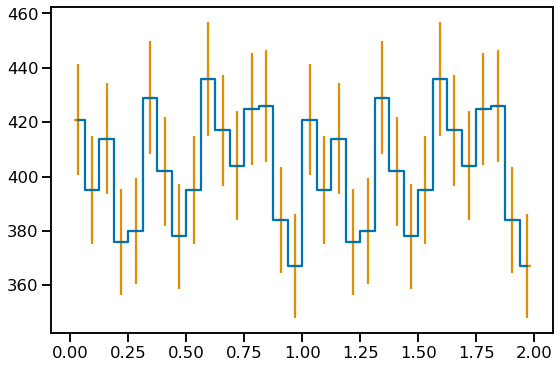

In [8]:
keV_min = 6
keV_max = 30
PI_min = int(eV_to_PI(keV_min * 1000))
PI_max = int(eV_to_PI(keV_max * 1000))

events = extract_events(products_dir + 'nu' + OBSID + 'A01_cl_barycorr.evt', \
            products_dir + 'nu' + OBSID + 'B01_cl_barycorr.evt')

t_0_A = events[0].time
gti_0_A = events[0].gti

t_0_B = events[1].time
gti_0_B = events[1].gti

tstart = gti_0_A[0][0]
pdot = 1.991555595754986e-09
nu = 28.0078125

events[0].time = t_0_A + 0.5*np.square(t_0_A-tstart)*pdot
events[0].gti = gti_0_A + 0.5*np.square(gti_0_A-tstart)*pdot

events[1].time = t_0_B + 0.5*np.square(t_0_B-tstart)*pdot
events[1].gti = gti_0_B + 0.5*np.square(gti_0_B-tstart)*pdot

A_mask = np.sqrt(np.square(events[0].x - centroid_A[0]) + np.square(events[0].y - centroid_A[1])) <= extraction_radius
B_mask = np.sqrt(np.square(events[1].x - centroid_B[0]) + np.square(events[1].y - centroid_B[1])) <= extraction_radius

temp_time = np.concatenate([events[0].time[A_mask], events[1].time[B_mask]])
sorted_arg = np.argsort(temp_time)
temp_time = temp_time[sorted_arg]
temp_pi = np.concatenate([events[0].pi[A_mask], events[1].pi[B_mask]])[sorted_arg]

joined_ev = EventList_ext(time=temp_time, gti=sting_gti.cross_two_gtis(events[0].gti, events[1].gti) , pi=temp_pi)

phase_bins, profile, profile_err, z_stat = joined_ev.fold_events(nu, nbin = 16, ref_time = joined_ev.time[0], region_filter=False, pi_min=PI_min, pi_max=PI_max)

plt.figure(figsize= (9,6))
plt.step(np.concatenate([phase_bins, 1.0 + phase_bins]), np.concatenate([profile, profile]), where='mid')
plt.errorbar(np.concatenate([phase_bins, 1.0 + phase_bins]), np.concatenate([profile, profile]), xerr=1/64, yerr=np.concatenate([profile_err, profile_err]), ls='')

PF = (np.max(profile)-np.min(profile))/(np.max(profile) + np.min(profile))

max_err = profile_err[np.argmax(profile)]
min_err = profile_err[np.argmin(profile)]
PF_err = np.sqrt(np.square((1-PF)*max_err) + np.square((1+PF)*min_err))/(np.max(profile) + np.min(profile))

print(PF)
print(PF_err)



## CPDS and PASTA analysis on epochs

In [ ]:
# bin_time = 1/64
# split_time = 128
# keV_min = 3
# keV_max = 30
# PI_min = int(eV_to_PI(keV_min * 1000))
# PI_max = int(eV_to_PI(keV_max * 1000))

for i in range(6):
    
    events = extract_events(products_dir + 'nu' + OBSID + 'A01_cl_barycorr_epoch'+(str(i+1))+'.evt', \
            products_dir + 'nu' + OBSID + 'B01_cl_barycorr_epoch'+(str(i+1))+'.evt')

#     ### Create CPDS
#     curve_A = events[0].to_lc(dt = bin_time, pi_low=PI_min, pi_high=PI_max, centroid = centroid_A, radius = extraction_radius)
#     curve_B = events[1].to_lc(dt = bin_time, pi_low=PI_min, pi_high=PI_max, centroid = centroid_B, radius = extraction_radius)

#     averaged_cross = crossspec.AveragedCrossspectrum(curve_A, curve_B, segment_size=split_time, norm = 'frac')

#     ### Plot CPDS
#     f_res = 0.01
#     averaged_cross_log = averaged_cross.rebin_log(f=f_res)
#     averaged_cross_log_err = averaged_cross.df*np.power(1.+f_res, range(len(averaged_cross_log.freq)))/2.

#     plt.figure(figsize=(9,6))
#     plt.errorbar(averaged_cross_log.freq, averaged_cross_log.power*averaged_cross_log.freq, xerr=averaged_cross_log_err, yerr=averaged_cross_log.power_err*averaged_cross_log.freq, fmt='none', color='black', lw=0.5)
#     plt.step(np.concatenate([averaged_cross_log.freq-averaged_cross_log_err, [averaged_cross_log.freq[-1]+averaged_cross_log_err[-1]]]), \
#              np.concatenate([averaged_cross_log.power*averaged_cross_log.freq, [(averaged_cross_log.power*averaged_cross_log.freq)[-1]]]), where='post', color='black', lw=0.5)
#     plt.xscale('log')
#     plt.ylim(bottom=1e-3)
#     plt.yscale('log')
#     plt.xlabel('Frequency (Hz)')
#     plt.ylabel(r'$\mathrm{\nu P_{\nu}\ (rms/mean)^{2}}$')
#     plt.tight_layout()
#     # plt.show()
#     plt.savefig(plot_dir + 'CPDS_nuPnu_' + str(int(split_time)) + 's_' + str(keV_min)+'_'+str(keV_max) + 'keV_epoch' + str(i+1)+'.pdf')
#     plt.close()

#     plt.figure(figsize=(9,6))
#     plt.errorbar(averaged_cross_log.freq, averaged_cross_log.power, xerr=averaged_cross_log_err, yerr=averaged_cross_log.power_err, fmt='none', color='black', lw=0.5)
#     plt.step(np.concatenate([averaged_cross_log.freq-averaged_cross_log_err, [averaged_cross_log.freq[-1]+averaged_cross_log_err[-1]]]), \
#              np.concatenate([averaged_cross_log.power, [averaged_cross_log.power[-1]]]), where='post', color='black', lw=0.5)
#     plt.xscale('log')
#     plt.ylim(bottom=1e-3)
#     plt.yscale('log')
#     plt.xlabel('Frequency (Hz)')
#     plt.ylabel(r'$\mathrm{Power\ (rms/mean)^{2}/Hz}$')
#     plt.tight_layout()
#     # plt.show()
#     plt.savefig(plot_dir + 'CPDS_Pnu_' + str(int(split_time)) + 's_' + str(keV_min)+'_'+str(keV_max) + 'keV_epoch' + str(i+1)+'.pdf')
#     plt.close()
    
    t_0_A = events[0].time
    gti_0_A = events[0].gti

    t_0_B = events[1].time
    gti_0_B = events[1].gti

    tstart = gti_0_A[0][0]

    for pdot in pdot_grid:
        print(pdot)
        events[0].time = t_0_A + 0.5*np.square(t_0_A-tstart)*pdot
        events[0].gti = gti_0_A + 0.5*np.square(gti_0_A-tstart)*pdot

        events[1].time = t_0_B + 0.5*np.square(t_0_B-tstart)*pdot
        events[1].gti = gti_0_B + 0.5*np.square(gti_0_B-tstart)*pdot

        curve_A = events[0].to_lc(dt = bin_time, pi_low=PI_min, pi_high=PI_max, centroid = centroid_A, radius = extraction_radius)
        curve_B = events[1].to_lc(dt = bin_time, pi_low=PI_min, pi_high=PI_max, centroid = centroid_B, radius = extraction_radius)

        averaged_cross = crossspec.AveragedCrossspectrum(curve_A, curve_B, segment_size=split_time, norm = 'leahy', silent=True)

        signal_mask = stats.pds_probability(averaged_cross.power, ntrial=len(averaged_cross.freq), n_summed_spectra=averaged_cross.m, n_rebin=1) < 0.05

        if np.sum(signal_mask):
            print('possible signal at nu=' + str(averaged_cross.freq[signal_mask]) + ', pdot/p=' + str(pdot))
            with open(root_dir + 'candidate_signals_epoch' + str(i+1) + '_' + str(keV_min)+'_'+str(keV_max) + 'keV.txt','a') as file:
                file.write('possible signal at nu=' + str(averaged_cross.freq[signal_mask]) + ', pdot/p=' + str(pdot) + '\n')




# NuSTAR 30002038002

## Setup

In [2]:
OBSID = '30002038002'

if platform=='linux' or platform=='linux2':
    print('Working on SRL server')
    root_dir = '/disk/lif2/spike/Circinus_ULX5/'
elif platform=='darwin':
    print('Working on Macbook')
    root_dir = '/Volumes/Samsung_1TB/AstroData/Circinus_ULX5/nustar/nustar_'+OBSID+'/'



Working on Macbook


80601502001
[0.24999911]
[0.24999939]


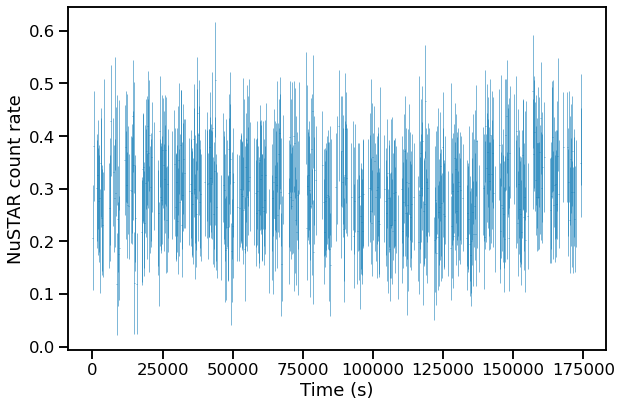

In [3]:
plt.ion()
buff = False
lc_buff_size = 0
bkg_bin = 16
print(OBSID)

### Setup
products_dir = root_dir + OBSID + '_products/'
plot_dir = root_dir + 'figures/'
plt.ion()

# events = extract_events(products_dir + 'nu' + OBSID + 'A01_cl_barycorr.evt', \
#             products_dir + 'nu' + OBSID + 'B01_cl_barycorr.evt')

# print(events[0].time)
# print(events[0].gti[0][0])
# print(events[1].gti[0][0])

# curve_A = bkg_subtract(nuproducts_to_stingray_lc(products_dir + 'nu' + OBSID + 'A01_sr.lc', buff = buff, buffersize = lc_buff_size), \
#                        nuproducts_to_stingray_lc(products_dir + 'nu' + OBSID + 'A01_bk.lc', buff = buff, buffersize = lc_buff_size), bkg_bin=bkg_bin)
# curve_B = bkg_subtract(nuproducts_to_stingray_lc(products_dir + 'nu' + OBSID + 'B01_sr.lc', buff = buff, buffersize = lc_buff_size),\
#                        nuproducts_to_stingray_lc(products_dir + 'nu' + OBSID + 'B01_bk.lc', buff = buff, buffersize = lc_buff_size), bkg_bin=bkg_bin)

curve_A = nuproducts_to_stingray_lc(products_dir + 'nu' + OBSID + 'A01_sr.lc', buff = buff, buffersize = lc_buff_size, rebin=False)
bkg_curve_A = nuproducts_to_stingray_lc(products_dir + 'nu' + OBSID + 'A01_bk.lc', buff = buff, buffersize = lc_buff_size, rebin=False)

area_ratio_A = curve_A.calc_area()/bkg_curve_A.calc_area()
print(area_ratio_A)

curve_B = nuproducts_to_stingray_lc(products_dir + 'nu' + OBSID + 'B01_sr.lc', buff = buff, buffersize = lc_buff_size, rebin=False)
bkg_curve_B = nuproducts_to_stingray_lc(products_dir + 'nu' + OBSID + 'B01_bk.lc', buff = buff, buffersize = lc_buff_size, rebin=False)

area_ratio_B = curve_B.calc_area()/bkg_curve_B.calc_area()
print(area_ratio_B)

src_curve = sum_lc(curve_A, curve_B)
bkg_curve = sum_lc(bkg_curve_A, bkg_curve_B)

# curve_10s = curve_total.rebin(dt_new=10)

centroid_A = curve_A.centroid
centroid_B = curve_B.centroid
extraction_radius = curve_A.radius
bkg_centroid_A = bkg_curve_A.centroid
bkg_centroid_B = bkg_curve_B.centroid
bkg_radius = bkg_curve_A.radius

#     print(centroid_A)
#     print(centroid_B)
#     print(extraction_radius)

rebin_dt = 200
rebinned_time = np.array([np.mean(x) for x in np.array_split(src_curve.time, int(len(src_curve.time)*src_curve.dt/rebin_dt))])
rebinned_countrate = np.array([np.mean(x) for x in np.array_split(src_curve.countrate, int(len(src_curve.countrate)*src_curve.dt/rebin_dt))])
rebinned_err = np.array([np.sqrt(np.sum(np.square(x)))/len(x) for x in np.array_split(src_curve.countrate_err, int(len(src_curve.countrate_err)*src_curve.dt/rebin_dt))])
## Plot the lightcurve
plt.figure(figsize = (9,6))
plt.errorbar(rebinned_time-src_curve.tstart, rebinned_countrate-(area_ratio_A*np.mean(bkg_curve.countrate)), xerr=rebin_dt/2, yerr=rebinned_err, fmt='none', lw = 0.5)
plt.xlabel('Time (s)')
plt.ylabel('NuSTAR count rate')
plt.tight_layout()
plt.savefig(plot_dir + 'bkg_sub_lightcurve_' + str(rebin_dt) + 's.pdf')
# plt.close()



## PDS and PASTA analysis

In [ ]:
bin_time = 1/64
split_time = 128
keV_min = 3
keV_max = 30
PI_min = int(eV_to_PI(keV_min * 1000))
PI_max = int(eV_to_PI(keV_max * 1000))


### Create PDS

events = extract_events(products_dir + 'nu' + OBSID + 'A01_cl_barycorr.evt', \
            products_dir + 'nu' + OBSID + 'B01_cl_barycorr.evt')


curve_A = events[0].to_lc(dt = bin_time, pi_low=PI_min, pi_high=PI_max, centroid = centroid_A, radius = extraction_radius)
curve_B = events[1].to_lc(dt = bin_time, pi_low=PI_min, pi_high=PI_max, centroid = centroid_B, radius = extraction_radius)

bkg_curve_A = events[0].to_lc(dt = bin_time, pi_low=PI_min, pi_high=PI_max, centroid = bkg_centroid_A, radius = bkg_radius)
bkg_curve_B = events[0].to_lc(dt = bin_time, pi_low=PI_min, pi_high=PI_max, centroid = bkg_centroid_B, radius = bkg_radius)

curve_AandB = sum_lc(curve_A, curve_B)
bkg_curve = sum_lc(bkg_curve_A, bkg_curve_B)

area_ratio = curve_A.calc_area()/bkg_curve_A.calc_area()

averaged_PDS = powspec.AveragedPowerspectrum(curve_AandB, segment_size=split_time, norm = 'frac')
averaged_PDS.power = averaged_PDS.power * np.square((1/(1-0.0025*(curve_AandB.meanrate/2))) * (curve_AandB.meanrate/(curve_AandB.meanrate-(bkg_curve.meanrate*area_ratio))))
averaged_PDS.power_err = averaged_PDS.power_err * np.square((1/(1-0.0025*(curve_AandB.meanrate/2))) * (curve_AandB.meanrate/(curve_AandB.meanrate-(bkg_curve.meanrate*area_ratio))))



# ### Plot PDS
f_res = 0.01
averaged_PDS_log = averaged_PDS.rebin_log(f=f_res)
averaged_PDS_log_err = averaged_PDS.df*np.power(1.+f_res, range(len(averaged_PDS_log.freq)))/2.

plt.figure(figsize=(9,6))
plt.errorbar(averaged_PDS_log.freq, averaged_PDS_log.power*averaged_PDS_log.freq, xerr=averaged_PDS_log_err, yerr=averaged_PDS_log.power_err*averaged_PDS_log.freq, fmt='none', color='black', lw=0.5)
plt.step(np.concatenate([averaged_PDS_log.freq-averaged_PDS_log_err, [averaged_PDS_log.freq[-1]+averaged_PDS_log_err[-1]]]), \
         np.concatenate([averaged_PDS_log.power*averaged_PDS_log.freq, [(averaged_PDS_log.power*averaged_PDS_log.freq)[-1]]]), where='post', color='black', lw=0.5)
plt.xscale('log')
# plt.ylim(bottom=1e-3)
plt.yscale('log')
plt.xlabel('Frequency (Hz)')
plt.ylabel(r'$\mathrm{\nu P_{\nu}\ (rms/mean)^{2}}$')
plt.tight_layout()
# plt.show()
plt.savefig(plot_dir + 'PDS_nuPnu_' + str(int(split_time)) + 's_' + str(keV_min)+'_'+str(keV_max) + 'keV.pdf')
plt.close()

plt.figure(figsize=(9,6))
plt.errorbar(averaged_PDS_log.freq, averaged_PDS_log.power, xerr=averaged_PDS_log_err, yerr=averaged_PDS_log.power_err, fmt='none', color='black', lw=0.5)
plt.step(np.concatenate([averaged_PDS_log.freq-averaged_PDS_log_err, [averaged_PDS_log.freq[-1]+averaged_PDS_log_err[-1]]]), \
         np.concatenate([averaged_PDS_log.power, [averaged_PDS_log.power[-1]]]), where='post', color='black', lw=0.5)
plt.xscale('log')
# plt.ylim(bottom=1e-3)
plt.yscale('log')
plt.xlabel('Frequency (Hz)')
plt.ylabel(r'$\mathrm{Power\ (rms/mean)^{2}/Hz}$')
plt.tight_layout()
# plt.show()
plt.savefig(plot_dir + 'PDS_Pnu_' + str(int(split_time)) + 's_' + str(keV_min)+'_'+str(keV_max) + 'keV.pdf')
plt.close()

events = extract_events(products_dir + 'nu' + OBSID + 'A01_cl_barycorr.evt', \
            products_dir + 'nu' + OBSID + 'B01_cl_barycorr.evt')

t_0_A = events[0].time
gti_0_A = events[0].gti

t_0_B = events[1].time
gti_0_B = events[1].gti

tstart = gti_0_A[0][0]

for pdot in tqdm(pdot_grid):
#     print(pdot)
    events[0].time = t_0_A + 0.5*np.square(t_0_A-tstart)*pdot
    events[0].gti = gti_0_A + 0.5*np.square(gti_0_A-tstart)*pdot

    events[1].time = t_0_B + 0.5*np.square(t_0_B-tstart)*pdot
    events[1].gti = gti_0_B + 0.5*np.square(gti_0_B-tstart)*pdot

    curve_A = events[0].to_lc(dt = bin_time, pi_low=PI_min, pi_high=PI_max, centroid = centroid_A, radius = extraction_radius)
    curve_B = events[1].to_lc(dt = bin_time, pi_low=PI_min, pi_high=PI_max, centroid = centroid_B, radius = extraction_radius)
    
    curve_AandB = sum_lc(curve_A, curve_B)

    averaged_PDS = powspec.AveragedPowerspectrum(curve_AandB, segment_size=split_time, norm = 'leahy', silent=True)
    
    signal_prob = stats.pds_probability(averaged_PDS.power, ntrial=len(averaged_PDS.freq), n_summed_spectra=averaged_PDS.m, n_rebin=1)
    signal_mask = signal_prob < 0.05

    if np.sum(signal_mask):
#         print('possible signal at nu=' + str(averaged_PDS.freq[signal_mask]) + ', pdot/p=' + str(pdot))
        with open(root_dir + 'candidate_signals_' + str(keV_min)+'_'+str(keV_max) + 'keV.txt','a') as file:
            file.write('possible signal at nu=' + str(averaged_PDS.freq[signal_mask]) + ', pdot/p=' + str(pdot) + ', prob=' + str(signal_prob[signal_mask]) + '\n')
        
        plt.figure(figsize=(9,6))
        plt.errorbar(averaged_PDS.freq, averaged_PDS.power, xerr=averaged_PDS.df/2, yerr=averaged_PDS.power_err, fmt='none', color='black', lw=0.5)
        plt.step(np.concatenate([averaged_PDS.freq-averaged_PDS.power_err, [averaged_PDS.freq[-1]+averaged_PDS.df/2]]), \
                 np.concatenate([averaged_PDS.power, [averaged_PDS.power[-1]]]), where='post', color='black', lw=0.5)
        plt.xscale('log')
        plt.yscale('log')
        plt.xlabel('Frequency (Hz)')
        plt.ylabel('Leahy Power')
        plt.tight_layout()
        # plt.show()
        plt.savefig(plot_dir + 'PDS_Pnu_' + str(int(split_time)) + 's_' + str(keV_min)+'_'+str(keV_max) + 'keV_pdotp_' + str(pdot)+ '.pdf')
        plt.close()

    
### Fit one zero-centered Lorentzian
# popt, pcov, chisq0, chisq = model_continuum_noise_zero_center(averaged_cross, plot=True, plot_dir=plot_dir, f_res=f_res)

# del_chisq = chisq - chisq0
# print(del_chisq/chisq0)

834it [00:01, 692.53it/s]
  0%|          | 0/2000 [00:00<?, ?it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/powerspectrum.py:434: UserWarning: No counts in interval 344189760.7271835--344189888.7115585s
  warnings.warn(
  2%|▏         | 36/2000 [03:37<3:14:15,  5.93s/it]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/powerspectrum.py:434: UserWarning: No counts in interval 344189760.7428085--344189888.7271835s
  warnings.warn(
  4%|▍         | 87/2000 [08:53<3:13:34,  6.07s/it]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/powerspectrum.py:434: UserWarning: No counts in interval 344189760.7584335--344189888.7428085s
  warnings.warn(
  6%|▌         | 116/2000 [11:48<3:07:29,  5.97s/it]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/powerspectrum.py:434: UserWarning: No counts in interval 344189760.7740585--344189888.7584335s
  warnings.warn(
  7%|▋         | 135/2000 [13:42<3:02:56,  5.89s/it]/Users/sean/opt/anaconda3/li

# NuSTAR 30002038004

## Setup

In [5]:
OBSID = '30002038004'

if platform=='linux' or platform=='linux2':
    print('Working on SRL server')
    root_dir = '/disk/lif2/spike/Circinus_ULX5/'
elif platform=='darwin':
    print('Working on Macbook')
    root_dir = '/Volumes/Samsung_1TB/AstroData/Circinus_ULX5/nustar/nustar_'+OBSID+'/'



Working on Macbook


In [7]:
plt.ion()
buff = False
lc_buff_size = 60
bkg_bin = 32
print(OBSID)

### Setup
products_dir = root_dir + OBSID + '_products/'
plot_dir = root_dir + 'figures/'
plt.ion()

events = extract_events(products_dir + 'nu' + OBSID + 'A01_cl_barycorr.evt', \
            products_dir + 'nu' + OBSID + 'B01_cl_barycorr.evt')

print(events[0].time)
print(events[0].gti[0][0])
print(events[1].gti[0][0])

curve_A = bkg_subtract(nuproducts_to_stingray_lc(products_dir + 'nu' + OBSID + 'A01_sr.lc', buff = buff, buffersize = lc_buff_size), \
                       nuproducts_to_stingray_lc(products_dir + 'nu' + OBSID + 'A01_bk.lc', buff = buff, buffersize = lc_buff_size), bkg_bin=bkg_bin)
curve_B = bkg_subtract(nuproducts_to_stingray_lc(products_dir + 'nu' + OBSID + 'B01_sr.lc', buff = buff, buffersize = lc_buff_size),\
                       nuproducts_to_stingray_lc(products_dir + 'nu' + OBSID + 'B01_bk.lc', buff = buff, buffersize = lc_buff_size), bkg_bin=bkg_bin)
curve_total = sum_lc(curve_A, curve_B)
# curve_10s = curve_total.rebin(dt_new=10)

centroid_A = curve_A.centroid
centroid_B = curve_B.centroid
extraction_radius = curve_A.radius
#     print(centroid_A)
#     print(centroid_B)
#     print(extraction_radius)

t_start = np.min(curve_total.time)

## Plot the lightcurve
plt.figure(figsize = (9,6))
plt.errorbar(curve_total.time-t_start, curve_total.countrate, xerr=curve_total.dt/2., yerr=curve_total.countrate_err, fmt='none', lw = 0.5)
plt.xlabel('Time (s)')
plt.ylabel('NuSTAR count rate')
plt.tight_layout()
plt.savefig(plot_dir + 'bkg_sub_lightcurve.pdf')
plt.close()



30002038004
[97556223.84737316 97556224.02964596 97556224.30563976 ...
 97629581.35913658 97629581.91177991 97629593.49381506]
97556223.43064001
97556223.43064001


In [8]:
bin_time = 1/64
split_time = 128
keV_min = 3
keV_max = 30
PI_min = int(eV_to_PI(keV_min * 1000))
PI_max = int(eV_to_PI(keV_max * 1000))


### Create CPDS
curve_A = events[0].to_lc(dt = bin_time, pi_low=PI_min, pi_high=PI_max, centroid = centroid_A, radius = extraction_radius)
curve_B = events[1].to_lc(dt = bin_time, pi_low=PI_min, pi_high=PI_max, centroid = centroid_B, radius = extraction_radius)

averaged_cross = crossspec.AveragedCrossspectrum(curve_A, curve_B, segment_size=split_time, norm = 'frac')

### Plot CPDS
f_res = 0.01
averaged_cross_log = averaged_cross.rebin_log(f=f_res)
averaged_cross_log_err = averaged_cross.df*np.power(1.+f_res, range(len(averaged_cross_log.freq)))/2.

plt.figure(figsize=(9,6))
plt.errorbar(averaged_cross_log.freq, averaged_cross_log.power*averaged_cross_log.freq, xerr=averaged_cross_log_err, yerr=averaged_cross_log.power_err*averaged_cross_log.freq, fmt='none', color='black', lw=0.5)
plt.step(np.concatenate([averaged_cross_log.freq-averaged_cross_log_err, [averaged_cross_log.freq[-1]+averaged_cross_log_err[-1]]]), \
         np.concatenate([averaged_cross_log.power*averaged_cross_log.freq, [(averaged_cross_log.power*averaged_cross_log.freq)[-1]]]), where='post', color='black', lw=0.5)
plt.xscale('log')
plt.ylim(bottom=1e-3)
plt.yscale('log')
plt.xlabel('Frequency (Hz)')
plt.ylabel(r'$\mathrm{\nu P_{\nu}\ (rms/mean)^{2}}$')
plt.tight_layout()
# plt.show()
plt.savefig(plot_dir + 'CPDS_nuPnu_' + str(int(split_time)) + 's_' + str(keV_min)+'_'+str(keV_max) + 'keV.pdf')
plt.close()

plt.figure(figsize=(9,6))
plt.errorbar(averaged_cross_log.freq, averaged_cross_log.power, xerr=averaged_cross_log_err, yerr=averaged_cross_log.power_err, fmt='none', color='black', lw=0.5)
plt.step(np.concatenate([averaged_cross_log.freq-averaged_cross_log_err, [averaged_cross_log.freq[-1]+averaged_cross_log_err[-1]]]), \
         np.concatenate([averaged_cross_log.power, [averaged_cross_log.power[-1]]]), where='post', color='black', lw=0.5)
plt.xscale('log')
plt.ylim(bottom=1e-3)
plt.yscale('log')
plt.xlabel('Frequency (Hz)')
plt.ylabel(r'$\mathrm{Power\ (rms/mean)^{2}/Hz}$')
plt.tight_layout()
# plt.show()
plt.savefig(plot_dir + 'CPDS_Pnu_' + str(int(split_time)) + 's_' + str(keV_min)+'_'+str(keV_max) + 'keV.pdf')
plt.close()

n_pdot = 1000
pdot_start = -1e-6
pdot_stop = 1e-6
pdot_grid = np.linspace(pdot_start, pdot_stop, num=n_pdot)


events = extract_events(products_dir + 'nu' + OBSID + 'A01_cl_barycorr.evt', \
            products_dir + 'nu' + OBSID + 'B01_cl_barycorr.evt')

t_0_A = events[0].time
gti_0_A = events[0].gti

t_0_B = events[1].time
gti_0_B = events[1].gti

tstart = gti_0_A[0][0]

for pdot in pdot_grid:
    print(pdot)
    events[0].time = t_0_A + 0.5*np.square(t_0_A-tstart)*pdot
    events[0].gti = gti_0_A + 0.5*np.square(gti_0_A-tstart)*pdot

    events[1].time = t_0_B + 0.5*np.square(t_0_B-tstart)*pdot
    events[1].gti = gti_0_B + 0.5*np.square(gti_0_B-tstart)*pdot

    curve_A = events[0].to_lc(dt = bin_time, pi_low=PI_min, pi_high=PI_max, centroid = centroid_A, radius = extraction_radius)
    curve_B = events[1].to_lc(dt = bin_time, pi_low=PI_min, pi_high=PI_max, centroid = centroid_B, radius = extraction_radius)

    averaged_cross = crossspec.AveragedCrossspectrum(curve_A, curve_B, segment_size=split_time, norm = 'leahy', silent=True)

    signal_mask = stats.pds_probability(averaged_cross.power, ntrial=len(averaged_cross.freq), n_summed_spectra=averaged_cross.m, n_rebin=1) < 0.05

    if np.sum(signal_mask):
        print('possible signal at nu=' + str(averaged_cross.freq[signal_mask]) + ', pdot/p=' + str(pdot))
        with open(root_dir + 'candidate_signals.txt','a') as file:
            file.write('possible signal at nu=' + str(averaged_cross.freq[signal_mask]) + ', pdot/p=' + str(pdot) + '\n')
    
### Fit one zero-centered Lorentzian
# popt, pcov, chisq0, chisq = model_continuum_noise_zero_center(averaged_cross, plot=True, plot_dir=plot_dir, f_res=f_res)

# del_chisq = chisq - chisq0
# print(del_chisq/chisq0)

/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/utils.py:119: UserWarning: SIMON says: Errorbars on cross spectra are not thoroughly tested. Please report any inconsistencies.
  warnings.warn("SIMON says: {0}".format(message), **kwargs)
327it [00:01, 174.01it/s]
327it [00:01, 201.53it/s]
327it [00:01, 213.69it/s]


-1e-06


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/utils.py:119: UserWarning: SIMON says: Errorbars on cross spectra are not thoroughly tested. Please report any inconsistencies.
  warnings.warn("SIMON says: {0}".format(message), **kwargs)
315it [00:01, 184.69it/s]
315it [00:01, 211.75it/s]


-9.97997997997998e-07


315it [00:01, 230.51it/s]
315it [00:01, 224.75it/s]


-9.95995995995996e-07


315it [00:01, 217.82it/s]
315it [00:01, 220.50it/s]


-9.939939939939939e-07


315it [00:01, 234.21it/s]
315it [00:01, 228.57it/s]


-9.919919919919919e-07


315it [00:01, 228.99it/s]
315it [00:01, 222.69it/s]


-9.8998998998999e-07


315it [00:01, 232.92it/s]
315it [00:01, 223.84it/s]


-9.87987987987988e-07


315it [00:01, 217.71it/s]
315it [00:01, 217.58it/s]


-9.85985985985986e-07


315it [00:01, 231.07it/s]
315it [00:01, 228.51it/s]


-9.83983983983984e-07


315it [00:01, 230.23it/s]
315it [00:01, 227.13it/s]


-9.819819819819819e-07


315it [00:01, 232.10it/s]
315it [00:01, 228.42it/s]


-9.7997997997998e-07


315it [00:01, 226.78it/s]
315it [00:01, 221.51it/s]


-9.77977977977978e-07


315it [00:01, 233.46it/s]
315it [00:01, 228.01it/s]


-9.75975975975976e-07


315it [00:01, 225.86it/s]
315it [00:01, 224.42it/s]


-9.73973973973974e-07


315it [00:01, 231.40it/s]
315it [00:01, 228.66it/s]


-9.719719719719718e-07


315it [00:01, 227.26it/s]
315it [00:01, 223.53it/s]


-9.699699699699699e-07


315it [00:01, 230.33it/s]
315it [00:01, 228.85it/s]


-9.67967967967968e-07


315it [00:01, 224.11it/s]
315it [00:01, 222.96it/s]


-9.65965965965966e-07


315it [00:01, 237.78it/s]
315it [00:01, 233.02it/s]


-9.63963963963964e-07


315it [00:01, 209.56it/s]
315it [00:01, 216.38it/s]


-9.61961961961962e-07


315it [00:01, 230.62it/s]
315it [00:01, 208.82it/s]


-9.599599599599598e-07


315it [00:01, 218.88it/s]
315it [00:01, 211.13it/s]


-9.579579579579579e-07


315it [00:01, 229.30it/s]
315it [00:01, 225.11it/s]


-9.55955955955956e-07


315it [00:01, 224.02it/s]
315it [00:01, 219.96it/s]


-9.53953953953954e-07


315it [00:01, 230.16it/s]
315it [00:01, 228.66it/s]


-9.519519519519519e-07


315it [00:01, 211.06it/s]
315it [00:01, 213.33it/s]


-9.499499499499499e-07


315it [00:01, 227.09it/s]
315it [00:01, 230.52it/s]


-9.47947947947948e-07


315it [00:01, 224.42it/s]
315it [00:01, 217.57it/s]


-9.459459459459459e-07


315it [00:01, 212.73it/s]
315it [00:01, 227.08it/s]


-9.439439439439439e-07


315it [00:01, 223.19it/s]
315it [00:01, 221.09it/s]


-9.419419419419419e-07


315it [00:01, 225.00it/s]
315it [00:01, 230.53it/s]


-9.399399399399399e-07


315it [00:01, 231.98it/s]
315it [00:01, 226.35it/s]


-9.379379379379379e-07


315it [00:01, 218.72it/s]
315it [00:01, 216.86it/s]


-9.359359359359359e-07


315it [00:01, 215.91it/s]
315it [00:01, 214.33it/s]


-9.339339339339339e-07


315it [00:01, 235.01it/s]
315it [00:01, 222.17it/s]


-9.319319319319319e-07


315it [00:01, 236.89it/s]
315it [00:01, 231.38it/s]


-9.299299299299299e-07


315it [00:01, 237.87it/s]
315it [00:01, 233.19it/s]


-9.279279279279279e-07


315it [00:01, 240.62it/s]
315it [00:01, 233.52it/s]


-9.259259259259258e-07


315it [00:01, 236.07it/s]
315it [00:01, 234.77it/s]


-9.239239239239239e-07


315it [00:01, 238.62it/s]
315it [00:01, 232.50it/s]


-9.219219219219219e-07


315it [00:01, 237.98it/s]
315it [00:01, 231.93it/s]


-9.199199199199199e-07


315it [00:01, 239.12it/s]
315it [00:01, 230.66it/s]


-9.179179179179179e-07


315it [00:01, 236.87it/s]
315it [00:01, 233.21it/s]


-9.159159159159159e-07


315it [00:01, 239.32it/s]
315it [00:01, 231.76it/s]


-9.139139139139138e-07


315it [00:01, 236.16it/s]
315it [00:01, 230.19it/s]


-9.119119119119119e-07


315it [00:01, 237.67it/s]
315it [00:01, 228.85it/s]


-9.099099099099099e-07


315it [00:01, 238.22it/s]
315it [00:01, 236.99it/s]


-9.079079079079078e-07


315it [00:01, 238.53it/s]
315it [00:01, 236.29it/s]


-9.059059059059059e-07


315it [00:01, 239.24it/s]
315it [00:01, 233.85it/s]


-9.039039039039038e-07


315it [00:01, 241.94it/s]
315it [00:01, 233.79it/s]


-9.019019019019018e-07


315it [00:01, 238.83it/s]
315it [00:01, 237.67it/s]


-8.998998998998999e-07


316it [00:01, 240.56it/s]
316it [00:01, 224.73it/s]


-8.978978978978979e-07


316it [00:01, 237.58it/s]
316it [00:01, 234.02it/s]


-8.958958958958958e-07


316it [00:01, 238.28it/s]
316it [00:01, 231.46it/s]


-8.938938938938939e-07


316it [00:01, 237.79it/s]
316it [00:01, 230.05it/s]


-8.918918918918918e-07


316it [00:01, 236.69it/s]
316it [00:01, 231.78it/s]


-8.898898898898899e-07


316it [00:01, 238.46it/s]
316it [00:01, 233.77it/s]


-8.878878878878879e-07


316it [00:01, 240.04it/s]
316it [00:01, 231.09it/s]


-8.858858858858858e-07


316it [00:01, 234.64it/s]
316it [00:01, 233.94it/s]


-8.838838838838839e-07


316it [00:01, 234.85it/s]
316it [00:01, 231.81it/s]


-8.818818818818819e-07


316it [00:01, 239.11it/s]
316it [00:01, 233.55it/s]


-8.798798798798798e-07


316it [00:01, 238.32it/s]
316it [00:01, 221.31it/s]


-8.778778778778779e-07


316it [00:01, 236.61it/s]
316it [00:01, 234.30it/s]


-8.758758758758759e-07


316it [00:01, 238.82it/s]
316it [00:01, 230.43it/s]


-8.738738738738738e-07


316it [00:01, 238.36it/s]
316it [00:01, 232.82it/s]


-8.718718718718719e-07


316it [00:01, 236.60it/s]
316it [00:01, 231.07it/s]


-8.698698698698698e-07


316it [00:01, 238.20it/s]
316it [00:01, 235.20it/s]


-8.678678678678678e-07


316it [00:01, 237.47it/s]
316it [00:01, 227.02it/s]


-8.658658658658659e-07


316it [00:01, 237.32it/s]
316it [00:01, 233.90it/s]


-8.638638638638638e-07


316it [00:01, 233.44it/s]
316it [00:01, 227.86it/s]


-8.618618618618618e-07


316it [00:01, 238.95it/s]
316it [00:01, 235.49it/s]


-8.598598598598598e-07


316it [00:01, 227.49it/s]
316it [00:01, 228.92it/s]


-8.578578578578578e-07


316it [00:01, 237.08it/s]
316it [00:01, 234.56it/s]


-8.558558558558558e-07


316it [00:01, 231.78it/s]
316it [00:01, 227.59it/s]


-8.538538538538539e-07


316it [00:01, 235.61it/s]
316it [00:01, 232.72it/s]


-8.518518518518518e-07


316it [00:01, 237.25it/s]
316it [00:01, 230.73it/s]


-8.498498498498498e-07


316it [00:01, 237.81it/s]
316it [00:01, 235.36it/s]


-8.478478478478478e-07


316it [00:01, 235.10it/s]
316it [00:01, 230.25it/s]


-8.458458458458458e-07


316it [00:01, 237.56it/s]
316it [00:01, 231.48it/s]


-8.438438438438439e-07


316it [00:01, 212.65it/s]
316it [00:01, 222.66it/s]


-8.418418418418418e-07


316it [00:01, 215.27it/s]
316it [00:01, 230.16it/s]


-8.398398398398398e-07


316it [00:01, 236.13it/s]
316it [00:01, 229.64it/s]


-8.378378378378377e-07


316it [00:01, 233.76it/s]
316it [00:01, 234.07it/s]


-8.358358358358358e-07


316it [00:01, 237.71it/s]
316it [00:01, 233.61it/s]


-8.338338338338338e-07


316it [00:01, 236.01it/s]
316it [00:01, 235.62it/s]


-8.318318318318319e-07


316it [00:01, 236.19it/s]
316it [00:01, 236.11it/s]


-8.298298298298298e-07


316it [00:01, 235.27it/s]
316it [00:01, 234.33it/s]


-8.278278278278278e-07


316it [00:01, 236.51it/s]
316it [00:01, 236.48it/s]


-8.258258258258258e-07


316it [00:01, 235.86it/s]
316it [00:01, 236.63it/s]


-8.238238238238238e-07


316it [00:01, 237.78it/s]
316it [00:01, 234.85it/s]


-8.218218218218218e-07


316it [00:01, 236.12it/s]
316it [00:01, 231.88it/s]


-8.198198198198198e-07


316it [00:01, 237.77it/s]
316it [00:01, 236.50it/s]


-8.178178178178178e-07


316it [00:01, 235.20it/s]
316it [00:01, 235.02it/s]


-8.158158158158157e-07


316it [00:01, 230.63it/s]
316it [00:01, 229.76it/s]


-8.138138138138138e-07


316it [00:01, 241.07it/s]
316it [00:01, 239.29it/s]


-8.118118118118118e-07


316it [00:01, 241.05it/s]
316it [00:01, 239.02it/s]


-8.098098098098098e-07


316it [00:01, 241.31it/s]
316it [00:01, 174.12it/s]


-8.078078078078078e-07


316it [00:01, 229.50it/s]
316it [00:01, 222.46it/s]


-8.058058058058058e-07


316it [00:01, 235.02it/s]
316it [00:01, 232.74it/s]


-8.038038038038037e-07


317it [00:01, 235.69it/s]
317it [00:01, 236.03it/s]


-8.018018018018018e-07


317it [00:01, 228.77it/s]
317it [00:01, 233.13it/s]


-7.997997997997998e-07


317it [00:01, 236.31it/s]
317it [00:01, 237.40it/s]


-7.977977977977977e-07


317it [00:01, 231.81it/s]
317it [00:01, 232.22it/s]


-7.957957957957958e-07


317it [00:01, 232.43it/s]
317it [00:01, 229.70it/s]


-7.937937937937937e-07


317it [00:01, 224.24it/s]
317it [00:01, 234.33it/s]


-7.917917917917917e-07


317it [00:01, 234.79it/s]
317it [00:01, 233.20it/s]


-7.897897897897898e-07


317it [00:01, 235.53it/s]
317it [00:01, 231.84it/s]


-7.877877877877878e-07


317it [00:01, 237.31it/s]
317it [00:01, 240.16it/s]


-7.857857857857857e-07


317it [00:01, 241.04it/s]
317it [00:01, 237.08it/s]


-7.837837837837838e-07


318it [00:01, 241.01it/s]
318it [00:01, 239.04it/s]


-7.817817817817817e-07


318it [00:01, 236.46it/s]
318it [00:01, 234.23it/s]


-7.797797797797798e-07


318it [00:01, 235.00it/s]
318it [00:01, 235.11it/s]


-7.777777777777778e-07


318it [00:01, 235.46it/s]
318it [00:01, 233.71it/s]


-7.757757757757757e-07


318it [00:01, 237.05it/s]
318it [00:01, 230.31it/s]


-7.737737737737738e-07


318it [00:01, 236.47it/s]
318it [00:01, 234.36it/s]


-7.717717717717717e-07


318it [00:01, 238.31it/s]
318it [00:01, 234.66it/s]


-7.697697697697697e-07


318it [00:01, 235.82it/s]
318it [00:01, 233.05it/s]


-7.677677677677678e-07


318it [00:01, 237.55it/s]
318it [00:01, 235.82it/s]


-7.657657657657658e-07


318it [00:01, 235.67it/s]
318it [00:01, 233.85it/s]


-7.637637637637637e-07


318it [00:01, 236.38it/s]
318it [00:01, 232.88it/s]


-7.617617617617618e-07


318it [00:01, 235.46it/s]
318it [00:01, 230.92it/s]


-7.597597597597597e-07


318it [00:01, 236.53it/s]
318it [00:01, 231.60it/s]


-7.577577577577577e-07


318it [00:01, 234.54it/s]
318it [00:01, 234.23it/s]


-7.557557557557558e-07


318it [00:01, 235.69it/s]
318it [00:01, 236.19it/s]


-7.537537537537538e-07


318it [00:01, 234.48it/s]
318it [00:01, 234.19it/s]


-7.517517517517517e-07


318it [00:01, 237.09it/s]
318it [00:01, 236.01it/s]


-7.497497497497497e-07


318it [00:01, 236.98it/s]
318it [00:01, 233.08it/s]


-7.477477477477477e-07


318it [00:01, 237.96it/s]
318it [00:01, 235.95it/s]


-7.457457457457457e-07


318it [00:01, 237.42it/s]
318it [00:01, 234.15it/s]


-7.437437437437438e-07


318it [00:01, 236.27it/s]
318it [00:01, 228.47it/s]


-7.417417417417417e-07


318it [00:01, 235.15it/s]
318it [00:01, 232.10it/s]


-7.397397397397397e-07


318it [00:01, 235.68it/s]
318it [00:01, 232.71it/s]


-7.377377377377377e-07


318it [00:01, 235.02it/s]
318it [00:01, 234.93it/s]


-7.357357357357357e-07


318it [00:01, 236.18it/s]
318it [00:01, 234.94it/s]


-7.337337337337337e-07


318it [00:01, 236.58it/s]
318it [00:01, 233.35it/s]


-7.317317317317318e-07


318it [00:01, 237.38it/s]
318it [00:01, 235.13it/s]


-7.297297297297297e-07


318it [00:01, 235.62it/s]
318it [00:01, 225.35it/s]


-7.277277277277276e-07


319it [00:01, 237.06it/s]
319it [00:01, 233.85it/s]


-7.257257257257257e-07


319it [00:01, 238.75it/s]
319it [00:01, 234.62it/s]


-7.237237237237237e-07


319it [00:01, 238.51it/s]
319it [00:01, 235.15it/s]


-7.217217217217218e-07


319it [00:01, 236.68it/s]
319it [00:01, 238.01it/s]


-7.197197197197197e-07


319it [00:01, 237.68it/s]
319it [00:01, 233.74it/s]


-7.177177177177177e-07


319it [00:01, 235.65it/s]
319it [00:01, 236.25it/s]


-7.157157157157157e-07


319it [00:01, 236.99it/s]
319it [00:01, 235.69it/s]


-7.137137137137137e-07


319it [00:01, 233.84it/s]
319it [00:01, 234.87it/s]


-7.117117117117117e-07


319it [00:01, 236.42it/s]
319it [00:01, 232.92it/s]


-7.097097097097098e-07


319it [00:01, 236.42it/s]
319it [00:01, 235.35it/s]


-7.077077077077077e-07


319it [00:01, 235.78it/s]
319it [00:01, 233.63it/s]


-7.057057057057056e-07


319it [00:01, 236.44it/s]
319it [00:01, 233.85it/s]


-7.037037037037037e-07


319it [00:01, 235.75it/s]
319it [00:01, 236.63it/s]


-7.017017017017017e-07


319it [00:01, 236.29it/s]
319it [00:01, 235.82it/s]


-6.996996996996997e-07


319it [00:01, 233.95it/s]
319it [00:01, 236.84it/s]


-6.976976976976977e-07


319it [00:01, 237.88it/s]
319it [00:01, 236.12it/s]


-6.956956956956957e-07


319it [00:01, 236.35it/s]
319it [00:01, 236.44it/s]


-6.936936936936936e-07


319it [00:01, 235.80it/s]
319it [00:01, 206.06it/s]


-6.916916916916917e-07


319it [00:01, 233.52it/s]
319it [00:01, 235.71it/s]


-6.896896896896897e-07


319it [00:01, 234.78it/s]
319it [00:01, 235.12it/s]


-6.876876876876877e-07


319it [00:01, 237.77it/s]
319it [00:01, 236.32it/s]


-6.856856856856857e-07


319it [00:01, 236.31it/s]
319it [00:01, 236.83it/s]


-6.836836836836836e-07


319it [00:01, 236.31it/s]
319it [00:01, 236.33it/s]


-6.816816816816816e-07


319it [00:01, 236.03it/s]
319it [00:01, 236.84it/s]


-6.796796796796797e-07


319it [00:01, 235.24it/s]
319it [00:01, 237.41it/s]


-6.776776776776777e-07


320it [00:01, 240.30it/s]
320it [00:01, 240.61it/s]


-6.756756756756756e-07


320it [00:01, 240.46it/s]
320it [00:01, 233.38it/s]


-6.736736736736737e-07


320it [00:01, 233.37it/s]
320it [00:01, 235.18it/s]


-6.716716716716716e-07


320it [00:01, 237.65it/s]
320it [00:01, 238.38it/s]


-6.696696696696697e-07


320it [00:01, 240.33it/s]
320it [00:01, 239.36it/s]


-6.676676676676677e-07


320it [00:01, 234.67it/s]
320it [00:01, 236.82it/s]


-6.656656656656657e-07


320it [00:01, 233.07it/s]
320it [00:01, 220.73it/s]


-6.636636636636637e-07


320it [00:01, 232.50it/s]
320it [00:01, 235.62it/s]


-6.616616616616616e-07


320it [00:01, 228.71it/s]
320it [00:01, 233.72it/s]


-6.596596596596596e-07


320it [00:01, 234.97it/s]
320it [00:01, 236.87it/s]


-6.576576576576577e-07


320it [00:01, 235.46it/s]
320it [00:01, 235.58it/s]


-6.556556556556557e-07


320it [00:01, 236.44it/s]
320it [00:01, 236.52it/s]


-6.536536536536536e-07


320it [00:01, 235.82it/s]
320it [00:01, 232.52it/s]


-6.516516516516517e-07


320it [00:01, 236.56it/s]
320it [00:01, 235.96it/s]


-6.496496496496496e-07


320it [00:01, 235.77it/s]
320it [00:01, 235.46it/s]


-6.476476476476476e-07


320it [00:01, 236.14it/s]
320it [00:01, 235.15it/s]


-6.456456456456457e-07


320it [00:01, 234.77it/s]
320it [00:01, 234.89it/s]


-6.436436436436437e-07


320it [00:01, 234.05it/s]
320it [00:01, 235.64it/s]


-6.416416416416416e-07


320it [00:01, 234.58it/s]
320it [00:01, 205.80it/s]


-6.396396396396396e-07


320it [00:01, 236.68it/s]
320it [00:01, 235.35it/s]


-6.376376376376376e-07


320it [00:01, 235.79it/s]
320it [00:01, 234.98it/s]


-6.356356356356356e-07


320it [00:01, 236.00it/s]
320it [00:01, 234.93it/s]


-6.336336336336337e-07


320it [00:01, 234.84it/s]
320it [00:01, 235.33it/s]


-6.316316316316316e-07


320it [00:01, 236.79it/s]
320it [00:01, 235.01it/s]


-6.296296296296296e-07


320it [00:01, 236.80it/s]
320it [00:01, 235.49it/s]


-6.276276276276276e-07


320it [00:01, 229.75it/s]
320it [00:01, 234.60it/s]


-6.256256256256256e-07


320it [00:01, 235.50it/s]
320it [00:01, 235.04it/s]


-6.236236236236236e-07


320it [00:01, 234.61it/s]
320it [00:01, 234.37it/s]


-6.216216216216217e-07


320it [00:01, 235.57it/s]
320it [00:01, 234.22it/s]


-6.196196196196196e-07


320it [00:01, 236.82it/s]
320it [00:01, 235.04it/s]


-6.176176176176175e-07


320it [00:01, 235.05it/s]
320it [00:01, 220.71it/s]


-6.156156156156156e-07


320it [00:01, 172.79it/s]
320it [00:01, 226.10it/s]


-6.136136136136136e-07


320it [00:01, 232.31it/s]
320it [00:01, 234.63it/s]


-6.116116116116117e-07


320it [00:01, 233.63it/s]
320it [00:01, 234.47it/s]


-6.096096096096096e-07


320it [00:01, 233.86it/s]
320it [00:01, 235.92it/s]


-6.076076076076076e-07


320it [00:01, 236.19it/s]
320it [00:01, 233.93it/s]


-6.056056056056056e-07


320it [00:01, 233.80it/s]
320it [00:01, 223.80it/s]


-6.036036036036036e-07


320it [00:01, 234.02it/s]
320it [00:01, 225.66it/s]


-6.016016016016016e-07


320it [00:01, 234.29it/s]
320it [00:01, 231.65it/s]


-5.995995995995997e-07


320it [00:01, 235.17it/s]
320it [00:01, 234.24it/s]


-5.975975975975976e-07


320it [00:01, 235.52it/s]
320it [00:01, 235.55it/s]


-5.955955955955955e-07


320it [00:01, 220.21it/s]
320it [00:01, 233.59it/s]


-5.935935935935936e-07


320it [00:01, 232.54it/s]
320it [00:01, 234.69it/s]


-5.915915915915916e-07


320it [00:01, 239.37it/s]
320it [00:01, 239.50it/s]


-5.895895895895896e-07


320it [00:01, 202.80it/s]
320it [00:01, 234.83it/s]


-5.875875875875876e-07


320it [00:01, 228.99it/s]
320it [00:01, 231.71it/s]


-5.855855855855856e-07


320it [00:01, 233.91it/s]
320it [00:01, 232.96it/s]


-5.835835835835835e-07


320it [00:01, 235.43it/s]
320it [00:01, 235.62it/s]


-5.815815815815816e-07


320it [00:01, 233.66it/s]
320it [00:01, 234.68it/s]


-5.795795795795796e-07


320it [00:01, 238.89it/s]
320it [00:01, 234.06it/s]


-5.775775775775776e-07


320it [00:01, 235.62it/s]
320it [00:01, 234.18it/s]


-5.755755755755756e-07


320it [00:01, 236.08it/s]
320it [00:01, 235.59it/s]


-5.735735735735735e-07


320it [00:01, 236.43it/s]
320it [00:01, 235.05it/s]


-5.715715715715715e-07


320it [00:01, 233.56it/s]
320it [00:01, 234.93it/s]


-5.695695695695696e-07


320it [00:01, 234.70it/s]
320it [00:01, 235.02it/s]


-5.675675675675676e-07


320it [00:01, 228.02it/s]
320it [00:01, 235.03it/s]


-5.655655655655655e-07


320it [00:01, 233.80it/s]
320it [00:01, 234.26it/s]


-5.635635635635636e-07


320it [00:01, 236.04it/s]
320it [00:01, 233.73it/s]


-5.615615615615615e-07


320it [00:01, 235.25it/s]
320it [00:01, 235.39it/s]


-5.595595595595596e-07


320it [00:01, 234.98it/s]
320it [00:01, 234.76it/s]


-5.575575575575576e-07


320it [00:01, 234.24it/s]
320it [00:01, 234.66it/s]


-5.555555555555556e-07


320it [00:01, 237.91it/s]
320it [00:01, 235.83it/s]


-5.535535535535536e-07


320it [00:01, 232.73it/s]
320it [00:01, 240.12it/s]


-5.515515515515515e-07


320it [00:01, 241.65it/s]
320it [00:01, 240.32it/s]


-5.495495495495495e-07


320it [00:01, 235.87it/s]
320it [00:01, 226.43it/s]


-5.475475475475476e-07


320it [00:01, 228.85it/s]
320it [00:01, 234.97it/s]


-5.455455455455456e-07


320it [00:01, 233.64it/s]
320it [00:01, 233.41it/s]


-5.435435435435435e-07


320it [00:01, 234.50it/s]
320it [00:01, 234.29it/s]


-5.415415415415416e-07


320it [00:01, 233.95it/s]
320it [00:01, 234.44it/s]


-5.395395395395395e-07


321it [00:01, 235.02it/s]
321it [00:01, 231.72it/s]


-5.375375375375375e-07


321it [00:01, 204.97it/s]
321it [00:01, 236.50it/s]


-5.355355355355356e-07


321it [00:01, 236.24it/s]
321it [00:01, 235.05it/s]


-5.335335335335336e-07


321it [00:01, 237.98it/s]
321it [00:01, 233.94it/s]


-5.315315315315315e-07


321it [00:01, 235.22it/s]
321it [00:01, 235.67it/s]


-5.295295295295295e-07


321it [00:01, 236.33it/s]
321it [00:01, 235.13it/s]


-5.275275275275275e-07


321it [00:01, 236.91it/s]
321it [00:01, 233.49it/s]


-5.255255255255255e-07


321it [00:01, 233.07it/s]
321it [00:01, 234.42it/s]


-5.235235235235236e-07


321it [00:01, 235.08it/s]
321it [00:01, 235.17it/s]


-5.215215215215215e-07


321it [00:01, 234.73it/s]
321it [00:01, 234.33it/s]


-5.195195195195195e-07


321it [00:01, 231.79it/s]
321it [00:01, 235.96it/s]


-5.175175175175175e-07


321it [00:01, 229.38it/s]
321it [00:01, 234.68it/s]


-5.155155155155155e-07


321it [00:01, 235.77it/s]
321it [00:01, 235.80it/s]


-5.135135135135135e-07


321it [00:01, 236.33it/s]
321it [00:01, 235.09it/s]


-5.115115115115115e-07


321it [00:01, 235.66it/s]
321it [00:01, 234.03it/s]


-5.095095095095095e-07


321it [00:01, 234.66it/s]
321it [00:01, 233.51it/s]


-5.075075075075076e-07


321it [00:01, 235.27it/s]
321it [00:01, 234.06it/s]


-5.055055055055055e-07


321it [00:01, 234.05it/s]
321it [00:01, 233.09it/s]


-5.035035035035035e-07


321it [00:01, 239.81it/s]
321it [00:01, 235.64it/s]


-5.015015015015016e-07


321it [00:01, 240.27it/s]
321it [00:01, 239.43it/s]


-4.994994994994995e-07


321it [00:01, 240.40it/s]
321it [00:01, 239.42it/s]


-4.974974974974975e-07


321it [00:01, 240.85it/s]
321it [00:01, 239.60it/s]


-4.954954954954955e-07


321it [00:01, 241.12it/s]
321it [00:01, 239.93it/s]


-4.934934934934935e-07


321it [00:01, 240.56it/s]
321it [00:01, 236.95it/s]


-4.914914914914915e-07


321it [00:01, 241.73it/s]
321it [00:01, 241.21it/s]


-4.894894894894895e-07


321it [00:01, 234.50it/s]
321it [00:01, 233.10it/s]


-4.874874874874875e-07


321it [00:01, 235.34it/s]
321it [00:01, 233.01it/s]


-4.854854854854855e-07


321it [00:01, 234.97it/s]
321it [00:01, 234.63it/s]


-4.834834834834835e-07


321it [00:01, 234.02it/s]
321it [00:01, 234.39it/s]


-4.814814814814815e-07


321it [00:01, 233.60it/s]
321it [00:01, 230.10it/s]


-4.794794794794795e-07


321it [00:01, 234.86it/s]
321it [00:01, 234.05it/s]


-4.774774774774775e-07


321it [00:01, 233.93it/s]
321it [00:01, 234.21it/s]


-4.754754754754755e-07


321it [00:01, 232.70it/s]
321it [00:01, 232.72it/s]


-4.7347347347347343e-07


321it [00:01, 232.94it/s]
321it [00:01, 233.16it/s]


-4.7147147147147147e-07


321it [00:01, 232.72it/s]
321it [00:01, 230.50it/s]


-4.694694694694695e-07


321it [00:01, 232.44it/s]
321it [00:01, 234.61it/s]


-4.6746746746746744e-07


321it [00:01, 235.17it/s]
321it [00:01, 233.10it/s]


-4.654654654654655e-07


321it [00:01, 233.92it/s]
321it [00:01, 234.95it/s]


-4.634634634634635e-07


321it [00:01, 236.40it/s]
321it [00:01, 232.77it/s]


-4.6146146146146144e-07


321it [00:01, 235.55it/s]
321it [00:01, 235.10it/s]


-4.594594594594595e-07


321it [00:01, 236.57it/s]
321it [00:01, 232.38it/s]


-4.574574574574575e-07


321it [00:01, 234.85it/s]
321it [00:01, 234.58it/s]


-4.5545545545545545e-07


321it [00:01, 234.08it/s]
321it [00:01, 233.38it/s]


-4.534534534534535e-07


321it [00:01, 233.71it/s]
321it [00:01, 234.02it/s]


-4.514514514514514e-07


321it [00:01, 233.22it/s]
321it [00:01, 232.83it/s]


-4.4944944944944945e-07


321it [00:01, 233.16it/s]
321it [00:01, 233.81it/s]


-4.474474474474475e-07


321it [00:01, 234.11it/s]
321it [00:01, 234.01it/s]


-4.454454454454454e-07


321it [00:01, 233.22it/s]
321it [00:01, 232.99it/s]


-4.4344344344344345e-07


321it [00:01, 233.90it/s]
321it [00:01, 227.43it/s]


-4.414414414414415e-07


321it [00:01, 234.12it/s]
321it [00:01, 233.91it/s]


-4.394394394394394e-07


321it [00:01, 234.78it/s]
321it [00:01, 233.86it/s]


-4.3743743743743746e-07


321it [00:01, 234.30it/s]
321it [00:01, 232.43it/s]


-4.354354354354355e-07


321it [00:01, 233.14it/s]
321it [00:01, 200.15it/s]


-4.334334334334334e-07


321it [00:01, 232.61it/s]
321it [00:01, 235.13it/s]


-4.3143143143143146e-07


321it [00:01, 227.86it/s]
321it [00:01, 237.90it/s]


-4.294294294294294e-07


321it [00:01, 234.43it/s]
321it [00:01, 233.98it/s]


-4.2742742742742743e-07


321it [00:01, 233.84it/s]
321it [00:01, 232.67it/s]


-4.2542542542542547e-07


321it [00:01, 234.02it/s]
321it [00:01, 202.82it/s]


-4.234234234234234e-07


321it [00:01, 214.94it/s]
321it [00:01, 228.30it/s]


-4.2142142142142143e-07


321it [00:01, 231.92it/s]
321it [00:01, 230.60it/s]


-4.1941941941941947e-07


321it [00:01, 230.15it/s]
321it [00:01, 232.11it/s]


-4.174174174174174e-07


321it [00:01, 232.74it/s]
321it [00:01, 232.50it/s]


-4.1541541541541544e-07


321it [00:01, 234.40it/s]
321it [00:01, 228.54it/s]


-4.134134134134135e-07


321it [00:01, 222.44it/s]
321it [00:01, 217.81it/s]


-4.114114114114114e-07


321it [00:01, 209.30it/s]
321it [00:01, 230.90it/s]


-4.0940940940940944e-07


322it [00:01, 231.54it/s]
322it [00:01, 233.52it/s]


-4.0740740740740737e-07


322it [00:01, 234.20it/s]
322it [00:01, 232.29it/s]


-4.054054054054054e-07


322it [00:01, 228.54it/s]
322it [00:01, 230.00it/s]


-4.0340340340340345e-07


322it [00:01, 233.53it/s]
322it [00:01, 233.03it/s]


-4.014014014014014e-07


322it [00:01, 234.53it/s]
322it [00:01, 234.43it/s]


-3.993993993993994e-07


322it [00:01, 235.85it/s]
322it [00:01, 230.59it/s]


-3.9739739739739745e-07


322it [00:01, 233.67it/s]
322it [00:01, 232.18it/s]


-3.953953953953954e-07


322it [00:01, 234.55it/s]
322it [00:01, 232.09it/s]


-3.933933933933934e-07


322it [00:01, 233.34it/s]
322it [00:01, 231.49it/s]


-3.9139139139139145e-07


322it [00:01, 241.18it/s]
322it [00:01, 236.41it/s]


-3.893893893893894e-07


322it [00:01, 239.61it/s]
322it [00:01, 236.89it/s]


-3.873873873873874e-07


322it [00:01, 239.10it/s]
322it [00:01, 239.81it/s]


-3.8538538538538535e-07


322it [00:01, 233.84it/s]
322it [00:01, 233.52it/s]


-3.833833833833834e-07


323it [00:01, 204.58it/s]
323it [00:01, 233.54it/s]


-3.813813813813814e-07


323it [00:01, 230.44it/s]
323it [00:01, 230.97it/s]


-3.7937937937937936e-07


323it [00:01, 234.05it/s]
323it [00:01, 230.84it/s]


-3.773773773773774e-07


323it [00:01, 231.85it/s]
323it [00:01, 228.58it/s]


-3.7537537537537543e-07


324it [00:01, 222.64it/s]
324it [00:01, 228.54it/s]


-3.7337337337337336e-07


324it [00:01, 234.06it/s]
324it [00:01, 233.68it/s]


-3.713713713713714e-07


324it [00:01, 233.54it/s]
324it [00:01, 233.84it/s]


-3.6936936936936943e-07


324it [00:01, 233.75it/s]
324it [00:01, 233.39it/s]


-3.6736736736736737e-07


324it [00:01, 230.69it/s]
324it [00:01, 233.98it/s]


-3.653653653653654e-07


324it [00:01, 233.59it/s]
324it [00:01, 233.76it/s]


-3.6336336336336333e-07


324it [00:01, 233.60it/s]
324it [00:01, 232.15it/s]


-3.6136136136136137e-07


324it [00:01, 234.09it/s]
324it [00:01, 233.70it/s]


-3.593593593593594e-07


324it [00:01, 233.77it/s]
324it [00:01, 233.17it/s]


-3.5735735735735734e-07


324it [00:01, 238.93it/s]
324it [00:01, 237.48it/s]


-3.553553553553554e-07


324it [00:01, 233.51it/s]
324it [00:01, 233.43it/s]


-3.533533533533534e-07


324it [00:01, 234.21it/s]
324it [00:01, 232.29it/s]


-3.5135135135135134e-07


324it [00:01, 232.83it/s]
324it [00:01, 232.48it/s]


-3.493493493493494e-07


324it [00:01, 232.89it/s]
324it [00:01, 226.21it/s]


-3.473473473473474e-07


324it [00:01, 233.85it/s]
324it [00:01, 233.61it/s]


-3.4534534534534535e-07


324it [00:01, 234.24it/s]
324it [00:01, 234.25it/s]


-3.433433433433434e-07


324it [00:01, 234.45it/s]
324it [00:01, 233.06it/s]


-3.413413413413413e-07


324it [00:01, 232.86it/s]
324it [00:01, 233.71it/s]


-3.3933933933933935e-07


324it [00:01, 229.69it/s]
324it [00:01, 233.07it/s]


-3.373373373373374e-07


324it [00:01, 230.50it/s]
324it [00:01, 233.45it/s]


-3.353353353353353e-07


324it [00:01, 234.01it/s]
324it [00:01, 232.84it/s]


-3.3333333333333335e-07


325it [00:01, 204.79it/s]
325it [00:01, 233.21it/s]


-3.313313313313314e-07


325it [00:01, 233.44it/s]
325it [00:01, 232.19it/s]


-3.293293293293293e-07


325it [00:01, 234.78it/s]
325it [00:01, 232.18it/s]


-3.2732732732732736e-07


325it [00:01, 235.66it/s]
325it [00:01, 231.25it/s]


-3.253253253253254e-07


325it [00:01, 233.25it/s]
325it [00:01, 232.80it/s]


-3.233233233233233e-07


325it [00:01, 227.04it/s]
325it [00:01, 220.64it/s]


-3.2132132132132136e-07


325it [00:01, 232.09it/s]
325it [00:01, 229.68it/s]


-3.193193193193193e-07


325it [00:01, 234.90it/s]
325it [00:01, 230.45it/s]


-3.1731731731731733e-07


325it [00:01, 232.94it/s]
325it [00:01, 232.66it/s]


-3.1531531531531537e-07


325it [00:01, 233.84it/s]
325it [00:01, 232.47it/s]


-3.133133133133133e-07


325it [00:01, 233.96it/s]
325it [00:01, 232.37it/s]


-3.1131131131131133e-07


325it [00:01, 228.46it/s]
325it [00:01, 232.50it/s]


-3.0930930930930937e-07


325it [00:01, 233.48it/s]
325it [00:01, 234.57it/s]


-3.073073073073073e-07


325it [00:01, 233.67it/s]
325it [00:01, 232.51it/s]


-3.0530530530530534e-07


325it [00:01, 233.80it/s]
325it [00:01, 232.49it/s]


-3.033033033033034e-07


325it [00:01, 234.01it/s]
325it [00:01, 231.77it/s]


-3.013013013013013e-07


325it [00:01, 235.09it/s]
325it [00:01, 232.68it/s]


-2.9929929929929934e-07


325it [00:01, 232.64it/s]
325it [00:01, 232.22it/s]


-2.9729729729729727e-07


325it [00:01, 233.48it/s]
325it [00:01, 232.82it/s]


-2.952952952952953e-07


325it [00:01, 233.78it/s]
325it [00:01, 233.17it/s]


-2.9329329329329335e-07


325it [00:01, 233.89it/s]
325it [00:01, 228.61it/s]


-2.912912912912913e-07


325it [00:01, 232.89it/s]
325it [00:01, 231.22it/s]


-2.892892892892893e-07


326it [00:01, 234.27it/s]
326it [00:01, 232.09it/s]


-2.8728728728728735e-07


326it [00:01, 230.56it/s]
326it [00:01, 230.85it/s]


-2.852852852852853e-07


326it [00:01, 232.81it/s]
326it [00:01, 231.45it/s]


-2.832832832832833e-07


326it [00:01, 200.34it/s]
326it [00:01, 231.26it/s]


-2.8128128128128135e-07


326it [00:01, 233.00it/s]
326it [00:01, 235.50it/s]


-2.792792792792793e-07


326it [00:01, 233.04it/s]
326it [00:01, 231.79it/s]


-2.772772772772773e-07


326it [00:01, 233.88it/s]
326it [00:01, 230.02it/s]


-2.7527527527527525e-07


326it [00:01, 233.60it/s]
326it [00:01, 231.41it/s]


-2.732732732732733e-07


326it [00:01, 234.08it/s]
326it [00:01, 232.10it/s]


-2.712712712712713e-07


326it [00:01, 231.40it/s]
326it [00:01, 231.99it/s]


-2.6926926926926926e-07


326it [00:01, 233.52it/s]
326it [00:01, 231.55it/s]


-2.672672672672673e-07


326it [00:01, 234.94it/s]
326it [00:01, 231.65it/s]


-2.6526526526526533e-07


326it [00:01, 234.25it/s]
326it [00:01, 228.39it/s]


-2.6326326326326326e-07


326it [00:01, 233.18it/s]
326it [00:01, 230.16it/s]


-2.612612612612613e-07


326it [00:01, 233.82it/s]
326it [00:01, 232.95it/s]


-2.5925925925925933e-07


326it [00:01, 232.15it/s]
326it [00:01, 232.79it/s]


-2.5725725725725726e-07


326it [00:01, 233.94it/s]
326it [00:01, 232.56it/s]


-2.552552552552553e-07


326it [00:01, 230.54it/s]
326it [00:01, 231.83it/s]


-2.5325325325325323e-07


327it [00:01, 233.45it/s]
327it [00:01, 231.32it/s]


-2.5125125125125127e-07


327it [00:01, 232.88it/s]
327it [00:01, 232.27it/s]


-2.492492492492493e-07


327it [00:01, 232.54it/s]
327it [00:01, 232.73it/s]


-2.4724724724724724e-07


327it [00:01, 232.51it/s]
327it [00:01, 231.82it/s]


-2.4524524524524527e-07


327it [00:01, 233.50it/s]
327it [00:01, 230.32it/s]


-2.432432432432433e-07


327it [00:01, 229.36it/s]
327it [00:01, 230.93it/s]


-2.4124124124124124e-07


327it [00:01, 232.97it/s]
327it [00:01, 231.82it/s]


-2.392392392392393e-07


327it [00:01, 231.52it/s]
327it [00:01, 232.13it/s]


-2.3723723723723731e-07


327it [00:01, 179.34it/s]
327it [00:01, 168.44it/s]


-2.3523523523523524e-07


327it [00:01, 228.47it/s]
327it [00:01, 220.99it/s]


-2.3323323323323328e-07


327it [00:01, 231.90it/s]
327it [00:01, 231.63it/s]


-2.312312312312312e-07


327it [00:01, 230.93it/s]
327it [00:01, 231.14it/s]


-2.2922922922922925e-07


327it [00:01, 233.43it/s]
327it [00:01, 231.08it/s]


-2.2722722722722729e-07


327it [00:01, 227.36it/s]
327it [00:01, 226.91it/s]


-2.2522522522522522e-07


327it [00:01, 231.98it/s]
327it [00:01, 228.66it/s]


-2.2322322322322325e-07


327it [00:01, 232.97it/s]
327it [00:01, 231.24it/s]


-2.212212212212213e-07


327it [00:01, 232.28it/s]
327it [00:01, 231.31it/s]


-2.1921921921921922e-07


327it [00:01, 227.89it/s]
327it [00:01, 226.89it/s]


-2.1721721721721726e-07


327it [00:01, 237.84it/s]
327it [00:01, 230.07it/s]


-2.152152152152153e-07


327it [00:01, 234.11it/s]
327it [00:01, 231.05it/s]


-2.1321321321321322e-07


327it [00:01, 231.47it/s]
327it [00:01, 232.20it/s]


-2.1121121121121126e-07


327it [00:01, 231.36it/s]
327it [00:01, 231.60it/s]


-2.092092092092093e-07


327it [00:01, 230.54it/s]
327it [00:01, 230.22it/s]


-2.0720720720720723e-07


327it [00:01, 233.53it/s]
327it [00:01, 231.24it/s]


-2.0520520520520527e-07


327it [00:01, 237.43it/s]
327it [00:01, 225.06it/s]


-2.032032032032032e-07


327it [00:01, 233.38it/s]
327it [00:01, 229.95it/s]


-2.0120120120120123e-07


327it [00:01, 232.01it/s]
327it [00:01, 230.73it/s]


-1.9919919919919927e-07


327it [00:01, 231.48it/s]
327it [00:01, 231.39it/s]


-1.971971971971972e-07


327it [00:01, 233.10it/s]
327it [00:01, 232.01it/s]


-1.9519519519519524e-07


327it [00:01, 231.14it/s]
327it [00:01, 228.27it/s]


-1.9319319319319327e-07


327it [00:01, 233.25it/s]
327it [00:01, 232.22it/s]


-1.911911911911912e-07


327it [00:01, 231.45it/s]
327it [00:01, 229.83it/s]


-1.8918918918918924e-07


327it [00:01, 231.96it/s]
327it [00:01, 233.22it/s]


-1.8718718718718728e-07


327it [00:01, 231.91it/s]
327it [00:01, 233.53it/s]


-1.851851851851852e-07


327it [00:01, 233.46it/s]
327it [00:01, 233.39it/s]


-1.8318318318318324e-07


327it [00:01, 231.91it/s]
327it [00:01, 232.97it/s]


-1.8118118118118118e-07


327it [00:01, 231.15it/s]
327it [00:01, 232.62it/s]


-1.791791791791792e-07


327it [00:01, 233.52it/s]
327it [00:01, 232.26it/s]


-1.7717717717717725e-07


327it [00:01, 232.17it/s]
327it [00:01, 233.76it/s]


-1.7517517517517518e-07


327it [00:01, 232.71it/s]
327it [00:01, 234.16it/s]


-1.7317317317317322e-07


327it [00:01, 229.19it/s]
327it [00:01, 233.59it/s]


-1.7117117117117125e-07


327it [00:01, 238.48it/s]
327it [00:01, 240.83it/s]


-1.6916916916916918e-07


327it [00:01, 239.98it/s]
327it [00:01, 239.50it/s]


-1.6716716716716722e-07


327it [00:01, 238.43it/s]
327it [00:01, 227.73it/s]


-1.6516516516516526e-07


327it [00:01, 232.03it/s]
327it [00:01, 232.96it/s]


-1.631631631631632e-07


327it [00:01, 230.18it/s]
327it [00:01, 228.00it/s]


-1.6116116116116122e-07


327it [00:01, 232.07it/s]
327it [00:01, 232.27it/s]


-1.5915915915915916e-07


327it [00:01, 233.22it/s]
327it [00:01, 232.09it/s]


-1.571571571571572e-07


327it [00:01, 233.72it/s]
327it [00:01, 232.57it/s]


-1.5515515515515523e-07


327it [00:01, 232.68it/s]
327it [00:01, 233.95it/s]


-1.5315315315315316e-07


327it [00:01, 225.95it/s]
327it [00:01, 233.31it/s]


-1.511511511511512e-07


327it [00:01, 232.59it/s]
327it [00:01, 232.24it/s]


-1.4914914914914923e-07


327it [00:01, 231.42it/s]
327it [00:01, 232.41it/s]


-1.4714714714714716e-07


327it [00:01, 233.02it/s]
327it [00:01, 229.54it/s]


-1.451451451451452e-07


327it [00:01, 230.60it/s]
327it [00:01, 231.47it/s]


-1.4314314314314324e-07


327it [00:01, 232.76it/s]
327it [00:01, 233.24it/s]


-1.4114114114114117e-07


327it [00:01, 230.33it/s]
327it [00:01, 232.64it/s]


-1.391391391391392e-07


327it [00:01, 231.81it/s]
327it [00:01, 233.46it/s]


-1.3713713713713714e-07


327it [00:01, 231.52it/s]
327it [00:01, 232.18it/s]


-1.3513513513513517e-07


327it [00:01, 232.53it/s]
327it [00:01, 230.28it/s]


-1.331331331331332e-07


327it [00:01, 231.63it/s]
327it [00:01, 231.38it/s]


-1.3113113113113114e-07


327it [00:01, 232.99it/s]
327it [00:01, 231.78it/s]


-1.2912912912912918e-07


327it [00:01, 235.74it/s]
327it [00:01, 226.31it/s]


-1.271271271271272e-07


327it [00:01, 231.78it/s]
327it [00:01, 231.43it/s]


-1.2512512512512514e-07


327it [00:01, 227.53it/s]
327it [00:01, 232.52it/s]


-1.2312312312312318e-07


327it [00:01, 231.08it/s]
327it [00:01, 231.26it/s]


-1.2112112112112122e-07


327it [00:01, 232.91it/s]
327it [00:01, 231.20it/s]


-1.1911911911911915e-07


327it [00:01, 233.37it/s]
327it [00:01, 229.96it/s]


-1.1711711711711718e-07


327it [00:01, 230.34it/s]
327it [00:01, 231.73it/s]


-1.1511511511511512e-07


327it [00:01, 229.13it/s]
327it [00:01, 224.54it/s]


-1.1311311311311315e-07


327it [00:01, 231.71it/s]
327it [00:01, 235.87it/s]


-1.1111111111111119e-07


327it [00:01, 239.03it/s]
327it [00:01, 239.98it/s]


-1.0910910910910912e-07


327it [00:01, 239.33it/s]
327it [00:01, 239.03it/s]


-1.0710710710710716e-07


327it [00:01, 231.51it/s]
327it [00:01, 228.94it/s]


-1.0510510510510519e-07


327it [00:01, 233.33it/s]
327it [00:01, 233.00it/s]


-1.0310310310310312e-07


327it [00:01, 231.54it/s]
327it [00:01, 232.53it/s]


-1.0110110110110116e-07


327it [00:01, 228.33it/s]
327it [00:01, 231.46it/s]


-9.90990990990992e-08


327it [00:01, 232.09it/s]
327it [00:01, 229.39it/s]


-9.709709709709713e-08


327it [00:01, 227.09it/s]
327it [00:01, 230.67it/s]


-9.509509509509516e-08


327it [00:01, 227.23it/s]
327it [00:01, 222.34it/s]


-9.30930930930931e-08


327it [00:01, 222.07it/s]
327it [00:01, 230.48it/s]


-9.109109109109113e-08


327it [00:01, 235.78it/s]
327it [00:01, 224.20it/s]


-8.908908908908917e-08


327it [00:01, 238.44it/s]
327it [00:01, 238.17it/s]


-8.70870870870871e-08


327it [00:01, 231.83it/s]
327it [00:01, 231.24it/s]


-8.508508508508514e-08


327it [00:01, 231.89it/s]
327it [00:01, 230.92it/s]


-8.308308308308317e-08


327it [00:01, 232.27it/s]
327it [00:01, 232.03it/s]


-8.10810810810811e-08


327it [00:01, 232.54it/s]
327it [00:01, 231.55it/s]


-7.907907907907914e-08


327it [00:01, 232.02it/s]
327it [00:01, 228.58it/s]


-7.707707707707718e-08


327it [00:01, 231.87it/s]
327it [00:01, 231.14it/s]


-7.507507507507511e-08


327it [00:01, 231.63it/s]
327it [00:01, 231.92it/s]


-7.307307307307314e-08


327it [00:01, 233.11it/s]
327it [00:01, 231.61it/s]


-7.107107107107107e-08


327it [00:01, 232.53it/s]
327it [00:01, 230.85it/s]


-6.906906906906911e-08


327it [00:01, 231.45it/s]
327it [00:01, 232.02it/s]


-6.706706706706715e-08


327it [00:01, 232.24it/s]
327it [00:01, 232.68it/s]


-6.506506506506508e-08


327it [00:01, 230.77it/s]
327it [00:01, 232.17it/s]


-6.306306306306312e-08


327it [00:01, 231.46it/s]
327it [00:01, 228.91it/s]


-6.106106106106115e-08


327it [00:01, 230.94it/s]
327it [00:01, 231.06it/s]


-5.905905905905908e-08


327it [00:01, 231.89it/s]
327it [00:01, 230.54it/s]


-5.705705705705712e-08


327it [00:01, 232.67it/s]
327it [00:01, 230.66it/s]


-5.5055055055055156e-08


327it [00:01, 232.12it/s]
327it [00:01, 220.69it/s]


-5.305305305305309e-08


327it [00:01, 235.66it/s]
327it [00:01, 228.24it/s]


-5.1051051051051124e-08


327it [00:01, 203.77it/s]
327it [00:01, 186.02it/s]


-4.9049049049049055e-08


327it [00:01, 224.73it/s]
327it [00:01, 223.63it/s]


-4.704704704704709e-08


327it [00:01, 225.84it/s]
327it [00:01, 229.52it/s]


-4.504504504504502e-08


327it [00:01, 228.60it/s]
327it [00:01, 228.50it/s]


-4.304304304304306e-08


327it [00:01, 230.49it/s]
327it [00:01, 230.85it/s]


-4.1041041041041095e-08


327it [00:01, 221.28it/s]
327it [00:01, 221.95it/s]


-3.903903903903913e-08


327it [00:01, 233.33it/s]
327it [00:01, 238.36it/s]


-3.703703703703717e-08


327it [00:01, 239.77it/s]
327it [00:01, 238.48it/s]


-3.5035035035034994e-08


327it [00:01, 238.99it/s]
327it [00:01, 204.46it/s]


-3.303303303303303e-08


327it [00:01, 239.44it/s]
327it [00:01, 234.73it/s]


-3.103103103103107e-08


327it [00:01, 239.41it/s]
327it [00:01, 231.09it/s]


-2.9029029029029104e-08


327it [00:01, 229.60it/s]
327it [00:01, 232.33it/s]


-2.702702702702714e-08


327it [00:01, 230.76it/s]
327it [00:01, 231.71it/s]


-2.5025025025025177e-08


327it [00:01, 230.27it/s]
327it [00:01, 232.22it/s]


-2.3023023023023002e-08


327it [00:01, 227.82it/s]
327it [00:01, 231.14it/s]


-2.102102102102104e-08


327it [00:01, 230.45it/s]
327it [00:01, 230.91it/s]


-1.9019019019019075e-08


327it [00:01, 221.02it/s]
327it [00:01, 227.85it/s]


-1.7017017017017112e-08


327it [00:01, 230.52it/s]
327it [00:01, 230.02it/s]


-1.501501501501515e-08


327it [00:01, 234.92it/s]
327it [00:01, 226.46it/s]


-1.3013013013012973e-08


327it [00:01, 230.03it/s]
327it [00:01, 230.93it/s]


-1.101101101101101e-08


327it [00:01, 230.48it/s]
327it [00:01, 230.86it/s]


-9.009009009009047e-09


327it [00:01, 231.39it/s]
327it [00:01, 224.07it/s]


-7.0070070070070834e-09


327it [00:01, 231.68it/s]
327it [00:01, 223.30it/s]


-5.00500500500512e-09


327it [00:01, 229.36it/s]
327it [00:01, 227.64it/s]


-3.0030030030031568e-09


327it [00:01, 229.68it/s]
327it [00:01, 230.56it/s]


-1.0010010010009817e-09


327it [00:01, 232.14it/s]
327it [00:01, 230.42it/s]


1.0010010010009817e-09


327it [00:01, 227.93it/s]
327it [00:01, 230.39it/s]


3.003003003002945e-09


327it [00:01, 238.29it/s]
327it [00:01, 237.45it/s]


5.005005005004908e-09


327it [00:01, 239.10it/s]
327it [00:01, 238.59it/s]


7.007007007006872e-09


327it [00:01, 240.98it/s]
327it [00:01, 237.97it/s]


9.009009009009047e-09


327it [00:01, 239.94it/s]
327it [00:01, 240.43it/s]


1.101101101101101e-08


327it [00:01, 241.93it/s]
327it [00:01, 206.97it/s]


1.3013013013012973e-08


327it [00:01, 182.13it/s]
327it [00:01, 180.23it/s]


1.5015015015014937e-08


327it [00:01, 230.53it/s]
327it [00:01, 196.21it/s]


1.70170170170169e-08


327it [00:01, 197.21it/s]
327it [00:01, 193.61it/s]


1.9019019019018863e-08


327it [00:01, 208.00it/s]
327it [00:01, 184.10it/s]


2.102102102102104e-08


327it [00:01, 222.18it/s]
327it [00:01, 220.21it/s]


2.3023023023023002e-08


327it [00:01, 217.12it/s]
327it [00:01, 217.58it/s]


2.5025025025024965e-08


327it [00:01, 216.42it/s]
327it [00:01, 210.17it/s]


2.702702702702693e-08


327it [00:01, 217.07it/s]
327it [00:01, 215.64it/s]


2.9029029029028892e-08


327it [00:01, 235.05it/s]
327it [00:01, 230.62it/s]


3.103103103103107e-08


327it [00:01, 228.60it/s]
327it [00:01, 226.15it/s]


3.303303303303303e-08


327it [00:01, 229.03it/s]
327it [00:01, 229.34it/s]


3.5035035035034994e-08


327it [00:01, 230.03it/s]
327it [00:01, 230.04it/s]


3.703703703703696e-08


327it [00:01, 230.77it/s]
327it [00:01, 230.60it/s]


3.903903903903892e-08


327it [00:01, 230.61it/s]
327it [00:01, 228.53it/s]


4.1041041041040884e-08


327it [00:01, 230.91it/s]
327it [00:01, 229.24it/s]


4.304304304304306e-08


327it [00:01, 230.36it/s]
327it [00:01, 229.66it/s]


4.504504504504502e-08


327it [00:01, 229.50it/s]
327it [00:01, 232.06it/s]


4.7047047047046985e-08


327it [00:01, 229.25it/s]
327it [00:01, 223.57it/s]


4.904904904904895e-08


327it [00:01, 229.65it/s]
327it [00:01, 227.05it/s]


5.105105105105091e-08


327it [00:01, 230.64it/s]
327it [00:01, 228.37it/s]


5.305305305305309e-08


327it [00:01, 231.17it/s]
327it [00:01, 229.56it/s]


5.505505505505505e-08


327it [00:01, 228.70it/s]
327it [00:01, 230.18it/s]


5.7057057057057014e-08


327it [00:01, 229.82it/s]
327it [00:01, 231.14it/s]


5.905905905905898e-08


327it [00:01, 231.71it/s]
327it [00:01, 223.05it/s]


6.106106106106094e-08


327it [00:01, 231.21it/s]
327it [00:01, 215.35it/s]


6.30630630630629e-08


328it [00:01, 229.56it/s]
328it [00:01, 229.50it/s]


6.506506506506508e-08


328it [00:01, 231.58it/s]
328it [00:01, 200.26it/s]


6.706706706706704e-08


328it [00:01, 231.37it/s]
328it [00:01, 228.53it/s]


6.9069069069069e-08


328it [00:01, 230.11it/s]
328it [00:01, 230.15it/s]


7.107107107107097e-08


328it [00:01, 227.44it/s]
328it [00:01, 229.57it/s]


7.307307307307293e-08


328it [00:01, 230.56it/s]
328it [00:01, 230.22it/s]


7.507507507507511e-08


328it [00:01, 228.83it/s]
328it [00:01, 229.83it/s]


7.707707707707707e-08


328it [00:01, 231.74it/s]
328it [00:01, 226.72it/s]


7.907907907907903e-08


328it [00:01, 230.58it/s]
328it [00:01, 228.65it/s]


8.1081081081081e-08


328it [00:01, 229.92it/s]
328it [00:01, 230.43it/s]


8.308308308308296e-08


329it [00:01, 207.54it/s]
329it [00:01, 173.24it/s]


8.508508508508492e-08


329it [00:01, 230.91it/s]
329it [00:01, 227.00it/s]


8.70870870870871e-08


329it [00:01, 229.02it/s]
329it [00:01, 227.71it/s]


8.908908908908906e-08


329it [00:01, 230.05it/s]
329it [00:01, 229.24it/s]


9.109109109109103e-08


329it [00:01, 231.17it/s]
329it [00:01, 228.50it/s]


9.309309309309299e-08


329it [00:01, 229.88it/s]
329it [00:01, 230.38it/s]


9.509509509509495e-08


329it [00:01, 228.40it/s]
329it [00:01, 227.95it/s]


9.709709709709713e-08


329it [00:01, 226.18it/s]
329it [00:01, 229.87it/s]


9.909909909909909e-08


329it [00:01, 229.89it/s]
329it [00:01, 229.38it/s]


1.0110110110110105e-07


329it [00:01, 229.76it/s]
329it [00:01, 230.24it/s]


1.0310310310310302e-07


329it [00:01, 230.44it/s]
329it [00:01, 228.82it/s]


1.0510510510510498e-07


329it [00:01, 226.99it/s]
329it [00:01, 229.83it/s]


1.0710710710710694e-07


329it [00:01, 230.31it/s]
329it [00:01, 230.66it/s]


1.0910910910910912e-07


329it [00:01, 230.83it/s]
329it [00:01, 229.87it/s]


1.1111111111111108e-07


329it [00:01, 230.97it/s]
329it [00:01, 228.49it/s]


1.1311311311311305e-07


329it [00:01, 230.33it/s]
329it [00:01, 229.98it/s]


1.1511511511511501e-07


329it [00:01, 230.91it/s]
329it [00:01, 202.77it/s]


1.1711711711711697e-07


329it [00:01, 230.34it/s]
329it [00:01, 229.52it/s]


1.1911911911911915e-07


329it [00:01, 230.10it/s]
329it [00:01, 230.27it/s]


1.211211211211211e-07


329it [00:01, 230.77it/s]
329it [00:01, 231.04it/s]


1.2312312312312307e-07


329it [00:01, 229.82it/s]
329it [00:01, 230.78it/s]


1.2512512512512504e-07


329it [00:01, 229.57it/s]
329it [00:01, 228.82it/s]


1.27127127127127e-07


329it [00:01, 229.88it/s]
329it [00:01, 229.33it/s]


1.2912912912912896e-07


329it [00:01, 233.40it/s]
329it [00:01, 230.54it/s]


1.3113113113113114e-07


329it [00:01, 230.66it/s]
329it [00:01, 229.68it/s]


1.331331331331331e-07


329it [00:01, 174.07it/s]
329it [00:01, 171.30it/s]


1.3513513513513507e-07


329it [00:01, 225.07it/s]
329it [00:01, 225.48it/s]


1.3713713713713703e-07


329it [00:01, 229.29it/s]
329it [00:01, 227.27it/s]


1.39139139139139e-07


329it [00:01, 227.44it/s]
329it [00:01, 229.12it/s]


1.4114114114114117e-07


329it [00:01, 228.33it/s]
329it [00:01, 228.26it/s]


1.4314314314314313e-07


329it [00:01, 227.38it/s]
329it [00:01, 230.32it/s]


1.451451451451451e-07


329it [00:01, 224.14it/s]
329it [00:01, 225.63it/s]


1.4714714714714706e-07


329it [00:01, 229.16it/s]
329it [00:01, 228.81it/s]


1.4914914914914902e-07


329it [00:01, 230.46it/s]
329it [00:01, 229.05it/s]


1.5115115115115098e-07


329it [00:01, 229.15it/s]
329it [00:01, 237.35it/s]


1.5315315315315316e-07


329it [00:01, 216.68it/s]
329it [00:01, 219.40it/s]


1.5515515515515512e-07


329it [00:01, 220.79it/s]
329it [00:01, 227.58it/s]


1.5715715715715709e-07


329it [00:01, 229.57it/s]
329it [00:01, 228.71it/s]


1.5915915915915905e-07


329it [00:01, 230.96it/s]
329it [00:01, 227.69it/s]


1.61161161161161e-07


329it [00:01, 230.01it/s]
329it [00:01, 228.23it/s]


1.631631631631632e-07


329it [00:01, 233.91it/s]
329it [00:01, 238.80it/s]


1.6516516516516515e-07


329it [00:01, 229.15it/s]
329it [00:01, 201.12it/s]


1.6716716716716711e-07


329it [00:01, 229.25it/s]
329it [00:01, 227.72it/s]


1.6916916916916908e-07


329it [00:01, 226.34it/s]
329it [00:01, 229.49it/s]


1.7117117117117104e-07


329it [00:01, 236.89it/s]
329it [00:01, 224.84it/s]


1.73173173173173e-07


329it [00:01, 230.27it/s]
329it [00:01, 224.83it/s]


1.7517517517517518e-07


329it [00:01, 228.12it/s]
329it [00:01, 225.59it/s]


1.7717717717717714e-07


329it [00:01, 230.71it/s]
329it [00:01, 224.59it/s]


1.791791791791791e-07


329it [00:01, 221.06it/s]
329it [00:01, 219.06it/s]


1.8118118118118107e-07


329it [00:01, 225.15it/s]
329it [00:01, 222.57it/s]


1.8318318318318303e-07


329it [00:01, 229.53it/s]
329it [00:01, 229.07it/s]


1.851851851851852e-07


329it [00:01, 227.70it/s]
329it [00:01, 236.07it/s]


1.8718718718718717e-07


329it [00:01, 237.85it/s]
329it [00:01, 228.69it/s]


1.8918918918918913e-07


329it [00:01, 230.26it/s]
329it [00:01, 226.80it/s]


1.911911911911911e-07


329it [00:01, 228.41it/s]
329it [00:01, 229.16it/s]


1.9319319319319306e-07


329it [00:01, 228.29it/s]
329it [00:01, 229.40it/s]


1.9519519519519502e-07


329it [00:01, 228.93it/s]
329it [00:01, 228.76it/s]


1.971971971971972e-07


329it [00:01, 230.85it/s]
329it [00:01, 228.82it/s]


1.9919919919919916e-07


329it [00:01, 229.62it/s]
329it [00:01, 229.01it/s]


2.0120120120120113e-07


329it [00:01, 229.18it/s]
329it [00:01, 227.93it/s]


2.032032032032031e-07


329it [00:01, 228.72it/s]
329it [00:01, 227.33it/s]


2.0520520520520505e-07


329it [00:01, 228.65it/s]
329it [00:01, 225.88it/s]


2.0720720720720723e-07


329it [00:01, 230.58it/s]
329it [00:01, 227.74it/s]


2.092092092092092e-07


329it [00:01, 235.54it/s]
329it [00:01, 221.70it/s]


2.1121121121121116e-07


329it [00:01, 227.29it/s]
329it [00:01, 227.17it/s]


2.1321321321321312e-07


329it [00:01, 229.32it/s]
329it [00:01, 227.08it/s]


2.1521521521521508e-07


329it [00:01, 199.36it/s]
329it [00:01, 228.33it/s]


2.1721721721721705e-07


329it [00:01, 228.03it/s]
329it [00:01, 226.79it/s]


2.1921921921921922e-07


330it [00:01, 224.95it/s]
330it [00:01, 227.97it/s]


2.2122122122122118e-07


330it [00:01, 229.72it/s]
330it [00:01, 227.01it/s]


2.2322322322322315e-07


330it [00:01, 228.35it/s]
330it [00:01, 229.68it/s]


2.252252252252251e-07


330it [00:01, 230.27it/s]
330it [00:01, 227.05it/s]


2.2722722722722707e-07


331it [00:01, 229.37it/s]
331it [00:01, 230.21it/s]


2.2922922922922925e-07


331it [00:01, 238.91it/s]
331it [00:01, 238.18it/s]


2.312312312312312e-07


332it [00:01, 239.13it/s]
332it [00:01, 238.96it/s]


2.3323323323323318e-07


332it [00:01, 239.57it/s]
332it [00:01, 234.69it/s]


2.3523523523523514e-07


332it [00:01, 240.25it/s]
332it [00:01, 235.79it/s]


2.372372372372371e-07


332it [00:01, 238.96it/s]
332it [00:01, 236.94it/s]


2.3923923923923907e-07


332it [00:01, 239.28it/s]
332it [00:01, 237.92it/s]


2.4124124124124124e-07


332it [00:01, 238.92it/s]
332it [00:01, 238.22it/s]


2.432432432432432e-07


332it [00:01, 229.31it/s]
332it [00:01, 228.06it/s]


2.4524524524524517e-07


332it [00:01, 229.31it/s]
332it [00:01, 228.95it/s]


2.4724724724724713e-07


332it [00:01, 234.91it/s]
332it [00:01, 219.74it/s]


2.492492492492491e-07


332it [00:01, 229.62it/s]
332it [00:01, 226.32it/s]


2.5125125125125127e-07


333it [00:01, 227.01it/s]
333it [00:01, 227.39it/s]


2.5325325325325323e-07


333it [00:01, 227.59it/s]
333it [00:01, 229.06it/s]


2.552552552552552e-07


333it [00:01, 227.72it/s]
333it [00:01, 228.21it/s]


2.5725725725725716e-07


333it [00:01, 228.25it/s]
333it [00:01, 228.08it/s]


2.592592592592591e-07


333it [00:01, 227.34it/s]
333it [00:01, 226.47it/s]


2.612612612612611e-07


333it [00:01, 229.99it/s]
333it [00:01, 227.02it/s]


2.6326326326326326e-07


333it [00:01, 228.04it/s]
333it [00:01, 227.25it/s]


2.652652652652652e-07


333it [00:01, 201.72it/s]
333it [00:01, 227.84it/s]


2.672672672672672e-07


333it [00:01, 226.22it/s]
333it [00:01, 224.50it/s]


2.6926926926926915e-07


333it [00:01, 229.08it/s]
333it [00:01, 225.91it/s]


2.712712712712711e-07


333it [00:01, 226.91it/s]
333it [00:01, 225.87it/s]


2.732732732732733e-07


333it [00:01, 229.34it/s]
333it [00:01, 226.64it/s]


2.7527527527527525e-07


333it [00:01, 228.57it/s]
333it [00:01, 226.79it/s]


2.772772772772772e-07


333it [00:01, 227.35it/s]
333it [00:01, 226.75it/s]


2.792792792792792e-07


333it [00:01, 228.80it/s]
333it [00:01, 223.40it/s]


2.8128128128128114e-07


333it [00:01, 230.08it/s]
333it [00:01, 228.36it/s]


2.832832832832831e-07


333it [00:01, 229.02it/s]
333it [00:01, 227.45it/s]


2.852852852852853e-07


333it [00:01, 236.38it/s]
333it [00:01, 236.39it/s]


2.8728728728728724e-07


333it [00:01, 239.65it/s]
333it [00:01, 236.28it/s]


2.892892892892892e-07


333it [00:01, 236.37it/s]
333it [00:01, 227.20it/s]


2.9129129129129117e-07


334it [00:01, 225.91it/s]
334it [00:01, 226.88it/s]


2.9329329329329313e-07


334it [00:01, 228.75it/s]
334it [00:01, 226.40it/s]


2.952952952952953e-07


334it [00:01, 229.09it/s]
334it [00:01, 225.23it/s]


2.9729729729729727e-07


334it [00:01, 227.54it/s]
334it [00:01, 227.51it/s]


2.9929929929929924e-07


334it [00:01, 228.22it/s]
334it [00:01, 227.09it/s]


3.013013013013012e-07


334it [00:01, 228.95it/s]
334it [00:01, 228.23it/s]


3.0330330330330316e-07


334it [00:01, 227.04it/s]
334it [00:01, 227.22it/s]


3.053053053053051e-07


334it [00:01, 229.06it/s]
334it [00:01, 226.83it/s]


3.073073073073073e-07


334it [00:01, 224.80it/s]
334it [00:01, 227.12it/s]


3.0930930930930926e-07


334it [00:01, 228.09it/s]
334it [00:01, 226.04it/s]


3.1131131131131123e-07


334it [00:01, 229.60it/s]
334it [00:01, 226.50it/s]


3.133133133133132e-07


334it [00:01, 201.24it/s]
334it [00:01, 224.85it/s]


3.1531531531531515e-07


334it [00:01, 226.86it/s]
334it [00:01, 227.10it/s]


3.1731731731731733e-07


334it [00:01, 167.99it/s]
334it [00:01, 170.51it/s]


3.193193193193193e-07


334it [00:01, 223.42it/s]
334it [00:01, 221.76it/s]


3.2132132132132126e-07


334it [00:01, 231.38it/s]
334it [00:01, 224.42it/s]


3.233233233233232e-07


334it [00:01, 224.59it/s]
334it [00:01, 224.84it/s]


3.253253253253252e-07


334it [00:01, 226.13it/s]
334it [00:01, 221.17it/s]


3.2732732732732715e-07


334it [00:01, 205.17it/s]
334it [00:01, 203.01it/s]


3.293293293293293e-07


334it [00:01, 228.76it/s]
334it [00:01, 227.57it/s]


3.313313313313313e-07


334it [00:01, 226.37it/s]
334it [00:01, 227.30it/s]


3.3333333333333325e-07


334it [00:01, 229.02it/s]
334it [00:01, 222.83it/s]


3.353353353353352e-07


334it [00:01, 228.26it/s]
334it [00:01, 224.52it/s]


3.373373373373372e-07


334it [00:01, 229.25it/s]
334it [00:01, 228.06it/s]


3.3933933933933935e-07


334it [00:01, 227.32it/s]
334it [00:01, 227.35it/s]


3.413413413413413e-07


334it [00:01, 228.87it/s]
334it [00:01, 226.22it/s]


3.433433433433433e-07


334it [00:01, 228.71it/s]
334it [00:01, 226.53it/s]


3.4534534534534524e-07


334it [00:01, 228.10it/s]
334it [00:01, 226.65it/s]


3.473473473473472e-07


334it [00:01, 228.79it/s]
334it [00:01, 224.83it/s]


3.4934934934934917e-07


334it [00:01, 226.99it/s]
334it [00:01, 224.54it/s]


3.5135135135135134e-07


334it [00:01, 224.84it/s]
334it [00:01, 223.29it/s]


3.533533533533533e-07


334it [00:01, 228.04it/s]
334it [00:01, 227.00it/s]


3.5535535535535527e-07


334it [00:01, 228.18it/s]
334it [00:01, 226.82it/s]


3.5735735735735723e-07


334it [00:01, 224.91it/s]
334it [00:01, 229.49it/s]


3.593593593593592e-07


334it [00:01, 228.24it/s]
334it [00:01, 225.00it/s]


3.6136136136136137e-07


334it [00:01, 225.49it/s]
334it [00:01, 199.61it/s]


3.6336336336336333e-07


334it [00:01, 227.09it/s]
334it [00:01, 226.10it/s]


3.653653653653653e-07


334it [00:01, 228.33it/s]
334it [00:01, 226.13it/s]


3.6736736736736726e-07


334it [00:01, 222.78it/s]
334it [00:01, 226.05it/s]


3.693693693693692e-07


334it [00:01, 228.76it/s]
334it [00:01, 224.67it/s]


3.713713713713712e-07


334it [00:01, 228.72it/s]
334it [00:01, 226.16it/s]


3.7337337337337336e-07


334it [00:01, 229.64it/s]
334it [00:01, 227.56it/s]


3.753753753753753e-07


334it [00:01, 226.57it/s]
334it [00:01, 226.56it/s]


3.773773773773773e-07


334it [00:01, 220.12it/s]
334it [00:01, 226.58it/s]


3.7937937937937925e-07


334it [00:01, 226.80it/s]
334it [00:01, 230.52it/s]


3.813813813813812e-07


334it [00:01, 238.58it/s]
334it [00:01, 228.89it/s]


3.833833833833834e-07


334it [00:01, 228.35it/s]
334it [00:01, 224.40it/s]


3.8538538538538535e-07


334it [00:01, 228.64it/s]
334it [00:01, 224.74it/s]


3.873873873873873e-07


334it [00:01, 225.79it/s]
334it [00:01, 227.38it/s]


3.893893893893893e-07


334it [00:01, 227.29it/s]
334it [00:01, 226.74it/s]


3.9139139139139124e-07


334it [00:01, 227.65it/s]
334it [00:01, 227.05it/s]


3.933933933933932e-07


334it [00:01, 227.90it/s]
334it [00:01, 227.65it/s]


3.953953953953954e-07


334it [00:01, 236.13it/s]
334it [00:01, 219.12it/s]


3.9739739739739734e-07


334it [00:01, 224.65it/s]
334it [00:01, 225.78it/s]


3.993993993993993e-07


334it [00:01, 225.70it/s]
334it [00:01, 226.44it/s]


4.0140140140140127e-07


334it [00:01, 227.33it/s]
334it [00:01, 227.94it/s]


4.0340340340340323e-07


334it [00:01, 227.53it/s]
334it [00:01, 225.47it/s]


4.054054054054054e-07


334it [00:01, 228.32it/s]
334it [00:01, 226.39it/s]


4.0740740740740737e-07


334it [00:01, 226.09it/s]
334it [00:01, 225.77it/s]


4.0940940940940934e-07


334it [00:01, 227.67it/s]
334it [00:01, 200.88it/s]


4.114114114114113e-07


334it [00:01, 228.44it/s]
334it [00:01, 227.39it/s]


4.1341341341341326e-07


334it [00:01, 228.46it/s]
334it [00:01, 226.46it/s]


4.1541541541541523e-07


334it [00:01, 223.39it/s]
334it [00:01, 225.78it/s]


4.174174174174174e-07


334it [00:01, 227.84it/s]
334it [00:01, 227.77it/s]


4.1941941941941937e-07


334it [00:01, 223.59it/s]
334it [00:01, 226.74it/s]


4.2142142142142133e-07


334it [00:01, 228.34it/s]
334it [00:01, 224.68it/s]


4.234234234234233e-07


334it [00:01, 225.68it/s]
334it [00:01, 226.44it/s]


4.2542542542542526e-07


334it [00:01, 227.24it/s]
334it [00:01, 227.25it/s]


4.2742742742742743e-07


334it [00:01, 225.98it/s]
334it [00:01, 226.90it/s]


4.294294294294294e-07


334it [00:01, 229.44it/s]
334it [00:01, 227.90it/s]


4.3143143143143136e-07


334it [00:01, 228.73it/s]
334it [00:01, 229.23it/s]


4.334334334334333e-07


334it [00:01, 224.80it/s]
334it [00:01, 225.44it/s]


4.354354354354353e-07


334it [00:01, 237.60it/s]
334it [00:01, 237.07it/s]


4.3743743743743725e-07


334it [00:01, 239.55it/s]
334it [00:01, 235.90it/s]


4.394394394394394e-07


334it [00:01, 226.19it/s]
334it [00:01, 224.68it/s]


4.414414414414414e-07


334it [00:01, 227.15it/s]
334it [00:01, 226.81it/s]


4.4344344344344335e-07


334it [00:01, 227.64it/s]
334it [00:01, 225.49it/s]


4.454454454454453e-07


334it [00:01, 226.30it/s]
334it [00:01, 226.63it/s]


4.474474474474473e-07


334it [00:01, 225.92it/s]
334it [00:01, 224.75it/s]


4.4944944944944945e-07


334it [00:01, 224.78it/s]
334it [00:01, 226.21it/s]


4.514514514514514e-07


334it [00:01, 226.82it/s]
334it [00:01, 223.27it/s]


4.534534534534534e-07


334it [00:01, 228.18it/s]
334it [00:01, 226.97it/s]


4.5545545545545534e-07


334it [00:01, 227.61it/s]
334it [00:01, 227.00it/s]


4.574574574574573e-07


334it [00:01, 226.28it/s]
334it [00:01, 200.73it/s]


4.5945945945945927e-07


334it [00:01, 227.98it/s]
334it [00:01, 226.13it/s]


4.6146146146146144e-07


334it [00:01, 226.42it/s]
334it [00:01, 227.84it/s]


4.634634634634634e-07


334it [00:01, 225.92it/s]
334it [00:01, 226.25it/s]


4.6546546546546537e-07


334it [00:01, 228.06it/s]
334it [00:01, 226.05it/s]


4.6746746746746733e-07


334it [00:01, 228.14it/s]
334it [00:01, 222.94it/s]


4.694694694694693e-07


334it [00:01, 241.72it/s]
334it [00:01, 219.64it/s]


4.7147147147147147e-07


334it [00:01, 226.20it/s]
334it [00:01, 224.93it/s]


4.7347347347347343e-07


334it [00:01, 225.48it/s]
334it [00:01, 226.68it/s]


4.754754754754754e-07


334it [00:01, 226.57it/s]
334it [00:01, 225.28it/s]


4.774774774774774e-07


334it [00:01, 228.77it/s]
334it [00:01, 225.25it/s]


4.794794794794793e-07


334it [00:01, 227.97it/s]
334it [00:01, 225.54it/s]


4.814814814814813e-07


334it [00:01, 228.10it/s]
334it [00:01, 225.92it/s]


4.834834834834835e-07


334it [00:01, 227.16it/s]
334it [00:01, 224.57it/s]


4.854854854854854e-07


334it [00:01, 227.21it/s]
334it [00:01, 226.09it/s]


4.874874874874874e-07


334it [00:01, 227.17it/s]
334it [00:01, 222.77it/s]


4.894894894894894e-07


334it [00:01, 226.67it/s]
334it [00:01, 225.96it/s]


4.914914914914913e-07


334it [00:01, 226.80it/s]
334it [00:01, 224.99it/s]


4.934934934934935e-07


334it [00:01, 226.67it/s]
334it [00:01, 225.15it/s]


4.954954954954955e-07


334it [00:01, 226.70it/s]
334it [00:01, 225.02it/s]


4.974974974974974e-07


334it [00:01, 226.44it/s]
334it [00:01, 214.37it/s]


4.994994994994994e-07


334it [00:01, 215.90it/s]
334it [00:01, 223.55it/s]


5.015015015015013e-07


334it [00:01, 230.13it/s]
334it [00:01, 235.23it/s]


5.035035035035033e-07


334it [00:01, 238.00it/s]
334it [00:01, 224.76it/s]


5.055055055055055e-07


334it [00:01, 225.17it/s]
334it [00:01, 203.88it/s]


5.075075075075074e-07


334it [00:01, 228.55it/s]
334it [00:01, 227.01it/s]


5.095095095095094e-07


334it [00:01, 239.46it/s]
334it [00:01, 238.43it/s]


5.115115115115114e-07


334it [00:01, 236.65it/s]
334it [00:01, 238.76it/s]


5.135135135135133e-07


335it [00:01, 227.43it/s]
335it [00:01, 225.76it/s]


5.155155155155155e-07


335it [00:01, 237.75it/s]
335it [00:01, 236.70it/s]


5.175175175175175e-07


335it [00:01, 225.59it/s]
335it [00:01, 223.99it/s]


5.195195195195194e-07


335it [00:01, 226.53it/s]
335it [00:01, 225.46it/s]


5.215215215215214e-07


335it [00:01, 225.62it/s]
335it [00:01, 225.69it/s]


5.235235235235234e-07


335it [00:01, 226.17it/s]
335it [00:01, 222.84it/s]


5.255255255255253e-07


335it [00:01, 225.98it/s]
335it [00:01, 224.14it/s]


5.275275275275275e-07


335it [00:01, 227.14it/s]
335it [00:01, 224.21it/s]


5.295295295295295e-07


335it [00:01, 226.14it/s]
335it [00:01, 222.75it/s]


5.315315315315314e-07


335it [00:01, 225.49it/s]
335it [00:01, 224.73it/s]


5.335335335335334e-07


335it [00:01, 225.52it/s]
335it [00:01, 226.17it/s]


5.355355355355354e-07


335it [00:01, 225.86it/s]
335it [00:01, 225.04it/s]


5.375375375375375e-07


335it [00:01, 227.01it/s]
335it [00:01, 226.82it/s]


5.395395395395395e-07


335it [00:01, 224.80it/s]
335it [00:01, 214.31it/s]


5.415415415415415e-07


335it [00:01, 223.79it/s]
335it [00:01, 222.14it/s]


5.435435435435434e-07


335it [00:01, 233.88it/s]
335it [00:01, 215.43it/s]


5.455455455455454e-07


335it [00:01, 224.91it/s]
335it [00:01, 225.18it/s]


5.475475475475473e-07


335it [00:01, 223.84it/s]
335it [00:01, 225.69it/s]


5.495495495495495e-07


335it [00:01, 223.56it/s]
335it [00:01, 224.93it/s]


5.515515515515515e-07


335it [00:01, 225.86it/s]
335it [00:01, 221.26it/s]


5.535535535535534e-07


335it [00:01, 237.65it/s]
335it [00:01, 214.02it/s]


5.555555555555554e-07


335it [00:01, 225.71it/s]
335it [00:01, 224.08it/s]


5.575575575575574e-07


335it [00:01, 226.88it/s]
335it [00:01, 224.72it/s]


5.595595595595593e-07


335it [00:01, 224.83it/s]
335it [00:01, 222.99it/s]


5.615615615615615e-07


335it [00:01, 232.59it/s]
335it [00:01, 235.28it/s]


5.635635635635635e-07


335it [00:01, 239.25it/s]
335it [00:01, 237.09it/s]


5.655655655655654e-07


335it [00:01, 239.59it/s]
335it [00:01, 236.98it/s]


5.675675675675674e-07


335it [00:01, 238.45it/s]
335it [00:01, 236.37it/s]


5.695695695695694e-07


335it [00:01, 240.55it/s]
335it [00:01, 237.54it/s]


5.715715715715715e-07


335it [00:01, 238.07it/s]
335it [00:01, 237.15it/s]


5.735735735735735e-07


335it [00:01, 232.43it/s]
335it [00:01, 221.00it/s]


5.755755755755755e-07


335it [00:01, 224.76it/s]
335it [00:01, 224.54it/s]


5.775775775775774e-07


335it [00:01, 226.12it/s]
335it [00:01, 224.49it/s]


5.795795795795794e-07


335it [00:01, 226.58it/s]
335it [00:01, 222.78it/s]


5.815815815815814e-07


335it [00:01, 239.71it/s]
335it [00:01, 218.93it/s]


5.835835835835835e-07


335it [00:01, 223.33it/s]
335it [00:01, 224.32it/s]


5.855855855855855e-07


335it [00:01, 225.20it/s]
335it [00:01, 225.35it/s]


5.875875875875875e-07


335it [00:01, 226.07it/s]
335it [00:01, 221.66it/s]


5.895895895895894e-07


335it [00:01, 227.12it/s]
335it [00:01, 224.01it/s]


5.915915915915914e-07


335it [00:01, 226.01it/s]
335it [00:01, 223.62it/s]


5.935935935935936e-07


335it [00:01, 226.42it/s]
335it [00:01, 225.12it/s]


5.955955955955955e-07


335it [00:01, 225.89it/s]
335it [00:01, 224.31it/s]


5.975975975975975e-07


335it [00:01, 225.02it/s]
335it [00:01, 226.08it/s]


5.995995995995995e-07


335it [00:01, 225.46it/s]
335it [00:01, 225.81it/s]


6.016016016016014e-07


335it [00:01, 225.60it/s]
335it [00:01, 224.78it/s]


6.036036036036034e-07


335it [00:01, 225.54it/s]
335it [00:01, 223.95it/s]


6.056056056056056e-07


335it [00:01, 226.76it/s]
335it [00:01, 221.33it/s]


6.076076076076075e-07


335it [00:01, 225.63it/s]
335it [00:01, 225.99it/s]


6.096096096096095e-07


335it [00:01, 224.40it/s]
335it [00:01, 225.65it/s]


6.116116116116114e-07


335it [00:01, 225.20it/s]
335it [00:01, 225.00it/s]


6.136136136136134e-07


335it [00:01, 226.84it/s]
335it [00:01, 225.25it/s]


6.156156156156156e-07


335it [00:01, 225.61it/s]
335it [00:01, 224.16it/s]


6.176176176176175e-07


335it [00:01, 225.50it/s]
335it [00:01, 232.08it/s]


6.196196196196195e-07


335it [00:01, 224.18it/s]
335it [00:01, 222.33it/s]


6.216216216216215e-07


335it [00:01, 223.79it/s]
335it [00:01, 225.00it/s]


6.236236236236234e-07


335it [00:01, 224.85it/s]
335it [00:01, 222.38it/s]


6.256256256256254e-07


335it [00:01, 227.50it/s]
335it [00:01, 223.97it/s]


6.276276276276276e-07


335it [00:01, 225.02it/s]
335it [00:01, 224.66it/s]


6.296296296296295e-07


335it [00:01, 223.72it/s]
335it [00:01, 222.48it/s]


6.316316316316315e-07


335it [00:01, 225.43it/s]
335it [00:01, 223.27it/s]


6.336336336336335e-07


335it [00:01, 222.90it/s]
335it [00:01, 225.30it/s]


6.356356356356354e-07


335it [00:01, 225.53it/s]
335it [00:01, 224.86it/s]


6.376376376376376e-07


335it [00:01, 224.92it/s]
335it [00:01, 224.46it/s]


6.396396396396396e-07


335it [00:01, 225.13it/s]
335it [00:01, 224.71it/s]


6.416416416416415e-07


335it [00:01, 225.62it/s]
335it [00:01, 224.72it/s]


6.436436436436435e-07


335it [00:01, 224.31it/s]
335it [00:01, 224.95it/s]


6.456456456456455e-07


335it [00:01, 226.50it/s]
335it [00:01, 224.30it/s]


6.476476476476474e-07


335it [00:01, 225.94it/s]
335it [00:01, 226.04it/s]


6.496496496496496e-07


335it [00:01, 225.65it/s]
335it [00:01, 225.09it/s]


6.516516516516516e-07


335it [00:01, 227.46it/s]
335it [00:01, 224.04it/s]


6.536536536536535e-07


335it [00:01, 226.05it/s]
335it [00:01, 224.24it/s]


6.556556556556555e-07


335it [00:01, 222.91it/s]
335it [00:01, 221.98it/s]


6.576576576576574e-07


335it [00:01, 223.93it/s]
335it [00:01, 224.32it/s]


6.596596596596596e-07


335it [00:01, 224.30it/s]
335it [00:01, 224.63it/s]


6.616616616616616e-07


335it [00:01, 225.71it/s]
335it [00:01, 225.99it/s]


6.636636636636636e-07


335it [00:01, 225.60it/s]
335it [00:01, 225.07it/s]


6.656656656656655e-07


335it [00:01, 225.79it/s]
335it [00:01, 225.24it/s]


6.676676676676675e-07


335it [00:01, 226.00it/s]
335it [00:01, 216.56it/s]


6.696696696696694e-07


335it [00:01, 225.26it/s]
335it [00:01, 225.91it/s]


6.716716716716716e-07


335it [00:01, 223.31it/s]
335it [00:01, 224.83it/s]


6.736736736736736e-07


335it [00:01, 225.75it/s]
335it [00:01, 225.05it/s]


6.756756756756755e-07


335it [00:01, 225.76it/s]
335it [00:01, 223.34it/s]


6.776776776776775e-07


335it [00:01, 222.65it/s]
335it [00:01, 224.91it/s]


6.796796796796795e-07


335it [00:01, 219.91it/s]
335it [00:01, 203.64it/s]


6.816816816816816e-07


335it [00:01, 216.15it/s]
335it [00:01, 218.78it/s]


6.836836836836836e-07


335it [00:01, 224.16it/s]
335it [00:01, 222.73it/s]


6.856856856856856e-07


335it [00:01, 223.95it/s]
335it [00:01, 219.94it/s]


6.876876876876875e-07


335it [00:01, 231.27it/s]
335it [00:01, 211.51it/s]


6.896896896896895e-07


335it [00:01, 204.93it/s]
335it [00:01, 222.23it/s]


6.916916916916915e-07


335it [00:01, 223.03it/s]
335it [00:01, 223.24it/s]


6.936936936936936e-07


336it [00:01, 224.02it/s]
336it [00:01, 222.57it/s]


6.956956956956956e-07


337it [00:01, 222.60it/s]
337it [00:01, 222.67it/s]


6.976976976976976e-07


337it [00:01, 223.53it/s]
337it [00:01, 223.20it/s]


6.996996996996995e-07


337it [00:01, 225.40it/s]
337it [00:01, 223.30it/s]


7.017017017017015e-07


337it [00:01, 226.99it/s]
337it [00:01, 222.87it/s]


7.037037037037037e-07


337it [00:01, 225.45it/s]
337it [00:01, 224.34it/s]


7.057057057057056e-07


337it [00:01, 224.34it/s]
337it [00:01, 224.21it/s]


7.077077077077076e-07


337it [00:01, 226.08it/s]
337it [00:01, 224.40it/s]


7.097097097097096e-07


337it [00:01, 225.50it/s]
337it [00:01, 221.48it/s]


7.117117117117115e-07


337it [00:01, 225.32it/s]
337it [00:01, 223.06it/s]


7.137137137137135e-07


337it [00:01, 225.31it/s]
337it [00:01, 224.23it/s]


7.157157157157157e-07


337it [00:01, 225.18it/s]
337it [00:01, 223.66it/s]


7.177177177177176e-07


337it [00:01, 225.10it/s]
337it [00:01, 223.24it/s]


7.197197197197196e-07


337it [00:01, 222.58it/s]
337it [00:01, 223.57it/s]


7.217217217217215e-07


337it [00:01, 221.75it/s]
337it [00:01, 223.03it/s]


7.237237237237235e-07


337it [00:01, 224.43it/s]
337it [00:01, 223.19it/s]


7.257257257257257e-07


337it [00:01, 226.07it/s]
337it [00:01, 223.12it/s]


7.277277277277276e-07


337it [00:01, 219.43it/s]
337it [00:01, 222.62it/s]


7.297297297297296e-07


337it [00:01, 223.84it/s]
337it [00:01, 224.38it/s]


7.317317317317316e-07


337it [00:01, 224.45it/s]
337it [00:01, 223.11it/s]


7.337337337337335e-07


337it [00:01, 224.41it/s]
337it [00:01, 224.67it/s]


7.357357357357355e-07


337it [00:01, 225.86it/s]
337it [00:01, 223.07it/s]


7.377377377377377e-07


337it [00:01, 226.32it/s]
337it [00:01, 224.45it/s]


7.397397397397396e-07


337it [00:01, 222.97it/s]
337it [00:01, 222.12it/s]


7.417417417417416e-07


338it [00:01, 224.13it/s]
338it [00:01, 225.08it/s]


7.437437437437436e-07


338it [00:01, 226.18it/s]
338it [00:01, 223.26it/s]


7.457457457457455e-07


338it [00:01, 225.76it/s]
338it [00:01, 223.88it/s]


7.477477477477477e-07


338it [00:01, 225.10it/s]
338it [00:01, 224.17it/s]


7.497497497497497e-07


338it [00:01, 226.37it/s]
338it [00:01, 223.29it/s]


7.517517517517516e-07


338it [00:01, 225.01it/s]
338it [00:01, 220.48it/s]


7.537537537537536e-07


338it [00:01, 224.71it/s]
338it [00:01, 224.60it/s]


7.557557557557556e-07


338it [00:01, 224.84it/s]
338it [00:01, 224.59it/s]


7.577577577577575e-07


338it [00:01, 223.68it/s]
338it [00:01, 224.08it/s]


7.597597597597597e-07


338it [00:01, 224.08it/s]
338it [00:01, 222.21it/s]


7.617617617617617e-07


338it [00:01, 225.43it/s]
338it [00:01, 224.09it/s]


7.637637637637636e-07


338it [00:01, 235.42it/s]
338it [00:01, 216.91it/s]


7.657657657657656e-07


338it [00:01, 225.13it/s]
338it [00:01, 221.14it/s]


7.677677677677675e-07


338it [00:01, 223.99it/s]
338it [00:01, 223.72it/s]


7.697697697697697e-07


338it [00:01, 225.61it/s]
338it [00:01, 223.13it/s]


7.717717717717717e-07


338it [00:01, 224.57it/s]
338it [00:01, 225.38it/s]


7.737737737737737e-07


338it [00:01, 225.36it/s]
338it [00:01, 223.03it/s]


7.757757757757756e-07


338it [00:01, 224.93it/s]
338it [00:01, 224.02it/s]


7.777777777777776e-07


338it [00:01, 225.32it/s]
338it [00:01, 224.04it/s]


7.797797797797795e-07


338it [00:01, 224.91it/s]
338it [00:01, 223.75it/s]


7.817817817817817e-07


338it [00:01, 223.51it/s]
338it [00:01, 223.59it/s]


7.837837837837837e-07


338it [00:01, 225.36it/s]
338it [00:01, 221.70it/s]


7.857857857857856e-07


338it [00:01, 225.15it/s]
338it [00:01, 223.55it/s]


7.877877877877876e-07


338it [00:01, 225.29it/s]
338it [00:01, 223.41it/s]


7.897897897897896e-07


338it [00:01, 226.65it/s]
338it [00:01, 224.31it/s]


7.917917917917917e-07


338it [00:01, 224.40it/s]
338it [00:01, 224.52it/s]


7.937937937937937e-07


338it [00:01, 224.35it/s]
338it [00:01, 223.31it/s]


7.957957957957957e-07


339it [00:01, 200.24it/s]
339it [00:01, 222.89it/s]


7.977977977977976e-07


339it [00:01, 225.18it/s]
339it [00:01, 223.63it/s]


7.997997997997996e-07


339it [00:01, 229.52it/s]
339it [00:01, 224.85it/s]


8.018018018018016e-07


339it [00:01, 222.96it/s]
339it [00:01, 222.94it/s]


8.038038038038037e-07


339it [00:01, 224.61it/s]
339it [00:01, 222.34it/s]


8.058058058058057e-07


339it [00:01, 225.32it/s]
339it [00:01, 222.97it/s]


8.078078078078077e-07


339it [00:01, 221.17it/s]
339it [00:01, 222.46it/s]


8.098098098098096e-07


339it [00:01, 214.20it/s]
339it [00:01, 224.93it/s]


8.118118118118116e-07


339it [00:01, 224.05it/s]
339it [00:01, 222.55it/s]


8.138138138138138e-07


339it [00:01, 224.51it/s]
339it [00:01, 223.01it/s]


8.158158158158157e-07


339it [00:01, 224.37it/s]
339it [00:01, 224.06it/s]


8.178178178178177e-07


339it [00:01, 223.87it/s]
339it [00:01, 224.74it/s]


8.198198198198197e-07


339it [00:01, 222.67it/s]
339it [00:01, 223.56it/s]


8.218218218218216e-07


339it [00:01, 224.91it/s]
339it [00:01, 223.02it/s]


8.238238238238236e-07


339it [00:01, 224.94it/s]
339it [00:01, 222.09it/s]


8.258258258258258e-07


339it [00:01, 225.20it/s]
339it [00:01, 222.66it/s]


8.278278278278277e-07


339it [00:01, 223.55it/s]
339it [00:01, 219.90it/s]


8.298298298298297e-07


339it [00:01, 225.26it/s]
339it [00:01, 223.93it/s]


8.318318318318316e-07


339it [00:01, 224.21it/s]
339it [00:01, 224.06it/s]


8.338338338338336e-07


339it [00:01, 225.51it/s]
339it [00:01, 224.26it/s]


8.358358358358358e-07


339it [00:01, 227.91it/s]
339it [00:01, 226.26it/s]


8.378378378378377e-07


339it [00:01, 225.11it/s]
339it [00:01, 222.43it/s]


8.398398398398397e-07


339it [00:01, 223.17it/s]
339it [00:01, 222.61it/s]


8.418418418418417e-07


339it [00:01, 225.46it/s]
339it [00:01, 223.75it/s]


8.438438438438436e-07


339it [00:01, 198.49it/s]
339it [00:01, 223.93it/s]


8.458458458458456e-07


339it [00:01, 225.37it/s]
339it [00:01, 223.50it/s]


8.478478478478478e-07


339it [00:01, 224.37it/s]
339it [00:01, 223.20it/s]


8.498498498498497e-07


339it [00:01, 238.60it/s]
339it [00:01, 236.49it/s]


8.518518518518517e-07


339it [00:01, 236.31it/s]
339it [00:01, 236.45it/s]


8.538538538538537e-07


339it [00:01, 239.19it/s]
339it [00:01, 236.06it/s]


8.558558558558556e-07


339it [00:01, 238.23it/s]
339it [00:01, 236.33it/s]


8.578578578578578e-07


339it [00:01, 240.37it/s]
339it [00:01, 216.08it/s]


8.598598598598598e-07


339it [00:01, 216.40it/s]
339it [00:01, 215.51it/s]


8.618618618618617e-07


339it [00:01, 221.65it/s]
339it [00:01, 220.97it/s]


8.638638638638637e-07


339it [00:01, 222.57it/s]
339it [00:01, 217.54it/s]


8.658658658658657e-07


339it [00:01, 214.06it/s]
339it [00:01, 214.90it/s]


8.678678678678676e-07


339it [00:01, 223.23it/s]
339it [00:01, 222.32it/s]


8.698698698698698e-07


339it [00:01, 224.07it/s]
339it [00:01, 221.08it/s]


8.718718718718718e-07


339it [00:01, 222.00it/s]
339it [00:01, 235.73it/s]


8.738738738738737e-07


339it [00:01, 231.81it/s]
339it [00:01, 235.47it/s]


8.758758758758757e-07


340it [00:01, 235.64it/s]
340it [00:01, 235.33it/s]


8.778778778778777e-07


340it [00:01, 238.09it/s]
340it [00:01, 231.65it/s]


8.798798798798798e-07


340it [00:01, 221.27it/s]
340it [00:01, 223.70it/s]


8.818818818818818e-07


340it [00:01, 221.79it/s]
340it [00:01, 223.60it/s]


8.838838838838838e-07


340it [00:01, 223.26it/s]
340it [00:01, 222.15it/s]


8.858858858858857e-07


340it [00:01, 224.20it/s]
340it [00:01, 222.28it/s]


8.878878878878877e-07


340it [00:01, 222.14it/s]
340it [00:01, 220.11it/s]


8.898898898898896e-07


340it [00:01, 222.98it/s]
340it [00:01, 223.75it/s]


8.918918918918918e-07


340it [00:01, 199.67it/s]
340it [00:01, 222.53it/s]


8.938938938938938e-07


340it [00:01, 224.84it/s]
340it [00:01, 223.11it/s]


8.958958958958957e-07


341it [00:01, 219.17it/s]
341it [00:01, 220.14it/s]


8.978978978978977e-07


341it [00:01, 222.93it/s]
341it [00:01, 221.84it/s]


8.998998998998997e-07


341it [00:01, 222.30it/s]
341it [00:01, 221.32it/s]


9.019019019019018e-07


341it [00:01, 220.81it/s]
341it [00:01, 223.21it/s]


9.039039039039038e-07


341it [00:01, 223.74it/s]
341it [00:01, 221.43it/s]


9.059059059059058e-07


341it [00:01, 222.98it/s]
341it [00:01, 221.98it/s]


9.07907907907908e-07


341it [00:01, 224.90it/s]
341it [00:01, 229.10it/s]


9.099099099099099e-07


341it [00:01, 220.06it/s]
341it [00:01, 220.92it/s]


9.119119119119119e-07


341it [00:01, 221.09it/s]
341it [00:01, 221.45it/s]


9.139139139139138e-07


341it [00:01, 222.35it/s]
341it [00:01, 223.14it/s]


9.159159159159158e-07


341it [00:01, 224.02it/s]
341it [00:01, 222.08it/s]


9.179179179179178e-07


341it [00:01, 224.09it/s]
341it [00:01, 226.29it/s]


9.199199199199197e-07


341it [00:01, 237.29it/s]
341it [00:01, 236.66it/s]


9.219219219219217e-07


341it [00:01, 240.04it/s]
341it [00:01, 236.74it/s]


9.239239239239237e-07


341it [00:01, 237.94it/s]
341it [00:01, 236.14it/s]


9.259259259259256e-07


341it [00:01, 238.64it/s]
341it [00:01, 236.43it/s]


9.279279279279276e-07


341it [00:01, 238.13it/s]
341it [00:01, 236.03it/s]


9.2992992992993e-07


341it [00:01, 224.53it/s]
341it [00:01, 223.75it/s]


9.319319319319319e-07


341it [00:01, 222.71it/s]
341it [00:01, 221.61it/s]


9.339339339339339e-07


341it [00:01, 224.70it/s]
341it [00:01, 220.71it/s]


9.359359359359359e-07


341it [00:01, 223.10it/s]
341it [00:01, 222.13it/s]


9.379379379379378e-07


341it [00:01, 223.09it/s]
341it [00:01, 222.55it/s]


9.399399399399398e-07


341it [00:01, 197.61it/s]
341it [00:01, 222.08it/s]


9.419419419419417e-07


341it [00:01, 223.01it/s]
341it [00:01, 223.03it/s]


9.439439439439437e-07


341it [00:01, 222.65it/s]
341it [00:01, 222.58it/s]


9.459459459459457e-07


341it [00:01, 222.08it/s]
341it [00:01, 220.57it/s]


9.479479479479476e-07


341it [00:01, 222.66it/s]
341it [00:01, 221.33it/s]


9.499499499499496e-07


341it [00:01, 238.09it/s]
341it [00:01, 236.85it/s]


9.51951951951952e-07


341it [00:01, 220.89it/s]
341it [00:01, 218.86it/s]


9.53953953953954e-07


341it [00:01, 223.10it/s]
341it [00:01, 222.54it/s]


9.55955955955956e-07


341it [00:01, 223.00it/s]
341it [00:01, 221.46it/s]


9.579579579579579e-07


341it [00:01, 224.37it/s]
341it [00:01, 222.19it/s]


9.599599599599598e-07


341it [00:01, 223.23it/s]
341it [00:01, 220.70it/s]


9.619619619619618e-07


341it [00:01, 219.64it/s]
341it [00:01, 220.84it/s]


9.639639639639638e-07


341it [00:01, 223.16it/s]
341it [00:01, 221.48it/s]


9.659659659659657e-07


341it [00:01, 221.96it/s]
341it [00:01, 222.27it/s]


9.679679679679677e-07


341it [00:01, 222.57it/s]
341it [00:01, 223.29it/s]


9.699699699699697e-07


341it [00:01, 224.14it/s]
341it [00:01, 218.81it/s]


9.719719719719716e-07


341it [00:01, 219.07it/s]
341it [00:01, 219.60it/s]


9.73973973973974e-07


341it [00:01, 230.63it/s]
341it [00:01, 236.68it/s]


9.75975975975976e-07


341it [00:01, 237.36it/s]
341it [00:01, 235.85it/s]


9.77977977977978e-07


341it [00:01, 233.84it/s]
341it [00:01, 221.59it/s]


9.7997997997998e-07


341it [00:01, 223.48it/s]
341it [00:01, 222.35it/s]


9.819819819819819e-07


341it [00:01, 236.02it/s]
341it [00:01, 215.52it/s]


9.839839839839838e-07


341it [00:01, 223.25it/s]
341it [00:01, 220.22it/s]


9.859859859859858e-07


341it [00:01, 220.34it/s]
341it [00:01, 221.77it/s]


9.879879879879878e-07


341it [00:01, 198.58it/s]
341it [00:01, 218.38it/s]


9.899899899899897e-07


341it [00:01, 222.48it/s]
341it [00:01, 222.80it/s]


9.919919919919917e-07


342it [00:01, 222.68it/s]
342it [00:01, 222.44it/s]


9.939939939939936e-07


342it [00:01, 217.60it/s]
342it [00:01, 216.05it/s]


9.95995995995996e-07


342it [00:01, 222.22it/s]
342it [00:01, 222.44it/s]


9.97997997997998e-07


342it [00:01, 223.64it/s]
342it [00:01, 221.85it/s]


1e-06


342it [00:01, 222.81it/s]
342it [00:01, 220.96it/s]


# NuSTAR 30002038006

## Setup

In [12]:
OBSID = '30002038006'

if platform=='linux' or platform=='linux2':
    print('Working on SRL server')
    root_dir = '/disk/lif2/spike/Circinus_ULX5/'
elif platform=='darwin':
    print('Working on Macbook')
    root_dir = '/Volumes/Samsung_1TB/AstroData/Circinus_ULX5/nustar/nustar_'+OBSID+'/'



Working on Macbook


In [14]:
plt.ion()
buff = False
lc_buff_size = 60
bkg_bin = 32
print(OBSID)

### Setup
products_dir = root_dir + OBSID + '_products/'
plot_dir = root_dir + 'figures/'
plt.ion()

events = extract_events(products_dir + 'nu' + OBSID + 'A01_cl_barycorr.evt', \
            products_dir + 'nu' + OBSID + 'B01_cl_barycorr.evt')

print(events[0].time)
print(events[0].gti[0][0])
print(events[1].gti[0][0])

curve_A = bkg_subtract(nuproducts_to_stingray_lc(products_dir + 'nu' + OBSID + 'A01_sr.lc', buff = buff, buffersize = lc_buff_size), \
                       nuproducts_to_stingray_lc(products_dir + 'nu' + OBSID + 'A01_bk.lc', buff = buff, buffersize = lc_buff_size), bkg_bin=bkg_bin)
curve_B = bkg_subtract(nuproducts_to_stingray_lc(products_dir + 'nu' + OBSID + 'B01_sr.lc', buff = buff, buffersize = lc_buff_size),\
                       nuproducts_to_stingray_lc(products_dir + 'nu' + OBSID + 'B01_bk.lc', buff = buff, buffersize = lc_buff_size), bkg_bin=bkg_bin)
curve_total = sum_lc(curve_A, curve_B)
# curve_10s = curve_total.rebin(dt_new=10)

centroid_A = curve_A.centroid
centroid_B = curve_B.centroid
extraction_radius = curve_A.radius
#     print(centroid_A)
#     print(centroid_B)
#     print(extraction_radius)

t_start = np.min(curve_total.time)

## Plot the lightcurve
plt.figure(figsize = (9,6))
plt.errorbar(curve_total.time-t_start, curve_total.countrate, xerr=curve_total.dt/2., yerr=curve_total.countrate_err, fmt='none', lw = 0.5)
plt.xlabel('Time (s)')
plt.ylabel('NuSTAR count rate')
plt.tight_layout()
plt.savefig(plot_dir + 'bkg_sub_lightcurve.pdf')
plt.close()



30002038006
[97736495.31442676 97736495.61776662 97736495.68559308 ...
 97802762.19044794 97802762.52439095 97802762.73940101]
97736494.57388225
97736494.57388225


In [15]:
bin_time = 1/64
split_time = 128
keV_min = 3
keV_max = 30
PI_min = int(eV_to_PI(keV_min * 1000))
PI_max = int(eV_to_PI(keV_max * 1000))


### Create CPDS
curve_A = events[0].to_lc(dt = bin_time, pi_low=PI_min, pi_high=PI_max, centroid = centroid_A, radius = extraction_radius)
curve_B = events[1].to_lc(dt = bin_time, pi_low=PI_min, pi_high=PI_max, centroid = centroid_B, radius = extraction_radius)

averaged_cross = crossspec.AveragedCrossspectrum(curve_A, curve_B, segment_size=split_time, norm = 'frac')

### Plot CPDS
f_res = 0.01
averaged_cross_log = averaged_cross.rebin_log(f=f_res)
averaged_cross_log_err = averaged_cross.df*np.power(1.+f_res, range(len(averaged_cross_log.freq)))/2.

plt.figure(figsize=(9,6))
plt.errorbar(averaged_cross_log.freq, averaged_cross_log.power*averaged_cross_log.freq, xerr=averaged_cross_log_err, yerr=averaged_cross_log.power_err*averaged_cross_log.freq, fmt='none', color='black', lw=0.5)
plt.step(np.concatenate([averaged_cross_log.freq-averaged_cross_log_err, [averaged_cross_log.freq[-1]+averaged_cross_log_err[-1]]]), \
         np.concatenate([averaged_cross_log.power*averaged_cross_log.freq, [(averaged_cross_log.power*averaged_cross_log.freq)[-1]]]), where='post', color='black', lw=0.5)
plt.xscale('log')
plt.ylim(bottom=1e-3)
plt.yscale('log')
plt.xlabel('Frequency (Hz)')
plt.ylabel(r'$\mathrm{\nu P_{\nu}\ (rms/mean)^{2}}$')
plt.tight_layout()
# plt.show()
plt.savefig(plot_dir + 'CPDS_nuPnu_' + str(int(split_time)) + 's_' + str(keV_min)+'_'+str(keV_max) + 'keV.pdf')
plt.close()

plt.figure(figsize=(9,6))
plt.errorbar(averaged_cross_log.freq, averaged_cross_log.power, xerr=averaged_cross_log_err, yerr=averaged_cross_log.power_err, fmt='none', color='black', lw=0.5)
plt.step(np.concatenate([averaged_cross_log.freq-averaged_cross_log_err, [averaged_cross_log.freq[-1]+averaged_cross_log_err[-1]]]), \
         np.concatenate([averaged_cross_log.power, [averaged_cross_log.power[-1]]]), where='post', color='black', lw=0.5)
plt.xscale('log')
plt.ylim(bottom=1e-3)
plt.yscale('log')
plt.xlabel('Frequency (Hz)')
plt.ylabel(r'$\mathrm{Power\ (rms/mean)^{2}/Hz}$')
plt.tight_layout()
# plt.show()
plt.savefig(plot_dir + 'CPDS_Pnu_' + str(int(split_time)) + 's_' + str(keV_min)+'_'+str(keV_max) + 'keV.pdf')
plt.close()

n_pdot = 1000
pdot_start = -1e-6
pdot_stop = 1e-6
pdot_grid = np.linspace(pdot_start, pdot_stop, num=n_pdot)


events = extract_events(products_dir + 'nu' + OBSID + 'A01_cl_barycorr.evt', \
            products_dir + 'nu' + OBSID + 'B01_cl_barycorr.evt')

t_0_A = events[0].time
gti_0_A = events[0].gti

t_0_B = events[1].time
gti_0_B = events[1].gti

tstart = gti_0_A[0][0]

for pdot in pdot_grid:
    print(pdot)
    events[0].time = t_0_A + 0.5*np.square(t_0_A-tstart)*pdot
    events[0].gti = gti_0_A + 0.5*np.square(gti_0_A-tstart)*pdot

    events[1].time = t_0_B + 0.5*np.square(t_0_B-tstart)*pdot
    events[1].gti = gti_0_B + 0.5*np.square(gti_0_B-tstart)*pdot

    curve_A = events[0].to_lc(dt = bin_time, pi_low=PI_min, pi_high=PI_max, centroid = centroid_A, radius = extraction_radius)
    curve_B = events[1].to_lc(dt = bin_time, pi_low=PI_min, pi_high=PI_max, centroid = centroid_B, radius = extraction_radius)

    averaged_cross = crossspec.AveragedCrossspectrum(curve_A, curve_B, segment_size=split_time, norm = 'leahy', silent=True)

    signal_mask = stats.pds_probability(averaged_cross.power, ntrial=len(averaged_cross.freq), n_summed_spectra=averaged_cross.m, n_rebin=1) < 0.05

    if np.sum(signal_mask):
        print('possible signal at nu=' + str(averaged_cross.freq[signal_mask]) + ', pdot/p=' + str(pdot))
        with open(root_dir + 'candidate_signals.txt','a') as file:
            file.write('possible signal at nu=' + str(averaged_cross.freq[signal_mask]) + ', pdot/p=' + str(pdot) + '\n')
    
### Fit one zero-centered Lorentzian
# popt, pcov, chisq0, chisq = model_continuum_noise_zero_center(averaged_cross, plot=True, plot_dir=plot_dir, f_res=f_res)

# del_chisq = chisq - chisq0
# print(del_chisq/chisq0)

/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/utils.py:119: UserWarning: SIMON says: Errorbars on cross spectra are not thoroughly tested. Please report any inconsistencies.
  warnings.warn("SIMON says: {0}".format(message), **kwargs)
291it [00:01, 205.28it/s]
291it [00:01, 203.15it/s]
291it [00:01, 172.82it/s]


-1e-06


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/utils.py:119: UserWarning: SIMON says: Errorbars on cross spectra are not thoroughly tested. Please report any inconsistencies.
  warnings.warn("SIMON says: {0}".format(message), **kwargs)
281it [00:01, 224.52it/s]
281it [00:01, 220.58it/s]


-9.97997997997998e-07


281it [00:01, 214.45it/s]
281it [00:01, 212.85it/s]


-9.95995995995996e-07


281it [00:01, 221.87it/s]
281it [00:01, 217.67it/s]


-9.939939939939939e-07


281it [00:01, 214.48it/s]
281it [00:01, 211.59it/s]


-9.919919919919919e-07


281it [00:01, 227.94it/s]
281it [00:01, 215.64it/s]


-9.8998998998999e-07


281it [00:01, 215.83it/s]
281it [00:01, 212.58it/s]


-9.87987987987988e-07


281it [00:01, 220.15it/s]
281it [00:01, 215.41it/s]


-9.85985985985986e-07


281it [00:01, 215.54it/s]
281it [00:01, 213.69it/s]


-9.83983983983984e-07


281it [00:01, 220.65it/s]
281it [00:01, 216.38it/s]


-9.819819819819819e-07


281it [00:01, 212.64it/s]
281it [00:01, 212.93it/s]


-9.7997997997998e-07


281it [00:01, 220.87it/s]
281it [00:01, 216.33it/s]


-9.77977977977978e-07


281it [00:01, 213.93it/s]
281it [00:01, 214.80it/s]


-9.75975975975976e-07


282it [00:01, 220.56it/s]
282it [00:01, 216.12it/s]


-9.73973973973974e-07


282it [00:01, 215.16it/s]
282it [00:01, 212.17it/s]


-9.719719719719718e-07


282it [00:01, 220.00it/s]
282it [00:01, 215.19it/s]


-9.699699699699699e-07


282it [00:01, 212.99it/s]
282it [00:01, 215.54it/s]


-9.67967967967968e-07


282it [00:01, 223.35it/s]
282it [00:01, 218.84it/s]


-9.65965965965966e-07


282it [00:01, 223.19it/s]
282it [00:01, 221.62it/s]


-9.63963963963964e-07


282it [00:01, 228.48it/s]
282it [00:01, 224.08it/s]


-9.61961961961962e-07


282it [00:01, 213.47it/s]
282it [00:01, 214.09it/s]


-9.599599599599598e-07


282it [00:01, 217.41it/s]
282it [00:01, 221.00it/s]


-9.579579579579579e-07


282it [00:01, 214.42it/s]
282it [00:01, 213.98it/s]


-9.55955955955956e-07


282it [00:01, 218.03it/s]
282it [00:01, 213.10it/s]


-9.53953953953954e-07


282it [00:01, 214.91it/s]
282it [00:01, 212.98it/s]


-9.519519519519519e-07


282it [00:01, 199.40it/s]
282it [00:01, 163.91it/s]


-9.499499499499499e-07


282it [00:01, 199.96it/s]
282it [00:01, 211.02it/s]


-9.47947947947948e-07


282it [00:01, 216.74it/s]
282it [00:01, 212.26it/s]


-9.459459459459459e-07


282it [00:01, 221.18it/s]
282it [00:01, 222.12it/s]


-9.439439439439439e-07


282it [00:01, 228.76it/s]
282it [00:01, 223.99it/s]


-9.419419419419419e-07


282it [00:01, 211.54it/s]
282it [00:01, 207.40it/s]


-9.399399399399399e-07


282it [00:01, 210.78it/s]
282it [00:01, 210.90it/s]


-9.379379379379379e-07


282it [00:01, 208.50it/s]
282it [00:01, 177.66it/s]


-9.359359359359359e-07


282it [00:01, 221.52it/s]
282it [00:01, 210.18it/s]


-9.339339339339339e-07


282it [00:01, 212.71it/s]
282it [00:01, 217.46it/s]


-9.319319319319319e-07


282it [00:01, 219.20it/s]
282it [00:01, 220.04it/s]


-9.299299299299299e-07


282it [00:01, 221.12it/s]
282it [00:01, 220.03it/s]


-9.279279279279279e-07


282it [00:01, 206.80it/s]
282it [00:01, 225.47it/s]


-9.259259259259258e-07


282it [00:01, 225.87it/s]
282it [00:01, 225.81it/s]


-9.239239239239239e-07


282it [00:01, 231.02it/s]
282it [00:01, 229.05it/s]


-9.219219219219219e-07


282it [00:01, 224.99it/s]
282it [00:01, 226.29it/s]


-9.199199199199199e-07


282it [00:01, 231.05it/s]
282it [00:01, 228.69it/s]


-9.179179179179179e-07


282it [00:01, 222.04it/s]
282it [00:01, 214.55it/s]


-9.159159159159159e-07


282it [00:01, 185.84it/s]
282it [00:01, 175.44it/s]


-9.139139139139138e-07


282it [00:01, 195.95it/s]
282it [00:01, 221.04it/s]


-9.119119119119119e-07


282it [00:01, 232.15it/s]
282it [00:01, 226.46it/s]


-9.099099099099099e-07


282it [00:01, 223.49it/s]
282it [00:01, 222.57it/s]


-9.079079079079078e-07


282it [00:01, 230.58it/s]
282it [00:01, 225.25it/s]


-9.059059059059059e-07


282it [00:01, 219.66it/s]
282it [00:01, 215.91it/s]


-9.039039039039038e-07


282it [00:01, 224.13it/s]
282it [00:01, 223.05it/s]


-9.019019019019018e-07


282it [00:01, 226.38it/s]
282it [00:01, 212.53it/s]


-8.998998998998999e-07


282it [00:01, 220.29it/s]
282it [00:01, 207.81it/s]


-8.978978978978979e-07


282it [00:01, 204.80it/s]
282it [00:01, 217.24it/s]


-8.958958958958958e-07


282it [00:01, 223.73it/s]
282it [00:01, 220.02it/s]


-8.938938938938939e-07


282it [00:01, 220.60it/s]
282it [00:01, 219.98it/s]


-8.918918918918918e-07


282it [00:01, 224.25it/s]
282it [00:01, 221.79it/s]


-8.898898898898899e-07


282it [00:01, 222.59it/s]
282it [00:01, 219.83it/s]


-8.878878878878879e-07


282it [00:01, 223.97it/s]
282it [00:01, 217.57it/s]


-8.858858858858858e-07


282it [00:01, 220.08it/s]
282it [00:01, 217.93it/s]


-8.838838838838839e-07


282it [00:01, 225.76it/s]
282it [00:01, 222.48it/s]


-8.818818818818819e-07


282it [00:01, 222.61it/s]
282it [00:01, 217.86it/s]


-8.798798798798798e-07


282it [00:01, 232.00it/s]
282it [00:01, 228.28it/s]


-8.778778778778779e-07


283it [00:01, 225.01it/s]
283it [00:01, 224.39it/s]


-8.758758758758759e-07


283it [00:01, 233.86it/s]
283it [00:01, 229.51it/s]


-8.738738738738738e-07


283it [00:01, 204.55it/s]
283it [00:01, 221.40it/s]


-8.718718718718719e-07


283it [00:01, 224.76it/s]
283it [00:01, 217.49it/s]


-8.698698698698698e-07


283it [00:01, 203.88it/s]
283it [00:01, 218.67it/s]


-8.678678678678678e-07


283it [00:01, 203.81it/s]
283it [00:01, 218.32it/s]


-8.658658658658659e-07


283it [00:01, 215.90it/s]
283it [00:01, 218.42it/s]


-8.638638638638638e-07


284it [00:01, 219.17it/s]
284it [00:01, 231.61it/s]


-8.618618618618618e-07


284it [00:01, 220.21it/s]
284it [00:01, 219.68it/s]


-8.598598598598598e-07


284it [00:01, 220.46it/s]
284it [00:01, 202.43it/s]


-8.578578578578578e-07


284it [00:01, 208.36it/s]
284it [00:01, 209.54it/s]


-8.558558558558558e-07


284it [00:01, 220.54it/s]
284it [00:01, 218.78it/s]


-8.538538538538539e-07


284it [00:01, 220.91it/s]
284it [00:01, 219.47it/s]


-8.518518518518518e-07


284it [00:01, 224.02it/s]
284it [00:01, 223.43it/s]


-8.498498498498498e-07


284it [00:01, 220.44it/s]
284it [00:01, 219.21it/s]


-8.478478478478478e-07


284it [00:01, 224.81it/s]
284it [00:01, 221.47it/s]


-8.458458458458458e-07


284it [00:01, 218.58it/s]
284it [00:01, 196.31it/s]


-8.438438438438439e-07


284it [00:01, 214.96it/s]
284it [00:01, 219.52it/s]


-8.418418418418418e-07


284it [00:01, 219.62it/s]
284it [00:01, 220.09it/s]


-8.398398398398398e-07


284it [00:01, 226.16it/s]
284it [00:01, 222.33it/s]


-8.378378378378377e-07


284it [00:01, 222.06it/s]
284it [00:01, 218.40it/s]


-8.358358358358358e-07


284it [00:01, 224.29it/s]
284it [00:01, 222.16it/s]


-8.338338338338338e-07


284it [00:01, 220.74it/s]
284it [00:01, 219.55it/s]


-8.318318318318319e-07


284it [00:01, 225.55it/s]
284it [00:01, 220.05it/s]


-8.298298298298298e-07


284it [00:01, 220.40it/s]
284it [00:01, 219.07it/s]


-8.278278278278278e-07


284it [00:01, 226.06it/s]
284it [00:01, 222.28it/s]


-8.258258258258258e-07


284it [00:01, 220.82it/s]
284it [00:01, 214.35it/s]


-8.238238238238238e-07


284it [00:01, 220.18it/s]
284it [00:01, 223.13it/s]


-8.218218218218218e-07


284it [00:01, 218.27it/s]
284it [00:01, 218.01it/s]


-8.198198198198198e-07


284it [00:01, 194.61it/s]
284it [00:01, 220.20it/s]


-8.178178178178178e-07


284it [00:01, 220.43it/s]
284it [00:01, 195.68it/s]


-8.158158158158157e-07


284it [00:01, 210.72it/s]
284it [00:01, 218.33it/s]


-8.138138138138138e-07


284it [00:01, 219.46it/s]
284it [00:01, 214.73it/s]


-8.118118118118118e-07


284it [00:01, 225.21it/s]
284it [00:01, 222.14it/s]


-8.098098098098098e-07


284it [00:01, 218.68it/s]
284it [00:01, 219.06it/s]


-8.078078078078078e-07


285it [00:01, 226.39it/s]
285it [00:01, 217.10it/s]


-8.058058058058058e-07


285it [00:01, 204.65it/s]
285it [00:01, 224.48it/s]


-8.038038038038037e-07


285it [00:01, 227.36it/s]
285it [00:01, 227.29it/s]


-8.018018018018018e-07


285it [00:01, 227.36it/s]
285it [00:01, 224.02it/s]


-7.997997997997998e-07


285it [00:01, 221.88it/s]
285it [00:01, 220.70it/s]


-7.977977977977977e-07


285it [00:01, 221.39it/s]
285it [00:01, 217.77it/s]


-7.957957957957958e-07


285it [00:01, 225.06it/s]
285it [00:01, 219.24it/s]


-7.937937937937937e-07


285it [00:01, 219.45it/s]
285it [00:01, 218.49it/s]


-7.917917917917917e-07


285it [00:01, 221.88it/s]
285it [00:01, 222.31it/s]


-7.897897897897898e-07


285it [00:01, 221.20it/s]
285it [00:01, 218.83it/s]


-7.877877877877878e-07


285it [00:01, 222.12it/s]
285it [00:01, 221.64it/s]


-7.857857857857857e-07


285it [00:01, 219.03it/s]
285it [00:01, 220.01it/s]


-7.837837837837838e-07


285it [00:01, 226.38it/s]
285it [00:01, 220.49it/s]


-7.817817817817817e-07


285it [00:01, 217.50it/s]
285it [00:01, 216.44it/s]


-7.797797797797798e-07


285it [00:01, 220.72it/s]
285it [00:01, 220.24it/s]


-7.777777777777778e-07


285it [00:01, 224.53it/s]
285it [00:01, 229.20it/s]


-7.757757757757757e-07


285it [00:01, 223.88it/s]
285it [00:01, 221.06it/s]


-7.737737737737738e-07


285it [00:01, 219.86it/s]
285it [00:01, 216.76it/s]


-7.717717717717717e-07


285it [00:01, 226.10it/s]
285it [00:01, 218.40it/s]


-7.697697697697697e-07


285it [00:01, 220.14it/s]
285it [00:01, 217.82it/s]


-7.677677677677678e-07


285it [00:01, 222.92it/s]
285it [00:01, 220.57it/s]


-7.657657657657658e-07


285it [00:01, 189.80it/s]
285it [00:01, 219.57it/s]


-7.637637637637637e-07


285it [00:01, 223.84it/s]
285it [00:01, 222.09it/s]


-7.617617617617618e-07


285it [00:01, 219.89it/s]
285it [00:01, 203.46it/s]


-7.597597597597597e-07


285it [00:01, 224.33it/s]
285it [00:01, 204.42it/s]


-7.577577577577577e-07


285it [00:01, 197.18it/s]
285it [00:01, 196.11it/s]


-7.557557557557558e-07


285it [00:01, 221.13it/s]
285it [00:01, 221.36it/s]


-7.537537537537538e-07


285it [00:01, 220.54it/s]
285it [00:01, 217.26it/s]


-7.517517517517517e-07


285it [00:01, 223.48it/s]
285it [00:01, 221.61it/s]


-7.497497497497497e-07


285it [00:01, 221.02it/s]
285it [00:01, 215.72it/s]


-7.477477477477477e-07


285it [00:01, 222.88it/s]
285it [00:01, 220.60it/s]


-7.457457457457457e-07


285it [00:01, 218.69it/s]
285it [00:01, 217.33it/s]


-7.437437437437438e-07


285it [00:01, 226.11it/s]
285it [00:01, 221.09it/s]


-7.417417417417417e-07


285it [00:01, 214.89it/s]
285it [00:01, 219.73it/s]


-7.397397397397397e-07


285it [00:01, 220.89it/s]
285it [00:01, 220.68it/s]


-7.377377377377377e-07


285it [00:01, 218.11it/s]
285it [00:01, 217.97it/s]


-7.357357357357357e-07


285it [00:01, 222.81it/s]
285it [00:01, 219.76it/s]


-7.337337337337337e-07


285it [00:01, 220.58it/s]
285it [00:01, 159.62it/s]


-7.317317317317318e-07


285it [00:01, 216.42it/s]
285it [00:01, 214.60it/s]


-7.297297297297297e-07


285it [00:01, 214.06it/s]
285it [00:01, 217.52it/s]


-7.277277277277276e-07


285it [00:01, 220.60it/s]
285it [00:01, 223.15it/s]


-7.257257257257257e-07


285it [00:01, 220.25it/s]
285it [00:01, 218.48it/s]


-7.237237237237237e-07


285it [00:01, 224.29it/s]
285it [00:01, 222.03it/s]


-7.217217217217218e-07


285it [00:01, 219.20it/s]
285it [00:01, 218.50it/s]


-7.197197197197197e-07


285it [00:01, 221.69it/s]
285it [00:01, 216.86it/s]


-7.177177177177177e-07


285it [00:01, 217.84it/s]
285it [00:01, 211.71it/s]


-7.157157157157157e-07


285it [00:01, 222.56it/s]
285it [00:01, 220.61it/s]


-7.137137137137137e-07


285it [00:01, 218.66it/s]
285it [00:01, 217.14it/s]


-7.117117117117117e-07


285it [00:01, 223.47it/s]
285it [00:01, 191.18it/s]


-7.097097097097098e-07


285it [00:01, 219.43it/s]
285it [00:01, 217.26it/s]


-7.077077077077077e-07


285it [00:01, 223.79it/s]
285it [00:01, 219.78it/s]


-7.057057057057056e-07


285it [00:01, 219.41it/s]
285it [00:01, 217.49it/s]


-7.037037037037037e-07


285it [00:01, 224.75it/s]
285it [00:01, 216.12it/s]


-7.017017017017017e-07


285it [00:01, 220.91it/s]
285it [00:01, 216.84it/s]


-6.996996996996997e-07


285it [00:01, 221.48it/s]
285it [00:01, 217.80it/s]


-6.976976976976977e-07


285it [00:01, 225.06it/s]
285it [00:01, 228.17it/s]


-6.956956956956957e-07


285it [00:01, 225.54it/s]
285it [00:01, 225.60it/s]


-6.936936936936936e-07


285it [00:01, 222.47it/s]
285it [00:01, 221.61it/s]


-6.916916916916917e-07


285it [00:01, 231.26it/s]
285it [00:01, 224.43it/s]


-6.896896896896897e-07


285it [00:01, 229.25it/s]
285it [00:01, 224.87it/s]


-6.876876876876877e-07


285it [00:01, 226.08it/s]
285it [00:01, 226.60it/s]


-6.856856856856857e-07


285it [00:01, 225.85it/s]
285it [00:01, 225.23it/s]


-6.836836836836836e-07


285it [00:01, 231.77it/s]
285it [00:01, 225.57it/s]


-6.816816816816816e-07


285it [00:01, 221.26it/s]
285it [00:01, 216.21it/s]


-6.796796796796797e-07


285it [00:01, 230.78it/s]
285it [00:01, 229.19it/s]


-6.776776776776777e-07


285it [00:01, 225.91it/s]
285it [00:01, 219.71it/s]


-6.756756756756756e-07


285it [00:01, 211.40it/s]
285it [00:01, 214.11it/s]


-6.736736736736737e-07


285it [00:01, 160.79it/s]
285it [00:01, 183.81it/s]


-6.716716716716716e-07


285it [00:01, 208.40it/s]
285it [00:01, 229.13it/s]


-6.696696696696697e-07


285it [00:01, 232.22it/s]
285it [00:01, 217.24it/s]


-6.676676676676677e-07


285it [00:01, 237.59it/s]
285it [00:01, 228.91it/s]


-6.656656656656657e-07


285it [00:01, 231.07it/s]
285it [00:01, 229.29it/s]


-6.636636636636637e-07


285it [00:01, 237.62it/s]
285it [00:01, 227.45it/s]


-6.616616616616616e-07


285it [00:01, 233.22it/s]
285it [00:01, 228.57it/s]


-6.596596596596596e-07


285it [00:01, 239.68it/s]
285it [00:01, 228.96it/s]


-6.576576576576577e-07


285it [00:01, 232.70it/s]
285it [00:01, 198.01it/s]


-6.556556556556557e-07


285it [00:01, 232.29it/s]
285it [00:01, 232.13it/s]


-6.536536536536536e-07


285it [00:01, 235.77it/s]
285it [00:01, 230.54it/s]


-6.516516516516517e-07


285it [00:01, 237.96it/s]
285it [00:01, 230.22it/s]


-6.496496496496496e-07


285it [00:01, 222.90it/s]
285it [00:01, 208.27it/s]


-6.476476476476476e-07


285it [00:01, 220.68it/s]
285it [00:01, 231.81it/s]


-6.456456456456457e-07


285it [00:01, 230.32it/s]
285it [00:01, 222.49it/s]


-6.436436436436437e-07


285it [00:01, 237.60it/s]
285it [00:01, 234.12it/s]


-6.416416416416416e-07


285it [00:01, 230.18it/s]
285it [00:01, 228.65it/s]


-6.396396396396396e-07


285it [00:01, 237.91it/s]
285it [00:01, 234.81it/s]


-6.376376376376376e-07


285it [00:01, 232.62it/s]
285it [00:01, 227.67it/s]


-6.356356356356356e-07


285it [00:01, 234.53it/s]
285it [00:01, 232.78it/s]


-6.336336336336337e-07


285it [00:01, 232.49it/s]
285it [00:01, 227.38it/s]


-6.316316316316316e-07


285it [00:01, 237.17it/s]
285it [00:01, 232.11it/s]


-6.296296296296296e-07


285it [00:01, 228.54it/s]
285it [00:01, 227.75it/s]


-6.276276276276276e-07


285it [00:01, 238.80it/s]
285it [00:01, 226.33it/s]


-6.256256256256256e-07


285it [00:01, 233.73it/s]
285it [00:01, 228.42it/s]


-6.236236236236236e-07


285it [00:01, 229.66it/s]
285it [00:01, 231.46it/s]


-6.216216216216217e-07


285it [00:01, 234.25it/s]
285it [00:01, 229.75it/s]


-6.196196196196196e-07


285it [00:01, 236.94it/s]
285it [00:01, 230.40it/s]


-6.176176176176175e-07


285it [00:01, 234.84it/s]
285it [00:01, 230.16it/s]


-6.156156156156156e-07


285it [00:01, 238.96it/s]
285it [00:01, 233.97it/s]


-6.136136136136136e-07


285it [00:01, 232.15it/s]
285it [00:01, 225.47it/s]


-6.116116116116117e-07


285it [00:01, 234.51it/s]
285it [00:01, 232.23it/s]


-6.096096096096096e-07


285it [00:01, 233.93it/s]
285it [00:01, 226.28it/s]


-6.076076076076076e-07


285it [00:01, 238.01it/s]
285it [00:01, 233.14it/s]


-6.056056056056056e-07


285it [00:01, 229.49it/s]
285it [00:01, 225.02it/s]


-6.036036036036036e-07


285it [00:01, 236.11it/s]
285it [00:01, 202.76it/s]


-6.016016016016016e-07


285it [00:01, 234.07it/s]
285it [00:01, 222.08it/s]


-5.995995995995997e-07


285it [00:01, 233.12it/s]
285it [00:01, 226.56it/s]


-5.975975975975976e-07


285it [00:01, 230.03it/s]
285it [00:01, 227.94it/s]


-5.955955955955955e-07


285it [00:01, 238.00it/s]
285it [00:01, 232.55it/s]


-5.935935935935936e-07


285it [00:01, 231.49it/s]
285it [00:01, 230.42it/s]


-5.915915915915916e-07


285it [00:01, 234.15it/s]
285it [00:01, 230.75it/s]


-5.895895895895896e-07


285it [00:01, 233.61it/s]
285it [00:01, 224.13it/s]


-5.875875875875876e-07


285it [00:01, 238.13it/s]
285it [00:01, 228.67it/s]


-5.855855855855856e-07


285it [00:01, 234.16it/s]
285it [00:01, 231.03it/s]


-5.835835835835835e-07


285it [00:01, 237.70it/s]
285it [00:01, 225.32it/s]


-5.815815815815816e-07


285it [00:01, 235.25it/s]
285it [00:01, 229.92it/s]


-5.795795795795796e-07


285it [00:01, 231.79it/s]
285it [00:01, 229.48it/s]


-5.775775775775776e-07


285it [00:01, 233.96it/s]
285it [00:01, 229.77it/s]


-5.755755755755756e-07


285it [00:01, 235.30it/s]
285it [00:01, 234.78it/s]


-5.735735735735735e-07


285it [00:01, 235.24it/s]
285it [00:01, 230.09it/s]


-5.715715715715715e-07


285it [00:01, 235.50it/s]
285it [00:01, 231.95it/s]


-5.695695695695696e-07


285it [00:01, 234.43it/s]
285it [00:01, 223.93it/s]


-5.675675675675676e-07


285it [00:01, 237.30it/s]
285it [00:01, 233.46it/s]


-5.655655655655655e-07


285it [00:01, 234.88it/s]
285it [00:01, 224.17it/s]


-5.635635635635636e-07


285it [00:01, 239.96it/s]
285it [00:01, 234.76it/s]


-5.615615615615615e-07


285it [00:01, 231.37it/s]
285it [00:01, 229.70it/s]


-5.595595595595596e-07


285it [00:01, 238.10it/s]
285it [00:01, 226.47it/s]


-5.575575575575576e-07


285it [00:01, 233.76it/s]
285it [00:01, 224.06it/s]


-5.555555555555556e-07


285it [00:01, 237.58it/s]
285it [00:01, 234.31it/s]


-5.535535535535536e-07


285it [00:01, 228.69it/s]
285it [00:01, 230.45it/s]


-5.515515515515515e-07


285it [00:01, 237.42it/s]
285it [00:01, 233.77it/s]


-5.495495495495495e-07


285it [00:01, 232.56it/s]
285it [00:01, 197.62it/s]


-5.475475475475476e-07


285it [00:01, 237.87it/s]
285it [00:01, 223.80it/s]


-5.455455455455456e-07


285it [00:01, 208.50it/s]
285it [00:01, 205.12it/s]


-5.435435435435435e-07


285it [00:01, 237.69it/s]
285it [00:01, 226.88it/s]


-5.415415415415416e-07


285it [00:01, 235.08it/s]
285it [00:01, 230.28it/s]


-5.395395395395395e-07


285it [00:01, 236.28it/s]
285it [00:01, 232.33it/s]


-5.375375375375375e-07


285it [00:01, 230.24it/s]
285it [00:01, 230.18it/s]


-5.355355355355356e-07


285it [00:01, 233.30it/s]
285it [00:01, 234.34it/s]


-5.335335335335336e-07


285it [00:01, 235.85it/s]
285it [00:01, 229.24it/s]


-5.315315315315315e-07


285it [00:01, 238.49it/s]
285it [00:01, 232.75it/s]


-5.295295295295295e-07


285it [00:01, 233.59it/s]
285it [00:01, 228.92it/s]


-5.275275275275275e-07


285it [00:01, 235.10it/s]
285it [00:01, 230.37it/s]


-5.255255255255255e-07


285it [00:01, 233.94it/s]
285it [00:01, 223.84it/s]


-5.235235235235236e-07


285it [00:01, 239.68it/s]
285it [00:01, 233.40it/s]


-5.215215215215215e-07


285it [00:01, 231.64it/s]
285it [00:01, 229.64it/s]


-5.195195195195195e-07


285it [00:01, 210.73it/s]
285it [00:01, 151.84it/s]


-5.175175175175175e-07


285it [00:01, 219.39it/s]
285it [00:01, 225.45it/s]


-5.155155155155155e-07


285it [00:01, 237.51it/s]
285it [00:01, 230.58it/s]


-5.135135135135135e-07


285it [00:01, 230.38it/s]
285it [00:01, 228.02it/s]


-5.115115115115115e-07


285it [00:01, 236.38it/s]
285it [00:01, 234.08it/s]


-5.095095095095095e-07


285it [00:01, 233.67it/s]
285it [00:01, 228.44it/s]


-5.075075075075076e-07


285it [00:01, 235.67it/s]
285it [00:01, 224.84it/s]


-5.055055055055055e-07


285it [00:01, 230.28it/s]
285it [00:01, 227.89it/s]


-5.035035035035035e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779505.03481975--97779633.01919475s
  warnings.warn(
285it [00:01, 235.78it/s]
285it [00:01, 227.52it/s]


-5.015015015015016e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779506.69106975--97779634.67544475s
  warnings.warn(
286it [00:01, 234.45it/s]
286it [00:01, 227.61it/s]


-4.994994994994995e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779508.34731975--97779636.33169475s
  warnings.warn(
170it [00:00, 237.87it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779508.40981975--97779636.39419475s
  warnings.warn(
286it [00:01, 236.64it/s]
286it [00:01, 234.05it/s]


-4.974974974974975e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779509.98794475--97779637.97231975s
  warnings.warn(
286it [00:01, 235.00it/s]
286it [00:01, 226.71it/s]


-4.954954954954955e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779511.64419475--97779639.62856975s
  warnings.warn(
166it [00:00, 234.29it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779511.69106975--97779639.67544475s
  warnings.warn(
286it [00:01, 232.74it/s]
286it [00:01, 228.31it/s]


-4.934934934934935e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779513.28481975--97779641.26919475s
  warnings.warn(
167it [00:00, 237.75it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779513.31606975--97779641.30044475s
  warnings.warn(
286it [00:01, 234.09it/s]
286it [00:01, 231.30it/s]


-4.914914914914915e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779514.94106975--97779642.92544475s
  warnings.warn(
286it [00:01, 236.64it/s]
286it [00:01, 233.85it/s]


-4.894894894894895e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779516.59731975--97779644.58169475s
  warnings.warn(
168it [00:00, 233.69it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779516.64419475--97779644.62856975s
  warnings.warn(
287it [00:01, 233.66it/s]
287it [00:01, 231.33it/s]


-4.874874874874875e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779518.23794475--97779646.22231975s
  warnings.warn(
169it [00:00, 236.77it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779518.26919475--97779646.25356975s
  warnings.warn(
287it [00:01, 237.52it/s]
287it [00:01, 234.20it/s]


-4.854854854854855e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779519.89419475--97779647.87856975s
  warnings.warn(
287it [00:01, 234.71it/s]
287it [00:01, 224.01it/s]


-4.834834834834835e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779521.55044475--97779649.53481975s
  warnings.warn(
168it [00:00, 237.87it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779521.61294475--97779649.59731975s
  warnings.warn(
287it [00:01, 237.87it/s]
287it [00:01, 234.11it/s]


-4.814814814814815e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779523.19106975--97779651.17544475s
  warnings.warn(
167it [00:00, 236.39it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779523.22231975--97779651.20669475s
  warnings.warn(
287it [00:01, 227.78it/s]
287it [00:01, 230.28it/s]


-4.794794794794795e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779524.84731975--97779652.83169475s
  warnings.warn(
287it [00:01, 236.56it/s]
287it [00:01, 235.11it/s]


-4.774774774774775e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779526.50356975--97779654.48794475s
  warnings.warn(
166it [00:00, 234.69it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779526.56606975--97779654.55044475s
  warnings.warn(
287it [00:01, 232.37it/s]
287it [00:01, 226.79it/s]


-4.754754754754755e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779528.14419475--97779656.12856975s
  warnings.warn(
287it [00:01, 236.94it/s]
287it [00:01, 230.76it/s]


-4.7347347347347343e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779529.80044475--97779657.78481975s
  warnings.warn(
166it [00:00, 220.39it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779529.84731975--97779657.83169475s
  warnings.warn(
287it [00:01, 219.54it/s]
287it [00:01, 225.51it/s]


-4.7147147147147147e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779531.45669475--97779659.44106975s
  warnings.warn(
167it [00:00, 228.09it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779531.51919475--97779659.50356975s
  warnings.warn(
288it [00:01, 231.59it/s]
288it [00:01, 231.33it/s]


-4.694694694694695e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779533.09731975--97779661.08169475s
  warnings.warn(
288it [00:01, 235.19it/s]
288it [00:01, 229.14it/s]


-4.6746746746746744e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779534.75356975--97779662.73794475s
  warnings.warn(
168it [00:00, 237.41it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779534.80044475--97779662.78481975s
  warnings.warn(
288it [00:01, 236.12it/s]
288it [00:01, 233.94it/s]


-4.654654654654655e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779536.40981975--97779664.39419475s
  warnings.warn(
167it [00:00, 234.91it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779536.44106975--97779664.42544475s
  warnings.warn(
288it [00:01, 234.25it/s]
288it [00:01, 228.68it/s]


-4.634634634634635e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779538.05044475--97779666.03481975s
  warnings.warn(
288it [00:01, 237.72it/s]
288it [00:01, 224.80it/s]


-4.6146146146146144e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779539.70669475--97779667.69106975s
  warnings.warn(
168it [00:00, 236.01it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779539.76919475--97779667.75356975s
  warnings.warn(
288it [00:01, 232.54it/s]
288it [00:01, 230.46it/s]


-4.594594594594595e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779541.36294475--97779669.34731975s
  warnings.warn(
288it [00:01, 238.61it/s]
288it [00:01, 232.61it/s]


-4.574574574574575e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779543.00356975--97779670.98794475s
  warnings.warn(
288it [00:01, 235.10it/s]
288it [00:01, 230.05it/s]


-4.5545545545545545e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779544.65981975--97779672.64419475s
  warnings.warn(
168it [00:00, 223.08it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779544.72231975--97779672.70669475s
  warnings.warn(
288it [00:01, 230.99it/s]
288it [00:01, 231.82it/s]


-4.534534534534535e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779546.30044475--97779674.28481975s
  warnings.warn(
288it [00:01, 234.75it/s]
288it [00:01, 197.79it/s]


-4.514514514514514e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779547.95669475--97779675.94106975s
  warnings.warn(
174it [00:00, 241.23it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779548.00356975--97779675.98794475s
  warnings.warn(
288it [00:01, 241.90it/s]
288it [00:01, 213.23it/s]


-4.4944944944944945e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779549.61294475--97779677.59731975s
  warnings.warn(
169it [00:00, 237.42it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779549.67544475--97779677.65981975s
  warnings.warn(
288it [00:01, 236.42it/s]
288it [00:01, 233.17it/s]


-4.474474474474475e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779551.25356975--97779679.23794475s
  warnings.warn(
288it [00:01, 234.54it/s]
288it [00:01, 238.78it/s]


-4.454454454454454e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779552.90981975--97779680.89419475s
  warnings.warn(
172it [00:00, 239.07it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779552.97231975--97779680.95669475s
  warnings.warn(
288it [00:01, 239.22it/s]
288it [00:01, 237.42it/s]


-4.4344344344344345e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779554.56606975--97779682.55044475s
  warnings.warn(
178it [00:00, 247.31it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779554.59731975--97779682.58169475s
  warnings.warn(
288it [00:01, 242.76it/s]
288it [00:01, 237.63it/s]


-4.414414414414415e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779556.20669475--97779684.19106975s
  warnings.warn(
288it [00:01, 236.47it/s]
288it [00:01, 233.10it/s]


-4.394394394394394e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779557.86294475--97779685.84731975s
  warnings.warn(
173it [00:00, 242.18it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779557.92544475--97779685.90981975s
  warnings.warn(
288it [00:01, 241.80it/s]
288it [00:01, 232.97it/s]


-4.3743743743743746e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779559.51919475--97779687.50356975s
  warnings.warn(
288it [00:01, 237.94it/s]
288it [00:01, 228.98it/s]


-4.354354354354355e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779561.15981975--97779689.14419475s
  warnings.warn(
288it [00:01, 239.52it/s]
288it [00:01, 236.92it/s]


-4.334334334334334e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779562.81606975--97779690.80044475s
  warnings.warn(
169it [00:00, 237.85it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779562.87856975--97779690.86294475s
  warnings.warn(
288it [00:01, 237.06it/s]
288it [00:01, 235.88it/s]


-4.3143143143143146e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779564.47231975--97779692.45669475s
  warnings.warn(
288it [00:01, 242.68it/s]
288it [00:01, 241.46it/s]


-4.294294294294294e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779566.11294475--97779694.09731975s
  warnings.warn(
167it [00:00, 227.61it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779566.15981975--97779694.14419475s
  warnings.warn(
288it [00:01, 233.04it/s]
288it [00:01, 230.25it/s]


-4.2742742742742743e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779567.76919475--97779695.75356975s
  warnings.warn(
173it [00:00, 241.70it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779567.83169475--97779695.81606975s
  warnings.warn(
288it [00:01, 239.96it/s]
288it [00:01, 240.62it/s]


-4.2542542542542547e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779569.42544475--97779697.40981975s
  warnings.warn(
288it [00:01, 238.74it/s]
288it [00:01, 234.39it/s]


-4.234234234234234e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779571.06606975--97779699.05044475s
  warnings.warn(
175it [00:00, 240.38it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779571.12856975--97779699.11294475s
  warnings.warn(
288it [00:01, 240.57it/s]
288it [00:01, 237.63it/s]


-4.2142142142142143e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779572.72231975--97779700.70669475s
  warnings.warn(
288it [00:01, 241.12it/s]
288it [00:01, 234.35it/s]


-4.1941941941941947e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779574.37856975--97779702.36294475s
  warnings.warn(
288it [00:01, 239.14it/s]
288it [00:01, 238.64it/s]


-4.174174174174174e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779576.01919475--97779704.00356975s
  warnings.warn(
170it [00:00, 238.93it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779576.08169475--97779704.06606975s
  warnings.warn(
288it [00:01, 237.36it/s]
288it [00:01, 238.88it/s]


-4.1541541541541544e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779577.67544475--97779705.65981975s
  warnings.warn(
288it [00:01, 243.74it/s]
288it [00:01, 238.57it/s]


-4.134134134134135e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779579.31606975--97779707.30044475s
  warnings.warn(
288it [00:01, 237.28it/s]
288it [00:01, 235.67it/s]


-4.114114114114114e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779580.97231975--97779708.95669475s
  warnings.warn(
175it [00:00, 238.74it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779581.03481975--97779709.01919475s
  warnings.warn(
288it [00:01, 240.38it/s]
288it [00:01, 238.23it/s]


-4.0940940940940944e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779582.62856975--97779710.61294475s
  warnings.warn(
288it [00:01, 236.87it/s]
288it [00:01, 236.45it/s]


-4.0740740740740737e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779584.26919475--97779712.25356975s
  warnings.warn(
176it [00:00, 237.51it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779584.33169475--97779712.31606975s
  warnings.warn(
288it [00:01, 240.63it/s]
288it [00:01, 241.80it/s]


-4.054054054054054e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779585.92544475--97779713.90981975s
  warnings.warn(
177it [00:00, 241.82it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779585.98794475--97779713.97231975s
  warnings.warn(
288it [00:01, 239.46it/s]
288it [00:01, 233.18it/s]


-4.0340340340340345e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779587.58169475--97779715.56606975s
  warnings.warn(
288it [00:01, 243.12it/s]
288it [00:01, 235.12it/s]


-4.014014014014014e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779589.22231975--97779717.20669475s
  warnings.warn(
155it [00:00, 247.33it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779589.28481975--97779717.26919475s
  warnings.warn(
288it [00:01, 243.48it/s]
288it [00:01, 240.06it/s]


-3.993993993993994e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779590.87856975--97779718.86294475s
  warnings.warn(
288it [00:01, 248.25it/s]
288it [00:01, 237.25it/s]


-3.9739739739739745e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779592.53481975--97779720.51919475s
  warnings.warn(
289it [00:01, 234.48it/s]
289it [00:01, 232.55it/s]


-3.953953953953954e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779594.17544475--97779722.15981975s
  warnings.warn(
179it [00:00, 246.15it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779594.23794475--97779722.22231975s
  warnings.warn(
289it [00:01, 243.31it/s]
289it [00:01, 236.66it/s]


-3.933933933933934e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779595.83169475--97779723.81606975s
  warnings.warn(
289it [00:01, 238.11it/s]
289it [00:01, 235.61it/s]


-3.9139139139139145e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779597.48794475--97779725.47231975s
  warnings.warn(
289it [00:01, 243.25it/s]
289it [00:01, 240.41it/s]


-3.893893893893894e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779599.12856975--97779727.11294475s
  warnings.warn(
170it [00:00, 238.46it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779599.19106975--97779727.17544475s
  warnings.warn(
289it [00:01, 235.35it/s]
289it [00:01, 236.79it/s]


-3.873873873873874e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779600.78481975--97779728.76919475s
  warnings.warn(
289it [00:01, 238.40it/s]
289it [00:01, 242.29it/s]


-3.8538538538538535e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779602.44106975--97779730.42544475s
  warnings.warn(
174it [00:00, 238.45it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779602.47231975--97779730.45669475s
  warnings.warn(
289it [00:01, 239.45it/s]
289it [00:01, 234.63it/s]


-3.833833833833834e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779604.08169475--97779732.06606975s
  warnings.warn(
174it [00:00, 240.56it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779604.14419475--97779732.12856975s
  warnings.warn(
289it [00:01, 241.61it/s]
289it [00:01, 235.87it/s]


-3.813813813813814e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779605.73794475--97779733.72231975s
  warnings.warn(
289it [00:01, 239.05it/s]
289it [00:01, 233.01it/s]


-3.7937937937937936e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779607.39419475--97779735.37856975s
  warnings.warn(
175it [00:00, 246.92it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779607.45669475--97779735.44106975s
  warnings.warn(
289it [00:01, 244.31it/s]
289it [00:01, 239.26it/s]


-3.773773773773774e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779609.03481975--97779737.01919475s
  warnings.warn(
289it [00:01, 240.82it/s]
289it [00:01, 233.40it/s]


-3.7537537537537543e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779610.69106975--97779738.67544475s
  warnings.warn(
289it [00:01, 240.61it/s]
289it [00:01, 240.58it/s]


-3.7337337337337336e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779612.34731975--97779740.33169475s
  warnings.warn(
169it [00:00, 235.83it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779612.40981975--97779740.39419475s
  warnings.warn(
289it [00:01, 232.71it/s]
289it [00:01, 234.24it/s]


-3.713713713713714e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779613.98794475--97779741.97231975s
  warnings.warn(
289it [00:01, 238.92it/s]
289it [00:01, 236.14it/s]


-3.6936936936936943e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779615.64419475--97779743.62856975s
  warnings.warn(
289it [00:01, 239.14it/s]
289it [00:01, 232.83it/s]


-3.6736736736736737e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779617.28481975--97779745.26919475s
  warnings.warn(
175it [00:00, 238.27it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779617.34731975--97779745.33169475s
  warnings.warn(
289it [00:01, 238.45it/s]
289it [00:01, 237.25it/s]


-3.653653653653654e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779618.94106975--97779746.92544475s
  warnings.warn(
289it [00:01, 237.99it/s]
289it [00:01, 232.68it/s]


-3.6336336336336333e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779620.59731975--97779748.58169475s
  warnings.warn(
178it [00:00, 247.31it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779620.62856975--97779748.61294475s
  warnings.warn(
289it [00:01, 244.82it/s]
289it [00:01, 237.24it/s]


-3.6136136136136137e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779622.23794475--97779750.22231975s
  warnings.warn(
169it [00:00, 242.73it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779622.28481975--97779750.26919475s
  warnings.warn(
289it [00:01, 238.17it/s]
289it [00:01, 235.63it/s]


-3.593593593593594e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779623.89419475--97779751.87856975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790811.61294475--97790939.59731975s
  warnings.warn(
289it [00:01, 241.95it/s]
289it [00:01, 241.28it/s]


-3.5735735735735734e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779625.55044475--97779753.53481975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790814.34731975--97790942.33169475s
  warnings.warn(
174it [00:00, 242.52it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779625.61294475--97779753.59731975s
  warnings.warn(
289it [00:01, 238.78it/s]
221it [00:00, 238.43it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790814.37856975--97790942.36294475s
  warnings.warn(
289it [00:01, 235.92it/s]


-3.553553553553554e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779627.19106975--97779755.17544475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790817.08169475--97790945.06606975s
  warnings.warn(
289it [00:01, 245.02it/s]
289it [00:01, 239.01it/s]


-3.533533533533534e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779628.84731975--97779756.83169475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790819.81606975--97790947.80044475s
  warnings.warn(
289it [00:01, 237.54it/s]
289it [00:01, 232.77it/s]


-3.5135135135135134e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779630.50356975--97779758.48794475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790822.55044475--97790950.53481975s
  warnings.warn(
171it [00:00, 242.78it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779630.56606975--97779758.55044475s
  warnings.warn(
289it [00:01, 240.77it/s]
222it [00:00, 245.51it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790822.58169475--97790950.56606975s
  warnings.warn(
289it [00:01, 240.37it/s]


-3.493493493493494e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779632.14419475--97779760.12856975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790825.28481975--97790953.26919475s
  warnings.warn(
290it [00:01, 238.12it/s]
290it [00:01, 233.94it/s]


-3.473473473473474e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779633.80044475--97779761.78481975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790828.01919475--97790956.00356975s
  warnings.warn(
175it [00:00, 245.45it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779633.83169475--97779761.81606975s
  warnings.warn(
290it [00:01, 241.64it/s]
224it [00:00, 239.04it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790828.05044475--97790956.03481975s
  warnings.warn(
290it [00:01, 239.48it/s]


-3.4534534534534535e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779635.45669475--97779763.44106975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790830.73794475--97790958.72231975s
  warnings.warn(
167it [00:00, 232.27it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779635.51919475--97779763.50356975s
  warnings.warn(
290it [00:01, 234.73it/s]
216it [00:00, 231.18it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790830.76919475--97790958.75356975s
  warnings.warn(
290it [00:01, 232.43it/s]


-3.433433433433434e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779637.09731975--97779765.08169475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790833.47231975--97790961.45669475s
  warnings.warn(
290it [00:01, 239.84it/s]
290it [00:01, 239.27it/s]


-3.413413413413413e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779638.75356975--97779766.73794475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790836.20669475--97790964.19106975s
  warnings.warn(
173it [00:00, 240.31it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779638.78481975--97779766.76919475s
  warnings.warn(
290it [00:01, 237.20it/s]
215it [00:00, 234.95it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790836.23794475--97790964.22231975s
  warnings.warn(
290it [00:01, 231.95it/s]


-3.3933933933933935e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779640.40981975--97779768.39419475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790838.94106975--97790966.92544475s
  warnings.warn(
165it [00:00, 227.93it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779640.45669475--97779768.44106975s
  warnings.warn(
290it [00:01, 230.40it/s]
217it [00:00, 245.60it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790838.97231975--97790966.95669475s
  warnings.warn(
290it [00:01, 233.66it/s]


-3.373373373373374e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779642.05044475--97779770.03481975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790841.67544475--97790969.65981975s
  warnings.warn(
290it [00:01, 237.12it/s]
290it [00:01, 233.91it/s]


-3.353353353353353e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779643.70669475--97779771.69106975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790844.40981975--97790972.39419475s
  warnings.warn(
176it [00:00, 241.30it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779643.76919475--97779771.75356975s
  warnings.warn(
290it [00:01, 242.19it/s]
220it [00:00, 236.66it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790844.44106975--97790972.42544475s
  warnings.warn(
290it [00:01, 237.23it/s]


-3.3333333333333335e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779645.36294475--97779773.34731975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790847.14419475--97790975.12856975s
  warnings.warn(
173it [00:00, 241.05it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779645.40981975--97779773.39419475s
  warnings.warn(
290it [00:01, 236.34it/s]
218it [00:00, 237.32it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790847.17544475--97790975.15981975s
  warnings.warn(
290it [00:01, 234.75it/s]


-3.313313313313314e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779647.00356975--97779774.98794475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790849.87856975--97790977.86294475s
  warnings.warn(
290it [00:01, 240.65it/s]
290it [00:01, 230.47it/s]


-3.293293293293293e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779648.65981975--97779776.64419475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790852.59731975--97790980.58169475s
  warnings.warn(
165it [00:00, 216.16it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779648.72231975--97779776.70669475s
  warnings.warn(
290it [00:01, 217.89it/s]
215it [00:01, 206.05it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790852.62856975--97790980.61294475s
  warnings.warn(
290it [00:01, 207.03it/s]


-3.2732732732732736e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779650.30044475--97779778.28481975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790855.33169475--97790983.31606975s
  warnings.warn(
290it [00:01, 243.17it/s]
220it [00:00, 239.96it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790855.36294475--97790983.34731975s
  warnings.warn(
290it [00:01, 237.06it/s]


-3.253253253253254e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779651.95669475--97779779.94106975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790858.06606975--97790986.05044475s
  warnings.warn(
172it [00:00, 240.38it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779651.98794475--97779779.97231975s
  warnings.warn(
290it [00:01, 238.64it/s]
290it [00:01, 237.74it/s]


-3.233233233233233e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779653.61294475--97779781.59731975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790860.80044475--97790988.78481975s
  warnings.warn(
176it [00:00, 246.38it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779653.65981975--97779781.64419475s
  warnings.warn(
290it [00:01, 245.25it/s]
227it [00:00, 244.88it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790860.83169475--97790988.81606975s
  warnings.warn(
290it [00:01, 242.23it/s]


-3.2132132132132136e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779655.25356975--97779783.23794475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790863.53481975--97790991.51919475s
  warnings.warn(
290it [00:01, 244.35it/s]
216it [00:00, 232.35it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790863.56606975--97790991.55044475s
  warnings.warn(
290it [00:01, 232.96it/s]


-3.193193193193193e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779656.90981975--97779784.89419475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790866.26919475--97790994.25356975s
  warnings.warn(
172it [00:00, 239.13it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779656.94106975--97779784.92544475s
  warnings.warn(
290it [00:01, 240.38it/s]
290it [00:01, 240.41it/s]


-3.1731731731731733e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779658.56606975--97779786.55044475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790869.00356975--97790996.98794475s
  warnings.warn(
168it [00:00, 236.95it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779658.61294475--97779786.59731975s
  warnings.warn(
290it [00:01, 235.33it/s]
228it [00:01, 223.06it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790869.03481975--97790997.01919475s
  warnings.warn(
290it [00:01, 223.10it/s]


-3.1531531531531537e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779660.20669475--97779788.19106975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790871.73794475--97790999.72231975s
  warnings.warn(
290it [00:01, 246.26it/s]
290it [00:01, 238.18it/s]


-3.133133133133133e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779661.86294475--97779789.84731975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790874.45669475--97791002.44106975s
  warnings.warn(
173it [00:00, 240.75it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779661.92544475--97779789.90981975s
  warnings.warn(
290it [00:01, 237.75it/s]
290it [00:01, 237.45it/s]


-3.1131131131131133e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779663.51919475--97779791.50356975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790877.19106975--97791005.17544475s
  warnings.warn(
175it [00:00, 239.11it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779663.56606975--97779791.55044475s
  warnings.warn(
290it [00:01, 242.27it/s]
221it [00:00, 236.95it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790877.22231975--97791005.20669475s
  warnings.warn(
290it [00:01, 236.05it/s]


-3.0930930930930937e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779665.15981975--97779793.14419475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790879.92544475--97791007.90981975s
  warnings.warn(
290it [00:01, 238.43it/s]
290it [00:01, 233.81it/s]


-3.073073073073073e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779666.81606975--97779794.80044475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790882.65981975--97791010.64419475s
  warnings.warn(
173it [00:00, 241.99it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779666.87856975--97779794.86294475s
  warnings.warn(
290it [00:01, 240.90it/s]
290it [00:01, 238.10it/s]


-3.0530530530530534e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779668.47231975--97779796.45669475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790885.39419475--97791013.37856975s
  warnings.warn(
290it [00:01, 240.43it/s]
216it [00:00, 235.23it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790885.42544475--97791013.40981975s
  warnings.warn(
290it [00:01, 234.22it/s]


-3.033033033033034e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779670.11294475--97779798.09731975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790888.12856975--97791016.11294475s
  warnings.warn(
174it [00:00, 242.71it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779670.14419475--97779798.12856975s
  warnings.warn(
290it [00:01, 242.79it/s]
290it [00:01, 240.42it/s]


-3.013013013013013e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779671.76919475--97779799.75356975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790890.86294475--97791018.84731975s
  warnings.warn(
169it [00:01, 162.17it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779671.81606975--97779799.80044475s
  warnings.warn(
290it [00:01, 164.82it/s]
290it [00:01, 220.48it/s]


-2.9929929929929934e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779673.42544475--97779801.40981975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790893.59731975--97791021.58169475s
  warnings.warn(
291it [00:01, 232.83it/s]
216it [00:00, 239.21it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790893.62856975--97791021.61294475s
  warnings.warn(
291it [00:01, 235.46it/s]


-2.9729729729729727e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779675.06606975--97779803.05044475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790896.33169475--97791024.31606975s
  warnings.warn(
168it [00:00, 240.51it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779675.09731975--97779803.08169475s
  warnings.warn(
291it [00:01, 236.11it/s]
291it [00:01, 232.67it/s]


-2.952952952952953e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779676.72231975--97779804.70669475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97790899.05044475--97791027.03481975s
  warnings.warn(
167it [00:00, 228.73it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779676.76919475--97779804.75356975s
  warnings.warn(
291it [00:01, 233.19it/s]
291it [00:01, 230.33it/s]


-2.9329329329329335e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779678.37856975--97779806.36294475s
  warnings.warn(
291it [00:01, 241.94it/s]
291it [00:01, 235.21it/s]


-2.912912912912913e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779680.01919475--97779808.00356975s
  warnings.warn(
177it [00:00, 246.24it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779680.08169475--97779808.06606975s
  warnings.warn(
291it [00:01, 243.31it/s]
291it [00:01, 239.07it/s]


-2.892892892892893e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779681.67544475--97779809.65981975s
  warnings.warn(
167it [00:00, 234.75it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779681.72231975--97779809.70669475s
  warnings.warn(
291it [00:01, 232.94it/s]
291it [00:01, 231.27it/s]


-2.8728728728728735e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779683.31606975--97779811.30044475s
  warnings.warn(
170it [00:00, 238.82it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779683.34731975--97779811.33169475s
  warnings.warn(
291it [00:01, 239.28it/s]
291it [00:01, 236.26it/s]


-2.852852852852853e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779684.97231975--97779812.95669475s
  warnings.warn(
170it [00:00, 207.81it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779685.03481975--97779813.01919475s
  warnings.warn(
291it [00:01, 204.04it/s]
291it [00:01, 231.46it/s]


-2.832832832832833e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779686.62856975--97779814.61294475s
  warnings.warn(
291it [00:01, 231.28it/s]
291it [00:01, 237.39it/s]


-2.8128128128128135e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779688.26919475--97779816.25356975s
  warnings.warn(
167it [00:00, 229.90it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779688.30044475--97779816.28481975s
  warnings.warn(
291it [00:01, 230.50it/s]
291it [00:01, 234.94it/s]


-2.792792792792793e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779689.92544475--97779817.90981975s
  warnings.warn(
170it [00:00, 239.09it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779689.97231975--97779817.95669475s
  warnings.warn(
291it [00:01, 237.06it/s]
291it [00:01, 234.67it/s]


-2.772772772772773e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779691.58169475--97779819.56606975s
  warnings.warn(
291it [00:01, 240.15it/s]
291it [00:01, 235.35it/s]


-2.7527527527527525e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779693.22231975--97779821.20669475s
  warnings.warn(
174it [00:00, 245.27it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779693.25356975--97779821.23794475s
  warnings.warn(
291it [00:01, 244.18it/s]
291it [00:01, 225.44it/s]


-2.732732732732733e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779694.87856975--97779822.86294475s
  warnings.warn(
173it [00:00, 236.42it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779694.92544475--97779822.90981975s
  warnings.warn(
291it [00:01, 237.45it/s]
291it [00:01, 233.82it/s]


-2.712712712712713e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779696.53481975--97779824.51919475s
  warnings.warn(
291it [00:01, 244.89it/s]
291it [00:01, 236.90it/s]


-2.6926926926926926e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779698.17544475--97779826.15981975s
  warnings.warn(
175it [00:00, 239.81it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779698.20669475--97779826.19106975s
  warnings.warn(
291it [00:01, 238.36it/s]
291it [00:01, 233.43it/s]


-2.672672672672673e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779699.83169475--97779827.81606975s
  warnings.warn(
175it [00:00, 245.60it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779699.87856975--97779827.86294475s
  warnings.warn(
291it [00:01, 240.96it/s]
291it [00:01, 236.60it/s]


-2.6526526526526533e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779701.48794475--97779829.47231975s
  warnings.warn(
171it [00:00, 238.90it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779701.51919475--97779829.50356975s
  warnings.warn(
291it [00:01, 239.15it/s]
291it [00:01, 235.84it/s]


-2.6326326326326326e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779703.12856975--97779831.11294475s
  warnings.warn(
170it [00:00, 237.62it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779703.17544475--97779831.15981975s
  warnings.warn(
291it [00:01, 238.52it/s]
291it [00:01, 239.25it/s]


-2.612612612612613e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779704.78481975--97779832.76919475s
  warnings.warn(
291it [00:01, 239.12it/s]
291it [00:01, 235.55it/s]


-2.5925925925925933e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779706.44106975--97779834.42544475s
  warnings.warn(
171it [00:00, 239.29it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779706.47231975--97779834.45669475s
  warnings.warn(
291it [00:01, 239.65it/s]
291it [00:01, 236.46it/s]


-2.5725725725725726e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779708.08169475--97779836.06606975s
  warnings.warn(
172it [00:00, 242.05it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779708.12856975--97779836.11294475s
  warnings.warn(
291it [00:01, 238.29it/s]
291it [00:01, 227.43it/s]


-2.552552552552553e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779709.73794475--97779837.72231975s
  warnings.warn(
291it [00:01, 243.00it/s]
291it [00:01, 239.55it/s]


-2.5325325325325323e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779711.39419475--97779839.37856975s
  warnings.warn(
171it [00:00, 243.97it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779711.42544475--97779839.40981975s
  warnings.warn(
291it [00:01, 238.33it/s]
291it [00:01, 237.17it/s]


-2.5125125125125127e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779713.03481975--97779841.01919475s
  warnings.warn(
167it [00:00, 237.02it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779713.08169475--97779841.06606975s
  warnings.warn(
291it [00:01, 235.22it/s]
291it [00:01, 226.36it/s]


-2.492492492492493e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779714.69106975--97779842.67544475s
  warnings.warn(
171it [00:00, 237.00it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779714.72231975--97779842.70669475s
  warnings.warn(
291it [00:01, 235.91it/s]
291it [00:01, 237.60it/s]


-2.4724724724724724e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779716.33169475--97779844.31606975s
  warnings.warn(
176it [00:00, 241.72it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779716.36294475--97779844.34731975s
  warnings.warn(
291it [00:01, 241.72it/s]
291it [00:01, 238.69it/s]


-2.4524524524524527e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779717.98794475--97779845.97231975s
  warnings.warn(
172it [00:00, 241.72it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779718.03481975--97779846.01919475s
  warnings.warn(
291it [00:01, 236.93it/s]
291it [00:01, 237.96it/s]


-2.432432432432433e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779719.64419475--97779847.62856975s
  warnings.warn(
176it [00:00, 239.15it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779719.67544475--97779847.65981975s
  warnings.warn(
291it [00:01, 238.67it/s]
291it [00:01, 242.79it/s]


-2.4124124124124124e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779721.28481975--97779849.26919475s
  warnings.warn(
155it [00:00, 246.74it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779721.33169475--97779849.31606975s
  warnings.warn(
291it [00:01, 241.89it/s]
291it [00:01, 236.88it/s]


-2.392392392392393e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779722.94106975--97779850.92544475s
  warnings.warn(
291it [00:01, 243.62it/s]
291it [00:01, 242.72it/s]


-2.3723723723723731e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779724.59731975--97779852.58169475s
  warnings.warn(
171it [00:00, 237.54it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779724.62856975--97779852.61294475s
  warnings.warn(
291it [00:01, 239.97it/s]
291it [00:01, 236.23it/s]


-2.3523523523523524e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779726.23794475--97779854.22231975s
  warnings.warn(
176it [00:00, 245.29it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97779726.28481975--97779854.26919475s
  warnings.warn(
291it [00:01, 244.96it/s]
291it [00:01, 238.74it/s]


-2.3323323323323328e-07


291it [00:01, 217.66it/s]
291it [00:01, 235.77it/s]


-2.312312312312312e-07


291it [00:01, 244.44it/s]
291it [00:01, 240.48it/s]


-2.2922922922922925e-07


291it [00:01, 240.03it/s]
291it [00:01, 236.02it/s]


-2.2722722722722729e-07


291it [00:01, 240.70it/s]
291it [00:01, 239.55it/s]


-2.2522522522522522e-07


291it [00:01, 240.66it/s]
291it [00:01, 228.44it/s]


-2.2322322322322325e-07


291it [00:01, 241.27it/s]
291it [00:01, 239.45it/s]


-2.212212212212213e-07


291it [00:01, 240.65it/s]
291it [00:01, 234.40it/s]


-2.1921921921921922e-07


291it [00:01, 244.01it/s]
291it [00:01, 241.35it/s]


-2.1721721721721726e-07


291it [00:01, 238.21it/s]
291it [00:01, 232.25it/s]


-2.152152152152153e-07


291it [00:01, 239.78it/s]
291it [00:01, 241.10it/s]


-2.1321321321321322e-07


291it [00:01, 238.34it/s]
291it [00:01, 233.70it/s]


-2.1121121121121126e-07


291it [00:01, 241.35it/s]
291it [00:01, 238.46it/s]


-2.092092092092093e-07


291it [00:01, 237.46it/s]
291it [00:01, 237.13it/s]


-2.0720720720720723e-07


291it [00:01, 240.96it/s]
291it [00:01, 241.48it/s]


-2.0520520520520527e-07


291it [00:01, 232.97it/s]
291it [00:01, 224.15it/s]


-2.032032032032032e-07


291it [00:01, 240.43it/s]
291it [00:01, 231.47it/s]


-2.0120120120120123e-07


291it [00:01, 230.25it/s]
291it [00:01, 230.36it/s]


-1.9919919919919927e-07


291it [00:01, 240.54it/s]
291it [00:01, 237.90it/s]


-1.971971971971972e-07


291it [00:01, 237.56it/s]
291it [00:01, 231.38it/s]


-1.9519519519519524e-07


291it [00:01, 238.90it/s]
291it [00:01, 240.05it/s]


-1.9319319319319327e-07


291it [00:01, 239.73it/s]
291it [00:01, 237.50it/s]


-1.911911911911912e-07


291it [00:01, 242.40it/s]
291it [00:01, 237.13it/s]


-1.8918918918918924e-07


291it [00:01, 241.72it/s]
291it [00:01, 235.16it/s]


-1.8718718718718728e-07


291it [00:01, 242.01it/s]
291it [00:01, 239.66it/s]


-1.851851851851852e-07


291it [00:01, 237.46it/s]
291it [00:01, 234.43it/s]


-1.8318318318318324e-07


291it [00:01, 245.30it/s]
291it [00:01, 239.23it/s]


-1.8118118118118118e-07


291it [00:01, 205.69it/s]
291it [00:01, 229.63it/s]


-1.791791791791792e-07


291it [00:01, 235.38it/s]
291it [00:01, 236.80it/s]


-1.7717717717717725e-07


291it [00:01, 232.85it/s]
291it [00:01, 232.90it/s]


-1.7517517517517518e-07


291it [00:01, 244.35it/s]
291it [00:01, 229.02it/s]


-1.7317317317317322e-07


291it [00:01, 238.44it/s]
291it [00:01, 230.00it/s]


-1.7117117117117125e-07


291it [00:01, 241.42it/s]
291it [00:01, 240.19it/s]


-1.6916916916916918e-07


291it [00:01, 227.26it/s]
291it [00:01, 231.81it/s]


-1.6716716716716722e-07


291it [00:01, 239.96it/s]
291it [00:01, 239.16it/s]


-1.6516516516516526e-07


291it [00:01, 238.70it/s]
291it [00:01, 236.28it/s]


-1.631631631631632e-07


291it [00:01, 240.44it/s]
291it [00:01, 235.97it/s]


-1.6116116116116122e-07


291it [00:01, 232.74it/s]
291it [00:01, 227.45it/s]


-1.5915915915915916e-07


291it [00:01, 239.09it/s]
291it [00:01, 236.10it/s]


-1.571571571571572e-07


291it [00:01, 237.45it/s]
291it [00:01, 231.94it/s]


-1.5515515515515523e-07


291it [00:01, 240.96it/s]
291it [00:01, 237.70it/s]


-1.5315315315315316e-07


291it [00:01, 235.62it/s]
291it [00:01, 234.33it/s]


-1.511511511511512e-07


291it [00:01, 241.18it/s]
291it [00:01, 237.19it/s]


-1.4914914914914923e-07


291it [00:01, 239.03it/s]
291it [00:01, 233.58it/s]


-1.4714714714714716e-07


291it [00:01, 241.21it/s]
291it [00:01, 241.22it/s]


-1.451451451451452e-07


291it [00:01, 238.83it/s]
291it [00:01, 234.23it/s]


-1.4314314314314324e-07


291it [00:01, 246.40it/s]
291it [00:01, 235.46it/s]


-1.4114114114114117e-07


291it [00:01, 235.64it/s]
291it [00:01, 233.69it/s]


-1.391391391391392e-07


291it [00:01, 242.17it/s]
291it [00:01, 240.12it/s]


-1.3713713713713714e-07


291it [00:01, 238.48it/s]
291it [00:01, 230.98it/s]


-1.3513513513513517e-07


291it [00:01, 242.64it/s]
291it [00:01, 239.76it/s]


-1.331331331331332e-07


291it [00:01, 241.39it/s]
291it [00:01, 235.82it/s]


-1.3113113113113114e-07


291it [00:01, 241.55it/s]
291it [00:01, 236.70it/s]


-1.2912912912912918e-07


291it [00:01, 204.13it/s]
291it [00:01, 235.65it/s]


-1.271271271271272e-07


291it [00:01, 241.91it/s]
291it [00:01, 235.70it/s]


-1.2512512512512514e-07


291it [00:01, 238.82it/s]
291it [00:01, 234.94it/s]


-1.2312312312312318e-07


291it [00:01, 242.17it/s]
291it [00:01, 236.01it/s]


-1.2112112112112122e-07


291it [00:01, 239.34it/s]
291it [00:01, 234.92it/s]


-1.1911911911911915e-07


291it [00:01, 240.29it/s]
291it [00:01, 240.48it/s]


-1.1711711711711718e-07


291it [00:01, 234.55it/s]
291it [00:01, 225.31it/s]


-1.1511511511511512e-07


291it [00:01, 234.90it/s]
291it [00:01, 237.30it/s]


-1.1311311311311315e-07


291it [00:01, 224.56it/s]
291it [00:01, 206.58it/s]


-1.1111111111111119e-07


291it [00:01, 232.47it/s]
291it [00:01, 237.78it/s]


-1.0910910910910912e-07


291it [00:01, 237.14it/s]
291it [00:01, 233.92it/s]


-1.0710710710710716e-07


291it [00:01, 243.50it/s]
291it [00:01, 239.35it/s]


-1.0510510510510519e-07


291it [00:01, 234.95it/s]
291it [00:01, 231.13it/s]


-1.0310310310310312e-07


291it [00:01, 241.68it/s]
291it [00:01, 234.21it/s]


-1.0110110110110116e-07


291it [00:01, 237.21it/s]
291it [00:01, 232.33it/s]


-9.90990990990992e-08


291it [00:01, 240.93it/s]
291it [00:01, 237.83it/s]


-9.709709709709713e-08


291it [00:01, 238.72it/s]
291it [00:01, 236.15it/s]


-9.509509509509516e-08


291it [00:01, 240.94it/s]
291it [00:01, 238.84it/s]


-9.30930930930931e-08


291it [00:01, 236.90it/s]
291it [00:01, 233.57it/s]


-9.109109109109113e-08


291it [00:01, 241.43it/s]
291it [00:01, 230.82it/s]


-8.908908908908917e-08


291it [00:01, 239.40it/s]
291it [00:01, 236.24it/s]


-8.70870870870871e-08


291it [00:01, 241.85it/s]
291it [00:01, 238.08it/s]


-8.508508508508514e-08


291it [00:01, 204.51it/s]
291it [00:01, 149.27it/s]


-8.308308308308317e-08


291it [00:01, 226.33it/s]
291it [00:01, 230.55it/s]


-8.10810810810811e-08


291it [00:01, 237.04it/s]
291it [00:01, 231.81it/s]


-7.907907907907914e-08


291it [00:01, 239.63it/s]
291it [00:01, 238.35it/s]


-7.707707707707718e-08


291it [00:01, 237.95it/s]
291it [00:01, 206.18it/s]


-7.507507507507511e-08


291it [00:01, 241.41it/s]
291it [00:01, 237.20it/s]


-7.307307307307314e-08


291it [00:01, 229.87it/s]
291it [00:01, 224.39it/s]


-7.107107107107107e-08


291it [00:01, 239.00it/s]
291it [00:01, 236.26it/s]


-6.906906906906911e-08


291it [00:01, 236.05it/s]
291it [00:01, 232.76it/s]


-6.706706706706715e-08


291it [00:01, 241.66it/s]
291it [00:01, 238.53it/s]


-6.506506506506508e-08


291it [00:01, 240.44it/s]
291it [00:01, 233.64it/s]


-6.306306306306312e-08


291it [00:01, 238.94it/s]
291it [00:01, 235.08it/s]


-6.106106106106115e-08


291it [00:01, 240.22it/s]
291it [00:01, 234.39it/s]


-5.905905905905908e-08


291it [00:01, 241.79it/s]
291it [00:01, 233.50it/s]


-5.705705705705712e-08


291it [00:01, 239.88it/s]
291it [00:01, 234.64it/s]


-5.5055055055055156e-08


291it [00:01, 241.45it/s]
291it [00:01, 238.23it/s]


-5.305305305305309e-08


291it [00:01, 238.46it/s]
291it [00:01, 234.90it/s]


-5.1051051051051124e-08


291it [00:01, 234.99it/s]
291it [00:01, 238.31it/s]


-4.9049049049049055e-08


291it [00:01, 236.50it/s]
291it [00:01, 233.58it/s]


-4.704704704704709e-08


291it [00:01, 244.49it/s]
291it [00:01, 236.29it/s]


-4.504504504504502e-08


291it [00:01, 238.37it/s]
291it [00:01, 235.41it/s]


-4.304304304304306e-08


291it [00:01, 240.65it/s]
291it [00:01, 236.32it/s]


-4.1041041041041095e-08


291it [00:01, 235.93it/s]
291it [00:01, 233.54it/s]


-3.903903903903913e-08


291it [00:01, 239.30it/s]
291it [00:01, 239.01it/s]


-3.703703703703717e-08


291it [00:01, 238.81it/s]
291it [00:01, 236.08it/s]


-3.5035035035034994e-08


291it [00:01, 239.56it/s]
291it [00:01, 237.62it/s]


-3.303303303303303e-08


291it [00:01, 240.86it/s]
291it [00:01, 234.49it/s]


-3.103103103103107e-08


291it [00:01, 242.42it/s]
291it [00:01, 238.32it/s]


-2.9029029029029104e-08


291it [00:01, 230.26it/s]
291it [00:01, 222.20it/s]


-2.702702702702714e-08


291it [00:01, 241.38it/s]
291it [00:01, 234.51it/s]


-2.5025025025025177e-08


291it [00:01, 239.37it/s]
291it [00:01, 206.58it/s]


-2.3023023023023002e-08


291it [00:01, 240.36it/s]
291it [00:01, 235.97it/s]


-2.102102102102104e-08


291it [00:01, 237.24it/s]
291it [00:01, 234.04it/s]


-1.9019019019019075e-08


291it [00:01, 241.04it/s]
291it [00:01, 235.56it/s]


-1.7017017017017112e-08


291it [00:01, 239.07it/s]
291it [00:01, 232.87it/s]


-1.501501501501515e-08


291it [00:01, 241.56it/s]
291it [00:01, 236.59it/s]


-1.3013013013012973e-08


291it [00:01, 240.57it/s]
291it [00:01, 233.01it/s]


-1.101101101101101e-08


291it [00:01, 242.59it/s]
291it [00:01, 237.75it/s]


-9.009009009009047e-09


291it [00:01, 236.99it/s]
291it [00:01, 233.91it/s]


-7.0070070070070834e-09


291it [00:01, 239.20it/s]
291it [00:01, 237.16it/s]


-5.00500500500512e-09


291it [00:01, 237.93it/s]
291it [00:01, 237.49it/s]


-3.0030030030031568e-09


291it [00:01, 241.77it/s]
291it [00:01, 238.67it/s]


-1.0010010010009817e-09


291it [00:01, 237.61it/s]
291it [00:01, 233.18it/s]


1.0010010010009817e-09


291it [00:01, 243.19it/s]
291it [00:01, 236.85it/s]


3.003003003002945e-09


291it [00:01, 233.26it/s]
291it [00:01, 232.86it/s]


5.005005005004908e-09


291it [00:01, 242.12it/s]
291it [00:01, 235.59it/s]


7.007007007006872e-09


291it [00:01, 240.29it/s]
291it [00:01, 235.99it/s]


9.009009009009047e-09


291it [00:01, 242.74it/s]
291it [00:01, 238.52it/s]


1.101101101101101e-08


291it [00:01, 241.53it/s]
291it [00:01, 236.61it/s]


1.3013013013012973e-08


291it [00:01, 240.23it/s]
291it [00:01, 235.65it/s]


1.5015015015014937e-08


291it [00:01, 227.59it/s]
291it [00:01, 216.29it/s]


1.70170170170169e-08


291it [00:01, 240.94it/s]
291it [00:01, 234.09it/s]


1.9019019019018863e-08


291it [00:01, 239.39it/s]
291it [00:01, 233.93it/s]


2.102102102102104e-08


291it [00:01, 240.40it/s]
291it [00:01, 233.90it/s]


2.3023023023023002e-08


291it [00:01, 239.68it/s]
291it [00:01, 232.60it/s]


2.5025025025024965e-08


291it [00:01, 239.23it/s]
291it [00:01, 237.56it/s]


2.702702702702693e-08


291it [00:01, 241.22it/s]
291it [00:01, 204.72it/s]


2.9029029029028892e-08


291it [00:01, 240.37it/s]
291it [00:01, 242.08it/s]


3.103103103103107e-08


291it [00:01, 241.30it/s]
291it [00:01, 236.30it/s]


3.303303303303303e-08


291it [00:01, 243.40it/s]
291it [00:01, 235.97it/s]


3.5035035035034994e-08


291it [00:01, 235.42it/s]
291it [00:01, 228.25it/s]


3.703703703703696e-08


291it [00:01, 241.10it/s]
291it [00:01, 222.72it/s]


3.903903903903892e-08


291it [00:01, 237.37it/s]
291it [00:01, 234.07it/s]


4.1041041041040884e-08


291it [00:01, 239.71it/s]
291it [00:01, 237.18it/s]


4.304304304304306e-08


291it [00:01, 238.16it/s]
291it [00:01, 233.63it/s]


4.504504504504502e-08


291it [00:01, 238.82it/s]
291it [00:01, 241.31it/s]


4.7047047047046985e-08


291it [00:01, 238.40it/s]
291it [00:01, 237.35it/s]


4.904904904904895e-08


291it [00:01, 243.70it/s]
291it [00:01, 234.58it/s]


5.105105105105091e-08


291it [00:01, 234.80it/s]
291it [00:01, 228.87it/s]


5.305305305305309e-08


291it [00:01, 241.93it/s]
291it [00:01, 233.12it/s]


5.505505505505505e-08


291it [00:01, 241.74it/s]
291it [00:01, 232.67it/s]


5.7057057057057014e-08


291it [00:01, 234.16it/s]
291it [00:01, 236.84it/s]


5.905905905905898e-08


291it [00:01, 230.40it/s]
291it [00:01, 222.32it/s]


6.106106106106094e-08


291it [00:01, 240.83it/s]
291it [00:01, 237.15it/s]


6.30630630630629e-08


291it [00:01, 238.20it/s]
291it [00:01, 234.47it/s]


6.506506506506508e-08


291it [00:01, 242.61it/s]
291it [00:01, 238.91it/s]


6.706706706706704e-08


291it [00:01, 239.81it/s]
291it [00:01, 229.71it/s]


6.9069069069069e-08


291it [00:01, 245.13it/s]
291it [00:01, 239.61it/s]


7.107107107107097e-08


291it [00:01, 239.19it/s]
291it [00:01, 234.88it/s]


7.307307307307293e-08


291it [00:01, 242.43it/s]
291it [00:01, 237.79it/s]


7.507507507507511e-08


291it [00:01, 239.41it/s]
291it [00:01, 234.48it/s]


7.707707707707707e-08


291it [00:01, 241.83it/s]
291it [00:01, 239.40it/s]


7.907907907907903e-08


291it [00:01, 238.23it/s]
291it [00:01, 200.23it/s]


8.1081081081081e-08


291it [00:01, 239.49it/s]
291it [00:01, 239.81it/s]


8.308308308308296e-08


291it [00:01, 241.73it/s]
291it [00:01, 234.13it/s]


8.508508508508492e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97774536.75356975--97774664.73794475s
  warnings.warn(
291it [00:01, 244.03it/s]
291it [00:01, 238.50it/s]


8.70870870870871e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97774537.97231975--97774665.95669475s
  warnings.warn(
291it [00:01, 241.21it/s]
291it [00:01, 233.71it/s]


8.908908908908906e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97774539.17544475--97774667.15981975s
  warnings.warn(
291it [00:01, 236.19it/s]
291it [00:01, 239.06it/s]


9.109109109109103e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97774540.39419475--97774668.37856975s
  warnings.warn(
291it [00:01, 240.89it/s]
291it [00:01, 235.16it/s]


9.309309309309299e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97774541.61294475--97774669.59731975s
  warnings.warn(
291it [00:01, 243.00it/s]
291it [00:01, 241.00it/s]


9.509509509509495e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97774542.81606975--97774670.80044475s
  warnings.warn(
291it [00:01, 237.83it/s]
291it [00:01, 234.66it/s]


9.709709709709713e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97774544.03481975--97774672.01919475s
  warnings.warn(
291it [00:01, 241.92it/s]
291it [00:01, 240.74it/s]


9.909909909909909e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97774545.23794475--97774673.22231975s
  warnings.warn(
291it [00:01, 238.29it/s]
291it [00:01, 235.08it/s]


1.0110110110110105e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97774546.45669475--97774674.44106975s
  warnings.warn(
291it [00:01, 230.57it/s]
291it [00:01, 226.32it/s]


1.0310310310310302e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97774547.65981975--97774675.64419475s
  warnings.warn(
291it [00:01, 216.14it/s]
291it [00:01, 222.46it/s]


1.0510510510510498e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97774548.87856975--97774676.86294475s
  warnings.warn(
291it [00:01, 239.39it/s]
291it [00:01, 228.94it/s]


1.0710710710710694e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97774550.08169475--97774678.06606975s
  warnings.warn(
291it [00:01, 239.49it/s]
291it [00:01, 232.64it/s]


1.0910910910910912e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97774551.30044475--97774679.28481975s
  warnings.warn(
291it [00:01, 238.37it/s]
291it [00:01, 239.32it/s]


1.1111111111111108e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97774552.50356975--97774680.48794475s
  warnings.warn(
291it [00:01, 237.45it/s]
291it [00:01, 235.14it/s]


1.1311311311311305e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97774553.72231975--97774681.70669475s
  warnings.warn(
291it [00:01, 241.93it/s]
291it [00:01, 238.14it/s]


1.1511511511511501e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97774554.92544475--97774682.90981975s
  warnings.warn(
291it [00:01, 238.63it/s]
291it [00:01, 234.29it/s]


1.1711711711711697e-07


291it [00:01, 241.89it/s]
291it [00:01, 238.29it/s]


1.1911911911911915e-07


291it [00:01, 241.14it/s]
291it [00:01, 232.35it/s]


1.211211211211211e-07


291it [00:01, 242.36it/s]
291it [00:01, 229.97it/s]


1.2312312312312307e-07


291it [00:01, 235.24it/s]
291it [00:01, 233.58it/s]


1.2512512512512504e-07


291it [00:01, 238.61it/s]
291it [00:01, 236.22it/s]


1.27127127127127e-07


291it [00:01, 234.79it/s]
291it [00:01, 232.33it/s]


1.2912912912912896e-07


291it [00:01, 240.82it/s]
291it [00:01, 233.10it/s]


1.3113113113113114e-07


291it [00:01, 181.07it/s]
291it [00:01, 161.52it/s]


1.331331331331331e-07


291it [00:01, 235.63it/s]
291it [00:01, 230.89it/s]


1.3513513513513507e-07


291it [00:01, 236.64it/s]
291it [00:01, 232.17it/s]


1.3713713713713703e-07


291it [00:01, 239.79it/s]
291it [00:01, 234.54it/s]


1.39139139139139e-07


291it [00:01, 239.46it/s]
291it [00:01, 236.99it/s]


1.4114114114114117e-07


291it [00:01, 241.54it/s]
291it [00:01, 226.36it/s]


1.4314314314314313e-07


291it [00:01, 234.52it/s]
291it [00:01, 234.43it/s]


1.451451451451451e-07


292it [00:01, 238.07it/s]
292it [00:01, 239.01it/s]


1.4714714714714706e-07


292it [00:01, 230.32it/s]
292it [00:01, 222.59it/s]


1.4914914914914902e-07


292it [00:01, 238.66it/s]
292it [00:01, 235.20it/s]


1.5115115115115098e-07


292it [00:01, 238.16it/s]
292it [00:01, 233.21it/s]


1.5315315315315316e-07


292it [00:01, 234.56it/s]
292it [00:01, 235.01it/s]


1.5515515515515512e-07


292it [00:01, 240.86it/s]
292it [00:01, 235.83it/s]


1.5715715715715709e-07


292it [00:01, 237.96it/s]
292it [00:01, 237.42it/s]


1.5915915915915905e-07


292it [00:01, 240.54it/s]
292it [00:01, 238.41it/s]


1.61161161161161e-07


292it [00:01, 239.75it/s]
292it [00:01, 238.56it/s]


1.631631631631632e-07


292it [00:01, 240.75it/s]
292it [00:01, 230.74it/s]


1.6516516516516515e-07


292it [00:01, 240.00it/s]
292it [00:01, 237.60it/s]


1.6716716716716711e-07


292it [00:01, 236.22it/s]
292it [00:01, 237.56it/s]


1.6916916916916908e-07


292it [00:01, 241.89it/s]
292it [00:01, 238.09it/s]


1.7117117117117104e-07


292it [00:01, 237.83it/s]
292it [00:01, 234.49it/s]


1.73173173173173e-07


292it [00:01, 242.41it/s]
292it [00:01, 237.38it/s]


1.7517517517517518e-07


292it [00:01, 239.31it/s]
292it [00:01, 235.46it/s]


1.7717717717717714e-07


292it [00:01, 240.26it/s]
292it [00:01, 236.55it/s]


1.791791791791791e-07


292it [00:01, 240.39it/s]
292it [00:01, 236.74it/s]


1.8118118118118107e-07


292it [00:01, 245.12it/s]
292it [00:01, 238.98it/s]


1.8318318318318303e-07


292it [00:01, 235.42it/s]
292it [00:01, 236.44it/s]


1.851851851851852e-07


292it [00:01, 237.32it/s]
292it [00:01, 237.76it/s]


1.8718718718718717e-07


292it [00:01, 241.28it/s]
292it [00:01, 231.17it/s]


1.8918918918918913e-07


292it [00:01, 242.52it/s]
292it [00:01, 236.21it/s]


1.911911911911911e-07


292it [00:01, 230.00it/s]
292it [00:01, 221.67it/s]


1.9319319319319306e-07


292it [00:01, 240.26it/s]
292it [00:01, 239.71it/s]


1.9519519519519502e-07


292it [00:01, 239.66it/s]
292it [00:01, 228.65it/s]


1.971971971971972e-07


292it [00:01, 243.00it/s]
292it [00:01, 238.27it/s]


1.9919919919919916e-07


292it [00:01, 238.55it/s]
292it [00:01, 234.78it/s]


2.0120120120120113e-07


292it [00:01, 232.90it/s]
292it [00:01, 238.31it/s]


2.032032032032031e-07


292it [00:01, 241.09it/s]
292it [00:01, 234.70it/s]


2.0520520520520505e-07


292it [00:01, 241.31it/s]
292it [00:01, 236.96it/s]


2.0720720720720723e-07


292it [00:01, 237.91it/s]
292it [00:01, 234.66it/s]


2.092092092092092e-07


292it [00:01, 242.39it/s]
292it [00:01, 237.26it/s]


2.1121121121121116e-07


292it [00:01, 220.59it/s]
292it [00:01, 231.38it/s]


2.1321321321321312e-07


292it [00:01, 242.62it/s]
292it [00:01, 240.67it/s]


2.1521521521521508e-07


292it [00:01, 237.89it/s]
292it [00:01, 232.89it/s]


2.1721721721721705e-07


292it [00:01, 241.11it/s]
292it [00:01, 239.85it/s]


2.1921921921921922e-07


292it [00:01, 240.06it/s]
292it [00:01, 234.41it/s]


2.2122122122122118e-07


292it [00:01, 241.26it/s]
292it [00:01, 238.24it/s]


2.2322322322322315e-07


292it [00:01, 235.65it/s]
292it [00:01, 234.58it/s]


2.252252252252251e-07


292it [00:01, 244.40it/s]
292it [00:01, 226.83it/s]


2.2722722722722707e-07


292it [00:01, 237.81it/s]
292it [00:01, 233.54it/s]


2.2922922922922925e-07


292it [00:01, 239.25it/s]
292it [00:01, 235.88it/s]


2.312312312312312e-07


292it [00:01, 238.59it/s]
292it [00:01, 236.25it/s]


2.3323323323323318e-07


292it [00:01, 242.84it/s]
292it [00:01, 234.93it/s]


2.3523523523523514e-07


292it [00:01, 232.66it/s]
292it [00:01, 220.90it/s]


2.372372372372371e-07


292it [00:01, 237.66it/s]
292it [00:01, 234.32it/s]


2.3923923923923907e-07


292it [00:01, 238.60it/s]
292it [00:01, 231.89it/s]


2.4124124124124124e-07


292it [00:01, 241.13it/s]
292it [00:01, 238.85it/s]


2.432432432432432e-07


292it [00:01, 235.14it/s]
292it [00:01, 234.74it/s]


2.4524524524524517e-07


292it [00:01, 241.04it/s]
292it [00:01, 242.47it/s]


2.4724724724724713e-07


292it [00:01, 240.95it/s]
292it [00:01, 233.16it/s]


2.492492492492491e-07


292it [00:01, 235.55it/s]
292it [00:01, 232.14it/s]


2.5125125125125127e-07


292it [00:01, 242.27it/s]
292it [00:01, 233.89it/s]


2.5325325325325323e-07


292it [00:01, 238.75it/s]
292it [00:01, 236.67it/s]


2.552552552552552e-07


292it [00:01, 241.01it/s]
292it [00:01, 234.88it/s]


2.5725725725725716e-07


292it [00:01, 238.29it/s]
292it [00:01, 231.74it/s]


2.592592592592591e-07


292it [00:01, 234.48it/s]
292it [00:01, 234.34it/s]


2.612612612612611e-07


292it [00:01, 244.06it/s]
292it [00:01, 219.29it/s]


2.6326326326326326e-07


292it [00:01, 229.41it/s]
292it [00:01, 235.36it/s]


2.652652652652652e-07


293it [00:01, 236.19it/s]
293it [00:01, 235.19it/s]


2.672672672672672e-07


293it [00:01, 238.57it/s]
293it [00:01, 233.80it/s]


2.6926926926926915e-07


293it [00:01, 239.20it/s]
293it [00:01, 234.56it/s]


2.712712712712711e-07


293it [00:01, 234.29it/s]
293it [00:01, 233.07it/s]


2.732732732732733e-07


293it [00:01, 242.27it/s]
293it [00:01, 235.72it/s]


2.7527527527527525e-07


294it [00:01, 244.06it/s]
294it [00:01, 239.05it/s]


2.772772772772772e-07


294it [00:01, 233.26it/s]
294it [00:01, 234.90it/s]


2.792792792792792e-07


294it [00:01, 229.44it/s]
294it [00:01, 224.30it/s]


2.8128128128128114e-07


294it [00:01, 240.43it/s]
294it [00:01, 233.51it/s]


2.832832832832831e-07


294it [00:01, 240.78it/s]
294it [00:01, 235.92it/s]


2.852852852852853e-07


294it [00:01, 239.34it/s]
294it [00:01, 237.60it/s]


2.8728728728728724e-07


294it [00:01, 238.17it/s]
294it [00:01, 232.52it/s]


2.892892892892892e-07


294it [00:01, 242.70it/s]
294it [00:01, 236.39it/s]


2.9129129129129117e-07


294it [00:01, 238.08it/s]
294it [00:01, 233.39it/s]


2.9329329329329313e-07


294it [00:01, 238.94it/s]
294it [00:01, 236.91it/s]


2.952952952952953e-07


294it [00:01, 237.72it/s]
294it [00:01, 227.89it/s]


2.9729729729729727e-07


294it [00:01, 239.62it/s]
294it [00:01, 238.01it/s]


2.9929929929929924e-07


294it [00:01, 238.52it/s]
294it [00:01, 230.32it/s]


3.013013013013012e-07


295it [00:01, 239.69it/s]
295it [00:01, 233.65it/s]


3.0330330330330316e-07


295it [00:01, 240.07it/s]
295it [00:01, 233.09it/s]


3.053053053053051e-07


295it [00:01, 241.33it/s]
295it [00:01, 235.49it/s]


3.073073073073073e-07


295it [00:01, 238.08it/s]
295it [00:01, 237.43it/s]


3.0930930930930926e-07


295it [00:01, 243.35it/s]
295it [00:01, 240.14it/s]


3.1131131131131123e-07


295it [00:01, 239.70it/s]
295it [00:01, 235.89it/s]


3.133133133133132e-07


295it [00:01, 237.32it/s]
295it [00:01, 236.48it/s]


3.1531531531531515e-07


295it [00:01, 232.12it/s]
295it [00:01, 226.65it/s]


3.1731731731731733e-07


295it [00:01, 234.82it/s]
295it [00:01, 236.44it/s]


3.193193193193193e-07


295it [00:01, 240.65it/s]
295it [00:01, 234.37it/s]


3.2132132132132126e-07


295it [00:01, 240.83it/s]
295it [00:01, 234.74it/s]


3.233233233233232e-07


296it [00:01, 237.29it/s]
296it [00:01, 227.47it/s]


3.253253253253252e-07


297it [00:01, 237.52it/s]
297it [00:01, 232.96it/s]


3.2732732732732715e-07


297it [00:01, 240.05it/s]
297it [00:01, 231.68it/s]


3.293293293293293e-07


297it [00:01, 239.34it/s]
297it [00:01, 233.90it/s]


3.313313313313313e-07


297it [00:01, 239.20it/s]
297it [00:01, 235.24it/s]


3.3333333333333325e-07


297it [00:01, 241.26it/s]
297it [00:01, 238.69it/s]


3.353353353353352e-07


297it [00:01, 238.38it/s]
297it [00:01, 230.72it/s]


3.373373373373372e-07


297it [00:01, 239.82it/s]
297it [00:01, 238.38it/s]


3.3933933933933935e-07


297it [00:01, 240.63it/s]
297it [00:01, 233.89it/s]


3.413413413413413e-07


297it [00:01, 204.94it/s]
297it [00:01, 230.85it/s]


3.433433433433433e-07


297it [00:01, 233.60it/s]
297it [00:01, 234.72it/s]


3.4534534534534524e-07


297it [00:01, 190.85it/s]
297it [00:02, 146.83it/s]


3.473473473473472e-07


297it [00:01, 215.15it/s]
297it [00:01, 209.33it/s]


3.4934934934934917e-07


297it [00:01, 237.35it/s]
297it [00:01, 231.82it/s]


3.5135135135135134e-07


297it [00:01, 236.15it/s]
297it [00:01, 230.87it/s]


3.533533533533533e-07


297it [00:01, 238.63it/s]
297it [00:01, 237.11it/s]


3.5535535535535527e-07


297it [00:01, 236.55it/s]
297it [00:01, 222.42it/s]


3.5735735735735723e-07


297it [00:01, 239.57it/s]
297it [00:01, 233.92it/s]


3.593593593593592e-07


297it [00:01, 237.66it/s]
297it [00:01, 231.79it/s]


3.6136136136136137e-07


297it [00:01, 240.75it/s]
297it [00:01, 223.03it/s]


3.6336336336336333e-07


297it [00:01, 221.47it/s]
297it [00:01, 233.44it/s]


3.653653653653653e-07


297it [00:01, 236.67it/s]
297it [00:01, 227.54it/s]


3.6736736736736726e-07


297it [00:01, 229.98it/s]
297it [00:01, 232.00it/s]


3.693693693693692e-07


297it [00:01, 240.11it/s]
297it [00:01, 237.25it/s]


3.713713713713712e-07


297it [00:01, 219.35it/s]
297it [00:01, 210.51it/s]


3.7337337337337336e-07


297it [00:01, 226.92it/s]
297it [00:01, 222.20it/s]


3.753753753753753e-07


297it [00:01, 239.26it/s]
297it [00:01, 231.01it/s]


3.773773773773773e-07


297it [00:01, 238.51it/s]
297it [00:01, 234.73it/s]


3.7937937937937925e-07


297it [00:01, 240.93it/s]
297it [00:01, 237.47it/s]


3.813813813813812e-07


297it [00:01, 237.70it/s]
297it [00:01, 233.73it/s]


3.833833833833834e-07


297it [00:01, 236.43it/s]
297it [00:01, 234.46it/s]


3.8538538538538535e-07


297it [00:01, 238.51it/s]
297it [00:01, 234.51it/s]


3.873873873873873e-07


297it [00:01, 235.84it/s]
297it [00:01, 232.62it/s]


3.893893893893893e-07


297it [00:01, 238.55it/s]
297it [00:01, 235.60it/s]


3.9139139139139124e-07


297it [00:01, 236.36it/s]
297it [00:01, 235.72it/s]


3.933933933933932e-07


297it [00:01, 205.77it/s]
297it [00:01, 234.70it/s]


3.953953953953954e-07


297it [00:01, 240.50it/s]
297it [00:01, 237.87it/s]


3.9739739739739734e-07


297it [00:01, 243.05it/s]
297it [00:01, 231.74it/s]


3.993993993993993e-07


297it [00:01, 239.84it/s]
297it [00:01, 233.08it/s]


4.0140140140140127e-07


297it [00:01, 241.31it/s]
297it [00:01, 241.08it/s]


4.0340340340340323e-07


297it [00:01, 237.80it/s]
297it [00:01, 232.75it/s]


4.054054054054054e-07


297it [00:01, 236.46it/s]
297it [00:01, 235.84it/s]


4.0740740740740737e-07


297it [00:01, 234.84it/s]
297it [00:01, 233.97it/s]


4.0940940940940934e-07


297it [00:01, 231.57it/s]
297it [00:01, 225.22it/s]


4.114114114114113e-07


297it [00:01, 237.87it/s]
297it [00:01, 234.02it/s]


4.1341341341341326e-07


297it [00:01, 239.31it/s]
297it [00:01, 236.49it/s]


4.1541541541541523e-07


297it [00:01, 241.99it/s]
297it [00:01, 234.02it/s]


4.174174174174174e-07


297it [00:01, 239.78it/s]
297it [00:01, 237.25it/s]


4.1941941941941937e-07


297it [00:01, 237.90it/s]
297it [00:01, 233.64it/s]


4.2142142142142133e-07


297it [00:01, 241.36it/s]
297it [00:01, 235.89it/s]


4.234234234234233e-07


297it [00:01, 241.72it/s]
297it [00:01, 233.69it/s]


4.2542542542542526e-07


297it [00:01, 239.18it/s]
297it [00:01, 239.98it/s]


4.2742742742742743e-07


297it [00:01, 238.45it/s]
297it [00:01, 235.67it/s]


4.294294294294294e-07


297it [00:01, 233.50it/s]
297it [00:01, 238.34it/s]


4.3143143143143136e-07


297it [00:01, 234.85it/s]
297it [00:01, 233.03it/s]


4.334334334334333e-07


298it [00:01, 241.02it/s]
298it [00:01, 239.05it/s]


4.354354354354353e-07


298it [00:01, 239.54it/s]
298it [00:01, 235.00it/s]


4.3743743743743725e-07


298it [00:01, 237.48it/s]
298it [00:01, 238.27it/s]


4.394394394394394e-07


298it [00:01, 240.39it/s]
298it [00:01, 232.23it/s]


4.414414414414414e-07


298it [00:01, 242.52it/s]
298it [00:01, 236.88it/s]


4.4344344344344335e-07


298it [00:01, 238.06it/s]
298it [00:01, 233.84it/s]


4.454454454454453e-07


298it [00:01, 209.82it/s]
298it [00:01, 234.32it/s]


4.474474474474473e-07


298it [00:01, 234.26it/s]
298it [00:01, 237.00it/s]


4.4944944944944945e-07


298it [00:01, 236.11it/s]
298it [00:01, 237.80it/s]


4.514514514514514e-07


298it [00:01, 238.98it/s]
298it [00:01, 232.23it/s]


4.534534534534534e-07


298it [00:01, 232.08it/s]
298it [00:01, 235.51it/s]


4.5545545545545534e-07


298it [00:01, 240.25it/s]
298it [00:01, 234.55it/s]


4.574574574574573e-07


298it [00:01, 239.57it/s]
298it [00:01, 236.89it/s]


4.5945945945945927e-07


298it [00:01, 241.46it/s]
298it [00:01, 235.52it/s]


4.6146146146146144e-07


298it [00:01, 236.48it/s]
298it [00:01, 233.83it/s]


4.634634634634634e-07


298it [00:01, 237.84it/s]
298it [00:01, 233.86it/s]


4.6546546546546537e-07


298it [00:01, 239.05it/s]
298it [00:01, 239.23it/s]


4.6746746746746733e-07


298it [00:01, 237.18it/s]
298it [00:01, 232.19it/s]


4.694694694694693e-07


298it [00:01, 239.82it/s]
298it [00:01, 238.09it/s]


4.7147147147147147e-07


298it [00:01, 238.20it/s]
298it [00:01, 234.14it/s]


4.7347347347347343e-07


298it [00:01, 240.10it/s]
298it [00:01, 239.89it/s]


4.754754754754754e-07


298it [00:01, 237.09it/s]
298it [00:01, 239.18it/s]


4.774774774774774e-07


298it [00:01, 238.25it/s]
298it [00:01, 236.28it/s]


4.794794794794793e-07


298it [00:01, 241.88it/s]
298it [00:01, 237.90it/s]


4.814814814814813e-07


298it [00:01, 238.49it/s]
298it [00:01, 232.63it/s]


4.834834834834835e-07


298it [00:01, 238.88it/s]
298it [00:01, 230.92it/s]


4.854854854854854e-07


298it [00:01, 239.71it/s]
298it [00:01, 234.53it/s]


4.874874874874874e-07


298it [00:01, 237.37it/s]
298it [00:01, 231.18it/s]


4.894894894894894e-07


298it [00:01, 238.07it/s]
298it [00:01, 235.25it/s]


4.914914914914913e-07


298it [00:01, 239.01it/s]
298it [00:01, 233.63it/s]


4.934934934934935e-07


298it [00:01, 236.87it/s]
298it [00:01, 237.55it/s]


4.954954954954955e-07


298it [00:01, 236.76it/s]
298it [00:01, 229.19it/s]


4.974974974974974e-07


298it [00:01, 239.79it/s]
298it [00:01, 237.42it/s]


4.994994994994994e-07


298it [00:01, 238.22it/s]
298it [00:01, 231.37it/s]


5.015015015015013e-07


298it [00:01, 242.71it/s]
298it [00:01, 233.17it/s]


5.035035035035033e-07


298it [00:01, 233.55it/s]
298it [00:01, 232.75it/s]


5.055055055055055e-07


298it [00:01, 241.02it/s]
298it [00:01, 236.27it/s]


5.075075075075074e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780466.69106975--97780594.67544475s
  warnings.warn(
298it [00:01, 239.88it/s]
298it [00:01, 234.68it/s]


5.095095095095094e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780468.33169475--97780596.31606975s
  warnings.warn(
173it [00:00, 241.83it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780468.36294475--97780596.34731975s
  warnings.warn(
298it [00:01, 239.18it/s]
298it [00:01, 238.36it/s]


5.115115115115114e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780469.98794475--97780597.97231975s
  warnings.warn(
173it [00:00, 242.61it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780470.03481975--97780598.01919475s
  warnings.warn(
298it [00:01, 239.25it/s]
298it [00:01, 235.70it/s]


5.135135135135133e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780471.64419475--97780599.62856975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792131.00356975--97792258.98794475s
  warnings.warn(
298it [00:01, 241.24it/s]
217it [00:00, 236.86it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792131.03481975--97792259.01919475s
  warnings.warn(
298it [00:01, 236.42it/s]


5.155155155155155e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780473.28481975--97780601.26919475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792133.73794475--97792261.72231975s
  warnings.warn(
173it [00:00, 241.83it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780473.31606975--97780601.30044475s
  warnings.warn(
298it [00:01, 237.23it/s]
298it [00:01, 235.72it/s]


5.175175175175175e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780474.94106975--97780602.92544475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792136.47231975--97792264.45669475s
  warnings.warn(
173it [00:00, 244.57it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780474.98794475--97780602.97231975s
  warnings.warn(
298it [00:01, 240.04it/s]
298it [00:01, 237.90it/s]


5.195195195195194e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780476.59731975--97780604.58169475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792139.20669475--97792267.19106975s
  warnings.warn(
298it [00:01, 238.33it/s]
219it [00:00, 238.32it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792139.23794475--97792267.22231975s
  warnings.warn(
298it [00:01, 235.43it/s]


5.215215215215214e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780478.23794475--97780606.22231975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792141.92544475--97792269.90981975s
  warnings.warn(
176it [00:00, 242.96it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780478.30044475--97780606.28481975s
  warnings.warn(
298it [00:01, 240.72it/s]
298it [00:01, 238.24it/s]


5.235235235235234e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780479.89419475--97780607.87856975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792144.65981975--97792272.64419475s
  warnings.warn(
298it [00:01, 243.90it/s]
298it [00:01, 235.18it/s]


5.255255255255253e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780481.55044475--97780609.53481975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792147.39419475--97792275.37856975s
  warnings.warn(
168it [00:00, 230.74it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780481.58169475--97780609.56606975s
  warnings.warn(
298it [00:01, 232.04it/s]
236it [00:01, 215.56it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792147.42544475--97792275.40981975s
  warnings.warn(
298it [00:01, 224.44it/s]


5.275275275275275e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780483.19106975--97780611.17544475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792150.12856975--97792278.11294475s
  warnings.warn(
176it [00:00, 215.36it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780483.23794475--97780611.22231975s
  warnings.warn(
298it [00:01, 211.45it/s]
298it [00:01, 211.17it/s]


5.295295295295295e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780484.84731975--97780612.83169475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792152.86294475--97792280.84731975s
  warnings.warn(
298it [00:01, 242.35it/s]
298it [00:01, 237.03it/s]


5.315315315315314e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780486.50356975--97780614.48794475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792155.59731975--97792283.58169475s
  warnings.warn(
170it [00:00, 241.04it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780486.53481975--97780614.51919475s
  warnings.warn(
298it [00:01, 238.30it/s]
217it [00:00, 239.09it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792155.62856975--97792283.61294475s
  warnings.warn(
298it [00:01, 235.77it/s]


5.335335335335334e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780488.14419475--97780616.12856975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792158.33169475--97792286.31606975s
  warnings.warn(
174it [00:00, 241.87it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780488.19106975--97780616.17544475s
  warnings.warn(
298it [00:01, 240.13it/s]
298it [00:01, 232.83it/s]


5.355355355355354e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780489.80044475--97780617.78481975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792161.06606975--97792289.05044475s
  warnings.warn(
298it [00:01, 238.12it/s]
298it [00:01, 234.84it/s]


5.375375375375375e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780491.45669475--97780619.44106975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792163.78481975--97792291.76919475s
  warnings.warn(
174it [00:00, 242.14it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780491.48794475--97780619.47231975s
  warnings.warn(
298it [00:01, 240.79it/s]
240it [00:01, 238.70it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792163.81606975--97792291.80044475s
  warnings.warn(
298it [00:01, 235.12it/s]


5.395395395395395e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780493.09731975--97780621.08169475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792166.51919475--97792294.50356975s
  warnings.warn(
169it [00:00, 224.57it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780493.14419475--97780621.12856975s
  warnings.warn(
298it [00:01, 230.89it/s]
298it [00:01, 232.13it/s]


5.415415415415415e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780494.75356975--97780622.73794475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792169.25356975--97792297.23794475s
  warnings.warn(
298it [00:01, 243.70it/s]
298it [00:01, 239.54it/s]


5.435435435435434e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780496.40981975--97780624.39419475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792171.98794475--97792299.97231975s
  warnings.warn(
172it [00:00, 241.21it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780496.45669475--97780624.44106975s
  warnings.warn(
298it [00:01, 240.69it/s]
240it [00:01, 234.08it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792172.01919475--97792300.00356975s
  warnings.warn(
298it [00:01, 233.78it/s]


5.455455455455454e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780498.05044475--97780626.03481975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792174.72231975--97792302.70669475s
  warnings.warn(
298it [00:01, 243.32it/s]
298it [00:01, 232.74it/s]


5.475475475475473e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780499.70669475--97780627.69106975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792177.45669475--97792305.44106975s
  warnings.warn(
173it [00:00, 241.36it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780499.73794475--97780627.72231975s
  warnings.warn(
298it [00:01, 238.37it/s]
219it [00:00, 240.41it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792177.48794475--97792305.47231975s
  warnings.warn(
298it [00:01, 235.77it/s]


5.495495495495495e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780501.34731975--97780629.33169475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792180.19106975--97792308.17544475s
  warnings.warn(
173it [00:00, 241.92it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780501.39419475--97780629.37856975s
  warnings.warn(
298it [00:01, 241.55it/s]
217it [00:00, 239.37it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792180.22231975--97792308.20669475s
  warnings.warn(
298it [00:01, 236.14it/s]


5.515515515515515e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780503.00356975--97780630.98794475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792182.92544475--97792310.90981975s
  warnings.warn(
298it [00:01, 237.81it/s]
298it [00:01, 235.02it/s]


5.535535535535534e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780504.65981975--97780632.64419475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792185.65981975--97792313.64419475s
  warnings.warn(
173it [00:00, 230.11it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780504.69106975--97780632.67544475s
  warnings.warn(
298it [00:01, 229.98it/s]
220it [00:00, 239.81it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792185.69106975--97792313.67544475s
  warnings.warn(
298it [00:01, 235.90it/s]


5.555555555555554e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780506.30044475--97780634.28481975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792188.37856975--97792316.36294475s
  warnings.warn(
169it [00:00, 172.85it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780506.34731975--97780634.33169475s
  warnings.warn(
298it [00:01, 203.67it/s]
298it [00:01, 178.28it/s]


5.575575575575574e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780507.95669475--97780635.94106975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792191.11294475--97792319.09731975s
  warnings.warn(
298it [00:01, 238.26it/s]
298it [00:01, 233.43it/s]


5.595595595595593e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780509.61294475--97780637.59731975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792193.84731975--97792321.83169475s
  warnings.warn(
167it [00:00, 236.09it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780509.64419475--97780637.62856975s
  warnings.warn(
298it [00:01, 229.93it/s]
239it [00:01, 232.40it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792193.87856975--97792321.86294475s
  warnings.warn(
298it [00:01, 231.63it/s]


5.615615615615615e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780511.25356975--97780639.23794475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792196.58169475--97792324.56606975s
  warnings.warn(
170it [00:00, 234.54it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780511.30044475--97780639.28481975s
  warnings.warn(
298it [00:01, 235.31it/s]
298it [00:01, 234.92it/s]


5.635635635635635e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780512.90981975--97780640.89419475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792199.31606975--97792327.30044475s
  warnings.warn(
170it [00:00, 238.73it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780512.94106975--97780640.92544475s
  warnings.warn(
298it [00:01, 237.62it/s]
298it [00:01, 235.91it/s]


5.655655655655654e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780514.56606975--97780642.55044475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792202.05044475--97792330.03481975s
  warnings.warn(
168it [00:00, 236.59it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780514.61294475--97780642.59731975s
  warnings.warn(
298it [00:01, 231.99it/s]
239it [00:01, 233.10it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792202.08169475--97792330.06606975s
  warnings.warn(
298it [00:01, 232.46it/s]


5.675675675675674e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780516.20669475--97780644.19106975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792204.78481975--97792332.76919475s
  warnings.warn(
298it [00:01, 238.76it/s]
298it [00:01, 235.50it/s]


5.695695695695694e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780517.86294475--97780645.84731975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792207.51919475--97792335.50356975s
  warnings.warn(
170it [00:00, 231.65it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780517.89419475--97780645.87856975s
  warnings.warn(
298it [00:01, 236.37it/s]
298it [00:01, 234.84it/s]


5.715715715715715e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780519.51919475--97780647.50356975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792210.23794475--97792338.22231975s
  warnings.warn(
171it [00:00, 239.90it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780519.56606975--97780647.55044475s
  warnings.warn(
298it [00:01, 236.07it/s]
240it [00:01, 235.94it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792210.26919475--97792338.25356975s
  warnings.warn(
298it [00:01, 234.61it/s]


5.735735735735735e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780521.15981975--97780649.14419475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792212.97231975--97792340.95669475s
  warnings.warn(
298it [00:01, 239.75it/s]
298it [00:01, 236.70it/s]


5.755755755755755e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780522.81606975--97780650.80044475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792215.70669475--97792343.69106975s
  warnings.warn(
170it [00:00, 241.58it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780522.84731975--97780650.83169475s
  warnings.warn(
298it [00:01, 239.10it/s]
298it [00:01, 228.25it/s]


5.775775775775774e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780524.47231975--97780652.45669475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792218.44106975--97792346.42544475s
  warnings.warn(
167it [00:00, 236.62it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780524.51919475--97780652.50356975s
  warnings.warn(
298it [00:01, 236.44it/s]
220it [00:00, 234.53it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792218.47231975--97792346.45669475s
  warnings.warn(
298it [00:01, 234.88it/s]


5.795795795795794e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780526.11294475--97780654.09731975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792221.17544475--97792349.15981975s
  warnings.warn(
298it [00:01, 234.87it/s]
298it [00:01, 233.27it/s]


5.815815815815814e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780527.76919475--97780655.75356975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792223.90981975--97792351.89419475s
  warnings.warn(
169it [00:00, 238.03it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780527.80044475--97780655.78481975s
  warnings.warn(
298it [00:01, 234.93it/s]
298it [00:01, 229.28it/s]


5.835835835835835e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780529.42544475--97780657.40981975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792226.64419475--97792354.62856975s
  warnings.warn(
167it [00:00, 237.27it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780529.47231975--97780657.45669475s
  warnings.warn(
298it [00:01, 237.20it/s]
240it [00:01, 234.54it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792226.67544475--97792354.65981975s
  warnings.warn(
298it [00:01, 234.39it/s]


5.855855855855855e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780531.06606975--97780659.05044475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792229.37856975--97792357.36294475s
  warnings.warn(
171it [00:00, 238.31it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780531.09731975--97780659.08169475s
  warnings.warn(
298it [00:01, 237.12it/s]
298it [00:01, 237.81it/s]


5.875875875875875e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780532.72231975--97780660.70669475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792232.11294475--97792360.09731975s
  warnings.warn(
298it [00:01, 238.97it/s]
298it [00:01, 236.71it/s]


5.895895895895894e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780534.36294475--97780662.34731975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792234.83169475--97792362.81606975s
  warnings.warn(
172it [00:00, 242.87it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780534.40981975--97780662.39419475s
  warnings.warn(
298it [00:01, 242.05it/s]
240it [00:01, 234.78it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792234.86294475--97792362.84731975s
  warnings.warn(
298it [00:01, 235.03it/s]


5.915915915915914e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780536.01919475--97780664.00356975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792237.56606975--97792365.55044475s
  warnings.warn(
178it [00:00, 246.46it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780536.05044475--97780664.03481975s
  warnings.warn(
298it [00:01, 244.09it/s]
298it [00:01, 235.92it/s]


5.935935935935936e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780537.67544475--97780665.65981975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792240.30044475--97792368.28481975s
  warnings.warn(
171it [00:00, 239.25it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780537.72231975--97780665.70669475s
  warnings.warn(
298it [00:01, 231.37it/s]
298it [00:01, 235.42it/s]


5.955955955955955e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780539.31606975--97780667.30044475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792243.03481975--97792371.01919475s
  warnings.warn(
298it [00:01, 240.16it/s]
238it [00:01, 236.48it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792243.06606975--97792371.05044475s
  warnings.warn(
298it [00:01, 233.00it/s]


5.975975975975975e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780540.97231975--97780668.95669475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792245.76919475--97792373.75356975s
  warnings.warn(
171it [00:00, 241.73it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780541.00356975--97780668.98794475s
  warnings.warn(
298it [00:01, 238.66it/s]
298it [00:01, 234.71it/s]


5.995995995995995e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780542.62856975--97780670.61294475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792248.50356975--97792376.48794475s
  warnings.warn(
176it [00:00, 243.89it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780542.67544475--97780670.65981975s
  warnings.warn(
298it [00:01, 240.02it/s]
298it [00:01, 237.49it/s]


6.016016016016014e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780544.26919475--97780672.25356975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792251.23794475--97792379.22231975s
  warnings.warn(
171it [00:00, 242.64it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780544.30044475--97780672.28481975s
  warnings.warn(
298it [00:01, 239.71it/s]
240it [00:01, 222.59it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792251.26919475--97792379.25356975s
  warnings.warn(
298it [00:01, 228.02it/s]


6.036036036036034e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780545.92544475--97780673.90981975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792253.97231975--97792381.95669475s
  warnings.warn(
298it [00:01, 233.48it/s]
298it [00:01, 233.47it/s]


6.056056056056056e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780547.58169475--97780675.56606975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792256.69106975--97792384.67544475s
  warnings.warn(
171it [00:00, 239.34it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780547.62856975--97780675.61294475s
  warnings.warn(
298it [00:01, 237.47it/s]
298it [00:01, 236.25it/s]


6.076076076076075e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780549.22231975--97780677.20669475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792259.42544475--97792387.40981975s
  warnings.warn(
173it [00:00, 243.19it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780549.25356975--97780677.23794475s
  warnings.warn(
298it [00:01, 234.14it/s]
219it [00:00, 235.65it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792259.45669475--97792387.44106975s
  warnings.warn(
298it [00:01, 234.05it/s]


6.096096096096095e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780550.87856975--97780678.86294475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792262.15981975--97792390.14419475s
  warnings.warn(
298it [00:01, 240.61it/s]
298it [00:01, 237.19it/s]


6.116116116116114e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780552.53481975--97780680.51919475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792264.89419475--97792392.87856975s
  warnings.warn(
167it [00:00, 234.89it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780552.58169475--97780680.56606975s
  warnings.warn(
298it [00:01, 234.14it/s]
298it [00:01, 233.67it/s]


6.136136136136134e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780554.17544475--97780682.15981975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792267.62856975--97792395.61294475s
  warnings.warn(
176it [00:00, 246.15it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780554.20669475--97780682.19106975s
  warnings.warn(
298it [00:01, 244.64it/s]
219it [00:00, 242.84it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792267.65981975--97792395.64419475s
  warnings.warn(
298it [00:01, 237.43it/s]


6.156156156156156e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780555.83169475--97780683.81606975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792270.36294475--97792398.34731975s
  warnings.warn(
171it [00:00, 240.25it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780555.87856975--97780683.86294475s
  warnings.warn(
298it [00:01, 236.98it/s]
298it [00:01, 235.39it/s]


6.176176176176175e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780557.48794475--97780685.47231975s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792273.09731975--97792401.08169475s
  warnings.warn(
298it [00:01, 239.65it/s]
298it [00:01, 232.20it/s]


6.196196196196195e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780559.12856975--97780687.11294475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792275.83169475--97792403.81606975s
  warnings.warn(
170it [00:00, 242.34it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780559.15981975--97780687.14419475s
  warnings.warn(
298it [00:01, 239.74it/s]
217it [00:00, 237.65it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792275.86294475--97792403.84731975s
  warnings.warn(
298it [00:01, 233.27it/s]


6.216216216216215e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780560.78481975--97780688.76919475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792278.56606975--97792406.55044475s
  warnings.warn(
168it [00:00, 237.39it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780560.83169475--97780688.81606975s
  warnings.warn(
298it [00:01, 237.46it/s]
298it [00:01, 238.38it/s]


6.236236236236234e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780562.44106975--97780690.42544475s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97792281.28481975--97792409.26919475s
  warnings.warn(
174it [00:00, 239.60it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780562.47231975--97780690.45669475s
  warnings.warn(
298it [00:01, 238.50it/s]
298it [00:01, 228.18it/s]


6.256256256256254e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780564.08169475--97780692.06606975s
  warnings.warn(
298it [00:01, 244.05it/s]
298it [00:01, 237.30it/s]


6.276276276276276e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780565.73794475--97780693.72231975s
  warnings.warn(
172it [00:00, 237.06it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780565.78481975--97780693.76919475s
  warnings.warn(
298it [00:01, 236.51it/s]
298it [00:01, 236.37it/s]


6.296296296296295e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780567.39419475--97780695.37856975s
  warnings.warn(
175it [00:00, 242.29it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780567.42544475--97780695.40981975s
  warnings.warn(
298it [00:01, 241.83it/s]
298it [00:01, 235.08it/s]


6.316316316316315e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780569.03481975--97780697.01919475s
  warnings.warn(
298it [00:01, 232.98it/s]
298it [00:01, 234.39it/s]


6.336336336336335e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780570.69106975--97780698.67544475s
  warnings.warn(
172it [00:00, 239.14it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780570.73794475--97780698.72231975s
  warnings.warn(
298it [00:01, 237.45it/s]
298it [00:01, 239.29it/s]


6.356356356356354e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780572.33169475--97780700.31606975s
  warnings.warn(
174it [00:00, 242.92it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780572.36294475--97780700.34731975s
  warnings.warn(
298it [00:01, 240.87it/s]
298it [00:01, 236.44it/s]


6.376376376376376e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780573.98794475--97780701.97231975s
  warnings.warn(
169it [00:00, 237.58it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780574.03481975--97780702.01919475s
  warnings.warn(
298it [00:01, 237.87it/s]
298it [00:01, 234.67it/s]


6.396396396396396e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780575.64419475--97780703.62856975s
  warnings.warn(
298it [00:01, 233.11it/s]
298it [00:01, 232.07it/s]


6.416416416416415e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780577.28481975--97780705.26919475s
  warnings.warn(
172it [00:00, 239.32it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780577.31606975--97780705.30044475s
  warnings.warn(
298it [00:01, 237.59it/s]
298it [00:01, 235.38it/s]


6.436436436436435e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780578.94106975--97780706.92544475s
  warnings.warn(
174it [00:00, 242.45it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780578.98794475--97780706.97231975s
  warnings.warn(
298it [00:01, 238.66it/s]
298it [00:01, 234.60it/s]


6.456456456456455e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780580.59731975--97780708.58169475s
  warnings.warn(
177it [00:00, 243.67it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780580.62856975--97780708.61294475s
  warnings.warn(
298it [00:01, 242.86it/s]
298it [00:01, 237.85it/s]


6.476476476476474e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780582.23794475--97780710.22231975s
  warnings.warn(
298it [00:01, 239.07it/s]
298it [00:01, 233.64it/s]


6.496496496496496e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780583.89419475--97780711.87856975s
  warnings.warn(
174it [00:00, 242.11it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780583.94106975--97780711.92544475s
  warnings.warn(
298it [00:01, 242.09it/s]
298it [00:01, 234.53it/s]


6.516516516516516e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780585.55044475--97780713.53481975s
  warnings.warn(
170it [00:00, 243.24it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780585.58169475--97780713.56606975s
  warnings.warn(
298it [00:01, 233.10it/s]
298it [00:01, 200.84it/s]


6.536536536536535e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780587.19106975--97780715.17544475s
  warnings.warn(
298it [00:01, 234.81it/s]
298it [00:01, 225.60it/s]


6.556556556556555e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780588.84731975--97780716.83169475s
  warnings.warn(
173it [00:00, 239.48it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780588.89419475--97780716.87856975s
  warnings.warn(
298it [00:01, 240.78it/s]
298it [00:01, 231.70it/s]


6.576576576576574e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780590.50356975--97780718.48794475s
  warnings.warn(
172it [00:00, 240.95it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780590.53481975--97780718.51919475s
  warnings.warn(
298it [00:01, 242.15it/s]
298it [00:01, 235.26it/s]


6.596596596596596e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780592.14419475--97780720.12856975s
  warnings.warn(
170it [00:00, 239.18it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780592.19106975--97780720.17544475s
  warnings.warn(
298it [00:01, 237.69it/s]
298it [00:01, 231.98it/s]


6.616616616616616e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780593.80044475--97780721.78481975s
  warnings.warn(
176it [00:00, 248.25it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780593.83169475--97780721.81606975s
  warnings.warn(
298it [00:01, 239.67it/s]
298it [00:01, 232.45it/s]


6.636636636636636e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780595.45669475--97780723.44106975s
  warnings.warn(
298it [00:01, 237.63it/s]
298it [00:01, 233.98it/s]


6.656656656656655e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780597.09731975--97780725.08169475s
  warnings.warn(
172it [00:00, 240.20it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780597.14419475--97780725.12856975s
  warnings.warn(
298it [00:01, 238.76it/s]
298it [00:01, 235.45it/s]


6.676676676676675e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780598.75356975--97780726.73794475s
  warnings.warn(
165it [00:00, 234.68it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780598.78481975--97780726.76919475s
  warnings.warn(
298it [00:01, 232.45it/s]
298it [00:01, 222.07it/s]


6.696696696696694e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780600.40981975--97780728.39419475s
  warnings.warn(
298it [00:01, 243.37it/s]
298it [00:01, 236.36it/s]


6.716716716716716e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780602.05044475--97780730.03481975s
  warnings.warn(
167it [00:00, 230.84it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780602.09731975--97780730.08169475s
  warnings.warn(
298it [00:01, 232.21it/s]
298it [00:01, 230.93it/s]


6.736736736736736e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780603.70669475--97780731.69106975s
  warnings.warn(
172it [00:00, 241.14it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780603.73794475--97780731.72231975s
  warnings.warn(
298it [00:01, 237.88it/s]
298it [00:01, 233.07it/s]


6.756756756756755e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780605.34731975--97780733.33169475s
  warnings.warn(
298it [00:01, 236.43it/s]
298it [00:01, 232.72it/s]


6.776776776776775e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780607.00356975--97780734.98794475s
  warnings.warn(
170it [00:00, 237.66it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780607.05044475--97780735.03481975s
  warnings.warn(
298it [00:01, 237.56it/s]
298it [00:01, 234.50it/s]


6.796796796796795e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780608.65981975--97780736.64419475s
  warnings.warn(
173it [00:00, 238.45it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780608.69106975--97780736.67544475s
  warnings.warn(
298it [00:01, 238.06it/s]
298it [00:01, 231.26it/s]


6.816816816816816e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780610.30044475--97780738.28481975s
  warnings.warn(
170it [00:00, 243.41it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780610.34731975--97780738.33169475s
  warnings.warn(
298it [00:01, 237.38it/s]
298it [00:01, 238.53it/s]


6.836836836836836e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780611.95669475--97780739.94106975s
  warnings.warn(
175it [00:00, 243.51it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780611.98794475--97780739.97231975s
  warnings.warn(
298it [00:01, 242.94it/s]
298it [00:01, 235.34it/s]


6.856856856856856e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780613.61294475--97780741.59731975s
  warnings.warn(
298it [00:01, 243.74it/s]
298it [00:01, 238.57it/s]


6.876876876876875e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780615.25356975--97780743.23794475s
  warnings.warn(
177it [00:00, 248.69it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780615.30044475--97780743.28481975s
  warnings.warn(
298it [00:01, 243.72it/s]
298it [00:01, 235.88it/s]


6.896896896896895e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780616.90981975--97780744.89419475s
  warnings.warn(
178it [00:00, 239.62it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780616.94106975--97780744.92544475s
  warnings.warn(
298it [00:01, 242.19it/s]
298it [00:01, 239.81it/s]


6.916916916916915e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780618.56606975--97780746.55044475s
  warnings.warn(
298it [00:01, 240.78it/s]
298it [00:01, 231.86it/s]


6.936936936936936e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780620.20669475--97780748.19106975s
  warnings.warn(
173it [00:00, 243.23it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780620.25356975--97780748.23794475s
  warnings.warn(
298it [00:01, 238.01it/s]
298it [00:01, 238.90it/s]


6.956956956956956e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780621.86294475--97780749.84731975s
  warnings.warn(
174it [00:00, 246.71it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780621.89419475--97780749.87856975s
  warnings.warn(
298it [00:01, 240.09it/s]
298it [00:01, 234.31it/s]


6.976976976976976e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780623.51919475--97780751.50356975s
  warnings.warn(
298it [00:01, 240.03it/s]
298it [00:01, 237.00it/s]


6.996996996996995e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780625.15981975--97780753.14419475s
  warnings.warn(
176it [00:00, 238.67it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780625.20669475--97780753.19106975s
  warnings.warn(
298it [00:01, 239.72it/s]
298it [00:01, 234.31it/s]


7.017017017017015e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780626.81606975--97780754.80044475s
  warnings.warn(
298it [00:01, 240.21it/s]
298it [00:01, 233.49it/s]


7.037037037037037e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780628.47231975--97780756.45669475s
  warnings.warn(
298it [00:01, 243.07it/s]
298it [00:01, 237.78it/s]


7.057057057057056e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780630.11294475--97780758.09731975s
  warnings.warn(
174it [00:00, 243.89it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780630.14419475--97780758.12856975s
  warnings.warn(
298it [00:01, 243.28it/s]
298it [00:01, 237.11it/s]


7.077077077077076e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780631.76919475--97780759.75356975s
  warnings.warn(
298it [00:01, 241.14it/s]
298it [00:01, 232.39it/s]


7.097097097097096e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780633.42544475--97780761.40981975s
  warnings.warn(
174it [00:00, 246.26it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780633.47231975--97780761.45669475s
  warnings.warn(
298it [00:01, 244.12it/s]
298it [00:01, 237.81it/s]


7.117117117117115e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780635.06606975--97780763.05044475s
  warnings.warn(
168it [00:00, 229.49it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780635.09731975--97780763.08169475s
  warnings.warn(
298it [00:01, 233.01it/s]
298it [00:01, 221.96it/s]


7.137137137137135e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780636.72231975--97780764.70669475s
  warnings.warn(
299it [00:01, 240.82it/s]
299it [00:01, 232.33it/s]


7.157157157157157e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780638.36294475--97780766.34731975s
  warnings.warn(
173it [00:00, 237.65it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780638.40981975--97780766.39419475s
  warnings.warn(
299it [00:01, 236.68it/s]
299it [00:01, 236.03it/s]


7.177177177177176e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780640.01919475--97780768.00356975s
  warnings.warn(
172it [00:00, 239.38it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780640.05044475--97780768.03481975s
  warnings.warn(
299it [00:01, 237.01it/s]
299it [00:01, 235.72it/s]


7.197197197197196e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780641.67544475--97780769.65981975s
  warnings.warn(
299it [00:01, 237.49it/s]
299it [00:01, 235.91it/s]


7.217217217217215e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780643.31606975--97780771.30044475s
  warnings.warn(
172it [00:00, 239.71it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780643.37856975--97780771.36294475s
  warnings.warn(
299it [00:01, 239.74it/s]
299it [00:01, 233.29it/s]


7.237237237237235e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780644.97231975--97780772.95669475s
  warnings.warn(
299it [00:01, 236.68it/s]
299it [00:01, 235.76it/s]


7.257257257257257e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780646.62856975--97780774.61294475s
  warnings.warn(
299it [00:01, 244.14it/s]
299it [00:01, 237.95it/s]


7.277277277277276e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780648.26919475--97780776.25356975s
  warnings.warn(
172it [00:00, 241.99it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780648.33169475--97780776.31606975s
  warnings.warn(
299it [00:01, 239.12it/s]
299it [00:01, 234.18it/s]


7.297297297297296e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780649.92544475--97780777.90981975s
  warnings.warn(
299it [00:01, 241.95it/s]
299it [00:01, 238.14it/s]


7.317317317317316e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780651.58169475--97780779.56606975s
  warnings.warn(
175it [00:00, 243.36it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780651.62856975--97780779.61294475s
  warnings.warn(
299it [00:01, 241.06it/s]
299it [00:01, 236.97it/s]


7.337337337337335e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780653.22231975--97780781.20669475s
  warnings.warn(
174it [00:00, 244.40it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780653.25356975--97780781.23794475s
  warnings.warn(
299it [00:01, 240.86it/s]
299it [00:01, 231.15it/s]


7.357357357357355e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780654.87856975--97780782.86294475s
  warnings.warn(
299it [00:01, 233.32it/s]
299it [00:01, 221.11it/s]


7.377377377377377e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780656.53481975--97780784.51919475s
  warnings.warn(
178it [00:00, 212.56it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780656.58169475--97780784.56606975s
  warnings.warn(
299it [00:01, 214.05it/s]
299it [00:01, 236.34it/s]


7.397397397397396e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780658.17544475--97780786.15981975s
  warnings.warn(
171it [00:00, 239.15it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780658.20669475--97780786.19106975s
  warnings.warn(
299it [00:01, 238.30it/s]
299it [00:01, 235.62it/s]


7.417417417417416e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780659.83169475--97780787.81606975s
  warnings.warn(
299it [00:01, 239.38it/s]
299it [00:01, 237.12it/s]


7.437437437437436e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780661.48794475--97780789.47231975s
  warnings.warn(
173it [00:00, 242.79it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780661.55044475--97780789.53481975s
  warnings.warn(
299it [00:01, 239.27it/s]
299it [00:01, 240.24it/s]


7.457457457457455e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780663.12856975--97780791.11294475s
  warnings.warn(
299it [00:01, 239.89it/s]
299it [00:01, 236.22it/s]


7.477477477477477e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780664.78481975--97780792.76919475s
  warnings.warn(
299it [00:01, 238.55it/s]
299it [00:01, 231.97it/s]


7.497497497497497e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780666.44106975--97780794.42544475s
  warnings.warn(
176it [00:00, 245.67it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780666.50356975--97780794.48794475s
  warnings.warn(
299it [00:01, 243.55it/s]
299it [00:01, 236.71it/s]


7.517517517517516e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780668.08169475--97780796.06606975s
  warnings.warn(
299it [00:01, 239.83it/s]
299it [00:01, 235.35it/s]


7.537537537537536e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780669.73794475--97780797.72231975s
  warnings.warn(
177it [00:00, 243.16it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780669.78481975--97780797.76919475s
  warnings.warn(
299it [00:01, 243.00it/s]
299it [00:01, 229.16it/s]


7.557557557557556e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780671.39419475--97780799.37856975s
  warnings.warn(
172it [00:00, 238.69it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780671.42544475--97780799.40981975s
  warnings.warn(
299it [00:01, 236.04it/s]
299it [00:01, 231.41it/s]


7.577577577577575e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780673.03481975--97780801.01919475s
  warnings.warn(
299it [00:01, 239.90it/s]
299it [00:01, 236.48it/s]


7.597597597597597e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780674.69106975--97780802.67544475s
  warnings.warn(
171it [00:00, 238.43it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780674.75356975--97780802.73794475s
  warnings.warn(
299it [00:01, 237.03it/s]
299it [00:01, 234.66it/s]


7.617617617617617e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780676.33169475--97780804.31606975s
  warnings.warn(
299it [00:01, 244.23it/s]
299it [00:01, 236.32it/s]


7.637637637637636e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780677.98794475--97780805.97231975s
  warnings.warn(
299it [00:01, 238.73it/s]
299it [00:01, 232.36it/s]


7.657657657657656e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780679.64419475--97780807.62856975s
  warnings.warn(
169it [00:00, 234.19it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780679.70669475--97780807.69106975s
  warnings.warn(
299it [00:01, 215.14it/s]
299it [00:01, 152.18it/s]


7.677677677677675e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780681.28481975--97780809.26919475s
  warnings.warn(
299it [00:01, 233.34it/s]
299it [00:01, 226.63it/s]


7.697697697697697e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780682.94106975--97780810.92544475s
  warnings.warn(
299it [00:01, 238.39it/s]
299it [00:01, 233.93it/s]


7.717717717717717e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780684.59731975--97780812.58169475s
  warnings.warn(
169it [00:00, 236.67it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780684.65981975--97780812.64419475s
  warnings.warn(
299it [00:01, 230.81it/s]
299it [00:01, 231.45it/s]


7.737737737737737e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780686.23794475--97780814.22231975s
  warnings.warn(
299it [00:01, 244.10it/s]
299it [00:01, 232.41it/s]


7.757757757757756e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780687.89419475--97780815.87856975s
  warnings.warn(
161it [00:00, 220.00it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780687.94106975--97780815.92544475s
  warnings.warn(
299it [00:01, 226.42it/s]
299it [00:01, 228.87it/s]


7.777777777777776e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780689.55044475--97780817.53481975s
  warnings.warn(
176it [00:00, 242.91it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780689.58169475--97780817.56606975s
  warnings.warn(
299it [00:01, 241.01it/s]
299it [00:01, 236.32it/s]


7.797797797797795e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780691.19106975--97780819.17544475s
  warnings.warn(
299it [00:01, 240.58it/s]
299it [00:01, 236.55it/s]


7.817817817817817e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780692.84731975--97780820.83169475s
  warnings.warn(
170it [00:00, 241.44it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780692.90981975--97780820.89419475s
  warnings.warn(
299it [00:01, 238.69it/s]
299it [00:01, 237.87it/s]


7.837837837837837e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780694.50356975--97780822.48794475s
  warnings.warn(
299it [00:01, 241.83it/s]
299it [00:01, 236.04it/s]


7.857857857857856e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780696.14419475--97780824.12856975s
  warnings.warn(
299it [00:01, 238.96it/s]
299it [00:01, 237.87it/s]


7.877877877877876e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780697.80044475--97780825.78481975s
  warnings.warn(
172it [00:00, 239.48it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780697.86294475--97780825.84731975s
  warnings.warn(
299it [00:01, 235.61it/s]
299it [00:01, 232.30it/s]


7.897897897897896e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780699.45669475--97780827.44106975s
  warnings.warn(
299it [00:01, 239.80it/s]
299it [00:01, 236.21it/s]


7.917917917917917e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780701.09731975--97780829.08169475s
  warnings.warn(
299it [00:01, 236.67it/s]
299it [00:01, 231.76it/s]


7.937937937937937e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780702.75356975--97780830.73794475s
  warnings.warn(
176it [00:00, 242.06it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780702.81606975--97780830.80044475s
  warnings.warn(
299it [00:01, 242.92it/s]
299it [00:01, 233.76it/s]


7.957957957957957e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780704.40981975--97780832.39419475s
  warnings.warn(
299it [00:01, 240.09it/s]
299it [00:01, 226.04it/s]


7.977977977977976e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780706.05044475--97780834.03481975s
  warnings.warn(
170it [00:00, 240.50it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780706.09731975--97780834.08169475s
  warnings.warn(
299it [00:01, 236.29it/s]
299it [00:01, 233.89it/s]


7.997997997997996e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780707.70669475--97780835.69106975s
  warnings.warn(
299it [00:01, 240.51it/s]
299it [00:01, 230.26it/s]


8.018018018018016e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780709.34731975--97780837.33169475s
  warnings.warn(
299it [00:01, 239.17it/s]
299it [00:01, 237.59it/s]


8.038038038038037e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780711.00356975--97780838.98794475s
  warnings.warn(
177it [00:00, 241.72it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780711.06606975--97780839.05044475s
  warnings.warn(
299it [00:01, 240.26it/s]
299it [00:01, 232.46it/s]


8.058058058058057e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780712.65981975--97780840.64419475s
  warnings.warn(
299it [00:01, 243.21it/s]
299it [00:01, 238.37it/s]


8.078078078078077e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780714.30044475--97780842.28481975s
  warnings.warn(
299it [00:01, 239.91it/s]
299it [00:01, 234.91it/s]


8.098098098098096e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780715.95669475--97780843.94106975s
  warnings.warn(
175it [00:00, 240.92it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780716.01919475--97780844.00356975s
  warnings.warn(
299it [00:01, 240.97it/s]
299it [00:01, 232.43it/s]


8.118118118118116e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780717.61294475--97780845.59731975s
  warnings.warn(
299it [00:01, 239.34it/s]
299it [00:01, 234.65it/s]


8.138138138138138e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780719.25356975--97780847.23794475s
  warnings.warn(
299it [00:01, 237.48it/s]
299it [00:01, 237.38it/s]


8.158158158158157e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780720.90981975--97780848.89419475s
  warnings.warn(
170it [00:00, 242.19it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780720.97231975--97780848.95669475s
  warnings.warn(
299it [00:01, 238.91it/s]
299it [00:01, 233.68it/s]


8.178178178178177e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780722.56606975--97780850.55044475s
  warnings.warn(
299it [00:01, 236.98it/s]
299it [00:01, 238.53it/s]


8.198198198198197e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780724.20669475--97780852.19106975s
  warnings.warn(
175it [00:00, 239.81it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780724.23794475--97780852.22231975s
  warnings.warn(
299it [00:01, 237.90it/s]
299it [00:01, 232.63it/s]


8.218218218218216e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780725.86294475--97780853.84731975s
  warnings.warn(
299it [00:01, 243.01it/s]
299it [00:01, 233.97it/s]


8.238238238238236e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780727.51919475--97780855.50356975s
  warnings.warn(
299it [00:01, 242.56it/s]
299it [00:01, 232.15it/s]


8.258258258258258e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780729.15981975--97780857.14419475s
  warnings.warn(
175it [00:00, 239.44it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780729.22231975--97780857.20669475s
  warnings.warn(
299it [00:01, 240.98it/s]
299it [00:01, 238.60it/s]


8.278278278278277e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780730.81606975--97780858.80044475s
  warnings.warn(
299it [00:01, 240.18it/s]
299it [00:01, 227.92it/s]


8.298298298298297e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780732.47231975--97780860.45669475s
  warnings.warn(
300it [00:01, 242.75it/s]
300it [00:01, 237.08it/s]


8.318318318318316e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780734.11294475--97780862.09731975s
  warnings.warn(
174it [00:00, 239.64it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780734.17544475--97780862.15981975s
  warnings.warn(
300it [00:01, 236.78it/s]
300it [00:01, 238.29it/s]


8.338338338338336e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780735.76919475--97780863.75356975s
  warnings.warn(
300it [00:01, 241.06it/s]
300it [00:01, 232.83it/s]


8.358358358358358e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780737.42544475--97780865.40981975s
  warnings.warn(
300it [00:01, 242.57it/s]
300it [00:01, 232.72it/s]


8.378378378378377e-07


173it [00:00, 238.89it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 97780739.12856975--97780867.11294475s
  warnings.warn(
300it [00:01, 236.93it/s]
300it [00:01, 238.26it/s]


8.398398398398397e-07


300it [00:01, 233.90it/s]
300it [00:01, 226.62it/s]


8.418418418418417e-07


300it [00:01, 238.27it/s]
300it [00:01, 235.84it/s]


8.438438438438436e-07


300it [00:01, 242.30it/s]
300it [00:01, 232.51it/s]


8.458458458458456e-07


300it [00:01, 243.40it/s]
300it [00:01, 235.50it/s]


8.478478478478478e-07


300it [00:01, 238.01it/s]
300it [00:01, 231.90it/s]


8.498498498498497e-07


300it [00:01, 239.68it/s]
300it [00:01, 233.70it/s]


8.518518518518517e-07


300it [00:01, 238.87it/s]
300it [00:01, 231.98it/s]


8.538538538538537e-07


300it [00:01, 238.90it/s]
300it [00:01, 237.50it/s]


8.558558558558556e-07


300it [00:01, 241.77it/s]
300it [00:01, 234.58it/s]


8.578578578578578e-07


300it [00:01, 240.69it/s]
300it [00:01, 229.52it/s]


8.598598598598598e-07


300it [00:01, 235.06it/s]
300it [00:01, 202.43it/s]


8.618618618618617e-07


300it [00:01, 238.25it/s]
300it [00:01, 236.80it/s]


8.638638638638637e-07


300it [00:01, 238.64it/s]
300it [00:01, 231.48it/s]


8.658658658658657e-07


300it [00:01, 232.35it/s]
300it [00:01, 183.69it/s]


8.678678678678676e-07


300it [00:01, 197.30it/s]
300it [00:01, 211.46it/s]


8.698698698698698e-07


300it [00:01, 232.18it/s]
300it [00:01, 235.62it/s]


8.718718718718718e-07


300it [00:01, 231.57it/s]
300it [00:01, 235.16it/s]


8.738738738738737e-07


300it [00:01, 239.12it/s]
300it [00:01, 233.28it/s]


8.758758758758757e-07


300it [00:01, 237.30it/s]
300it [00:01, 237.21it/s]


8.778778778778777e-07


300it [00:01, 238.46it/s]
300it [00:01, 234.68it/s]


8.798798798798798e-07


300it [00:01, 235.45it/s]
300it [00:01, 226.77it/s]


8.818818818818818e-07


300it [00:01, 238.23it/s]
300it [00:01, 229.44it/s]


8.838838838838838e-07


300it [00:01, 234.61it/s]
300it [00:01, 233.01it/s]


8.858858858858857e-07


300it [00:01, 240.21it/s]
300it [00:01, 228.92it/s]


8.878878878878877e-07


300it [00:01, 238.12it/s]
300it [00:01, 231.66it/s]


8.898898898898896e-07


300it [00:01, 237.77it/s]
300it [00:01, 231.69it/s]


8.918918918918918e-07


300it [00:01, 239.07it/s]
300it [00:01, 234.51it/s]


8.938938938938938e-07


300it [00:01, 239.96it/s]
300it [00:01, 237.12it/s]


8.958958958958957e-07


300it [00:01, 240.01it/s]
300it [00:01, 232.43it/s]


8.978978978978977e-07


300it [00:01, 240.66it/s]
300it [00:01, 238.71it/s]


8.998998998998997e-07


301it [00:01, 236.45it/s]
301it [00:01, 235.54it/s]


9.019019019019018e-07


301it [00:01, 239.96it/s]
301it [00:01, 230.35it/s]


9.039039039039038e-07


301it [00:01, 238.26it/s]
301it [00:01, 233.08it/s]


9.059059059059058e-07


301it [00:01, 239.36it/s]
301it [00:01, 232.94it/s]


9.07907907907908e-07


301it [00:01, 238.32it/s]
301it [00:01, 230.25it/s]


9.099099099099099e-07


301it [00:01, 240.03it/s]
301it [00:01, 206.84it/s]


9.119119119119119e-07


301it [00:01, 241.15it/s]
301it [00:01, 236.37it/s]


9.139139139139138e-07


301it [00:01, 239.00it/s]
301it [00:01, 234.54it/s]


9.159159159159158e-07


301it [00:01, 237.83it/s]
301it [00:01, 235.27it/s]


9.179179179179178e-07


301it [00:01, 240.45it/s]
301it [00:01, 232.45it/s]


9.199199199199197e-07


301it [00:01, 241.63it/s]
301it [00:01, 230.88it/s]


9.219219219219217e-07


301it [00:01, 236.59it/s]
301it [00:01, 239.35it/s]


9.239239239239237e-07


301it [00:01, 236.99it/s]
301it [00:01, 225.39it/s]


9.259259259259256e-07


301it [00:01, 231.03it/s]
301it [00:01, 220.30it/s]


9.279279279279276e-07


301it [00:01, 236.09it/s]
301it [00:01, 225.26it/s]


9.2992992992993e-07


301it [00:01, 236.17it/s]
301it [00:01, 221.12it/s]


9.319319319319319e-07


301it [00:01, 195.80it/s]
301it [00:01, 229.78it/s]


9.339339339339339e-07


301it [00:01, 232.16it/s]
301it [00:01, 231.44it/s]


9.359359359359359e-07


301it [00:01, 239.88it/s]
301it [00:01, 233.86it/s]


9.379379379379378e-07


301it [00:01, 240.03it/s]
301it [00:01, 237.65it/s]


9.399399399399398e-07


301it [00:01, 238.46it/s]
301it [00:01, 237.68it/s]


9.419419419419417e-07


301it [00:01, 236.79it/s]
301it [00:01, 237.01it/s]


9.439439439439437e-07


301it [00:01, 233.31it/s]
301it [00:01, 224.09it/s]


9.459459459459457e-07


301it [00:01, 235.90it/s]
301it [00:01, 234.63it/s]


9.479479479479476e-07


301it [00:01, 238.87it/s]
301it [00:01, 230.84it/s]


9.499499499499496e-07


301it [00:01, 238.10it/s]
301it [00:01, 234.63it/s]


9.51951951951952e-07


301it [00:01, 236.47it/s]
301it [00:01, 229.28it/s]


9.53953953953954e-07


301it [00:01, 239.13it/s]
301it [00:01, 235.18it/s]


9.55955955955956e-07


301it [00:01, 238.37it/s]
301it [00:01, 233.34it/s]


9.579579579579579e-07


301it [00:01, 241.13it/s]
301it [00:01, 232.05it/s]


9.599599599599598e-07


301it [00:01, 240.11it/s]
301it [00:01, 204.37it/s]


9.619619619619618e-07


301it [00:01, 238.46it/s]
301it [00:01, 235.51it/s]


9.639639639639638e-07


301it [00:01, 236.46it/s]
301it [00:01, 206.01it/s]


9.659659659659657e-07


301it [00:01, 227.56it/s]
301it [00:01, 230.84it/s]


9.679679679679677e-07


301it [00:01, 236.10it/s]
301it [00:01, 229.16it/s]


9.699699699699697e-07


301it [00:01, 239.44it/s]
301it [00:01, 234.65it/s]


9.719719719719716e-07


301it [00:01, 242.55it/s]
301it [00:01, 232.80it/s]


9.73973973973974e-07


301it [00:01, 239.85it/s]
301it [00:01, 210.62it/s]


9.75975975975976e-07


301it [00:01, 207.03it/s]
301it [00:01, 229.61it/s]


9.77977977977978e-07


301it [00:01, 229.77it/s]
301it [00:01, 232.61it/s]


9.7997997997998e-07


301it [00:01, 238.70it/s]
301it [00:01, 234.30it/s]


9.819819819819819e-07


301it [00:01, 234.90it/s]
301it [00:01, 234.43it/s]


9.839839839839838e-07


301it [00:01, 234.07it/s]
301it [00:01, 228.20it/s]


9.859859859859858e-07


301it [00:01, 237.65it/s]
301it [00:01, 235.08it/s]


9.879879879879878e-07


301it [00:01, 236.79it/s]
301it [00:01, 234.37it/s]


9.899899899899897e-07


301it [00:01, 238.73it/s]
301it [00:01, 234.75it/s]


9.919919919919917e-07


301it [00:01, 238.41it/s]
301it [00:01, 232.96it/s]


9.939939939939936e-07


301it [00:01, 233.38it/s]
301it [00:01, 235.20it/s]


9.95995995995996e-07


301it [00:01, 237.93it/s]
301it [00:01, 232.19it/s]


9.97997997997998e-07


301it [00:01, 241.78it/s]
301it [00:01, 236.15it/s]


1e-06


301it [00:01, 238.79it/s]
301it [00:01, 228.90it/s]


# NuSTAR 90201034002

## Setup

In [16]:
OBSID = '90201034002'

if platform=='linux' or platform=='linux2':
    print('Working on SRL server')
    root_dir = '/disk/lif2/spike/Circinus_ULX5/'
elif platform=='darwin':
    print('Working on Macbook')
    root_dir = '/Volumes/Samsung_1TB/AstroData/Circinus_ULX5/nustar/nustar_'+OBSID+'/'



Working on Macbook


In [17]:
plt.ion()
buff = False
lc_buff_size = 60
bkg_bin = 32
print(OBSID)

### Setup
products_dir = root_dir + OBSID + '_products/'
plot_dir = root_dir + 'figures/'
plt.ion()

events = extract_events(products_dir + 'nu' + OBSID + 'A01_cl_barycorr.evt', \
            products_dir + 'nu' + OBSID + 'B01_cl_barycorr.evt')

print(events[0].time)
print(events[0].gti[0][0])
print(events[1].gti[0][0])

curve_A = bkg_subtract(nuproducts_to_stingray_lc(products_dir + 'nu' + OBSID + 'A01_sr.lc', buff = buff, buffersize = lc_buff_size), \
                       nuproducts_to_stingray_lc(products_dir + 'nu' + OBSID + 'A01_bk.lc', buff = buff, buffersize = lc_buff_size), bkg_bin=bkg_bin)
curve_B = bkg_subtract(nuproducts_to_stingray_lc(products_dir + 'nu' + OBSID + 'B01_sr.lc', buff = buff, buffersize = lc_buff_size),\
                       nuproducts_to_stingray_lc(products_dir + 'nu' + OBSID + 'B01_bk.lc', buff = buff, buffersize = lc_buff_size), bkg_bin=bkg_bin)
curve_total = sum_lc(curve_A, curve_B)
# curve_10s = curve_total.rebin(dt_new=10)

centroid_A = curve_A.centroid
centroid_B = curve_B.centroid
extraction_radius = curve_A.radius
#     print(centroid_A)
#     print(centroid_B)
#     print(extraction_radius)

t_start = np.min(curve_total.time)

## Plot the lightcurve
plt.figure(figsize = (9,6))
plt.errorbar(curve_total.time-t_start, curve_total.countrate, xerr=curve_total.dt/2., yerr=curve_total.countrate_err, fmt='none', lw = 0.5)
plt.xlabel('Time (s)')
plt.ylabel('NuSTAR count rate')
plt.tight_layout()
plt.savefig(plot_dir + 'bkg_sub_lightcurve.pdf')
plt.close()



90201034002
[2.09631359e+08 2.09631364e+08 2.09631408e+08 ... 2.09722028e+08
 2.09722028e+08 2.09722028e+08]
209631358.78811297
209631358.78811297


In [18]:
bin_time = 1/64
split_time = 128
keV_min = 3
keV_max = 30
PI_min = int(eV_to_PI(keV_min * 1000))
PI_max = int(eV_to_PI(keV_max * 1000))


### Create CPDS
curve_A = events[0].to_lc(dt = bin_time, pi_low=PI_min, pi_high=PI_max, centroid = centroid_A, radius = extraction_radius)
curve_B = events[1].to_lc(dt = bin_time, pi_low=PI_min, pi_high=PI_max, centroid = centroid_B, radius = extraction_radius)

averaged_cross = crossspec.AveragedCrossspectrum(curve_A, curve_B, segment_size=split_time, norm = 'frac')

### Plot CPDS
f_res = 0.01
averaged_cross_log = averaged_cross.rebin_log(f=f_res)
averaged_cross_log_err = averaged_cross.df*np.power(1.+f_res, range(len(averaged_cross_log.freq)))/2.

plt.figure(figsize=(9,6))
plt.errorbar(averaged_cross_log.freq, averaged_cross_log.power*averaged_cross_log.freq, xerr=averaged_cross_log_err, yerr=averaged_cross_log.power_err*averaged_cross_log.freq, fmt='none', color='black', lw=0.5)
plt.step(np.concatenate([averaged_cross_log.freq-averaged_cross_log_err, [averaged_cross_log.freq[-1]+averaged_cross_log_err[-1]]]), \
         np.concatenate([averaged_cross_log.power*averaged_cross_log.freq, [(averaged_cross_log.power*averaged_cross_log.freq)[-1]]]), where='post', color='black', lw=0.5)
plt.xscale('log')
plt.ylim(bottom=1e-3)
plt.yscale('log')
plt.xlabel('Frequency (Hz)')
plt.ylabel(r'$\mathrm{\nu P_{\nu}\ (rms/mean)^{2}}$')
plt.tight_layout()
# plt.show()
plt.savefig(plot_dir + 'CPDS_nuPnu_' + str(int(split_time)) + 's_' + str(keV_min)+'_'+str(keV_max) + 'keV.pdf')
plt.close()

plt.figure(figsize=(9,6))
plt.errorbar(averaged_cross_log.freq, averaged_cross_log.power, xerr=averaged_cross_log_err, yerr=averaged_cross_log.power_err, fmt='none', color='black', lw=0.5)
plt.step(np.concatenate([averaged_cross_log.freq-averaged_cross_log_err, [averaged_cross_log.freq[-1]+averaged_cross_log_err[-1]]]), \
         np.concatenate([averaged_cross_log.power, [averaged_cross_log.power[-1]]]), where='post', color='black', lw=0.5)
plt.xscale('log')
plt.ylim(bottom=1e-3)
plt.yscale('log')
plt.xlabel('Frequency (Hz)')
plt.ylabel(r'$\mathrm{Power\ (rms/mean)^{2}/Hz}$')
plt.tight_layout()
# plt.show()
plt.savefig(plot_dir + 'CPDS_Pnu_' + str(int(split_time)) + 's_' + str(keV_min)+'_'+str(keV_max) + 'keV.pdf')
plt.close()

n_pdot = 1000
pdot_start = -1e-6
pdot_stop = 1e-6
pdot_grid = np.linspace(pdot_start, pdot_stop, num=n_pdot)


events = extract_events(products_dir + 'nu' + OBSID + 'A01_cl_barycorr.evt', \
            products_dir + 'nu' + OBSID + 'B01_cl_barycorr.evt')

t_0_A = events[0].time
gti_0_A = events[0].gti

t_0_B = events[1].time
gti_0_B = events[1].gti

tstart = gti_0_A[0][0]

for pdot in pdot_grid:
    print(pdot)
    events[0].time = t_0_A + 0.5*np.square(t_0_A-tstart)*pdot
    events[0].gti = gti_0_A + 0.5*np.square(gti_0_A-tstart)*pdot

    events[1].time = t_0_B + 0.5*np.square(t_0_B-tstart)*pdot
    events[1].gti = gti_0_B + 0.5*np.square(gti_0_B-tstart)*pdot

    curve_A = events[0].to_lc(dt = bin_time, pi_low=PI_min, pi_high=PI_max, centroid = centroid_A, radius = extraction_radius)
    curve_B = events[1].to_lc(dt = bin_time, pi_low=PI_min, pi_high=PI_max, centroid = centroid_B, radius = extraction_radius)

    averaged_cross = crossspec.AveragedCrossspectrum(curve_A, curve_B, segment_size=split_time, norm = 'leahy', silent=True)

    signal_mask = stats.pds_probability(averaged_cross.power, ntrial=len(averaged_cross.freq), n_summed_spectra=averaged_cross.m, n_rebin=1) < 0.05

    if np.sum(signal_mask):
        print('possible signal at nu=' + str(averaged_cross.freq[signal_mask]) + ', pdot/p=' + str(pdot))
        with open(root_dir + 'candidate_signals.txt','a') as file:
            file.write('possible signal at nu=' + str(averaged_cross.freq[signal_mask]) + ', pdot/p=' + str(pdot) + '\n')
    
### Fit one zero-centered Lorentzian
# popt, pcov, chisq0, chisq = model_continuum_noise_zero_center(averaged_cross, plot=True, plot_dir=plot_dir, f_res=f_res)

# del_chisq = chisq - chisq0
# print(del_chisq/chisq0)

/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/utils.py:119: UserWarning: SIMON says: Errorbars on cross spectra are not thoroughly tested. Please report any inconsistencies.
  warnings.warn("SIMON says: {0}".format(message), **kwargs)
1it [00:00,  6.59it/s]/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209631711.04592547--209631839.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209632095.04592547--209632223.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209632351.04592547--209632479.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209633759.04592547--209633887.03030047s
  warnings.warn(
/Users/sean/op

-1e-06


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/utils.py:119: UserWarning: SIMON says: Errorbars on cross spectra are not thoroughly tested. Please report any inconsistencies.
  warnings.warn("SIMON says: {0}".format(message), **kwargs)
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209631711.04592547--209631839.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209632095.04592547--209632223.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209632351.04592547--209632479.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209633759.04592547--209633887.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python

-9.97997997997998e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637244.38967547--209637372.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637500.38967547--209637628.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637756.38967547--209637884.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638140.38967547--209638268.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638268.38967547--209638396.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.95995995995996e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637244.43655047--209637372.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637500.43655047--209637628.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637756.43655047--209637884.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638140.43655047--209638268.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638268.43655047--209638396.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.939939939939939e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637244.46780047--209637372.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637500.46780047--209637628.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637756.46780047--209637884.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638140.46780047--209638268.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638268.46780047--209638396.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.919919919919919e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637244.49905047--209637372.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637500.49905047--209637628.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637756.49905047--209637884.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638140.49905047--209638268.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638268.49905047--209638396.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.8998998998999e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637244.53030047--209637372.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637500.53030047--209637628.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637756.53030047--209637884.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638140.53030047--209638268.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638268.53030047--209638396.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.87987987987988e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637244.57717547--209637372.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637500.57717547--209637628.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637756.57717547--209637884.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638140.57717547--209638268.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638268.57717547--209638396.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.85985985985986e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637244.60842547--209637372.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637500.60842547--209637628.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637756.60842547--209637884.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638140.60842547--209638268.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638268.60842547--209638396.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.83983983983984e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637244.63967547--209637372.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637500.63967547--209637628.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637756.63967547--209637884.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638140.63967547--209638268.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638268.63967547--209638396.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.819819819819819e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637244.67092547--209637372.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637500.67092547--209637628.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637756.67092547--209637884.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638140.67092547--209638268.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638268.67092547--209638396.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.7997997997998e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637244.70217547--209637372.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637500.70217547--209637628.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637756.70217547--209637884.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638140.70217547--209638268.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638268.70217547--209638396.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.77977977977978e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637244.74905047--209637372.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637500.74905047--209637628.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637756.74905047--209637884.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638140.74905047--209638268.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638268.74905047--209638396.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.75975975975976e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637244.78030047--209637372.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637500.78030047--209637628.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637756.78030047--209637884.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638140.78030047--209638268.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638268.78030047--209638396.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.73973973973974e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637244.81155047--209637372.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637500.81155047--209637628.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637756.81155047--209637884.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638140.81155047--209638268.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638268.81155047--209638396.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.719719719719718e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637244.84280047--209637372.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637500.84280047--209637628.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637756.84280047--209637884.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638140.84280047--209638268.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638268.84280047--209638396.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.699699699699699e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637244.88967547--209637372.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637500.88967547--209637628.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637756.88967547--209637884.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638140.88967547--209638268.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638268.88967547--209638396.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.67967967967968e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637244.92092547--209637372.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637500.92092547--209637628.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637756.92092547--209637884.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638140.92092547--209638268.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638268.92092547--209638396.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.65965965965966e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637244.95217547--209637372.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637500.95217547--209637628.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637756.95217547--209637884.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638140.95217547--209638268.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638268.95217547--209638396.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.63963963963964e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637244.98342547--209637372.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637500.98342547--209637628.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637756.98342547--209637884.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638140.98342547--209638268.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638268.98342547--209638396.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.61961961961962e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637245.03030047--209637373.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637501.03030047--209637629.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637757.03030047--209637885.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638141.03030047--209638269.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638269.03030047--209638397.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.599599599599598e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637245.06155047--209637373.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637501.06155047--209637629.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637757.06155047--209637885.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638141.06155047--209638269.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638269.06155047--209638397.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.579579579579579e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637245.09280047--209637373.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637501.09280047--209637629.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637757.09280047--209637885.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638141.09280047--209638269.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638269.09280047--209638397.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.55955955955956e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637245.12405047--209637373.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637501.12405047--209637629.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637757.12405047--209637885.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638141.12405047--209638269.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638269.12405047--209638397.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.53953953953954e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637245.15530047--209637373.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637501.15530047--209637629.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637757.15530047--209637885.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638141.15530047--209638269.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638269.15530047--209638397.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.519519519519519e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637245.20217547--209637373.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637501.20217547--209637629.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637757.20217547--209637885.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638141.20217547--209638269.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638269.20217547--209638397.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.499499499499499e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637245.23342547--209637373.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637501.23342547--209637629.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637757.23342547--209637885.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638141.23342547--209638269.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638269.23342547--209638397.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.47947947947948e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637245.26467547--209637373.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637501.26467547--209637629.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637757.26467547--209637885.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638141.26467547--209638269.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638269.26467547--209638397.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.459459459459459e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637245.29592547--209637373.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637501.29592547--209637629.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637757.29592547--209637885.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638141.29592547--209638269.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638269.29592547--209638397.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.439439439439439e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637245.34280047--209637373.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637501.34280047--209637629.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637757.34280047--209637885.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638141.34280047--209638269.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638269.34280047--209638397.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.419419419419419e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637245.37405047--209637373.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637501.37405047--209637629.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637757.37405047--209637885.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638141.37405047--209638269.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638269.37405047--209638397.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.399399399399399e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637245.40530047--209637373.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637501.40530047--209637629.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637757.40530047--209637885.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638141.40530047--209638269.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638269.40530047--209638397.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.379379379379379e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637245.43655047--209637373.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637501.43655047--209637629.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637757.43655047--209637885.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638141.43655047--209638269.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638269.43655047--209638397.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.359359359359359e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637245.48342547--209637373.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637501.48342547--209637629.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637757.48342547--209637885.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638141.48342547--209638269.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638269.48342547--209638397.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.339339339339339e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637245.51467547--209637373.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637501.51467547--209637629.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637757.51467547--209637885.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638141.51467547--209638269.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638269.51467547--209638397.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.319319319319319e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637245.54592547--209637373.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637501.54592547--209637629.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637757.54592547--209637885.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638141.54592547--209638269.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638269.54592547--209638397.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.299299299299299e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637245.57717547--209637373.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637501.57717547--209637629.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637757.57717547--209637885.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638141.57717547--209638269.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638269.57717547--209638397.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.279279279279279e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637245.60842547--209637373.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637501.60842547--209637629.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637757.60842547--209637885.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638141.60842547--209638269.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638269.60842547--209638397.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.259259259259258e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637245.65530047--209637373.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637501.65530047--209637629.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637757.65530047--209637885.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638141.65530047--209638269.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638269.65530047--209638397.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.239239239239239e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637245.68655047--209637373.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637501.68655047--209637629.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637757.68655047--209637885.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638141.68655047--209638269.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638269.68655047--209638397.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.219219219219219e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637245.71780047--209637373.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637501.71780047--209637629.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637757.71780047--209637885.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638141.71780047--209638269.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638269.71780047--209638397.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.199199199199199e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637245.74905047--209637373.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637501.74905047--209637629.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637757.74905047--209637885.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638141.74905047--209638269.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638269.74905047--209638397.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.179179179179179e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637245.79592547--209637373.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637501.79592547--209637629.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637757.79592547--209637885.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638141.79592547--209638269.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638269.79592547--209638397.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.159159159159159e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637245.82717547--209637373.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637501.82717547--209637629.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637757.82717547--209637885.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638141.82717547--209638269.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638269.82717547--209638397.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.139139139139138e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637245.85842547--209637373.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637501.85842547--209637629.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637757.85842547--209637885.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638141.85842547--209638269.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638269.85842547--209638397.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.119119119119119e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637245.88967547--209637373.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637501.88967547--209637629.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637757.88967547--209637885.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638141.88967547--209638269.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638269.88967547--209638397.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.099099099099099e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637245.93655047--209637373.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637501.93655047--209637629.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637757.93655047--209637885.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638141.93655047--209638269.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638269.93655047--209638397.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.079079079079078e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637245.96780047--209637373.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637501.96780047--209637629.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637757.96780047--209637885.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638141.96780047--209638269.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638269.96780047--209638397.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.059059059059059e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637245.99905047--209637373.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637501.99905047--209637629.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637757.99905047--209637885.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638141.99905047--209638269.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638269.99905047--209638397.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.039039039039038e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637246.03030047--209637374.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637502.03030047--209637630.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637758.03030047--209637886.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638142.03030047--209638270.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638270.03030047--209638398.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.019019019019018e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637246.07717547--209637374.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637502.07717547--209637630.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637758.07717547--209637886.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638142.07717547--209638270.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638270.07717547--209638398.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.998998998998999e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637246.10842547--209637374.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637502.10842547--209637630.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637758.10842547--209637886.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638142.10842547--209638270.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638270.10842547--209638398.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.978978978978979e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637246.13967547--209637374.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637502.13967547--209637630.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637758.13967547--209637886.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638142.13967547--209638270.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638270.13967547--209638398.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.958958958958958e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637246.17092547--209637374.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637502.17092547--209637630.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637758.17092547--209637886.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638142.17092547--209638270.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638270.17092547--209638398.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.938938938938939e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637246.20217547--209637374.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637502.20217547--209637630.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637758.20217547--209637886.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638142.20217547--209638270.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638270.20217547--209638398.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.918918918918918e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637246.24905047--209637374.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637502.24905047--209637630.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637758.24905047--209637886.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638142.24905047--209638270.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638270.24905047--209638398.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.898898898898899e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637246.28030047--209637374.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637502.28030047--209637630.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637758.28030047--209637886.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638142.28030047--209638270.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638270.28030047--209638398.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.878878878878879e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637246.31155047--209637374.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637502.31155047--209637630.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637758.31155047--209637886.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638142.31155047--209638270.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638270.31155047--209638398.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.858858858858858e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637246.34280047--209637374.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637502.34280047--209637630.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637758.34280047--209637886.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638142.34280047--209638270.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638270.34280047--209638398.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.838838838838839e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637246.38967547--209637374.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637502.38967547--209637630.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637758.38967547--209637886.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638142.38967547--209638270.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638270.38967547--209638398.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.818818818818819e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637246.42092547--209637374.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637502.42092547--209637630.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637758.42092547--209637886.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638142.42092547--209638270.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638270.42092547--209638398.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.798798798798798e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637246.45217547--209637374.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637502.45217547--209637630.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637758.45217547--209637886.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638142.45217547--209638270.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638270.45217547--209638398.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.778778778778779e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637246.48342547--209637374.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637502.48342547--209637630.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637758.48342547--209637886.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638142.48342547--209638270.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638270.48342547--209638398.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.758758758758759e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637246.53030047--209637374.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637502.53030047--209637630.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637758.53030047--209637886.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638142.53030047--209638270.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638270.53030047--209638398.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.738738738738738e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637246.56155047--209637374.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637502.56155047--209637630.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637758.56155047--209637886.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638142.56155047--209638270.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638270.56155047--209638398.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.718718718718719e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637246.59280047--209637374.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637502.59280047--209637630.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637758.59280047--209637886.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638142.59280047--209638270.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638270.59280047--209638398.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.698698698698698e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637246.62405047--209637374.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637502.62405047--209637630.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637758.62405047--209637886.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638142.62405047--209638270.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638270.62405047--209638398.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.678678678678678e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637246.65530047--209637374.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637502.65530047--209637630.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637758.65530047--209637886.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638142.65530047--209638270.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638270.65530047--209638398.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.658658658658659e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637246.70217547--209637374.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637502.70217547--209637630.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637758.70217547--209637886.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638142.70217547--209638270.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638270.70217547--209638398.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.638638638638638e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637246.73342547--209637374.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637502.73342547--209637630.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637758.73342547--209637886.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638142.73342547--209638270.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638270.73342547--209638398.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.618618618618618e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637246.76467547--209637374.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637502.76467547--209637630.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637758.76467547--209637886.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638142.76467547--209638270.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638270.76467547--209638398.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.598598598598598e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637246.79592547--209637374.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637502.79592547--209637630.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637758.79592547--209637886.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638142.79592547--209638270.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638270.79592547--209638398.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.578578578578578e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637246.84280047--209637374.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637502.84280047--209637630.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637758.84280047--209637886.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638142.84280047--209638270.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638270.84280047--209638398.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.558558558558558e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637246.87405047--209637374.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637502.87405047--209637630.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637758.87405047--209637886.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638142.87405047--209638270.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638270.87405047--209638398.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.538538538538539e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637246.90530047--209637374.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637502.90530047--209637630.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637758.90530047--209637886.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638142.90530047--209638270.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638270.90530047--209638398.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.518518518518518e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637246.93655047--209637374.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637502.93655047--209637630.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637758.93655047--209637886.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638142.93655047--209638270.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638270.93655047--209638398.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.498498498498498e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637246.98342547--209637374.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637502.98342547--209637630.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637758.98342547--209637886.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638142.98342547--209638270.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638270.98342547--209638398.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.478478478478478e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637247.01467547--209637374.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637503.01467547--209637630.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637759.01467547--209637886.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638143.01467547--209638270.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638271.01467547--209638398.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.458458458458458e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637247.04592547--209637375.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637503.04592547--209637631.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637759.04592547--209637887.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638143.04592547--209638271.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638271.04592547--209638399.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.438438438438439e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637247.07717547--209637375.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637503.07717547--209637631.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637759.07717547--209637887.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638143.07717547--209638271.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638271.07717547--209638399.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.418418418418418e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637247.10842547--209637375.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637503.10842547--209637631.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637759.10842547--209637887.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638143.10842547--209638271.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638271.10842547--209638399.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.398398398398398e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637247.15530047--209637375.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637503.15530047--209637631.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637759.15530047--209637887.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638143.15530047--209638271.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638271.15530047--209638399.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.378378378378377e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637247.18655047--209637375.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637503.18655047--209637631.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637759.18655047--209637887.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638143.18655047--209638271.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638271.18655047--209638399.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.358358358358358e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637247.21780047--209637375.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637503.21780047--209637631.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637759.21780047--209637887.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638143.21780047--209638271.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638271.21780047--209638399.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.338338338338338e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637247.24905047--209637375.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637503.24905047--209637631.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637759.24905047--209637887.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638143.24905047--209638271.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638271.24905047--209638399.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.318318318318319e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637247.29592547--209637375.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637503.29592547--209637631.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637759.29592547--209637887.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638143.29592547--209638271.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638271.29592547--209638399.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.298298298298298e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637247.32717547--209637375.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637503.32717547--209637631.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637759.32717547--209637887.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638143.32717547--209638271.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638271.32717547--209638399.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.278278278278278e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637247.35842547--209637375.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637503.35842547--209637631.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637759.35842547--209637887.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638143.35842547--209638271.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638271.35842547--209638399.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.258258258258258e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637247.38967547--209637375.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637503.38967547--209637631.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637759.38967547--209637887.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638143.38967547--209638271.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638271.38967547--209638399.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.238238238238238e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637247.43655047--209637375.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637503.43655047--209637631.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637759.43655047--209637887.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638143.43655047--209638271.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638271.43655047--209638399.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.218218218218218e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637247.46780047--209637375.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637503.46780047--209637631.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637759.46780047--209637887.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638143.46780047--209638271.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638271.46780047--209638399.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.198198198198198e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637247.49905047--209637375.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637503.49905047--209637631.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637759.49905047--209637887.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638143.49905047--209638271.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638271.49905047--209638399.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.178178178178178e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637247.53030047--209637375.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637503.53030047--209637631.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637759.53030047--209637887.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638143.53030047--209638271.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638271.53030047--209638399.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.158158158158157e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637247.57717547--209637375.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637503.57717547--209637631.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637759.57717547--209637887.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638143.57717547--209638271.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638271.57717547--209638399.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.138138138138138e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637247.60842547--209637375.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637503.60842547--209637631.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637759.60842547--209637887.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638143.60842547--209638271.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638271.60842547--209638399.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.118118118118118e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637247.63967547--209637375.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637503.63967547--209637631.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637759.63967547--209637887.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638143.63967547--209638271.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638271.63967547--209638399.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.098098098098098e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637247.67092547--209637375.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637503.67092547--209637631.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637759.67092547--209637887.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638143.67092547--209638271.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638271.67092547--209638399.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.078078078078078e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637247.70217547--209637375.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637503.70217547--209637631.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637759.70217547--209637887.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638143.70217547--209638271.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638271.70217547--209638399.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.058058058058058e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637247.74905047--209637375.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637503.74905047--209637631.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637759.74905047--209637887.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638143.74905047--209638271.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638271.74905047--209638399.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.038038038038037e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637247.78030047--209637375.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637503.78030047--209637631.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637759.78030047--209637887.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638143.78030047--209638271.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638271.78030047--209638399.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.018018018018018e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637247.81155047--209637375.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637503.81155047--209637631.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637759.81155047--209637887.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638143.81155047--209638271.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638271.81155047--209638399.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.997997997997998e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637247.84280047--209637375.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637503.84280047--209637631.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637759.84280047--209637887.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638143.84280047--209638271.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638271.84280047--209638399.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.977977977977977e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637247.88967547--209637375.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637503.88967547--209637631.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637759.88967547--209637887.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638143.88967547--209638271.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638271.88967547--209638399.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.957957957957958e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637247.92092547--209637375.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637503.92092547--209637631.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637759.92092547--209637887.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638143.92092547--209638271.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638271.92092547--209638399.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.937937937937937e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637247.95217547--209637375.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637503.95217547--209637631.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637759.95217547--209637887.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638143.95217547--209638271.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638271.95217547--209638399.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.917917917917917e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637247.98342547--209637375.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637503.98342547--209637631.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637759.98342547--209637887.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638143.98342547--209638271.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638271.98342547--209638399.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.897897897897898e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637248.03030047--209637376.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637504.03030047--209637632.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637760.03030047--209637888.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638144.03030047--209638272.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638272.03030047--209638400.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.877877877877878e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637248.06155047--209637376.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637504.06155047--209637632.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637760.06155047--209637888.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638144.06155047--209638272.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638272.06155047--209638400.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.857857857857857e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637248.09280047--209637376.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637504.09280047--209637632.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637760.09280047--209637888.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638144.09280047--209638272.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638272.09280047--209638400.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.837837837837838e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637248.12405047--209637376.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637504.12405047--209637632.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637760.12405047--209637888.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638144.12405047--209638272.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638272.12405047--209638400.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.817817817817817e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637248.15530047--209637376.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637504.15530047--209637632.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637760.15530047--209637888.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638144.15530047--209638272.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638272.15530047--209638400.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.797797797797798e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637248.20217547--209637376.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637504.20217547--209637632.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637760.20217547--209637888.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638144.20217547--209638272.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638272.20217547--209638400.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.777777777777778e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637248.23342547--209637376.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637504.23342547--209637632.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637760.23342547--209637888.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638144.23342547--209638272.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638272.23342547--209638400.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.757757757757757e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637248.26467547--209637376.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637504.26467547--209637632.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637760.26467547--209637888.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638144.26467547--209638272.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638272.26467547--209638400.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.737737737737738e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637248.29592547--209637376.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637504.29592547--209637632.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637760.29592547--209637888.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638144.29592547--209638272.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638272.29592547--209638400.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.717717717717717e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637248.34280047--209637376.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637504.34280047--209637632.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637760.34280047--209637888.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638144.34280047--209638272.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638272.34280047--209638400.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.697697697697697e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637248.37405047--209637376.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637504.37405047--209637632.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637760.37405047--209637888.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638144.37405047--209638272.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638272.37405047--209638400.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.677677677677678e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637248.40530047--209637376.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637504.40530047--209637632.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637760.40530047--209637888.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638144.40530047--209638272.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638272.40530047--209638400.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.657657657657658e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637248.43655047--209637376.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637504.43655047--209637632.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637760.43655047--209637888.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638144.43655047--209638272.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638272.43655047--209638400.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.637637637637637e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637248.48342547--209637376.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637504.48342547--209637632.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637760.48342547--209637888.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638144.48342547--209638272.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638272.48342547--209638400.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.617617617617618e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637248.51467547--209637376.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637504.51467547--209637632.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637760.51467547--209637888.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638144.51467547--209638272.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638272.51467547--209638400.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.597597597597597e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637248.54592547--209637376.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637504.54592547--209637632.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637760.54592547--209637888.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638144.54592547--209638272.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638272.54592547--209638400.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.577577577577577e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637248.57717547--209637376.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637504.57717547--209637632.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637760.57717547--209637888.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638144.57717547--209638272.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638272.57717547--209638400.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.557557557557558e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637248.60842547--209637376.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637504.60842547--209637632.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637760.60842547--209637888.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638144.60842547--209638272.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638272.60842547--209638400.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.537537537537538e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637248.65530047--209637376.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637504.65530047--209637632.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637760.65530047--209637888.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638144.65530047--209638272.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638272.65530047--209638400.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.517517517517517e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637248.68655047--209637376.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637504.68655047--209637632.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637760.68655047--209637888.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638144.68655047--209638272.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638272.68655047--209638400.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.497497497497497e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637248.71780047--209637376.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637504.71780047--209637632.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637760.71780047--209637888.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638144.71780047--209638272.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638272.71780047--209638400.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.477477477477477e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637248.74905047--209637376.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637504.74905047--209637632.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637760.74905047--209637888.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638144.74905047--209638272.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638272.74905047--209638400.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.457457457457457e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637248.79592547--209637376.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637504.79592547--209637632.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637760.79592547--209637888.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638144.79592547--209638272.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638272.79592547--209638400.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.437437437437438e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637248.82717547--209637376.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637504.82717547--209637632.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637760.82717547--209637888.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638144.82717547--209638272.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638272.82717547--209638400.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.417417417417417e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637248.85842547--209637376.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637504.85842547--209637632.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637760.85842547--209637888.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638144.85842547--209638272.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638272.85842547--209638400.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.397397397397397e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637248.88967547--209637376.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637504.88967547--209637632.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637760.88967547--209637888.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638144.88967547--209638272.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638272.88967547--209638400.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.377377377377377e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637248.93655047--209637376.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637504.93655047--209637632.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637760.93655047--209637888.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638144.93655047--209638272.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638272.93655047--209638400.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.357357357357357e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637248.96780047--209637376.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637504.96780047--209637632.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637760.96780047--209637888.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638144.96780047--209638272.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638272.96780047--209638400.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.337337337337337e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637248.99905047--209637376.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637504.99905047--209637632.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637760.99905047--209637888.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638144.99905047--209638272.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638272.99905047--209638400.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.317317317317318e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637249.03030047--209637377.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637505.03030047--209637633.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637761.03030047--209637889.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638145.03030047--209638273.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638273.03030047--209638401.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.297297297297297e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637249.06155047--209637377.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637505.06155047--209637633.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637761.06155047--209637889.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638145.06155047--209638273.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638273.06155047--209638401.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.277277277277276e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637249.10842547--209637377.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637505.10842547--209637633.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637761.10842547--209637889.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638145.10842547--209638273.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638273.10842547--209638401.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.257257257257257e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637249.13967547--209637377.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637505.13967547--209637633.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637761.13967547--209637889.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638145.13967547--209638273.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638273.13967547--209638401.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.237237237237237e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637249.17092547--209637377.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637505.17092547--209637633.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637761.17092547--209637889.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638145.17092547--209638273.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638273.17092547--209638401.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.217217217217218e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637249.20217547--209637377.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637505.20217547--209637633.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637761.20217547--209637889.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638145.20217547--209638273.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638273.20217547--209638401.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.197197197197197e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637249.24905047--209637377.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637505.24905047--209637633.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637761.24905047--209637889.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638145.24905047--209638273.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638273.24905047--209638401.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.177177177177177e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637249.28030047--209637377.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637505.28030047--209637633.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637761.28030047--209637889.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638145.28030047--209638273.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638273.28030047--209638401.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.157157157157157e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637249.31155047--209637377.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637505.31155047--209637633.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637761.31155047--209637889.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638145.31155047--209638273.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638273.31155047--209638401.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.137137137137137e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637249.34280047--209637377.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637505.34280047--209637633.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637761.34280047--209637889.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638145.34280047--209638273.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638273.34280047--209638401.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.117117117117117e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637249.38967547--209637377.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637505.38967547--209637633.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637761.38967547--209637889.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638145.38967547--209638273.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638273.38967547--209638401.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.097097097097098e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637249.42092547--209637377.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637505.42092547--209637633.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637761.42092547--209637889.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638145.42092547--209638273.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638273.42092547--209638401.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.077077077077077e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637249.45217547--209637377.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637505.45217547--209637633.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637761.45217547--209637889.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638145.45217547--209638273.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638273.45217547--209638401.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.057057057057056e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637249.48342547--209637377.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637505.48342547--209637633.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637761.48342547--209637889.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638145.48342547--209638273.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638273.48342547--209638401.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.037037037037037e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637249.53030047--209637377.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637505.53030047--209637633.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637761.53030047--209637889.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638145.53030047--209638273.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638273.53030047--209638401.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.017017017017017e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637249.56155047--209637377.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637505.56155047--209637633.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637761.56155047--209637889.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638145.56155047--209638273.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638273.56155047--209638401.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.996996996996997e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637249.59280047--209637377.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637505.59280047--209637633.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637761.59280047--209637889.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638145.59280047--209638273.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638273.59280047--209638401.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.976976976976977e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637249.62405047--209637377.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637505.62405047--209637633.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637761.62405047--209637889.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638145.62405047--209638273.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638273.62405047--209638401.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.956956956956957e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637249.65530047--209637377.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637505.65530047--209637633.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637761.65530047--209637889.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638145.65530047--209638273.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638273.65530047--209638401.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.936936936936936e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637249.70217547--209637377.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637505.70217547--209637633.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637761.70217547--209637889.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638145.70217547--209638273.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638273.70217547--209638401.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.916916916916917e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637249.73342547--209637377.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637505.73342547--209637633.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637761.73342547--209637889.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638145.73342547--209638273.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638273.73342547--209638401.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.896896896896897e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637249.76467547--209637377.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637505.76467547--209637633.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637761.76467547--209637889.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638145.76467547--209638273.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638273.76467547--209638401.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.876876876876877e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637249.79592547--209637377.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637505.79592547--209637633.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637761.79592547--209637889.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638145.79592547--209638273.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638273.79592547--209638401.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.856856856856857e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637249.84280047--209637377.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637505.84280047--209637633.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637761.84280047--209637889.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638145.84280047--209638273.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638273.84280047--209638401.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.836836836836836e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637249.87405047--209637377.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637505.87405047--209637633.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637761.87405047--209637889.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638145.87405047--209638273.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638273.87405047--209638401.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.816816816816816e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637249.90530047--209637377.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637505.90530047--209637633.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637761.90530047--209637889.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638145.90530047--209638273.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638273.90530047--209638401.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.796796796796797e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637249.93655047--209637377.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637505.93655047--209637633.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637761.93655047--209637889.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638145.93655047--209638273.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638273.93655047--209638401.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.776776776776777e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637249.98342547--209637377.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637505.98342547--209637633.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637761.98342547--209637889.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638145.98342547--209638273.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638273.98342547--209638401.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.756756756756756e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637250.01467547--209637377.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637506.01467547--209637633.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637762.01467547--209637889.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638146.01467547--209638273.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638274.01467547--209638401.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.736736736736737e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637250.04592547--209637378.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637506.04592547--209637634.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637762.04592547--209637890.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638146.04592547--209638274.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638274.04592547--209638402.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.716716716716716e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637250.07717547--209637378.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637506.07717547--209637634.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637762.07717547--209637890.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638146.07717547--209638274.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638274.07717547--209638402.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.696696696696697e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637250.10842547--209637378.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637506.10842547--209637634.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637762.10842547--209637890.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638146.10842547--209638274.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638274.10842547--209638402.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.676676676676677e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637250.15530047--209637378.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637506.15530047--209637634.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637762.15530047--209637890.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638146.15530047--209638274.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638274.15530047--209638402.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.656656656656657e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637250.18655047--209637378.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637506.18655047--209637634.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637762.18655047--209637890.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638146.18655047--209638274.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638274.18655047--209638402.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.636636636636637e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637250.21780047--209637378.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637506.21780047--209637634.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637762.21780047--209637890.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638146.21780047--209638274.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638274.21780047--209638402.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.616616616616616e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637250.24905047--209637378.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637506.24905047--209637634.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637762.24905047--209637890.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638146.24905047--209638274.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638274.24905047--209638402.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.596596596596596e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637250.29592547--209637378.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637506.29592547--209637634.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637762.29592547--209637890.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638146.29592547--209638274.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638274.29592547--209638402.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.576576576576577e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637250.32717547--209637378.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637506.32717547--209637634.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637762.32717547--209637890.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638146.32717547--209638274.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638274.32717547--209638402.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.556556556556557e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637250.35842547--209637378.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637506.35842547--209637634.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637762.35842547--209637890.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638146.35842547--209638274.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638274.35842547--209638402.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.536536536536536e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637250.38967547--209637378.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637506.38967547--209637634.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637762.38967547--209637890.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638146.38967547--209638274.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638274.38967547--209638402.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.516516516516517e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637250.43655047--209637378.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637506.43655047--209637634.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637762.43655047--209637890.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638146.43655047--209638274.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638274.43655047--209638402.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.496496496496496e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637250.46780047--209637378.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637506.46780047--209637634.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637762.46780047--209637890.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638146.46780047--209638274.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638274.46780047--209638402.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.476476476476476e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637250.49905047--209637378.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637506.49905047--209637634.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637762.49905047--209637890.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638146.49905047--209638274.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638274.49905047--209638402.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.456456456456457e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637250.53030047--209637378.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637506.53030047--209637634.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637762.53030047--209637890.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638146.53030047--209638274.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638274.53030047--209638402.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.436436436436437e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637250.56155047--209637378.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637506.56155047--209637634.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637762.56155047--209637890.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638146.56155047--209638274.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638274.56155047--209638402.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.416416416416416e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637250.60842547--209637378.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637506.60842547--209637634.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637762.60842547--209637890.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638146.60842547--209638274.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638274.60842547--209638402.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.396396396396396e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637250.63967547--209637378.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637506.63967547--209637634.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637762.63967547--209637890.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638146.63967547--209638274.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638274.63967547--209638402.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.376376376376376e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637250.67092547--209637378.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637506.67092547--209637634.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637762.67092547--209637890.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638146.67092547--209638274.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638274.67092547--209638402.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.356356356356356e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637250.70217547--209637378.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637506.70217547--209637634.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637762.70217547--209637890.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638146.70217547--209638274.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638274.70217547--209638402.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.336336336336337e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637250.74905047--209637378.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637506.74905047--209637634.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637762.74905047--209637890.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638146.74905047--209638274.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638274.74905047--209638402.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.316316316316316e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637250.78030047--209637378.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637506.78030047--209637634.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637762.78030047--209637890.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638146.78030047--209638274.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638274.78030047--209638402.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.296296296296296e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637250.81155047--209637378.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637506.81155047--209637634.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637762.81155047--209637890.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638146.81155047--209638274.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638274.81155047--209638402.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.276276276276276e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637250.84280047--209637378.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637506.84280047--209637634.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637762.84280047--209637890.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638146.84280047--209638274.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638274.84280047--209638402.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.256256256256256e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637250.88967547--209637378.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637506.88967547--209637634.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637762.88967547--209637890.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638146.88967547--209638274.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638274.88967547--209638402.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.236236236236236e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637250.92092547--209637378.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637506.92092547--209637634.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637762.92092547--209637890.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638146.92092547--209638274.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638274.92092547--209638402.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.216216216216217e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637250.95217547--209637378.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637506.95217547--209637634.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637762.95217547--209637890.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638146.95217547--209638274.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638274.95217547--209638402.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.196196196196196e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637250.98342547--209637378.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637506.98342547--209637634.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637762.98342547--209637890.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638146.98342547--209638274.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638274.98342547--209638402.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.176176176176175e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637251.03030047--209637379.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637507.03030047--209637635.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637763.03030047--209637891.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638147.03030047--209638275.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638275.03030047--209638403.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.156156156156156e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637251.06155047--209637379.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637507.06155047--209637635.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637763.06155047--209637891.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638147.06155047--209638275.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638275.06155047--209638403.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.136136136136136e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637251.09280047--209637379.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637507.09280047--209637635.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637763.09280047--209637891.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638147.09280047--209638275.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638275.09280047--209638403.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.116116116116117e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637251.12405047--209637379.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637507.12405047--209637635.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637763.12405047--209637891.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638147.12405047--209638275.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638275.12405047--209638403.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.096096096096096e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637251.15530047--209637379.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637507.15530047--209637635.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637763.15530047--209637891.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638147.15530047--209638275.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638275.15530047--209638403.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.076076076076076e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637251.20217547--209637379.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637507.20217547--209637635.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637763.20217547--209637891.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638147.20217547--209638275.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638275.20217547--209638403.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.056056056056056e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637251.23342547--209637379.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637507.23342547--209637635.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637763.23342547--209637891.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638147.23342547--209638275.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638275.23342547--209638403.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.036036036036036e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637251.26467547--209637379.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637507.26467547--209637635.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637763.26467547--209637891.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638147.26467547--209638275.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638275.26467547--209638403.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.016016016016016e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637251.29592547--209637379.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637507.29592547--209637635.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637763.29592547--209637891.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638147.29592547--209638275.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638275.29592547--209638403.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.995995995995997e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637251.34280047--209637379.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637507.34280047--209637635.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637763.34280047--209637891.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638147.34280047--209638275.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638275.34280047--209638403.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.975975975975976e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637251.37405047--209637379.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637507.37405047--209637635.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637763.37405047--209637891.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638147.37405047--209638275.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638275.37405047--209638403.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.955955955955955e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637251.40530047--209637379.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637507.40530047--209637635.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637763.40530047--209637891.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638147.40530047--209638275.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638275.40530047--209638403.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.935935935935936e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637251.43655047--209637379.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637507.43655047--209637635.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637763.43655047--209637891.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638147.43655047--209638275.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638275.43655047--209638403.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.915915915915916e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637251.48342547--209637379.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637507.48342547--209637635.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637763.48342547--209637891.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638147.48342547--209638275.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638275.48342547--209638403.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.895895895895896e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637251.51467547--209637379.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637507.51467547--209637635.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637763.51467547--209637891.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638147.51467547--209638275.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638275.51467547--209638403.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.875875875875876e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637251.54592547--209637379.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637507.54592547--209637635.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637763.54592547--209637891.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638147.54592547--209638275.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638275.54592547--209638403.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.855855855855856e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637251.57717547--209637379.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637507.57717547--209637635.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637763.57717547--209637891.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638147.57717547--209638275.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638275.57717547--209638403.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.835835835835835e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637251.60842547--209637379.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637507.60842547--209637635.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637763.60842547--209637891.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638147.60842547--209638275.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638275.60842547--209638403.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.815815815815816e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637251.65530047--209637379.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637507.65530047--209637635.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637763.65530047--209637891.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638147.65530047--209638275.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638275.65530047--209638403.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.795795795795796e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637251.68655047--209637379.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637507.68655047--209637635.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637763.68655047--209637891.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638147.68655047--209638275.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638275.68655047--209638403.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.775775775775776e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637251.71780047--209637379.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637507.71780047--209637635.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637763.71780047--209637891.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638147.71780047--209638275.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638275.71780047--209638403.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.755755755755756e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637251.74905047--209637379.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637507.74905047--209637635.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637763.74905047--209637891.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638147.74905047--209638275.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638275.74905047--209638403.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.735735735735735e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637251.79592547--209637379.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637507.79592547--209637635.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637763.79592547--209637891.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638147.79592547--209638275.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638275.79592547--209638403.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.715715715715715e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637251.82717547--209637379.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637507.82717547--209637635.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637763.82717547--209637891.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638147.82717547--209638275.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638275.82717547--209638403.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.695695695695696e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637251.85842547--209637379.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637507.85842547--209637635.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637763.85842547--209637891.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638147.85842547--209638275.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638275.85842547--209638403.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.675675675675676e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637251.88967547--209637379.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637507.88967547--209637635.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637763.88967547--209637891.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638147.88967547--209638275.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638275.88967547--209638403.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.655655655655655e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637251.93655047--209637379.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637507.93655047--209637635.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637763.93655047--209637891.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638147.93655047--209638275.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638275.93655047--209638403.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.635635635635636e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637251.96780047--209637379.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637507.96780047--209637635.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637763.96780047--209637891.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638147.96780047--209638275.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638275.96780047--209638403.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.615615615615615e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637251.99905047--209637379.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637507.99905047--209637635.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637763.99905047--209637891.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638147.99905047--209638275.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638275.99905047--209638403.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.595595595595596e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637252.03030047--209637380.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637508.03030047--209637636.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637764.03030047--209637892.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638148.03030047--209638276.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638276.03030047--209638404.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.575575575575576e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637252.06155047--209637380.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637508.06155047--209637636.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637764.06155047--209637892.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638148.06155047--209638276.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638276.06155047--209638404.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.555555555555556e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637252.10842547--209637380.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637508.10842547--209637636.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637764.10842547--209637892.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638148.10842547--209638276.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638276.10842547--209638404.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.535535535535536e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637252.13967547--209637380.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637508.13967547--209637636.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637764.13967547--209637892.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638148.13967547--209638276.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638276.13967547--209638404.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.515515515515515e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637252.17092547--209637380.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637508.17092547--209637636.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637764.17092547--209637892.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638148.17092547--209638276.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638276.17092547--209638404.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.495495495495495e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637252.20217547--209637380.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637508.20217547--209637636.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637764.20217547--209637892.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638148.20217547--209638276.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638276.20217547--209638404.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.475475475475476e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637252.24905047--209637380.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637508.24905047--209637636.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637764.24905047--209637892.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638148.24905047--209638276.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638276.24905047--209638404.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.455455455455456e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637252.28030047--209637380.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637508.28030047--209637636.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637764.28030047--209637892.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638148.28030047--209638276.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638276.28030047--209638404.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.435435435435435e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637252.31155047--209637380.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637508.31155047--209637636.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637764.31155047--209637892.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638148.31155047--209638276.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638276.31155047--209638404.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.415415415415416e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637252.34280047--209637380.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637508.34280047--209637636.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637764.34280047--209637892.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638148.34280047--209638276.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638276.34280047--209638404.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.395395395395395e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637252.38967547--209637380.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637508.38967547--209637636.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637764.38967547--209637892.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638148.38967547--209638276.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638276.38967547--209638404.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.375375375375375e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637252.42092547--209637380.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637508.42092547--209637636.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637764.42092547--209637892.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638148.42092547--209638276.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638276.42092547--209638404.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.355355355355356e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637252.45217547--209637380.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637508.45217547--209637636.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637764.45217547--209637892.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638148.45217547--209638276.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638276.45217547--209638404.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.335335335335336e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637252.48342547--209637380.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637508.48342547--209637636.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637764.48342547--209637892.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638148.48342547--209638276.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638276.48342547--209638404.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.315315315315315e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637252.51467547--209637380.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637508.51467547--209637636.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637764.51467547--209637892.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638148.51467547--209638276.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638276.51467547--209638404.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.295295295295295e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637252.56155047--209637380.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637508.56155047--209637636.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637764.56155047--209637892.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638148.56155047--209638276.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638276.56155047--209638404.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.275275275275275e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637252.59280047--209637380.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637508.59280047--209637636.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637764.59280047--209637892.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638148.59280047--209638276.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638276.59280047--209638404.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.255255255255255e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637252.62405047--209637380.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637508.62405047--209637636.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637764.62405047--209637892.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638148.62405047--209638276.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638276.62405047--209638404.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.235235235235236e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637252.65530047--209637380.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637508.65530047--209637636.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637764.65530047--209637892.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638148.65530047--209638276.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638276.65530047--209638404.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.215215215215215e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637252.70217547--209637380.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637508.70217547--209637636.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637764.70217547--209637892.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638148.70217547--209638276.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638276.70217547--209638404.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.195195195195195e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637252.73342547--209637380.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637508.73342547--209637636.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637764.73342547--209637892.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638148.73342547--209638276.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638276.73342547--209638404.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.175175175175175e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637252.76467547--209637380.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637508.76467547--209637636.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637764.76467547--209637892.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638148.76467547--209638276.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638276.76467547--209638404.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.155155155155155e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637252.79592547--209637380.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637508.79592547--209637636.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637764.79592547--209637892.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638148.79592547--209638276.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638276.79592547--209638404.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.135135135135135e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637252.84280047--209637380.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637508.84280047--209637636.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637764.84280047--209637892.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638148.84280047--209638276.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638276.84280047--209638404.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.115115115115115e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637252.87405047--209637380.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637508.87405047--209637636.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637764.87405047--209637892.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638148.87405047--209638276.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638276.87405047--209638404.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.095095095095095e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637252.90530047--209637380.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637508.90530047--209637636.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637764.90530047--209637892.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638148.90530047--209638276.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638276.90530047--209638404.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.075075075075076e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637252.93655047--209637380.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637508.93655047--209637636.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637764.93655047--209637892.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638148.93655047--209638276.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638276.93655047--209638404.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.055055055055055e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637252.98342547--209637380.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637508.98342547--209637636.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637764.98342547--209637892.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638148.98342547--209638276.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638276.98342547--209638404.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.035035035035035e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637253.01467547--209637380.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637509.01467547--209637636.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637765.01467547--209637892.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638149.01467547--209638276.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638277.01467547--209638404.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.015015015015016e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637253.04592547--209637381.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637509.04592547--209637637.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637765.04592547--209637893.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638149.04592547--209638277.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638277.04592547--209638405.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.994994994994995e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637253.07717547--209637381.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637509.07717547--209637637.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637765.07717547--209637893.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638149.07717547--209638277.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638277.07717547--209638405.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.974974974974975e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637253.10842547--209637381.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637509.10842547--209637637.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637765.10842547--209637893.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638149.10842547--209638277.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638277.10842547--209638405.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.954954954954955e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637253.15530047--209637381.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637509.15530047--209637637.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637765.15530047--209637893.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638149.15530047--209638277.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638277.15530047--209638405.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.934934934934935e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637253.18655047--209637381.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637509.18655047--209637637.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637765.18655047--209637893.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638149.18655047--209638277.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638277.18655047--209638405.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.914914914914915e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637253.21780047--209637381.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637509.21780047--209637637.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637765.21780047--209637893.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638149.21780047--209638277.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638277.21780047--209638405.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.894894894894895e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637253.24905047--209637381.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637509.24905047--209637637.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637765.24905047--209637893.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638149.24905047--209638277.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638277.24905047--209638405.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.874874874874875e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637253.29592547--209637381.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637509.29592547--209637637.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637765.29592547--209637893.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638149.29592547--209638277.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638277.29592547--209638405.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.854854854854855e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637253.32717547--209637381.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637509.32717547--209637637.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637765.32717547--209637893.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638149.32717547--209638277.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638277.32717547--209638405.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.834834834834835e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637253.35842547--209637381.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637509.35842547--209637637.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637765.35842547--209637893.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638149.35842547--209638277.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638277.35842547--209638405.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.814814814814815e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637253.38967547--209637381.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637509.38967547--209637637.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637765.38967547--209637893.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638149.38967547--209638277.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638277.38967547--209638405.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.794794794794795e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637253.43655047--209637381.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637509.43655047--209637637.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637765.43655047--209637893.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638149.43655047--209638277.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638277.43655047--209638405.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.774774774774775e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637253.46780047--209637381.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637509.46780047--209637637.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637765.46780047--209637893.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638149.46780047--209638277.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638277.46780047--209638405.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.754754754754755e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637253.49905047--209637381.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637509.49905047--209637637.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637765.49905047--209637893.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638149.49905047--209638277.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638277.49905047--209638405.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.7347347347347343e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637253.53030047--209637381.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637509.53030047--209637637.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637765.53030047--209637893.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638149.53030047--209638277.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638277.53030047--209638405.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.7147147147147147e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637253.56155047--209637381.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637509.56155047--209637637.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637765.56155047--209637893.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638149.56155047--209638277.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638277.56155047--209638405.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.694694694694695e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637253.60842547--209637381.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637509.60842547--209637637.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637765.60842547--209637893.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638149.60842547--209638277.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638277.60842547--209638405.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.6746746746746744e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637253.63967547--209637381.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637509.63967547--209637637.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637765.63967547--209637893.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638149.63967547--209638277.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638277.63967547--209638405.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.654654654654655e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637253.67092547--209637381.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637509.67092547--209637637.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637765.67092547--209637893.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638149.67092547--209638277.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638277.67092547--209638405.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.634634634634635e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637253.70217547--209637381.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637509.70217547--209637637.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637765.70217547--209637893.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638149.70217547--209638277.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638277.70217547--209638405.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.6146146146146144e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637253.74905047--209637381.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637509.74905047--209637637.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637765.74905047--209637893.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638149.74905047--209638277.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638277.74905047--209638405.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.594594594594595e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637253.78030047--209637381.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637509.78030047--209637637.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637765.78030047--209637893.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638149.78030047--209638277.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638277.78030047--209638405.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.574574574574575e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637253.81155047--209637381.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637509.81155047--209637637.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637765.81155047--209637893.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638149.81155047--209638277.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638277.81155047--209638405.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.5545545545545545e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637253.84280047--209637381.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637509.84280047--209637637.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637765.84280047--209637893.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638149.84280047--209638277.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638277.84280047--209638405.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.534534534534535e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637253.88967547--209637381.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637509.88967547--209637637.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637765.88967547--209637893.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638149.88967547--209638277.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638277.88967547--209638405.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.514514514514514e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637253.92092547--209637381.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637509.92092547--209637637.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637765.92092547--209637893.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638149.92092547--209638277.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638277.92092547--209638405.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.4944944944944945e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637253.95217547--209637381.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637509.95217547--209637637.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637765.95217547--209637893.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638149.95217547--209638277.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638277.95217547--209638405.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.474474474474475e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637253.98342547--209637381.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637509.98342547--209637637.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637765.98342547--209637893.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638149.98342547--209638277.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638277.98342547--209638405.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.454454454454454e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637254.01467547--209637381.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637510.01467547--209637637.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637766.01467547--209637893.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638150.01467547--209638277.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638278.01467547--209638405.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.4344344344344345e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637254.06155047--209637382.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637510.06155047--209637638.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637766.06155047--209637894.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638150.06155047--209638278.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638278.06155047--209638406.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.414414414414415e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637254.09280047--209637382.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637510.09280047--209637638.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637766.09280047--209637894.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638150.09280047--209638278.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638278.09280047--209638406.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.394394394394394e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637254.12405047--209637382.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637510.12405047--209637638.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637766.12405047--209637894.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638150.12405047--209638278.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638278.12405047--209638406.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.3743743743743746e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637254.15530047--209637382.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637510.15530047--209637638.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637766.15530047--209637894.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638150.15530047--209638278.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638278.15530047--209638406.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.354354354354355e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637254.20217547--209637382.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637510.20217547--209637638.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637766.20217547--209637894.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638150.20217547--209638278.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638278.20217547--209638406.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.334334334334334e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637254.23342547--209637382.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637510.23342547--209637638.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637766.23342547--209637894.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638150.23342547--209638278.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638278.23342547--209638406.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.3143143143143146e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637254.26467547--209637382.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637510.26467547--209637638.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637766.26467547--209637894.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638150.26467547--209638278.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638278.26467547--209638406.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.294294294294294e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637254.29592547--209637382.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637510.29592547--209637638.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637766.29592547--209637894.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638150.29592547--209638278.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638278.29592547--209638406.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.2742742742742743e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637254.34280047--209637382.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637510.34280047--209637638.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637766.34280047--209637894.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638150.34280047--209638278.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638278.34280047--209638406.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.2542542542542547e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637254.37405047--209637382.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637510.37405047--209637638.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637766.37405047--209637894.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638150.37405047--209638278.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638278.37405047--209638406.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.234234234234234e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637254.40530047--209637382.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637510.40530047--209637638.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637766.40530047--209637894.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638150.40530047--209638278.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638278.40530047--209638406.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.2142142142142143e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637254.43655047--209637382.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637510.43655047--209637638.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637766.43655047--209637894.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638150.43655047--209638278.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638278.43655047--209638406.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.1941941941941947e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637254.48342547--209637382.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637510.48342547--209637638.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637766.48342547--209637894.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638150.48342547--209638278.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638278.48342547--209638406.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.174174174174174e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637254.51467547--209637382.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637510.51467547--209637638.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637766.51467547--209637894.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638150.51467547--209638278.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638278.51467547--209638406.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.1541541541541544e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637254.54592547--209637382.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637510.54592547--209637638.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637766.54592547--209637894.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638150.54592547--209638278.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638278.54592547--209638406.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.134134134134135e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637254.57717547--209637382.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637510.57717547--209637638.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637766.57717547--209637894.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638150.57717547--209638278.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638278.57717547--209638406.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.114114114114114e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637254.60842547--209637382.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637510.60842547--209637638.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637766.60842547--209637894.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638150.60842547--209638278.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638278.60842547--209638406.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.0940940940940944e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637254.65530047--209637382.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637510.65530047--209637638.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637766.65530047--209637894.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638150.65530047--209638278.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638278.65530047--209638406.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.0740740740740737e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637254.68655047--209637382.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637510.68655047--209637638.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637766.68655047--209637894.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638150.68655047--209638278.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638278.68655047--209638406.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.054054054054054e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637254.71780047--209637382.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637510.71780047--209637638.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637766.71780047--209637894.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638150.71780047--209638278.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638278.71780047--209638406.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.0340340340340345e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637254.74905047--209637382.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637510.74905047--209637638.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637766.74905047--209637894.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638150.74905047--209638278.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638278.74905047--209638406.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.014014014014014e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637254.79592547--209637382.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637510.79592547--209637638.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637766.79592547--209637894.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638150.79592547--209638278.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638278.79592547--209638406.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.993993993993994e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637254.82717547--209637382.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637510.82717547--209637638.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637766.82717547--209637894.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638150.82717547--209638278.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638278.82717547--209638406.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.9739739739739745e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637254.85842547--209637382.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637510.85842547--209637638.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637766.85842547--209637894.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638150.85842547--209638278.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638278.85842547--209638406.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.953953953953954e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637254.88967547--209637382.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637510.88967547--209637638.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637766.88967547--209637894.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638150.88967547--209638278.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638278.88967547--209638406.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.933933933933934e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637254.93655047--209637382.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637510.93655047--209637638.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637766.93655047--209637894.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638150.93655047--209638278.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638278.93655047--209638406.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.9139139139139145e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637254.96780047--209637382.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637510.96780047--209637638.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637766.96780047--209637894.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638150.96780047--209638278.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638278.96780047--209638406.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.893893893893894e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637254.99905047--209637382.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637510.99905047--209637638.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637766.99905047--209637894.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638150.99905047--209638278.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638278.99905047--209638406.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.873873873873874e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637255.03030047--209637383.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637511.03030047--209637639.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637767.03030047--209637895.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638151.03030047--209638279.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638279.03030047--209638407.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.8538538538538535e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637255.06155047--209637383.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637511.06155047--209637639.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637767.06155047--209637895.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638151.06155047--209638279.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638279.06155047--209638407.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.833833833833834e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637255.10842547--209637383.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637511.10842547--209637639.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637767.10842547--209637895.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638151.10842547--209638279.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638279.10842547--209638407.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.813813813813814e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637255.13967547--209637383.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637511.13967547--209637639.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637767.13967547--209637895.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638151.13967547--209638279.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638279.13967547--209638407.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.7937937937937936e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637255.17092547--209637383.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637511.17092547--209637639.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637767.17092547--209637895.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638151.17092547--209638279.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638279.17092547--209638407.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.773773773773774e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637255.20217547--209637383.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637511.20217547--209637639.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637767.20217547--209637895.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638151.20217547--209638279.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638279.20217547--209638407.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.7537537537537543e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637255.24905047--209637383.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637511.24905047--209637639.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637767.24905047--209637895.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638151.24905047--209638279.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638279.24905047--209638407.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.7337337337337336e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637255.28030047--209637383.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637511.28030047--209637639.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637767.28030047--209637895.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638151.28030047--209638279.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638279.28030047--209638407.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.713713713713714e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637255.31155047--209637383.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637511.31155047--209637639.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637767.31155047--209637895.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638151.31155047--209638279.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638279.31155047--209638407.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.6936936936936943e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637255.34280047--209637383.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637511.34280047--209637639.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637767.34280047--209637895.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638151.34280047--209638279.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638279.34280047--209638407.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.6736736736736737e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637255.38967547--209637383.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637511.38967547--209637639.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637767.38967547--209637895.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638151.38967547--209638279.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638279.38967547--209638407.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.653653653653654e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637255.42092547--209637383.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637511.42092547--209637639.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637767.42092547--209637895.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638151.42092547--209638279.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638279.42092547--209638407.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.6336336336336333e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637255.45217547--209637383.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637511.45217547--209637639.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637767.45217547--209637895.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638151.45217547--209638279.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638279.45217547--209638407.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.6136136136136137e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637255.48342547--209637383.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637511.48342547--209637639.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637767.48342547--209637895.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638151.48342547--209638279.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638279.48342547--209638407.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.593593593593594e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637255.51467547--209637383.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637511.51467547--209637639.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637767.51467547--209637895.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638151.51467547--209638279.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638279.51467547--209638407.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.5735735735735734e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637255.56155047--209637383.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637511.56155047--209637639.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637767.56155047--209637895.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638151.56155047--209638279.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638279.56155047--209638407.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.553553553553554e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637255.59280047--209637383.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637511.59280047--209637639.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637767.59280047--209637895.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638151.59280047--209638279.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638279.59280047--209638407.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.533533533533534e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637255.62405047--209637383.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637511.62405047--209637639.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637767.62405047--209637895.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638151.62405047--209638279.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638279.62405047--209638407.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.5135135135135134e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637255.65530047--209637383.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637511.65530047--209637639.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637767.65530047--209637895.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638151.65530047--209638279.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638279.65530047--209638407.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.493493493493494e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637255.70217547--209637383.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637511.70217547--209637639.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637767.70217547--209637895.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638151.70217547--209638279.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638279.70217547--209638407.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.473473473473474e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637255.73342547--209637383.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637511.73342547--209637639.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637767.73342547--209637895.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638151.73342547--209638279.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638279.73342547--209638407.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.4534534534534535e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637255.76467547--209637383.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637511.76467547--209637639.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637767.76467547--209637895.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638151.76467547--209638279.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638279.76467547--209638407.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.433433433433434e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637255.79592547--209637383.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637511.79592547--209637639.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637767.79592547--209637895.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638151.79592547--209638279.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638279.79592547--209638407.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.413413413413413e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637255.84280047--209637383.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637511.84280047--209637639.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637767.84280047--209637895.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638151.84280047--209638279.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638279.84280047--209638407.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.3933933933933935e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637255.87405047--209637383.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637511.87405047--209637639.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637767.87405047--209637895.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638151.87405047--209638279.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638279.87405047--209638407.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.373373373373374e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637255.90530047--209637383.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637511.90530047--209637639.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637767.90530047--209637895.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638151.90530047--209638279.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638279.90530047--209638407.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.353353353353353e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637255.93655047--209637383.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637511.93655047--209637639.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637767.93655047--209637895.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638151.93655047--209638279.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638279.93655047--209638407.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.3333333333333335e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637255.96780047--209637383.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637511.96780047--209637639.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637767.96780047--209637895.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638151.96780047--209638279.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638279.96780047--209638407.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.313313313313314e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637256.01467547--209637383.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637512.01467547--209637639.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637768.01467547--209637895.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638152.01467547--209638279.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638280.01467547--209638407.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.293293293293293e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637256.04592547--209637384.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637512.04592547--209637640.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637768.04592547--209637896.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638152.04592547--209638280.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638280.04592547--209638408.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.2732732732732736e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637256.07717547--209637384.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637512.07717547--209637640.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637768.07717547--209637896.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638152.07717547--209638280.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638280.07717547--209638408.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.253253253253254e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637256.10842547--209637384.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637512.10842547--209637640.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637768.10842547--209637896.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638152.10842547--209638280.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638280.10842547--209638408.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.233233233233233e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637256.15530047--209637384.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637512.15530047--209637640.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637768.15530047--209637896.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638152.15530047--209638280.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638280.15530047--209638408.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.2132132132132136e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637256.18655047--209637384.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637512.18655047--209637640.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637768.18655047--209637896.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638152.18655047--209638280.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638280.18655047--209638408.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.193193193193193e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637256.21780047--209637384.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637512.21780047--209637640.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637768.21780047--209637896.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638152.21780047--209638280.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638280.21780047--209638408.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.1731731731731733e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637256.24905047--209637384.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637512.24905047--209637640.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637768.24905047--209637896.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638152.24905047--209638280.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638280.24905047--209638408.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.1531531531531537e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637256.29592547--209637384.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637512.29592547--209637640.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637768.29592547--209637896.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638152.29592547--209638280.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638280.29592547--209638408.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.133133133133133e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637256.32717547--209637384.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637512.32717547--209637640.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637768.32717547--209637896.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638152.32717547--209638280.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638280.32717547--209638408.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.1131131131131133e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637256.35842547--209637384.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637512.35842547--209637640.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637768.35842547--209637896.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638152.35842547--209638280.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638280.35842547--209638408.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.0930930930930937e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637256.38967547--209637384.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637512.38967547--209637640.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637768.38967547--209637896.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638152.38967547--209638280.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638280.38967547--209638408.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.073073073073073e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637256.43655047--209637384.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637512.43655047--209637640.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637768.43655047--209637896.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638152.43655047--209638280.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638280.43655047--209638408.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.0530530530530534e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637256.46780047--209637384.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637512.46780047--209637640.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637768.46780047--209637896.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638152.46780047--209638280.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638280.46780047--209638408.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.033033033033034e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637256.49905047--209637384.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637512.49905047--209637640.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637768.49905047--209637896.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638152.49905047--209638280.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638280.49905047--209638408.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.013013013013013e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637256.53030047--209637384.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637512.53030047--209637640.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637768.53030047--209637896.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638152.53030047--209638280.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638280.53030047--209638408.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.9929929929929934e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637256.56155047--209637384.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637512.56155047--209637640.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637768.56155047--209637896.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638152.56155047--209638280.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638280.56155047--209638408.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.9729729729729727e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637256.60842547--209637384.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637512.60842547--209637640.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637768.60842547--209637896.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638152.60842547--209638280.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638280.60842547--209638408.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.952952952952953e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637256.63967547--209637384.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637512.63967547--209637640.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637768.63967547--209637896.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638152.63967547--209638280.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638280.63967547--209638408.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.9329329329329335e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637256.67092547--209637384.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637512.67092547--209637640.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637768.67092547--209637896.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638152.67092547--209638280.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638280.67092547--209638408.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.912912912912913e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637256.70217547--209637384.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637512.70217547--209637640.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637768.70217547--209637896.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638152.70217547--209638280.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638280.70217547--209638408.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.892892892892893e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637256.74905047--209637384.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637512.74905047--209637640.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637768.74905047--209637896.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638152.74905047--209638280.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638280.74905047--209638408.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.8728728728728735e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637256.78030047--209637384.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637512.78030047--209637640.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637768.78030047--209637896.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638152.78030047--209638280.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638280.78030047--209638408.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.852852852852853e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637256.81155047--209637384.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637512.81155047--209637640.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637768.81155047--209637896.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638152.81155047--209638280.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638280.81155047--209638408.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.832832832832833e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637256.84280047--209637384.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637512.84280047--209637640.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637768.84280047--209637896.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638152.84280047--209638280.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638280.84280047--209638408.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.8128128128128135e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637256.88967547--209637384.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637512.88967547--209637640.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637768.88967547--209637896.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638152.88967547--209638280.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638280.88967547--209638408.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.792792792792793e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637256.92092547--209637384.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637512.92092547--209637640.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637768.92092547--209637896.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638152.92092547--209638280.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638280.92092547--209638408.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.772772772772773e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637256.95217547--209637384.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637512.95217547--209637640.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637768.95217547--209637896.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638152.95217547--209638280.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638280.95217547--209638408.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.7527527527527525e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637256.98342547--209637384.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637512.98342547--209637640.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637768.98342547--209637896.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638152.98342547--209638280.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638280.98342547--209638408.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.732732732732733e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637257.01467547--209637384.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637513.01467547--209637640.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637769.01467547--209637896.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638153.01467547--209638280.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638281.01467547--209638408.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.712712712712713e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637257.06155047--209637385.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637513.06155047--209637641.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637769.06155047--209637897.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638153.06155047--209638281.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638281.06155047--209638409.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.6926926926926926e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637257.09280047--209637385.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637513.09280047--209637641.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637769.09280047--209637897.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638153.09280047--209638281.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638281.09280047--209638409.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.672672672672673e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637257.12405047--209637385.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637513.12405047--209637641.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637769.12405047--209637897.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638153.12405047--209638281.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638281.12405047--209638409.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.6526526526526533e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637257.15530047--209637385.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637513.15530047--209637641.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637769.15530047--209637897.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638153.15530047--209638281.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638281.15530047--209638409.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.6326326326326326e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637257.20217547--209637385.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637513.20217547--209637641.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637769.20217547--209637897.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638153.20217547--209638281.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638281.20217547--209638409.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.612612612612613e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637257.23342547--209637385.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637513.23342547--209637641.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637769.23342547--209637897.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638153.23342547--209638281.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638281.23342547--209638409.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.5925925925925933e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637257.26467547--209637385.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637513.26467547--209637641.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637769.26467547--209637897.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638153.26467547--209638281.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638281.26467547--209638409.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.5725725725725726e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637257.29592547--209637385.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637513.29592547--209637641.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637769.29592547--209637897.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638153.29592547--209638281.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638281.29592547--209638409.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.552552552552553e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637257.34280047--209637385.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637513.34280047--209637641.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637769.34280047--209637897.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638153.34280047--209638281.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638281.34280047--209638409.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.5325325325325323e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637257.37405047--209637385.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637513.37405047--209637641.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637769.37405047--209637897.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638153.37405047--209638281.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638281.37405047--209638409.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.5125125125125127e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637257.40530047--209637385.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637513.40530047--209637641.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637769.40530047--209637897.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638153.40530047--209638281.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638281.40530047--209638409.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.492492492492493e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637257.43655047--209637385.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637513.43655047--209637641.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637769.43655047--209637897.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638153.43655047--209638281.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638281.43655047--209638409.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.4724724724724724e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637257.46780047--209637385.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637513.46780047--209637641.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637769.46780047--209637897.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638153.46780047--209638281.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638281.46780047--209638409.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.4524524524524527e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637257.51467547--209637385.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637513.51467547--209637641.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637769.51467547--209637897.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638153.51467547--209638281.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638281.51467547--209638409.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.432432432432433e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637257.54592547--209637385.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637513.54592547--209637641.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637769.54592547--209637897.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638153.54592547--209638281.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638281.54592547--209638409.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.4124124124124124e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637257.57717547--209637385.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637513.57717547--209637641.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637769.57717547--209637897.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638153.57717547--209638281.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638281.57717547--209638409.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.392392392392393e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637257.60842547--209637385.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637513.60842547--209637641.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637769.60842547--209637897.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638153.60842547--209638281.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638281.60842547--209638409.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.3723723723723731e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637257.65530047--209637385.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637513.65530047--209637641.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637769.65530047--209637897.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638153.65530047--209638281.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638281.65530047--209638409.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.3523523523523524e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637257.68655047--209637385.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637513.68655047--209637641.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637769.68655047--209637897.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638153.68655047--209638281.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638281.68655047--209638409.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.3323323323323328e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637257.71780047--209637385.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637513.71780047--209637641.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637769.71780047--209637897.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638153.71780047--209638281.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638281.71780047--209638409.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.312312312312312e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637257.74905047--209637385.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637513.74905047--209637641.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637769.74905047--209637897.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638153.74905047--209638281.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638281.74905047--209638409.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.2922922922922925e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637257.79592547--209637385.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637513.79592547--209637641.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637769.79592547--209637897.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638153.79592547--209638281.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638281.79592547--209638409.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.2722722722722729e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637257.82717547--209637385.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637513.82717547--209637641.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637769.82717547--209637897.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638153.82717547--209638281.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638281.82717547--209638409.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.2522522522522522e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637257.85842547--209637385.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637513.85842547--209637641.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637769.85842547--209637897.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638153.85842547--209638281.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638281.85842547--209638409.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.2322322322322325e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637257.88967547--209637385.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637513.88967547--209637641.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637769.88967547--209637897.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638153.88967547--209638281.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638281.88967547--209638409.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.212212212212213e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637257.93655047--209637385.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637513.93655047--209637641.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637769.93655047--209637897.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638153.93655047--209638281.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638281.93655047--209638409.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.1921921921921922e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637257.96780047--209637385.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637513.96780047--209637641.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637769.96780047--209637897.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638153.96780047--209638281.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638281.96780047--209638409.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.1721721721721726e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637257.99905047--209637385.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637513.99905047--209637641.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637769.99905047--209637897.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638153.99905047--209638281.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638281.99905047--209638409.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.152152152152153e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637258.03030047--209637386.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637514.03030047--209637642.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637770.03030047--209637898.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638154.03030047--209638282.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638282.03030047--209638410.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.1321321321321322e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637258.06155047--209637386.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637514.06155047--209637642.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637770.06155047--209637898.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638154.06155047--209638282.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638282.06155047--209638410.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.1121121121121126e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637258.10842547--209637386.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637514.10842547--209637642.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637770.10842547--209637898.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638154.10842547--209638282.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638282.10842547--209638410.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.092092092092093e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637258.13967547--209637386.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637514.13967547--209637642.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637770.13967547--209637898.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638154.13967547--209638282.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638282.13967547--209638410.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.0720720720720723e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637258.17092547--209637386.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637514.17092547--209637642.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637770.17092547--209637898.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638154.17092547--209638282.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638282.17092547--209638410.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.0520520520520527e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637258.20217547--209637386.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637514.20217547--209637642.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637770.20217547--209637898.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638154.20217547--209638282.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638282.20217547--209638410.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.032032032032032e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637258.24905047--209637386.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637514.24905047--209637642.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637770.24905047--209637898.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638154.24905047--209638282.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638282.24905047--209638410.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.0120120120120123e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637258.28030047--209637386.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637514.28030047--209637642.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637770.28030047--209637898.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638154.28030047--209638282.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638282.28030047--209638410.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.9919919919919927e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637258.31155047--209637386.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637514.31155047--209637642.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637770.31155047--209637898.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638154.31155047--209638282.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638282.31155047--209638410.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.971971971971972e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637258.34280047--209637386.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637514.34280047--209637642.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637770.34280047--209637898.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638154.34280047--209638282.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638282.34280047--209638410.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.9519519519519524e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637258.38967547--209637386.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637514.38967547--209637642.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637770.38967547--209637898.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638154.38967547--209638282.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638282.38967547--209638410.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.9319319319319327e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637258.42092547--209637386.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637514.42092547--209637642.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637770.42092547--209637898.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638154.42092547--209638282.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638282.42092547--209638410.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.911911911911912e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637258.45217547--209637386.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637514.45217547--209637642.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637770.45217547--209637898.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638154.45217547--209638282.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638282.45217547--209638410.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.8918918918918924e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637258.48342547--209637386.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637514.48342547--209637642.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637770.48342547--209637898.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638154.48342547--209638282.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638282.48342547--209638410.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.8718718718718728e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637258.51467547--209637386.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637514.51467547--209637642.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637770.51467547--209637898.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638154.51467547--209638282.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638282.51467547--209638410.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.851851851851852e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637258.56155047--209637386.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637514.56155047--209637642.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637770.56155047--209637898.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638154.56155047--209638282.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638282.56155047--209638410.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.8318318318318324e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637258.59280047--209637386.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637514.59280047--209637642.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637770.59280047--209637898.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638154.59280047--209638282.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638282.59280047--209638410.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.8118118118118118e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637258.62405047--209637386.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637514.62405047--209637642.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637770.62405047--209637898.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638154.62405047--209638282.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638282.62405047--209638410.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.791791791791792e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637258.65530047--209637386.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637514.65530047--209637642.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637770.65530047--209637898.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638154.65530047--209638282.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638282.65530047--209638410.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.7717717717717725e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637258.70217547--209637386.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637514.70217547--209637642.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637770.70217547--209637898.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638154.70217547--209638282.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638282.70217547--209638410.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.7517517517517518e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637258.73342547--209637386.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637514.73342547--209637642.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637770.73342547--209637898.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638154.73342547--209638282.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638282.73342547--209638410.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.7317317317317322e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637258.76467547--209637386.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637514.76467547--209637642.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637770.76467547--209637898.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638154.76467547--209638282.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638282.76467547--209638410.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.7117117117117125e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637258.79592547--209637386.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637514.79592547--209637642.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637770.79592547--209637898.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638154.79592547--209638282.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638282.79592547--209638410.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.6916916916916918e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637258.84280047--209637386.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637514.84280047--209637642.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637770.84280047--209637898.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638154.84280047--209638282.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638282.84280047--209638410.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.6716716716716722e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637258.87405047--209637386.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637514.87405047--209637642.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637770.87405047--209637898.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638154.87405047--209638282.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638282.87405047--209638410.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.6516516516516526e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637258.90530047--209637386.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637514.90530047--209637642.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637770.90530047--209637898.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638154.90530047--209638282.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638282.90530047--209638410.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.631631631631632e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637258.93655047--209637386.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637514.93655047--209637642.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637770.93655047--209637898.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638154.93655047--209638282.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638282.93655047--209638410.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.6116116116116122e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637258.96780047--209637386.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637514.96780047--209637642.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637770.96780047--209637898.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638154.96780047--209638282.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638282.96780047--209638410.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.5915915915915916e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637259.01467547--209637386.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637515.01467547--209637642.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637771.01467547--209637898.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638155.01467547--209638282.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638283.01467547--209638410.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.571571571571572e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637259.04592547--209637387.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637515.04592547--209637643.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637771.04592547--209637899.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638155.04592547--209638283.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638283.04592547--209638411.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.5515515515515523e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637259.07717547--209637387.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637515.07717547--209637643.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637771.07717547--209637899.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638155.07717547--209638283.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638283.07717547--209638411.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.5315315315315316e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637259.10842547--209637387.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637515.10842547--209637643.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637771.10842547--209637899.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638155.10842547--209638283.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638283.10842547--209638411.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.511511511511512e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637259.15530047--209637387.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637515.15530047--209637643.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637771.15530047--209637899.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638155.15530047--209638283.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638283.15530047--209638411.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.4914914914914923e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637259.18655047--209637387.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637515.18655047--209637643.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637771.18655047--209637899.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638155.18655047--209638283.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638283.18655047--209638411.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.4714714714714716e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637259.21780047--209637387.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637515.21780047--209637643.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637771.21780047--209637899.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638155.21780047--209638283.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638283.21780047--209638411.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.451451451451452e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637259.24905047--209637387.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637515.24905047--209637643.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637771.24905047--209637899.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638155.24905047--209638283.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638283.24905047--209638411.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.4314314314314324e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637259.29592547--209637387.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637515.29592547--209637643.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637771.29592547--209637899.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638155.29592547--209638283.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638283.29592547--209638411.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.4114114114114117e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637259.32717547--209637387.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637515.32717547--209637643.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637771.32717547--209637899.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638155.32717547--209638283.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638283.32717547--209638411.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.391391391391392e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637259.35842547--209637387.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637515.35842547--209637643.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637771.35842547--209637899.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638155.35842547--209638283.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638283.35842547--209638411.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.3713713713713714e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637259.38967547--209637387.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637515.38967547--209637643.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637771.38967547--209637899.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638155.38967547--209638283.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638283.38967547--209638411.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.3513513513513517e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637259.42092547--209637387.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637515.42092547--209637643.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637771.42092547--209637899.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638155.42092547--209638283.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638283.42092547--209638411.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.331331331331332e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637259.46780047--209637387.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637515.46780047--209637643.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637771.46780047--209637899.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638155.46780047--209638283.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638283.46780047--209638411.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.3113113113113114e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637259.49905047--209637387.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637515.49905047--209637643.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637771.49905047--209637899.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638155.49905047--209638283.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638283.49905047--209638411.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.2912912912912918e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637259.53030047--209637387.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637515.53030047--209637643.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637771.53030047--209637899.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638155.53030047--209638283.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638283.53030047--209638411.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.271271271271272e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637259.56155047--209637387.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637515.56155047--209637643.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637771.56155047--209637899.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638155.56155047--209638283.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638283.56155047--209638411.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.2512512512512514e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637259.60842547--209637387.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637515.60842547--209637643.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637771.60842547--209637899.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638155.60842547--209638283.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638283.60842547--209638411.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.2312312312312318e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637259.63967547--209637387.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637515.63967547--209637643.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637771.63967547--209637899.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638155.63967547--209638283.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638283.63967547--209638411.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.2112112112112122e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637259.67092547--209637387.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637515.67092547--209637643.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637771.67092547--209637899.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638155.67092547--209638283.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638283.67092547--209638411.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.1911911911911915e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637259.70217547--209637387.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637515.70217547--209637643.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637771.70217547--209637899.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638155.70217547--209638283.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638283.70217547--209638411.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.1711711711711718e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637259.74905047--209637387.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637515.74905047--209637643.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637771.74905047--209637899.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638155.74905047--209638283.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638283.74905047--209638411.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.1511511511511512e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637259.78030047--209637387.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637515.78030047--209637643.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637771.78030047--209637899.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638155.78030047--209638283.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638283.78030047--209638411.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.1311311311311315e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637259.81155047--209637387.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637515.81155047--209637643.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637771.81155047--209637899.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638155.81155047--209638283.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638283.81155047--209638411.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.1111111111111119e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637259.84280047--209637387.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637515.84280047--209637643.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637771.84280047--209637899.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638155.84280047--209638283.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638283.84280047--209638411.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.0910910910910912e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637259.88967547--209637387.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637515.88967547--209637643.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637771.88967547--209637899.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638155.88967547--209638283.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638283.88967547--209638411.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.0710710710710716e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637259.92092547--209637387.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637515.92092547--209637643.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637771.92092547--209637899.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638155.92092547--209638283.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638283.92092547--209638411.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.0510510510510519e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637259.95217547--209637387.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637515.95217547--209637643.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637771.95217547--209637899.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638155.95217547--209638283.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638283.95217547--209638411.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.0310310310310312e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637259.98342547--209637387.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637515.98342547--209637643.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637771.98342547--209637899.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638155.98342547--209638283.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638283.98342547--209638411.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.0110110110110116e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637260.01467547--209637387.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637516.01467547--209637643.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637772.01467547--209637899.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638156.01467547--209638283.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638284.01467547--209638411.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.90990990990992e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637260.06155047--209637388.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637516.06155047--209637644.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637772.06155047--209637900.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638156.06155047--209638284.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638284.06155047--209638412.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.709709709709713e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637260.09280047--209637388.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637516.09280047--209637644.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637772.09280047--209637900.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638156.09280047--209638284.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638284.09280047--209638412.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.509509509509516e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637260.12405047--209637388.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637516.12405047--209637644.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637772.12405047--209637900.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638156.12405047--209638284.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638284.12405047--209638412.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.30930930930931e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637260.15530047--209637388.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637516.15530047--209637644.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637772.15530047--209637900.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638156.15530047--209638284.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638284.15530047--209638412.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.109109109109113e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637260.20217547--209637388.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637516.20217547--209637644.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637772.20217547--209637900.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638156.20217547--209638284.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638284.20217547--209638412.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.908908908908917e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637260.23342547--209637388.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637516.23342547--209637644.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637772.23342547--209637900.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638156.23342547--209638284.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638284.23342547--209638412.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.70870870870871e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637260.26467547--209637388.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637516.26467547--209637644.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637772.26467547--209637900.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638156.26467547--209638284.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638284.26467547--209638412.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.508508508508514e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637260.29592547--209637388.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637516.29592547--209637644.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637772.29592547--209637900.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638156.29592547--209638284.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638284.29592547--209638412.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.308308308308317e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637260.34280047--209637388.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637516.34280047--209637644.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637772.34280047--209637900.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638156.34280047--209638284.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638284.34280047--209638412.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-8.10810810810811e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637260.37405047--209637388.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637516.37405047--209637644.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637772.37405047--209637900.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638156.37405047--209638284.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638284.37405047--209638412.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.907907907907914e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637260.40530047--209637388.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637516.40530047--209637644.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637772.40530047--209637900.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638156.40530047--209638284.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638284.40530047--209638412.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.707707707707718e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637260.43655047--209637388.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637516.43655047--209637644.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637772.43655047--209637900.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638156.43655047--209638284.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638284.43655047--209638412.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.507507507507511e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637260.46780047--209637388.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637516.46780047--209637644.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637772.46780047--209637900.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638156.46780047--209638284.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638284.46780047--209638412.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.307307307307314e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637260.51467547--209637388.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637516.51467547--209637644.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637772.51467547--209637900.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638156.51467547--209638284.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638284.51467547--209638412.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.107107107107107e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637260.54592547--209637388.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637516.54592547--209637644.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637772.54592547--209637900.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638156.54592547--209638284.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638284.54592547--209638412.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.906906906906911e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637260.57717547--209637388.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637516.57717547--209637644.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637772.57717547--209637900.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638156.57717547--209638284.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638284.57717547--209638412.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.706706706706715e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637260.60842547--209637388.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637516.60842547--209637644.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637772.60842547--209637900.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638156.60842547--209638284.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638284.60842547--209638412.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.506506506506508e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637260.65530047--209637388.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637516.65530047--209637644.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637772.65530047--209637900.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638156.65530047--209638284.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638284.65530047--209638412.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.306306306306312e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637260.68655047--209637388.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637516.68655047--209637644.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637772.68655047--209637900.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638156.68655047--209638284.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638284.68655047--209638412.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-6.106106106106115e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637260.71780047--209637388.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637516.71780047--209637644.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637772.71780047--209637900.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638156.71780047--209638284.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638284.71780047--209638412.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.905905905905908e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637260.74905047--209637388.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637516.74905047--209637644.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637772.74905047--209637900.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638156.74905047--209638284.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638284.74905047--209638412.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.705705705705712e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637260.79592547--209637388.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637516.79592547--209637644.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637772.79592547--209637900.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638156.79592547--209638284.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638284.79592547--209638412.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.5055055055055156e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637260.82717547--209637388.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637516.82717547--209637644.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637772.82717547--209637900.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638156.82717547--209638284.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638284.82717547--209638412.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.305305305305309e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637260.85842547--209637388.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637516.85842547--209637644.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637772.85842547--209637900.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638156.85842547--209638284.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638284.85842547--209638412.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.1051051051051124e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637260.88967547--209637388.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637516.88967547--209637644.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637772.88967547--209637900.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638156.88967547--209638284.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638284.88967547--209638412.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.9049049049049055e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637260.92092547--209637388.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637516.92092547--209637644.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637772.92092547--209637900.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638156.92092547--209638284.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638284.92092547--209638412.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.704704704704709e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637260.96780047--209637388.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637516.96780047--209637644.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637772.96780047--209637900.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638156.96780047--209638284.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638284.96780047--209638412.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.504504504504502e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637260.99905047--209637388.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637516.99905047--209637644.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637772.99905047--209637900.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638156.99905047--209638284.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638284.99905047--209638412.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.304304304304306e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637261.03030047--209637389.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637517.03030047--209637645.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637773.03030047--209637901.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638157.03030047--209638285.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638285.03030047--209638413.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-4.1041041041041095e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637261.06155047--209637389.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637517.06155047--209637645.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637773.06155047--209637901.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638157.06155047--209638285.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638285.06155047--209638413.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.903903903903913e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637261.10842547--209637389.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637517.10842547--209637645.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637773.10842547--209637901.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638157.10842547--209638285.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638285.10842547--209638413.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.703703703703717e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637261.13967547--209637389.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637517.13967547--209637645.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637773.13967547--209637901.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638157.13967547--209638285.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638285.13967547--209638413.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.5035035035034994e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637261.17092547--209637389.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637517.17092547--209637645.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637773.17092547--209637901.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638157.17092547--209638285.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638285.17092547--209638413.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.303303303303303e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637261.20217547--209637389.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637517.20217547--209637645.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637773.20217547--209637901.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638157.20217547--209638285.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638285.20217547--209638413.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.103103103103107e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637261.24905047--209637389.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637517.24905047--209637645.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637773.24905047--209637901.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638157.24905047--209638285.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638285.24905047--209638413.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.9029029029029104e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637261.28030047--209637389.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637517.28030047--209637645.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637773.28030047--209637901.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638157.28030047--209638285.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638285.28030047--209638413.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.702702702702714e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637261.31155047--209637389.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637517.31155047--209637645.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637773.31155047--209637901.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638157.31155047--209638285.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638285.31155047--209638413.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.5025025025025177e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637261.34280047--209637389.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637517.34280047--209637645.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637773.34280047--209637901.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638157.34280047--209638285.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638285.34280047--209638413.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.3023023023023002e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637261.38967547--209637389.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637517.38967547--209637645.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637773.38967547--209637901.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638157.38967547--209638285.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638285.38967547--209638413.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-2.102102102102104e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637261.42092547--209637389.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637517.42092547--209637645.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637773.42092547--209637901.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638157.42092547--209638285.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638285.42092547--209638413.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.9019019019019075e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637261.45217547--209637389.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637517.45217547--209637645.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637773.45217547--209637901.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638157.45217547--209638285.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638285.45217547--209638413.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.7017017017017112e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637261.48342547--209637389.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637517.48342547--209637645.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637773.48342547--209637901.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638157.48342547--209638285.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638285.48342547--209638413.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.501501501501515e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637261.51467547--209637389.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637517.51467547--209637645.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637773.51467547--209637901.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638157.51467547--209638285.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638285.51467547--209638413.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.3013013013012973e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637261.56155047--209637389.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637517.56155047--209637645.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637773.56155047--209637901.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638157.56155047--209638285.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638285.56155047--209638413.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.101101101101101e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637261.59280047--209637389.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637517.59280047--209637645.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637773.59280047--209637901.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638157.59280047--209638285.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638285.59280047--209638413.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-9.009009009009047e-09


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637261.62405047--209637389.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637517.62405047--209637645.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637773.62405047--209637901.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638157.62405047--209638285.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638285.62405047--209638413.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-7.0070070070070834e-09


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637261.65530047--209637389.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637517.65530047--209637645.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637773.65530047--209637901.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638157.65530047--209638285.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638285.65530047--209638413.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-5.00500500500512e-09


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637261.70217547--209637389.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637517.70217547--209637645.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637773.70217547--209637901.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638157.70217547--209638285.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638285.70217547--209638413.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-3.0030030030031568e-09


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637261.73342547--209637389.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637517.73342547--209637645.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637773.73342547--209637901.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638157.73342547--209638285.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638285.73342547--209638413.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

-1.0010010010009817e-09


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637261.76467547--209637389.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637517.76467547--209637645.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637773.76467547--209637901.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638157.76467547--209638285.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638285.76467547--209638413.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.0010010010009817e-09


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637261.79592547--209637389.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637517.79592547--209637645.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637773.79592547--209637901.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638157.79592547--209638285.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638285.79592547--209638413.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.003003003002945e-09


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637261.84280047--209637389.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637517.84280047--209637645.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637773.84280047--209637901.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638157.84280047--209638285.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638285.84280047--209638413.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.005005005004908e-09


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637261.87405047--209637389.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637517.87405047--209637645.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637773.87405047--209637901.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638157.87405047--209638285.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638285.87405047--209638413.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.007007007006872e-09


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637261.90530047--209637389.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637517.90530047--209637645.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637773.90530047--209637901.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638157.90530047--209638285.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638285.90530047--209638413.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.009009009009047e-09


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637261.93655047--209637389.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637517.93655047--209637645.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637773.93655047--209637901.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638157.93655047--209638285.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638285.93655047--209638413.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.101101101101101e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637261.96780047--209637389.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637517.96780047--209637645.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637773.96780047--209637901.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638157.96780047--209638285.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638285.96780047--209638413.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.3013013013012973e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637262.01467547--209637389.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637518.01467547--209637645.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637774.01467547--209637901.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638158.01467547--209638285.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638286.01467547--209638413.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.5015015015014937e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637262.04592547--209637390.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637518.04592547--209637646.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637774.04592547--209637902.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638158.04592547--209638286.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638286.04592547--209638414.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.70170170170169e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637262.07717547--209637390.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637518.07717547--209637646.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637774.07717547--209637902.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638158.07717547--209638286.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638286.07717547--209638414.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.9019019019018863e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637262.10842547--209637390.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637518.10842547--209637646.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637774.10842547--209637902.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638158.10842547--209638286.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638286.10842547--209638414.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.102102102102104e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637262.15530047--209637390.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637518.15530047--209637646.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637774.15530047--209637902.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638158.15530047--209638286.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638286.15530047--209638414.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.3023023023023002e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637262.18655047--209637390.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637518.18655047--209637646.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637774.18655047--209637902.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638158.18655047--209638286.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638286.18655047--209638414.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.5025025025024965e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637262.21780047--209637390.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637518.21780047--209637646.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637774.21780047--209637902.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638158.21780047--209638286.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638286.21780047--209638414.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.702702702702693e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637262.24905047--209637390.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637518.24905047--209637646.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637774.24905047--209637902.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638158.24905047--209638286.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638286.24905047--209638414.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.9029029029028892e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637262.29592547--209637390.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637518.29592547--209637646.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637774.29592547--209637902.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638158.29592547--209638286.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638286.29592547--209638414.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.103103103103107e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637262.32717547--209637390.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637518.32717547--209637646.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637774.32717547--209637902.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638158.32717547--209638286.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638286.32717547--209638414.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.303303303303303e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637262.35842547--209637390.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637518.35842547--209637646.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637774.35842547--209637902.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638158.35842547--209638286.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638286.35842547--209638414.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.5035035035034994e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637262.38967547--209637390.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637518.38967547--209637646.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637774.38967547--209637902.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638158.38967547--209638286.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638286.38967547--209638414.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.703703703703696e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637262.42092547--209637390.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637518.42092547--209637646.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637774.42092547--209637902.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638158.42092547--209638286.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638286.42092547--209638414.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.903903903903892e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637262.46780047--209637390.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637518.46780047--209637646.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637774.46780047--209637902.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638158.46780047--209638286.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638286.46780047--209638414.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.1041041041040884e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637262.49905047--209637390.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637518.49905047--209637646.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637774.49905047--209637902.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638158.49905047--209638286.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638286.49905047--209638414.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.304304304304306e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637262.53030047--209637390.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637518.53030047--209637646.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637774.53030047--209637902.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638158.53030047--209638286.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638286.53030047--209638414.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.504504504504502e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637262.56155047--209637390.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637518.56155047--209637646.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637774.56155047--209637902.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638158.56155047--209638286.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638286.56155047--209638414.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.7047047047046985e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637262.60842547--209637390.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637518.60842547--209637646.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637774.60842547--209637902.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638158.60842547--209638286.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638286.60842547--209638414.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.904904904904895e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637262.63967547--209637390.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637518.63967547--209637646.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637774.63967547--209637902.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638158.63967547--209638286.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638286.63967547--209638414.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.105105105105091e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637262.67092547--209637390.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637518.67092547--209637646.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637774.67092547--209637902.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638158.67092547--209638286.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638286.67092547--209638414.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.305305305305309e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637262.70217547--209637390.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637518.70217547--209637646.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637774.70217547--209637902.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638158.70217547--209638286.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638286.70217547--209638414.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.505505505505505e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637262.74905047--209637390.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637518.74905047--209637646.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637774.74905047--209637902.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638158.74905047--209638286.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638286.74905047--209638414.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.7057057057057014e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637262.78030047--209637390.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637518.78030047--209637646.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637774.78030047--209637902.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638158.78030047--209638286.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638286.78030047--209638414.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.905905905905898e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637262.81155047--209637390.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637518.81155047--209637646.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637774.81155047--209637902.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638158.81155047--209638286.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638286.81155047--209638414.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.106106106106094e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637262.84280047--209637390.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637518.84280047--209637646.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637774.84280047--209637902.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638158.84280047--209638286.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638286.84280047--209638414.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.30630630630629e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637262.87405047--209637390.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637518.87405047--209637646.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637774.87405047--209637902.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638158.87405047--209638286.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638286.87405047--209638414.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.506506506506508e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637262.92092547--209637390.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637518.92092547--209637646.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637774.92092547--209637902.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638158.92092547--209638286.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638286.92092547--209638414.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.706706706706704e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637262.95217547--209637390.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637518.95217547--209637646.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637774.95217547--209637902.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638158.95217547--209638286.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638286.95217547--209638414.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.9069069069069e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637262.98342547--209637390.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637518.98342547--209637646.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637774.98342547--209637902.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638158.98342547--209638286.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638286.98342547--209638414.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.107107107107097e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637263.01467547--209637390.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637519.01467547--209637646.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637775.01467547--209637902.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638159.01467547--209638286.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638287.01467547--209638414.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.307307307307293e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637263.06155047--209637391.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637519.06155047--209637647.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637775.06155047--209637903.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638159.06155047--209638287.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638287.06155047--209638415.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.507507507507511e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637263.09280047--209637391.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637519.09280047--209637647.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637775.09280047--209637903.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638159.09280047--209638287.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638287.09280047--209638415.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.707707707707707e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637263.12405047--209637391.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637519.12405047--209637647.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637775.12405047--209637903.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638159.12405047--209638287.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638287.12405047--209638415.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.907907907907903e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637263.15530047--209637391.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637519.15530047--209637647.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637775.15530047--209637903.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638159.15530047--209638287.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638287.15530047--209638415.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.1081081081081e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637263.20217547--209637391.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637519.20217547--209637647.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637775.20217547--209637903.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638159.20217547--209638287.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638287.20217547--209638415.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.308308308308296e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637263.23342547--209637391.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637519.23342547--209637647.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637775.23342547--209637903.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638159.23342547--209638287.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638287.23342547--209638415.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.508508508508492e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637263.26467547--209637391.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637519.26467547--209637647.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637775.26467547--209637903.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638159.26467547--209638287.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638287.26467547--209638415.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.70870870870871e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637263.29592547--209637391.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637519.29592547--209637647.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637775.29592547--209637903.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638159.29592547--209638287.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638287.29592547--209638415.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.908908908908906e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637263.34280047--209637391.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637519.34280047--209637647.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637775.34280047--209637903.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638159.34280047--209638287.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638287.34280047--209638415.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.109109109109103e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637263.37405047--209637391.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637519.37405047--209637647.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637775.37405047--209637903.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638159.37405047--209638287.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638287.37405047--209638415.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.309309309309299e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637263.40530047--209637391.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637519.40530047--209637647.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637775.40530047--209637903.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638159.40530047--209638287.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638287.40530047--209638415.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.509509509509495e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637263.43655047--209637391.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637519.43655047--209637647.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637775.43655047--209637903.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638159.43655047--209638287.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638287.43655047--209638415.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.709709709709713e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637263.46780047--209637391.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637519.46780047--209637647.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637775.46780047--209637903.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638159.46780047--209638287.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638287.46780047--209638415.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.909909909909909e-08


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637263.51467547--209637391.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637519.51467547--209637647.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637775.51467547--209637903.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638159.51467547--209638287.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638287.51467547--209638415.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.0110110110110105e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637263.54592547--209637391.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637519.54592547--209637647.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637775.54592547--209637903.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638159.54592547--209638287.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638287.54592547--209638415.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.0310310310310302e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637263.57717547--209637391.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637519.57717547--209637647.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637775.57717547--209637903.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638159.57717547--209638287.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638287.57717547--209638415.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.0510510510510498e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637263.60842547--209637391.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637519.60842547--209637647.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637775.60842547--209637903.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638159.60842547--209638287.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638287.60842547--209638415.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.0710710710710694e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637263.65530047--209637391.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637519.65530047--209637647.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637775.65530047--209637903.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638159.65530047--209638287.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638287.65530047--209638415.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.0910910910910912e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637263.68655047--209637391.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637519.68655047--209637647.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637775.68655047--209637903.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638159.68655047--209638287.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638287.68655047--209638415.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.1111111111111108e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637263.71780047--209637391.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637519.71780047--209637647.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637775.71780047--209637903.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638159.71780047--209638287.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638287.71780047--209638415.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.1311311311311305e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637263.74905047--209637391.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637519.74905047--209637647.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637775.74905047--209637903.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638159.74905047--209638287.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638287.74905047--209638415.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.1511511511511501e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637263.79592547--209637391.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637519.79592547--209637647.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637775.79592547--209637903.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638159.79592547--209638287.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638287.79592547--209638415.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.1711711711711697e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637263.82717547--209637391.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637519.82717547--209637647.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637775.82717547--209637903.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638159.82717547--209638287.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638287.82717547--209638415.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.1911911911911915e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637263.85842547--209637391.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637519.85842547--209637647.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637775.85842547--209637903.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638159.85842547--209638287.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638287.85842547--209638415.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.211211211211211e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637263.88967547--209637391.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637519.88967547--209637647.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637775.88967547--209637903.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638159.88967547--209638287.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638287.88967547--209638415.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.2312312312312307e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637263.92092547--209637391.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637519.92092547--209637647.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637775.92092547--209637903.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638159.92092547--209638287.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638287.92092547--209638415.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.2512512512512504e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637263.96780047--209637391.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637519.96780047--209637647.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637775.96780047--209637903.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638159.96780047--209638287.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638287.96780047--209638415.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.27127127127127e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637263.99905047--209637391.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637519.99905047--209637647.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637775.99905047--209637903.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638159.99905047--209638287.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638287.99905047--209638415.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.2912912912912896e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637264.03030047--209637392.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637520.03030047--209637648.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637776.03030047--209637904.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638160.03030047--209638288.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638288.03030047--209638416.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.3113113113113114e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637264.06155047--209637392.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637520.06155047--209637648.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637776.06155047--209637904.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638160.06155047--209638288.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638288.06155047--209638416.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.331331331331331e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637264.10842547--209637392.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637520.10842547--209637648.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637776.10842547--209637904.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638160.10842547--209638288.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638288.10842547--209638416.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.3513513513513507e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637264.13967547--209637392.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637520.13967547--209637648.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637776.13967547--209637904.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638160.13967547--209638288.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638288.13967547--209638416.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.3713713713713703e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637264.17092547--209637392.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637520.17092547--209637648.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637776.17092547--209637904.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638160.17092547--209638288.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638288.17092547--209638416.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.39139139139139e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637264.20217547--209637392.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637520.20217547--209637648.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637776.20217547--209637904.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638160.20217547--209638288.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638288.20217547--209638416.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.4114114114114117e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637264.24905047--209637392.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637520.24905047--209637648.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637776.24905047--209637904.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638160.24905047--209638288.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638288.24905047--209638416.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.4314314314314313e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637264.28030047--209637392.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637520.28030047--209637648.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637776.28030047--209637904.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638160.28030047--209638288.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638288.28030047--209638416.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.451451451451451e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637264.31155047--209637392.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637520.31155047--209637648.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637776.31155047--209637904.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638160.31155047--209638288.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638288.31155047--209638416.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.4714714714714706e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637264.34280047--209637392.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637520.34280047--209637648.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637776.34280047--209637904.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638160.34280047--209638288.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638288.34280047--209638416.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.4914914914914902e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637264.37405047--209637392.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637520.37405047--209637648.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637776.37405047--209637904.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638160.37405047--209638288.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638288.37405047--209638416.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.5115115115115098e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637264.42092547--209637392.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637520.42092547--209637648.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637776.42092547--209637904.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638160.42092547--209638288.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638288.42092547--209638416.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.5315315315315316e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637264.45217547--209637392.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637520.45217547--209637648.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637776.45217547--209637904.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638160.45217547--209638288.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638288.45217547--209638416.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.5515515515515512e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637264.48342547--209637392.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637520.48342547--209637648.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637776.48342547--209637904.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638160.48342547--209638288.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638288.48342547--209638416.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.5715715715715709e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637264.51467547--209637392.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637520.51467547--209637648.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637776.51467547--209637904.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638160.51467547--209638288.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638288.51467547--209638416.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.5915915915915905e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637264.56155047--209637392.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637520.56155047--209637648.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637776.56155047--209637904.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638160.56155047--209638288.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638288.56155047--209638416.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.61161161161161e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637264.59280047--209637392.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637520.59280047--209637648.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637776.59280047--209637904.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638160.59280047--209638288.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638288.59280047--209638416.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.631631631631632e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637264.62405047--209637392.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637520.62405047--209637648.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637776.62405047--209637904.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638160.62405047--209638288.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638288.62405047--209638416.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.6516516516516515e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637264.65530047--209637392.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637520.65530047--209637648.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637776.65530047--209637904.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638160.65530047--209638288.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638288.65530047--209638416.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.6716716716716711e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637264.70217547--209637392.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637520.70217547--209637648.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637776.70217547--209637904.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638160.70217547--209638288.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638288.70217547--209638416.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.6916916916916908e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637264.73342547--209637392.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637520.73342547--209637648.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637776.73342547--209637904.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638160.73342547--209638288.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638288.73342547--209638416.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.7117117117117104e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637264.76467547--209637392.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637520.76467547--209637648.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637776.76467547--209637904.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638160.76467547--209638288.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638288.76467547--209638416.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.73173173173173e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637264.79592547--209637392.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637520.79592547--209637648.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637776.79592547--209637904.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638160.79592547--209638288.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638288.79592547--209638416.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.7517517517517518e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637264.84280047--209637392.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637520.84280047--209637648.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637776.84280047--209637904.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638160.84280047--209638288.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638288.84280047--209638416.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.7717717717717714e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637264.87405047--209637392.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637520.87405047--209637648.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637776.87405047--209637904.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638160.87405047--209638288.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638288.87405047--209638416.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.791791791791791e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637264.90530047--209637392.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637520.90530047--209637648.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637776.90530047--209637904.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638160.90530047--209638288.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638288.90530047--209638416.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.8118118118118107e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637264.93655047--209637392.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637520.93655047--209637648.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637776.93655047--209637904.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638160.93655047--209638288.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638288.93655047--209638416.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.8318318318318303e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637264.96780047--209637392.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637520.96780047--209637648.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637776.96780047--209637904.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638160.96780047--209638288.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638288.96780047--209638416.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.851851851851852e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637265.01467547--209637392.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637521.01467547--209637648.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637777.01467547--209637904.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638161.01467547--209638288.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638289.01467547--209638416.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.8718718718718717e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637265.04592547--209637393.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637521.04592547--209637649.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637777.04592547--209637905.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638161.04592547--209638289.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638289.04592547--209638417.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.8918918918918913e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637265.07717547--209637393.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637521.07717547--209637649.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637777.07717547--209637905.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638161.07717547--209638289.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638289.07717547--209638417.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.911911911911911e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637265.10842547--209637393.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637521.10842547--209637649.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637777.10842547--209637905.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638161.10842547--209638289.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638289.10842547--209638417.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.9319319319319306e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637265.15530047--209637393.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637521.15530047--209637649.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637777.15530047--209637905.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638161.15530047--209638289.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638289.15530047--209638417.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.9519519519519502e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637265.18655047--209637393.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637521.18655047--209637649.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637777.18655047--209637905.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638161.18655047--209638289.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638289.18655047--209638417.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.971971971971972e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637265.21780047--209637393.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637521.21780047--209637649.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637777.21780047--209637905.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638161.21780047--209638289.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638289.21780047--209638417.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1.9919919919919916e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637265.24905047--209637393.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637521.24905047--209637649.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637777.24905047--209637905.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638161.24905047--209638289.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638289.24905047--209638417.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.0120120120120113e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637265.29592547--209637393.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637521.29592547--209637649.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637777.29592547--209637905.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638161.29592547--209638289.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638289.29592547--209638417.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.032032032032031e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637265.32717547--209637393.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637521.32717547--209637649.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637777.32717547--209637905.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638161.32717547--209638289.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638289.32717547--209638417.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.0520520520520505e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637265.35842547--209637393.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637521.35842547--209637649.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637777.35842547--209637905.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638161.35842547--209638289.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638289.35842547--209638417.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.0720720720720723e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637265.38967547--209637393.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637521.38967547--209637649.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637777.38967547--209637905.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638161.38967547--209638289.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638289.38967547--209638417.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.092092092092092e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637265.42092547--209637393.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637521.42092547--209637649.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637777.42092547--209637905.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638161.42092547--209638289.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638289.42092547--209638417.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.1121121121121116e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637265.46780047--209637393.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637521.46780047--209637649.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637777.46780047--209637905.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638161.46780047--209638289.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638289.46780047--209638417.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.1321321321321312e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637265.49905047--209637393.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637521.49905047--209637649.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637777.49905047--209637905.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638161.49905047--209638289.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638289.49905047--209638417.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.1521521521521508e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637265.53030047--209637393.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637521.53030047--209637649.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637777.53030047--209637905.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638161.53030047--209638289.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638289.53030047--209638417.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.1721721721721705e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637265.56155047--209637393.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637521.56155047--209637649.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637777.56155047--209637905.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638161.56155047--209638289.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638289.56155047--209638417.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.1921921921921922e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637265.60842547--209637393.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637521.60842547--209637649.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637777.60842547--209637905.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638161.60842547--209638289.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638289.60842547--209638417.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.2122122122122118e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637265.63967547--209637393.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637521.63967547--209637649.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637777.63967547--209637905.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638161.63967547--209638289.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638289.63967547--209638417.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.2322322322322315e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637265.67092547--209637393.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637521.67092547--209637649.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637777.67092547--209637905.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638161.67092547--209638289.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638289.67092547--209638417.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.252252252252251e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637265.70217547--209637393.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637521.70217547--209637649.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637777.70217547--209637905.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638161.70217547--209638289.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638289.70217547--209638417.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.2722722722722707e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637265.74905047--209637393.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637521.74905047--209637649.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637777.74905047--209637905.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638161.74905047--209638289.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638289.74905047--209638417.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.2922922922922925e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637265.78030047--209637393.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637521.78030047--209637649.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637777.78030047--209637905.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638161.78030047--209638289.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638289.78030047--209638417.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.312312312312312e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637265.81155047--209637393.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637521.81155047--209637649.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637777.81155047--209637905.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638161.81155047--209638289.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638289.81155047--209638417.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.3323323323323318e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637265.84280047--209637393.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637521.84280047--209637649.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637777.84280047--209637905.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638161.84280047--209638289.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638289.84280047--209638417.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.3523523523523514e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637265.87405047--209637393.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637521.87405047--209637649.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637777.87405047--209637905.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638161.87405047--209638289.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638289.87405047--209638417.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.372372372372371e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637265.92092547--209637393.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637521.92092547--209637649.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637777.92092547--209637905.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638161.92092547--209638289.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638289.92092547--209638417.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.3923923923923907e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637265.95217547--209637393.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637521.95217547--209637649.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637777.95217547--209637905.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638161.95217547--209638289.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638289.95217547--209638417.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.4124124124124124e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637265.98342547--209637393.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637521.98342547--209637649.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637777.98342547--209637905.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638161.98342547--209638289.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638289.98342547--209638417.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.432432432432432e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637266.01467547--209637393.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637522.01467547--209637649.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637778.01467547--209637905.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638162.01467547--209638289.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638290.01467547--209638417.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.4524524524524517e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209631711.06155047--209631839.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209632095.06155047--209632223.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209632351.06155047--209632479.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209633759.06155047--209633887.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209634015.06155047--209634143.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.4724724724724713e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637266.09280047--209637394.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637522.09280047--209637650.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637778.09280047--209637906.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638162.09280047--209638290.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638290.09280047--209638418.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.492492492492491e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637266.12405047--209637394.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637522.12405047--209637650.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637778.12405047--209637906.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638162.12405047--209638290.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638290.12405047--209638418.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.5125125125125127e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637266.15530047--209637394.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637522.15530047--209637650.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637778.15530047--209637906.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638162.15530047--209638290.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638290.15530047--209638418.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.5325325325325323e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637266.20217547--209637394.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637522.20217547--209637650.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637778.20217547--209637906.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638162.20217547--209638290.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638290.20217547--209638418.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.552552552552552e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637266.23342547--209637394.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637522.23342547--209637650.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637778.23342547--209637906.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638162.23342547--209638290.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638290.23342547--209638418.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.5725725725725716e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637266.26467547--209637394.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637522.26467547--209637650.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637778.26467547--209637906.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638162.26467547--209638290.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638290.26467547--209638418.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.592592592592591e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637266.29592547--209637394.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637522.29592547--209637650.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637778.29592547--209637906.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638162.29592547--209638290.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638290.29592547--209638418.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.612612612612611e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637266.32717547--209637394.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637522.32717547--209637650.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637778.32717547--209637906.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638162.32717547--209638290.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638290.32717547--209638418.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.6326326326326326e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637266.37405047--209637394.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637522.37405047--209637650.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637778.37405047--209637906.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638162.37405047--209638290.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638290.37405047--209638418.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.652652652652652e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637266.40530047--209637394.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637522.40530047--209637650.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637778.40530047--209637906.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638162.40530047--209638290.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638290.40530047--209638418.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.672672672672672e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637266.43655047--209637394.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637522.43655047--209637650.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637778.43655047--209637906.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638162.43655047--209638290.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638290.43655047--209638418.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.6926926926926915e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637266.46780047--209637394.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637522.46780047--209637650.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637778.46780047--209637906.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638162.46780047--209638290.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638290.46780047--209638418.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.712712712712711e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637266.51467547--209637394.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637522.51467547--209637650.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637778.51467547--209637906.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638162.51467547--209638290.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638290.51467547--209638418.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.732732732732733e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637266.54592547--209637394.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637522.54592547--209637650.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637778.54592547--209637906.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638162.54592547--209638290.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638290.54592547--209638418.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.7527527527527525e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637266.57717547--209637394.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637522.57717547--209637650.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637778.57717547--209637906.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638162.57717547--209638290.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638290.57717547--209638418.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.772772772772772e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637266.60842547--209637394.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637522.60842547--209637650.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637778.60842547--209637906.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638162.60842547--209638290.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638290.60842547--209638418.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.792792792792792e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637266.65530047--209637394.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637522.65530047--209637650.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637778.65530047--209637906.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638162.65530047--209638290.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638290.65530047--209638418.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.8128128128128114e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637266.68655047--209637394.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637522.68655047--209637650.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637778.68655047--209637906.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638162.68655047--209638290.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638290.68655047--209638418.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.832832832832831e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637266.71780047--209637394.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637522.71780047--209637650.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637778.71780047--209637906.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638162.71780047--209638290.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638290.71780047--209638418.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.852852852852853e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637266.74905047--209637394.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637522.74905047--209637650.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637778.74905047--209637906.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638162.74905047--209638290.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638290.74905047--209638418.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.8728728728728724e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637266.79592547--209637394.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637522.79592547--209637650.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637778.79592547--209637906.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638162.79592547--209638290.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638290.79592547--209638418.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.892892892892892e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637266.82717547--209637394.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637522.82717547--209637650.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637778.82717547--209637906.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638162.82717547--209638290.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638290.82717547--209638418.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.9129129129129117e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637266.85842547--209637394.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637522.85842547--209637650.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637778.85842547--209637906.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638162.85842547--209638290.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638290.85842547--209638418.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.9329329329329313e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637266.88967547--209637394.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637522.88967547--209637650.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637778.88967547--209637906.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638162.88967547--209638290.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638290.88967547--209638418.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.952952952952953e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637266.92092547--209637394.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637522.92092547--209637650.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637778.92092547--209637906.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638162.92092547--209638290.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638290.92092547--209638418.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.9729729729729727e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637266.96780047--209637394.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637522.96780047--209637650.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637778.96780047--209637906.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638162.96780047--209638290.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638290.96780047--209638418.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

2.9929929929929924e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637266.99905047--209637394.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637522.99905047--209637650.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637778.99905047--209637906.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638162.99905047--209638290.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638290.99905047--209638418.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.013013013013012e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637267.03030047--209637395.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637523.03030047--209637651.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637779.03030047--209637907.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638163.03030047--209638291.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638291.03030047--209638419.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.0330330330330316e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637267.06155047--209637395.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637523.06155047--209637651.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637779.06155047--209637907.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638163.06155047--209638291.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638291.06155047--209638419.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.053053053053051e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637267.10842547--209637395.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637523.10842547--209637651.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637779.10842547--209637907.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638163.10842547--209638291.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638291.10842547--209638419.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.073073073073073e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637267.13967547--209637395.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637523.13967547--209637651.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637779.13967547--209637907.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638163.13967547--209638291.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638291.13967547--209638419.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.0930930930930926e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637267.17092547--209637395.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637523.17092547--209637651.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637779.17092547--209637907.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638163.17092547--209638291.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638291.17092547--209638419.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.1131131131131123e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637267.20217547--209637395.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637523.20217547--209637651.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637779.20217547--209637907.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638163.20217547--209638291.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638291.20217547--209638419.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.133133133133132e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637267.24905047--209637395.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637523.24905047--209637651.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637779.24905047--209637907.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638163.24905047--209638291.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638291.24905047--209638419.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.1531531531531515e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637267.28030047--209637395.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637523.28030047--209637651.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637779.28030047--209637907.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638163.28030047--209638291.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638291.28030047--209638419.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.1731731731731733e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637267.31155047--209637395.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637523.31155047--209637651.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637779.31155047--209637907.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638163.31155047--209638291.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638291.31155047--209638419.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.193193193193193e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637267.34280047--209637395.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637523.34280047--209637651.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637779.34280047--209637907.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638163.34280047--209638291.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638291.34280047--209638419.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.2132132132132126e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637267.37405047--209637395.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637523.37405047--209637651.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637779.37405047--209637907.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638163.37405047--209638291.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638291.37405047--209638419.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.233233233233232e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637267.42092547--209637395.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637523.42092547--209637651.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637779.42092547--209637907.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638163.42092547--209638291.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638291.42092547--209638419.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.253253253253252e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637267.45217547--209637395.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637523.45217547--209637651.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637779.45217547--209637907.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638163.45217547--209638291.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638291.45217547--209638419.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.2732732732732715e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637267.48342547--209637395.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637523.48342547--209637651.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637779.48342547--209637907.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638163.48342547--209638291.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638291.48342547--209638419.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.293293293293293e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637267.51467547--209637395.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637523.51467547--209637651.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637779.51467547--209637907.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638163.51467547--209638291.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638291.51467547--209638419.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.313313313313313e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637267.56155047--209637395.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637523.56155047--209637651.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637779.56155047--209637907.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638163.56155047--209638291.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638291.56155047--209638419.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.3333333333333325e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637267.59280047--209637395.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637523.59280047--209637651.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637779.59280047--209637907.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638163.59280047--209638291.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638291.59280047--209638419.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.353353353353352e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637267.62405047--209637395.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637523.62405047--209637651.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637779.62405047--209637907.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638163.62405047--209638291.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638291.62405047--209638419.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.373373373373372e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637267.65530047--209637395.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637523.65530047--209637651.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637779.65530047--209637907.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638163.65530047--209638291.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638291.65530047--209638419.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.3933933933933935e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637267.70217547--209637395.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637523.70217547--209637651.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637779.70217547--209637907.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638163.70217547--209638291.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638291.70217547--209638419.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.413413413413413e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637267.73342547--209637395.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637523.73342547--209637651.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637779.73342547--209637907.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638163.73342547--209638291.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638291.73342547--209638419.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.433433433433433e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637267.76467547--209637395.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637523.76467547--209637651.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637779.76467547--209637907.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638163.76467547--209638291.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638291.76467547--209638419.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.4534534534534524e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637267.79592547--209637395.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637523.79592547--209637651.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637779.79592547--209637907.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638163.79592547--209638291.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638291.79592547--209638419.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.473473473473472e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637267.82717547--209637395.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637523.82717547--209637651.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637779.82717547--209637907.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638163.82717547--209638291.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638291.82717547--209638419.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.4934934934934917e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637267.87405047--209637395.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637523.87405047--209637651.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637779.87405047--209637907.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638163.87405047--209638291.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638291.87405047--209638419.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.5135135135135134e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637267.90530047--209637395.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637523.90530047--209637651.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637779.90530047--209637907.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638163.90530047--209638291.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638291.90530047--209638419.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.533533533533533e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637267.93655047--209637395.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637523.93655047--209637651.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637779.93655047--209637907.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638163.93655047--209638291.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638291.93655047--209638419.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.5535535535535527e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637267.96780047--209637395.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637523.96780047--209637651.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637779.96780047--209637907.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638163.96780047--209638291.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638291.96780047--209638419.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.5735735735735723e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637268.01467547--209637395.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637524.01467547--209637651.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637780.01467547--209637907.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638164.01467547--209638291.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638292.01467547--209638419.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.593593593593592e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637268.04592547--209637396.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637524.04592547--209637652.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637780.04592547--209637908.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638164.04592547--209638292.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638292.04592547--209638420.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.6136136136136137e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637268.07717547--209637396.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637524.07717547--209637652.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637780.07717547--209637908.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638164.07717547--209638292.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638292.07717547--209638420.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.6336336336336333e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637268.10842547--209637396.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637524.10842547--209637652.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637780.10842547--209637908.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638164.10842547--209638292.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638292.10842547--209638420.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.653653653653653e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637268.15530047--209637396.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637524.15530047--209637652.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637780.15530047--209637908.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638164.15530047--209638292.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638292.15530047--209638420.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.6736736736736726e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637268.18655047--209637396.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637524.18655047--209637652.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637780.18655047--209637908.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638164.18655047--209638292.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638292.18655047--209638420.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.693693693693692e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637268.21780047--209637396.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637524.21780047--209637652.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637780.21780047--209637908.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638164.21780047--209638292.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638292.21780047--209638420.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.713713713713712e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637268.24905047--209637396.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637524.24905047--209637652.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637780.24905047--209637908.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638164.24905047--209638292.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638292.24905047--209638420.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.7337337337337336e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637268.29592547--209637396.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637524.29592547--209637652.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637780.29592547--209637908.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638164.29592547--209638292.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638292.29592547--209638420.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.753753753753753e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637268.32717547--209637396.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637524.32717547--209637652.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637780.32717547--209637908.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638164.32717547--209638292.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638292.32717547--209638420.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.773773773773773e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637268.35842547--209637396.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637524.35842547--209637652.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637780.35842547--209637908.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638164.35842547--209638292.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638292.35842547--209638420.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.7937937937937925e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637268.38967547--209637396.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637524.38967547--209637652.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637780.38967547--209637908.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638164.38967547--209638292.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638292.38967547--209638420.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.813813813813812e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637268.42092547--209637396.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637524.42092547--209637652.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637780.42092547--209637908.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638164.42092547--209638292.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638292.42092547--209638420.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.833833833833834e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637268.46780047--209637396.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637524.46780047--209637652.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637780.46780047--209637908.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638164.46780047--209638292.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638292.46780047--209638420.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.8538538538538535e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637268.49905047--209637396.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637524.49905047--209637652.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637780.49905047--209637908.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638164.49905047--209638292.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638292.49905047--209638420.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.873873873873873e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637268.53030047--209637396.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637524.53030047--209637652.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637780.53030047--209637908.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638164.53030047--209638292.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638292.53030047--209638420.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.893893893893893e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637268.56155047--209637396.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637524.56155047--209637652.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637780.56155047--209637908.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638164.56155047--209638292.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638292.56155047--209638420.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.9139139139139124e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637268.60842547--209637396.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637524.60842547--209637652.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637780.60842547--209637908.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638164.60842547--209638292.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638292.60842547--209638420.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.933933933933932e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637268.63967547--209637396.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637524.63967547--209637652.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637780.63967547--209637908.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638164.63967547--209638292.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638292.63967547--209638420.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.953953953953954e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637268.67092547--209637396.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637524.67092547--209637652.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637780.67092547--209637908.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638164.67092547--209638292.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638292.67092547--209638420.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.9739739739739734e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637268.70217547--209637396.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637524.70217547--209637652.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637780.70217547--209637908.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638164.70217547--209638292.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638292.70217547--209638420.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

3.993993993993993e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637268.74905047--209637396.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637524.74905047--209637652.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637780.74905047--209637908.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638164.74905047--209638292.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638292.74905047--209638420.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.0140140140140127e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637268.78030047--209637396.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637524.78030047--209637652.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637780.78030047--209637908.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638164.78030047--209638292.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638292.78030047--209638420.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.0340340340340323e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637268.81155047--209637396.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637524.81155047--209637652.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637780.81155047--209637908.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638164.81155047--209638292.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638292.81155047--209638420.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.054054054054054e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637268.84280047--209637396.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637524.84280047--209637652.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637780.84280047--209637908.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638164.84280047--209638292.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638292.84280047--209638420.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.0740740740740737e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637268.87405047--209637396.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637524.87405047--209637652.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637780.87405047--209637908.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638164.87405047--209638292.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638292.87405047--209638420.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.0940940940940934e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637268.92092547--209637396.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637524.92092547--209637652.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637780.92092547--209637908.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638164.92092547--209638292.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638292.92092547--209638420.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.114114114114113e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637268.95217547--209637396.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637524.95217547--209637652.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637780.95217547--209637908.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638164.95217547--209638292.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638292.95217547--209638420.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.1341341341341326e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637268.98342547--209637396.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637524.98342547--209637652.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637780.98342547--209637908.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638164.98342547--209638292.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638292.98342547--209638420.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.1541541541541523e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637269.01467547--209637396.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637525.01467547--209637652.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637781.01467547--209637908.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638165.01467547--209638292.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638293.01467547--209638420.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.174174174174174e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637269.06155047--209637397.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637525.06155047--209637653.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637781.06155047--209637909.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638165.06155047--209638293.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638293.06155047--209638421.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.1941941941941937e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637269.09280047--209637397.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637525.09280047--209637653.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637781.09280047--209637909.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638165.09280047--209638293.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638293.09280047--209638421.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.2142142142142133e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637269.12405047--209637397.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637525.12405047--209637653.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637781.12405047--209637909.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638165.12405047--209638293.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638293.12405047--209638421.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.234234234234233e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637269.15530047--209637397.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637525.15530047--209637653.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637781.15530047--209637909.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638165.15530047--209638293.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638293.15530047--209638421.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.2542542542542526e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637269.20217547--209637397.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637525.20217547--209637653.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637781.20217547--209637909.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638165.20217547--209638293.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638293.20217547--209638421.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.2742742742742743e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637269.23342547--209637397.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637525.23342547--209637653.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637781.23342547--209637909.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638165.23342547--209638293.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638293.23342547--209638421.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.294294294294294e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637269.26467547--209637397.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637525.26467547--209637653.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637781.26467547--209637909.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638165.26467547--209638293.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638293.26467547--209638421.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.3143143143143136e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637269.29592547--209637397.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637525.29592547--209637653.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637781.29592547--209637909.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638165.29592547--209638293.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638293.29592547--209638421.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.334334334334333e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637269.32717547--209637397.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637525.32717547--209637653.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637781.32717547--209637909.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638165.32717547--209638293.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638293.32717547--209638421.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.354354354354353e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637269.37405047--209637397.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637525.37405047--209637653.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637781.37405047--209637909.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638165.37405047--209638293.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638293.37405047--209638421.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.3743743743743725e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637269.40530047--209637397.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637525.40530047--209637653.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637781.40530047--209637909.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638165.40530047--209638293.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638293.40530047--209638421.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.394394394394394e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637269.43655047--209637397.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637525.43655047--209637653.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637781.43655047--209637909.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638165.43655047--209638293.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638293.43655047--209638421.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.414414414414414e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637269.46780047--209637397.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637525.46780047--209637653.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637781.46780047--209637909.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638165.46780047--209638293.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638293.46780047--209638421.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.4344344344344335e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637269.51467547--209637397.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637525.51467547--209637653.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637781.51467547--209637909.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638165.51467547--209638293.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638293.51467547--209638421.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.454454454454453e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637269.54592547--209637397.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637525.54592547--209637653.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637781.54592547--209637909.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638165.54592547--209638293.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638293.54592547--209638421.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.474474474474473e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637269.57717547--209637397.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637525.57717547--209637653.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637781.57717547--209637909.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638165.57717547--209638293.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638293.57717547--209638421.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.4944944944944945e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637269.60842547--209637397.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637525.60842547--209637653.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637781.60842547--209637909.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638165.60842547--209638293.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638293.60842547--209638421.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.514514514514514e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637269.65530047--209637397.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637525.65530047--209637653.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637781.65530047--209637909.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638165.65530047--209638293.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638293.65530047--209638421.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.534534534534534e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637269.68655047--209637397.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637525.68655047--209637653.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637781.68655047--209637909.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638165.68655047--209638293.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638293.68655047--209638421.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.5545545545545534e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637269.71780047--209637397.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637525.71780047--209637653.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637781.71780047--209637909.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638165.71780047--209638293.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638293.71780047--209638421.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.574574574574573e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637269.74905047--209637397.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637525.74905047--209637653.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637781.74905047--209637909.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638165.74905047--209638293.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638293.74905047--209638421.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.5945945945945927e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637269.78030047--209637397.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637525.78030047--209637653.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637781.78030047--209637909.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638165.78030047--209638293.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638293.78030047--209638421.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.6146146146146144e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637269.82717547--209637397.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637525.82717547--209637653.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637781.82717547--209637909.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638165.82717547--209638293.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638293.82717547--209638421.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.634634634634634e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637269.85842547--209637397.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637525.85842547--209637653.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637781.85842547--209637909.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638165.85842547--209638293.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638293.85842547--209638421.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.6546546546546537e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637269.88967547--209637397.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637525.88967547--209637653.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637781.88967547--209637909.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638165.88967547--209638293.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638293.88967547--209638421.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.6746746746746733e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637269.92092547--209637397.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637525.92092547--209637653.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637781.92092547--209637909.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638165.92092547--209638293.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638293.92092547--209638421.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.694694694694693e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637269.96780047--209637397.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637525.96780047--209637653.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637781.96780047--209637909.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638165.96780047--209638293.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638293.96780047--209638421.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.7147147147147147e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637269.99905047--209637397.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637525.99905047--209637653.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637781.99905047--209637909.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638165.99905047--209638293.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638293.99905047--209638421.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.7347347347347343e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637270.03030047--209637398.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637526.03030047--209637654.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637782.03030047--209637910.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638166.03030047--209638294.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638294.03030047--209638422.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.754754754754754e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637270.06155047--209637398.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637526.06155047--209637654.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637782.06155047--209637910.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638166.06155047--209638294.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638294.06155047--209638422.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.774774774774774e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637270.10842547--209637398.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637526.10842547--209637654.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637782.10842547--209637910.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638166.10842547--209638294.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638294.10842547--209638422.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.794794794794793e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637270.13967547--209637398.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637526.13967547--209637654.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637782.13967547--209637910.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638166.13967547--209638294.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638294.13967547--209638422.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.814814814814813e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637270.17092547--209637398.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637526.17092547--209637654.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637782.17092547--209637910.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638166.17092547--209638294.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638294.17092547--209638422.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.834834834834835e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637270.20217547--209637398.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637526.20217547--209637654.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637782.20217547--209637910.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638166.20217547--209638294.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638294.20217547--209638422.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.854854854854854e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637270.24905047--209637398.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637526.24905047--209637654.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637782.24905047--209637910.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638166.24905047--209638294.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638294.24905047--209638422.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.874874874874874e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637270.28030047--209637398.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637526.28030047--209637654.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637782.28030047--209637910.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638166.28030047--209638294.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638294.28030047--209638422.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.894894894894894e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637270.31155047--209637398.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637526.31155047--209637654.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637782.31155047--209637910.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638166.31155047--209638294.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638294.31155047--209638422.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.914914914914913e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637270.34280047--209637398.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637526.34280047--209637654.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637782.34280047--209637910.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638166.34280047--209638294.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638294.34280047--209638422.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.934934934934935e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637270.37405047--209637398.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637526.37405047--209637654.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637782.37405047--209637910.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638166.37405047--209638294.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638294.37405047--209638422.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.954954954954955e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637270.42092547--209637398.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637526.42092547--209637654.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637782.42092547--209637910.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638166.42092547--209638294.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638294.42092547--209638422.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.974974974974974e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637270.45217547--209637398.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637526.45217547--209637654.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637782.45217547--209637910.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638166.45217547--209638294.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638294.45217547--209638422.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

4.994994994994994e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637270.48342547--209637398.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637526.48342547--209637654.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637782.48342547--209637910.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638166.48342547--209638294.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638294.48342547--209638422.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.015015015015013e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637270.51467547--209637398.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637526.51467547--209637654.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637782.51467547--209637910.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638166.51467547--209638294.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638294.51467547--209638422.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.035035035035033e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637270.56155047--209637398.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637526.56155047--209637654.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637782.56155047--209637910.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638166.56155047--209638294.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638294.56155047--209638422.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.055055055055055e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637270.59280047--209637398.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637526.59280047--209637654.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637782.59280047--209637910.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638166.59280047--209638294.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638294.59280047--209638422.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.075075075075074e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637270.62405047--209637398.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637526.62405047--209637654.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637782.62405047--209637910.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638166.62405047--209638294.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638294.62405047--209638422.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.095095095095094e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637270.65530047--209637398.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637526.65530047--209637654.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637782.65530047--209637910.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638166.65530047--209638294.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638294.65530047--209638422.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.115115115115114e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637270.70217547--209637398.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637526.70217547--209637654.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637782.70217547--209637910.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638166.70217547--209638294.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638294.70217547--209638422.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.135135135135133e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637270.73342547--209637398.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637526.73342547--209637654.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637782.73342547--209637910.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638166.73342547--209638294.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638294.73342547--209638422.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.155155155155155e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637270.76467547--209637398.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637526.76467547--209637654.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637782.76467547--209637910.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638166.76467547--209638294.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638294.76467547--209638422.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.175175175175175e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637270.79592547--209637398.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637526.79592547--209637654.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637782.79592547--209637910.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638166.79592547--209638294.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638294.79592547--209638422.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.195195195195194e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637270.82717547--209637398.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637526.82717547--209637654.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637782.82717547--209637910.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638166.82717547--209638294.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638294.82717547--209638422.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.215215215215214e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637270.87405047--209637398.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637526.87405047--209637654.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637782.87405047--209637910.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638166.87405047--209638294.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638294.87405047--209638422.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.235235235235234e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637270.90530047--209637398.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637526.90530047--209637654.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637782.90530047--209637910.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638166.90530047--209638294.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638294.90530047--209638422.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.255255255255253e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637270.93655047--209637398.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637526.93655047--209637654.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637782.93655047--209637910.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638166.93655047--209638294.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638294.93655047--209638422.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.275275275275275e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637270.96780047--209637398.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637526.96780047--209637654.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637782.96780047--209637910.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638166.96780047--209638294.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638294.96780047--209638422.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.295295295295295e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637271.01467547--209637398.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637527.01467547--209637654.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637783.01467547--209637910.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638167.01467547--209638294.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638295.01467547--209638422.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.315315315315314e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637271.04592547--209637399.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637527.04592547--209637655.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637783.04592547--209637911.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638167.04592547--209638295.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638295.04592547--209638423.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.335335335335334e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637271.07717547--209637399.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637527.07717547--209637655.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637783.07717547--209637911.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638167.07717547--209638295.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638295.07717547--209638423.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.355355355355354e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637271.10842547--209637399.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637527.10842547--209637655.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637783.10842547--209637911.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638167.10842547--209638295.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638295.10842547--209638423.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.375375375375375e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637271.15530047--209637399.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637527.15530047--209637655.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637783.15530047--209637911.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638167.15530047--209638295.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638295.15530047--209638423.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.395395395395395e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637271.18655047--209637399.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637527.18655047--209637655.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637783.18655047--209637911.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638167.18655047--209638295.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638295.18655047--209638423.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.415415415415415e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637271.21780047--209637399.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637527.21780047--209637655.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637783.21780047--209637911.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638167.21780047--209638295.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638295.21780047--209638423.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.435435435435434e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637271.24905047--209637399.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637527.24905047--209637655.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637783.24905047--209637911.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638167.24905047--209638295.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638295.24905047--209638423.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.455455455455454e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637271.28030047--209637399.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637527.28030047--209637655.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637783.28030047--209637911.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638167.28030047--209638295.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638295.28030047--209638423.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.475475475475473e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637271.32717547--209637399.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637527.32717547--209637655.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637783.32717547--209637911.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638167.32717547--209638295.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638295.32717547--209638423.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.495495495495495e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637271.35842547--209637399.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637527.35842547--209637655.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637783.35842547--209637911.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638167.35842547--209638295.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638295.35842547--209638423.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.515515515515515e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637271.38967547--209637399.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637527.38967547--209637655.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637783.38967547--209637911.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638167.38967547--209638295.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638295.38967547--209638423.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.535535535535534e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637271.42092547--209637399.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637527.42092547--209637655.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637783.42092547--209637911.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638167.42092547--209638295.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638295.42092547--209638423.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.555555555555554e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637271.46780047--209637399.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637527.46780047--209637655.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637783.46780047--209637911.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638167.46780047--209638295.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638295.46780047--209638423.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.575575575575574e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637271.49905047--209637399.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637527.49905047--209637655.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637783.49905047--209637911.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638167.49905047--209638295.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638295.49905047--209638423.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.595595595595593e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637271.53030047--209637399.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637527.53030047--209637655.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637783.53030047--209637911.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638167.53030047--209638295.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638295.53030047--209638423.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.615615615615615e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637271.56155047--209637399.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637527.56155047--209637655.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637783.56155047--209637911.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638167.56155047--209638295.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638295.56155047--209638423.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.635635635635635e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637271.60842547--209637399.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637527.60842547--209637655.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637783.60842547--209637911.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638167.60842547--209638295.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638295.60842547--209638423.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.655655655655654e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637271.63967547--209637399.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637527.63967547--209637655.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637783.63967547--209637911.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638167.63967547--209638295.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638295.63967547--209638423.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.675675675675674e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637271.67092547--209637399.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637527.67092547--209637655.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637783.67092547--209637911.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638167.67092547--209638295.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638295.67092547--209638423.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.695695695695694e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637271.70217547--209637399.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637527.70217547--209637655.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637783.70217547--209637911.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638167.70217547--209638295.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638295.70217547--209638423.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.715715715715715e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637271.74905047--209637399.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637527.74905047--209637655.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637783.74905047--209637911.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638167.74905047--209638295.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638295.74905047--209638423.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.735735735735735e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637271.78030047--209637399.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637527.78030047--209637655.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637783.78030047--209637911.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638167.78030047--209638295.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638295.78030047--209638423.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.755755755755755e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637271.81155047--209637399.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637527.81155047--209637655.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637783.81155047--209637911.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638167.81155047--209638295.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638295.81155047--209638423.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.775775775775774e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637271.84280047--209637399.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637527.84280047--209637655.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637783.84280047--209637911.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638167.84280047--209638295.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638295.84280047--209638423.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.795795795795794e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637271.87405047--209637399.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637527.87405047--209637655.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637783.87405047--209637911.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638167.87405047--209638295.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638295.87405047--209638423.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.815815815815814e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637271.92092547--209637399.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637527.92092547--209637655.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637783.92092547--209637911.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638167.92092547--209638295.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638295.92092547--209638423.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.835835835835835e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637271.95217547--209637399.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637527.95217547--209637655.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637783.95217547--209637911.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638167.95217547--209638295.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638295.95217547--209638423.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.855855855855855e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637271.98342547--209637399.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637527.98342547--209637655.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637783.98342547--209637911.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638167.98342547--209638295.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638295.98342547--209638423.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.875875875875875e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637272.01467547--209637399.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637528.01467547--209637655.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637784.01467547--209637911.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638168.01467547--209638295.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638296.01467547--209638423.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.895895895895894e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637272.06155047--209637400.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637528.06155047--209637656.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637784.06155047--209637912.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638168.06155047--209638296.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638296.06155047--209638424.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.915915915915914e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637272.09280047--209637400.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637528.09280047--209637656.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637784.09280047--209637912.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638168.09280047--209638296.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638296.09280047--209638424.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.935935935935936e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637272.12405047--209637400.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637528.12405047--209637656.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637784.12405047--209637912.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638168.12405047--209638296.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638296.12405047--209638424.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.955955955955955e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637272.15530047--209637400.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637528.15530047--209637656.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637784.15530047--209637912.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638168.15530047--209638296.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638296.15530047--209638424.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.975975975975975e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637272.20217547--209637400.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637528.20217547--209637656.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637784.20217547--209637912.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638168.20217547--209638296.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638296.20217547--209638424.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

5.995995995995995e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637272.23342547--209637400.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637528.23342547--209637656.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637784.23342547--209637912.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638168.23342547--209638296.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638296.23342547--209638424.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.016016016016014e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637272.26467547--209637400.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637528.26467547--209637656.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637784.26467547--209637912.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638168.26467547--209638296.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638296.26467547--209638424.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.036036036036034e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637272.29592547--209637400.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637528.29592547--209637656.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637784.29592547--209637912.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638168.29592547--209638296.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638296.29592547--209638424.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.056056056056056e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637272.32717547--209637400.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637528.32717547--209637656.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637784.32717547--209637912.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638168.32717547--209638296.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638296.32717547--209638424.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.076076076076075e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637272.37405047--209637400.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637528.37405047--209637656.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637784.37405047--209637912.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638168.37405047--209638296.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638296.37405047--209638424.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.096096096096095e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637272.40530047--209637400.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637528.40530047--209637656.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637784.40530047--209637912.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638168.40530047--209638296.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638296.40530047--209638424.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.116116116116114e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637272.43655047--209637400.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637528.43655047--209637656.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637784.43655047--209637912.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638168.43655047--209638296.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638296.43655047--209638424.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.136136136136134e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637272.46780047--209637400.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637528.46780047--209637656.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637784.46780047--209637912.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638168.46780047--209638296.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638296.46780047--209638424.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.156156156156156e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637272.51467547--209637400.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637528.51467547--209637656.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637784.51467547--209637912.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638168.51467547--209638296.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638296.51467547--209638424.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.176176176176175e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637272.54592547--209637400.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637528.54592547--209637656.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637784.54592547--209637912.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638168.54592547--209638296.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638296.54592547--209638424.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.196196196196195e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637272.57717547--209637400.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637528.57717547--209637656.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637784.57717547--209637912.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638168.57717547--209638296.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638296.57717547--209638424.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.216216216216215e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637272.60842547--209637400.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637528.60842547--209637656.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637784.60842547--209637912.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638168.60842547--209638296.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638296.60842547--209638424.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.236236236236234e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637272.65530047--209637400.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637528.65530047--209637656.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637784.65530047--209637912.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638168.65530047--209638296.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638296.65530047--209638424.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.256256256256254e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637272.68655047--209637400.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637528.68655047--209637656.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637784.68655047--209637912.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638168.68655047--209638296.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638296.68655047--209638424.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.276276276276276e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637272.71780047--209637400.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637528.71780047--209637656.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637784.71780047--209637912.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638168.71780047--209638296.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638296.71780047--209638424.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.296296296296295e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637272.74905047--209637400.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637528.74905047--209637656.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637784.74905047--209637912.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638168.74905047--209638296.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638296.74905047--209638424.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.316316316316315e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637272.78030047--209637400.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637528.78030047--209637656.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637784.78030047--209637912.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638168.78030047--209638296.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638296.78030047--209638424.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.336336336336335e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637272.82717547--209637400.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637528.82717547--209637656.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637784.82717547--209637912.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638168.82717547--209638296.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638296.82717547--209638424.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.356356356356354e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637272.85842547--209637400.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637528.85842547--209637656.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637784.85842547--209637912.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638168.85842547--209638296.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638296.85842547--209638424.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.376376376376376e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637272.88967547--209637400.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637528.88967547--209637656.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637784.88967547--209637912.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638168.88967547--209638296.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638296.88967547--209638424.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.396396396396396e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637272.92092547--209637400.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637528.92092547--209637656.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637784.92092547--209637912.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638168.92092547--209638296.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638296.92092547--209638424.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.416416416416415e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637272.96780047--209637400.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637528.96780047--209637656.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637784.96780047--209637912.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638168.96780047--209638296.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638296.96780047--209638424.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.436436436436435e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637272.99905047--209637400.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637528.99905047--209637656.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637784.99905047--209637912.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638168.99905047--209638296.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638296.99905047--209638424.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.456456456456455e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637273.03030047--209637401.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637529.03030047--209637657.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637785.03030047--209637913.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638169.03030047--209638297.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638297.03030047--209638425.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.476476476476474e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637273.06155047--209637401.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637529.06155047--209637657.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637785.06155047--209637913.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638169.06155047--209638297.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638297.06155047--209638425.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.496496496496496e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637273.10842547--209637401.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637529.10842547--209637657.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637785.10842547--209637913.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638169.10842547--209638297.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638297.10842547--209638425.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.516516516516516e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637273.13967547--209637401.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637529.13967547--209637657.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637785.13967547--209637913.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638169.13967547--209638297.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638297.13967547--209638425.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.536536536536535e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637273.17092547--209637401.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637529.17092547--209637657.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637785.17092547--209637913.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638169.17092547--209638297.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638297.17092547--209638425.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.556556556556555e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637273.20217547--209637401.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637529.20217547--209637657.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637785.20217547--209637913.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638169.20217547--209638297.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638297.20217547--209638425.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.576576576576574e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637273.23342547--209637401.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637529.23342547--209637657.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637785.23342547--209637913.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638169.23342547--209638297.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638297.23342547--209638425.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.596596596596596e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637273.28030047--209637401.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637529.28030047--209637657.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637785.28030047--209637913.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638169.28030047--209638297.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638297.28030047--209638425.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.616616616616616e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637273.31155047--209637401.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637529.31155047--209637657.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637785.31155047--209637913.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638169.31155047--209638297.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638297.31155047--209638425.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.636636636636636e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637273.34280047--209637401.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637529.34280047--209637657.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637785.34280047--209637913.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638169.34280047--209638297.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638297.34280047--209638425.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.656656656656655e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637273.37405047--209637401.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637529.37405047--209637657.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637785.37405047--209637913.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638169.37405047--209638297.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638297.37405047--209638425.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.676676676676675e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637273.42092547--209637401.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637529.42092547--209637657.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637785.42092547--209637913.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638169.42092547--209638297.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638297.42092547--209638425.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.696696696696694e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637273.45217547--209637401.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637529.45217547--209637657.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637785.45217547--209637913.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638169.45217547--209638297.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638297.45217547--209638425.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.716716716716716e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637273.48342547--209637401.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637529.48342547--209637657.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637785.48342547--209637913.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638169.48342547--209638297.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638297.48342547--209638425.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.736736736736736e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637273.51467547--209637401.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637529.51467547--209637657.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637785.51467547--209637913.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638169.51467547--209638297.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638297.51467547--209638425.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.756756756756755e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637273.56155047--209637401.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637529.56155047--209637657.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637785.56155047--209637913.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638169.56155047--209638297.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638297.56155047--209638425.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.776776776776775e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637273.59280047--209637401.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637529.59280047--209637657.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637785.59280047--209637913.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638169.59280047--209638297.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638297.59280047--209638425.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.796796796796795e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637273.62405047--209637401.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637529.62405047--209637657.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637785.62405047--209637913.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638169.62405047--209638297.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638297.62405047--209638425.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.816816816816816e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637273.65530047--209637401.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637529.65530047--209637657.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637785.65530047--209637913.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638169.65530047--209638297.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638297.65530047--209638425.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.836836836836836e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637273.70217547--209637401.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637529.70217547--209637657.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637785.70217547--209637913.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638169.70217547--209638297.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638297.70217547--209638425.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.856856856856856e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637273.73342547--209637401.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637529.73342547--209637657.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637785.73342547--209637913.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638169.73342547--209638297.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638297.73342547--209638425.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.876876876876875e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637273.76467547--209637401.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637529.76467547--209637657.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637785.76467547--209637913.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638169.76467547--209638297.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638297.76467547--209638425.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.896896896896895e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637273.79592547--209637401.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637529.79592547--209637657.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637785.79592547--209637913.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638169.79592547--209638297.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638297.79592547--209638425.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.916916916916915e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637273.82717547--209637401.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637529.82717547--209637657.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637785.82717547--209637913.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638169.82717547--209638297.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638297.82717547--209638425.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.936936936936936e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637273.87405047--209637401.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637529.87405047--209637657.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637785.87405047--209637913.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638169.87405047--209638297.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638297.87405047--209638425.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.956956956956956e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637273.90530047--209637401.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637529.90530047--209637657.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637785.90530047--209637913.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638169.90530047--209638297.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638297.90530047--209638425.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.976976976976976e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637273.93655047--209637401.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637529.93655047--209637657.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637785.93655047--209637913.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638169.93655047--209638297.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638297.93655047--209638425.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

6.996996996996995e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637273.96780047--209637401.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637529.96780047--209637657.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637785.96780047--209637913.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638169.96780047--209638297.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638297.96780047--209638425.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.017017017017015e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637274.01467547--209637401.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637530.01467547--209637657.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637786.01467547--209637913.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638170.01467547--209638297.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638298.01467547--209638425.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.037037037037037e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637274.04592547--209637402.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637530.04592547--209637658.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637786.04592547--209637914.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638170.04592547--209638298.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638298.04592547--209638426.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.057057057057056e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637274.07717547--209637402.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637530.07717547--209637658.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637786.07717547--209637914.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638170.07717547--209638298.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638298.07717547--209638426.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.077077077077076e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637274.10842547--209637402.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637530.10842547--209637658.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637786.10842547--209637914.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638170.10842547--209638298.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638298.10842547--209638426.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.097097097097096e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637274.15530047--209637402.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637530.15530047--209637658.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637786.15530047--209637914.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638170.15530047--209638298.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638298.15530047--209638426.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.117117117117115e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637274.18655047--209637402.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637530.18655047--209637658.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637786.18655047--209637914.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638170.18655047--209638298.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638298.18655047--209638426.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.137137137137135e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637274.21780047--209637402.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637530.21780047--209637658.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637786.21780047--209637914.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638170.21780047--209638298.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638298.21780047--209638426.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.157157157157157e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637274.24905047--209637402.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637530.24905047--209637658.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637786.24905047--209637914.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638170.24905047--209638298.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638298.24905047--209638426.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.177177177177176e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637274.28030047--209637402.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637530.28030047--209637658.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637786.28030047--209637914.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638170.28030047--209638298.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638298.28030047--209638426.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.197197197197196e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637274.32717547--209637402.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637530.32717547--209637658.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637786.32717547--209637914.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638170.32717547--209638298.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638298.32717547--209638426.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.217217217217215e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637274.35842547--209637402.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637530.35842547--209637658.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637786.35842547--209637914.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638170.35842547--209638298.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638298.35842547--209638426.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.237237237237235e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637274.38967547--209637402.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637530.38967547--209637658.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637786.38967547--209637914.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638170.38967547--209638298.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638298.38967547--209638426.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.257257257257257e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637274.42092547--209637402.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637530.42092547--209637658.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637786.42092547--209637914.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638170.42092547--209638298.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638298.42092547--209638426.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.277277277277276e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637274.46780047--209637402.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637530.46780047--209637658.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637786.46780047--209637914.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638170.46780047--209638298.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638298.46780047--209638426.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.297297297297296e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637274.49905047--209637402.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637530.49905047--209637658.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637786.49905047--209637914.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638170.49905047--209638298.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638298.49905047--209638426.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.317317317317316e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637274.53030047--209637402.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637530.53030047--209637658.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637786.53030047--209637914.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638170.53030047--209638298.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638298.53030047--209638426.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.337337337337335e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637274.56155047--209637402.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637530.56155047--209637658.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637786.56155047--209637914.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638170.56155047--209638298.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638298.56155047--209638426.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.357357357357355e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637274.60842547--209637402.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637530.60842547--209637658.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637786.60842547--209637914.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638170.60842547--209638298.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638298.60842547--209638426.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.377377377377377e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637274.63967547--209637402.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637530.63967547--209637658.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637786.63967547--209637914.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638170.63967547--209638298.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638298.63967547--209638426.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.397397397397396e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637274.67092547--209637402.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637530.67092547--209637658.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637786.67092547--209637914.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638170.67092547--209638298.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638298.67092547--209638426.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.417417417417416e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637274.70217547--209637402.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637530.70217547--209637658.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637786.70217547--209637914.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638170.70217547--209638298.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638298.70217547--209638426.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.437437437437436e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637274.73342547--209637402.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637530.73342547--209637658.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637786.73342547--209637914.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638170.73342547--209638298.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638298.73342547--209638426.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.457457457457455e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637274.78030047--209637402.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637530.78030047--209637658.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637786.78030047--209637914.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638170.78030047--209638298.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638298.78030047--209638426.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.477477477477477e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637274.81155047--209637402.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637530.81155047--209637658.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637786.81155047--209637914.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638170.81155047--209638298.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638298.81155047--209638426.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.497497497497497e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637274.84280047--209637402.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637530.84280047--209637658.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637786.84280047--209637914.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638170.84280047--209638298.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638298.84280047--209638426.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.517517517517516e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637274.87405047--209637402.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637530.87405047--209637658.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637786.87405047--209637914.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638170.87405047--209638298.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638298.87405047--209638426.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.537537537537536e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637274.92092547--209637402.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637530.92092547--209637658.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637786.92092547--209637914.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638170.92092547--209638298.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638298.92092547--209638426.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.557557557557556e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637274.95217547--209637402.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637530.95217547--209637658.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637786.95217547--209637914.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638170.95217547--209638298.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638298.95217547--209638426.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.577577577577575e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637274.98342547--209637402.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637530.98342547--209637658.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637786.98342547--209637914.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638170.98342547--209638298.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638298.98342547--209638426.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.597597597597597e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637275.01467547--209637402.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637531.01467547--209637658.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637787.01467547--209637914.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638171.01467547--209638298.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638299.01467547--209638426.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.617617617617617e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637275.06155047--209637403.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637531.06155047--209637659.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637787.06155047--209637915.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638171.06155047--209638299.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638299.06155047--209638427.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.637637637637636e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637275.09280047--209637403.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637531.09280047--209637659.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637787.09280047--209637915.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638171.09280047--209638299.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638299.09280047--209638427.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.657657657657656e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637275.12405047--209637403.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637531.12405047--209637659.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637787.12405047--209637915.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638171.12405047--209638299.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638299.12405047--209638427.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.677677677677675e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637275.15530047--209637403.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637531.15530047--209637659.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637787.15530047--209637915.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638171.15530047--209638299.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638299.15530047--209638427.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.697697697697697e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637275.20217547--209637403.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637531.20217547--209637659.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637787.20217547--209637915.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638171.20217547--209638299.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638299.20217547--209638427.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.717717717717717e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637275.23342547--209637403.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637531.23342547--209637659.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637787.23342547--209637915.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638171.23342547--209638299.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638299.23342547--209638427.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.737737737737737e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637275.26467547--209637403.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637531.26467547--209637659.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637787.26467547--209637915.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638171.26467547--209638299.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638299.26467547--209638427.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.757757757757756e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637275.29592547--209637403.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637531.29592547--209637659.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637787.29592547--209637915.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638171.29592547--209638299.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638299.29592547--209638427.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.777777777777776e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637275.32717547--209637403.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637531.32717547--209637659.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637787.32717547--209637915.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638171.32717547--209638299.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638299.32717547--209638427.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.797797797797795e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637275.37405047--209637403.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637531.37405047--209637659.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637787.37405047--209637915.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638171.37405047--209638299.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638299.37405047--209638427.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.817817817817817e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637275.40530047--209637403.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637531.40530047--209637659.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637787.40530047--209637915.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638171.40530047--209638299.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638299.40530047--209638427.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.837837837837837e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637275.43655047--209637403.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637531.43655047--209637659.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637787.43655047--209637915.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638171.43655047--209638299.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638299.43655047--209638427.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.857857857857856e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637275.46780047--209637403.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637531.46780047--209637659.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637787.46780047--209637915.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638171.46780047--209638299.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638299.46780047--209638427.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.877877877877876e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637275.51467547--209637403.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637531.51467547--209637659.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637787.51467547--209637915.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638171.51467547--209638299.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638299.51467547--209638427.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.897897897897896e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637275.54592547--209637403.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637531.54592547--209637659.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637787.54592547--209637915.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638171.54592547--209638299.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638299.54592547--209638427.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.917917917917917e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637275.57717547--209637403.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637531.57717547--209637659.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637787.57717547--209637915.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638171.57717547--209638299.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638299.57717547--209638427.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.937937937937937e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637275.60842547--209637403.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637531.60842547--209637659.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637787.60842547--209637915.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638171.60842547--209638299.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638299.60842547--209638427.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.957957957957957e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637275.65530047--209637403.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637531.65530047--209637659.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637787.65530047--209637915.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638171.65530047--209638299.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638299.65530047--209638427.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.977977977977976e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637275.68655047--209637403.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637531.68655047--209637659.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637787.68655047--209637915.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638171.68655047--209638299.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638299.68655047--209638427.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

7.997997997997996e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637275.71780047--209637403.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637531.71780047--209637659.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637787.71780047--209637915.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638171.71780047--209638299.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638299.71780047--209638427.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.018018018018016e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637275.74905047--209637403.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637531.74905047--209637659.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637787.74905047--209637915.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638171.74905047--209638299.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638299.74905047--209638427.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.038038038038037e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637275.78030047--209637403.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637531.78030047--209637659.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637787.78030047--209637915.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638171.78030047--209638299.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638299.78030047--209638427.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.058058058058057e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637275.82717547--209637403.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637531.82717547--209637659.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637787.82717547--209637915.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638171.82717547--209638299.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638299.82717547--209638427.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.078078078078077e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637275.85842547--209637403.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637531.85842547--209637659.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637787.85842547--209637915.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638171.85842547--209638299.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638299.85842547--209638427.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.098098098098096e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637275.88967547--209637403.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637531.88967547--209637659.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637787.88967547--209637915.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638171.88967547--209638299.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638299.88967547--209638427.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.118118118118116e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637275.92092547--209637403.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637531.92092547--209637659.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637787.92092547--209637915.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638171.92092547--209638299.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638299.92092547--209638427.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.138138138138138e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637275.96780047--209637403.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637531.96780047--209637659.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637787.96780047--209637915.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638171.96780047--209638299.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638299.96780047--209638427.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.158158158158157e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637275.99905047--209637403.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637531.99905047--209637659.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637787.99905047--209637915.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638171.99905047--209638299.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638299.99905047--209638427.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.178178178178177e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637276.03030047--209637404.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637532.03030047--209637660.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637788.03030047--209637916.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638172.03030047--209638300.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638300.03030047--209638428.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.198198198198197e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637276.06155047--209637404.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637532.06155047--209637660.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637788.06155047--209637916.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638172.06155047--209638300.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638300.06155047--209638428.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.218218218218216e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637276.10842547--209637404.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637532.10842547--209637660.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637788.10842547--209637916.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638172.10842547--209638300.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638300.10842547--209638428.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.238238238238236e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637276.13967547--209637404.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637532.13967547--209637660.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637788.13967547--209637916.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638172.13967547--209638300.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638300.13967547--209638428.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.258258258258258e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637276.17092547--209637404.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637532.17092547--209637660.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637788.17092547--209637916.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638172.17092547--209638300.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638300.17092547--209638428.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.278278278278277e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637276.20217547--209637404.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637532.20217547--209637660.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637788.20217547--209637916.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638172.20217547--209638300.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638300.20217547--209638428.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.298298298298297e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637276.23342547--209637404.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637532.23342547--209637660.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637788.23342547--209637916.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638172.23342547--209638300.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638300.23342547--209638428.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.318318318318316e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637276.28030047--209637404.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637532.28030047--209637660.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637788.28030047--209637916.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638172.28030047--209638300.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638300.28030047--209638428.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.338338338338336e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637276.31155047--209637404.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637532.31155047--209637660.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637788.31155047--209637916.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638172.31155047--209638300.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638300.31155047--209638428.29592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.358358358358358e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637276.34280047--209637404.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637532.34280047--209637660.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637788.34280047--209637916.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638172.34280047--209638300.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638300.34280047--209638428.32717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.378378378378377e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637276.37405047--209637404.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637532.37405047--209637660.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637788.37405047--209637916.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638172.37405047--209638300.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638300.37405047--209638428.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.398398398398397e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637276.42092547--209637404.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637532.42092547--209637660.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637788.42092547--209637916.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638172.42092547--209638300.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638300.42092547--209638428.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.418418418418417e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637276.45217547--209637404.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637532.45217547--209637660.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637788.45217547--209637916.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638172.45217547--209638300.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638300.45217547--209638428.43655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.438438438438436e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637276.48342547--209637404.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637532.48342547--209637660.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637788.48342547--209637916.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638172.48342547--209638300.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638300.48342547--209638428.46780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.458458458458456e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637276.51467547--209637404.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637532.51467547--209637660.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637788.51467547--209637916.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638172.51467547--209638300.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638300.51467547--209638428.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.478478478478478e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637276.56155047--209637404.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637532.56155047--209637660.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637788.56155047--209637916.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638172.56155047--209638300.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638300.56155047--209638428.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.498498498498497e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637276.59280047--209637404.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637532.59280047--209637660.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637788.59280047--209637916.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638172.59280047--209638300.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638300.59280047--209638428.57717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.518518518518517e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637276.62405047--209637404.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637532.62405047--209637660.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637788.62405047--209637916.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638172.62405047--209638300.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638300.62405047--209638428.60842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.538538538538537e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637276.65530047--209637404.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637532.65530047--209637660.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637788.65530047--209637916.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638172.65530047--209638300.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638300.65530047--209638428.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.558558558558556e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637276.68655047--209637404.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637532.68655047--209637660.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637788.68655047--209637916.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638172.68655047--209638300.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638300.68655047--209638428.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.578578578578578e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637276.73342547--209637404.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637532.73342547--209637660.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637788.73342547--209637916.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638172.73342547--209638300.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638300.73342547--209638428.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.598598598598598e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637276.76467547--209637404.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637532.76467547--209637660.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637788.76467547--209637916.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638172.76467547--209638300.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638300.76467547--209638428.74905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.618618618618617e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637276.79592547--209637404.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637532.79592547--209637660.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637788.79592547--209637916.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638172.79592547--209638300.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638300.79592547--209638428.78030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.638638638638637e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637276.82717547--209637404.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637532.82717547--209637660.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637788.82717547--209637916.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638172.82717547--209638300.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638300.82717547--209638428.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.658658658658657e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637276.87405047--209637404.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637532.87405047--209637660.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637788.87405047--209637916.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638172.87405047--209638300.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638300.87405047--209638428.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.678678678678676e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637276.90530047--209637404.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637532.90530047--209637660.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637788.90530047--209637916.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638172.90530047--209638300.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638300.90530047--209638428.88967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.698698698698698e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637276.93655047--209637404.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637532.93655047--209637660.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637788.93655047--209637916.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638172.93655047--209638300.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638300.93655047--209638428.92092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.718718718718718e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637276.96780047--209637404.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637532.96780047--209637660.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637788.96780047--209637916.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638172.96780047--209638300.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638300.96780047--209638428.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.738738738738737e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637277.01467547--209637404.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637533.01467547--209637660.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637789.01467547--209637916.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638173.01467547--209638300.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638301.01467547--209638428.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.758758758758757e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637277.04592547--209637405.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637533.04592547--209637661.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637789.04592547--209637917.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638173.04592547--209638301.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638301.04592547--209638429.03030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.778778778778777e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637277.07717547--209637405.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637533.07717547--209637661.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637789.07717547--209637917.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638173.07717547--209638301.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638301.07717547--209638429.06155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.798798798798798e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637277.10842547--209637405.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637533.10842547--209637661.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637789.10842547--209637917.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638173.10842547--209638301.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638301.10842547--209638429.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.818818818818818e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637277.15530047--209637405.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637533.15530047--209637661.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637789.15530047--209637917.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638173.15530047--209638301.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638301.15530047--209638429.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.838838838838838e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637277.18655047--209637405.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637533.18655047--209637661.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637789.18655047--209637917.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638173.18655047--209638301.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638301.18655047--209638429.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.858858858858857e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637277.21780047--209637405.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637533.21780047--209637661.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637789.21780047--209637917.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638173.21780047--209638301.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638301.21780047--209638429.20217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.878878878878877e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637277.24905047--209637405.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637533.24905047--209637661.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637789.24905047--209637917.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638173.24905047--209638301.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638301.24905047--209638429.23342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.898898898898896e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637277.28030047--209637405.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637533.28030047--209637661.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637789.28030047--209637917.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638173.28030047--209638301.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638301.28030047--209638429.26467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.918918918918918e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637277.32717547--209637405.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637533.32717547--209637661.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637789.32717547--209637917.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638173.32717547--209638301.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638301.32717547--209638429.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.938938938938938e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637277.35842547--209637405.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637533.35842547--209637661.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637789.35842547--209637917.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638173.35842547--209638301.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638301.35842547--209638429.34280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.958958958958957e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637277.38967547--209637405.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637533.38967547--209637661.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637789.38967547--209637917.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638173.38967547--209638301.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638301.38967547--209638429.37405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.978978978978977e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637277.42092547--209637405.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637533.42092547--209637661.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637789.42092547--209637917.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638173.42092547--209638301.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638301.42092547--209638429.40530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

8.998998998998997e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637277.46780047--209637405.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637533.46780047--209637661.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637789.46780047--209637917.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638173.46780047--209638301.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638301.46780047--209638429.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.019019019019018e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637277.49905047--209637405.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637533.49905047--209637661.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637789.49905047--209637917.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638173.49905047--209638301.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638301.49905047--209638429.48342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.039039039039038e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637277.53030047--209637405.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637533.53030047--209637661.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637789.53030047--209637917.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638173.53030047--209638301.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638301.53030047--209638429.51467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.059059059059058e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637277.56155047--209637405.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637533.56155047--209637661.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637789.56155047--209637917.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638173.56155047--209638301.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638301.56155047--209638429.54592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.07907907907908e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637277.60842547--209637405.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637533.60842547--209637661.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637789.60842547--209637917.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638173.60842547--209638301.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638301.60842547--209638429.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.099099099099099e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637277.63967547--209637405.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637533.63967547--209637661.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637789.63967547--209637917.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638173.63967547--209638301.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638301.63967547--209638429.62405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.119119119119119e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637277.67092547--209637405.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637533.67092547--209637661.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637789.67092547--209637917.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638173.67092547--209638301.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638301.67092547--209638429.65530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.139139139139138e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637277.70217547--209637405.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637533.70217547--209637661.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637789.70217547--209637917.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638173.70217547--209638301.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638301.70217547--209638429.68655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.159159159159158e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637277.73342547--209637405.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637533.73342547--209637661.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637789.73342547--209637917.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638173.73342547--209638301.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638301.73342547--209638429.71780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.179179179179178e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637277.78030047--209637405.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637533.78030047--209637661.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637789.78030047--209637917.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638173.78030047--209638301.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638301.78030047--209638429.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.199199199199197e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637277.81155047--209637405.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637533.81155047--209637661.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637789.81155047--209637917.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638173.81155047--209638301.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638301.81155047--209638429.79592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.219219219219217e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637277.84280047--209637405.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637533.84280047--209637661.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637789.84280047--209637917.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638173.84280047--209638301.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638301.84280047--209638429.82717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.239239239239237e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637277.87405047--209637405.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637533.87405047--209637661.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637789.87405047--209637917.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638173.87405047--209638301.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638301.87405047--209638429.85842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.259259259259256e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637277.92092547--209637405.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637533.92092547--209637661.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637789.92092547--209637917.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638173.92092547--209638301.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638301.92092547--209638429.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.279279279279276e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637277.95217547--209637405.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637533.95217547--209637661.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637789.95217547--209637917.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638173.95217547--209638301.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638301.95217547--209638429.93655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.2992992992993e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637277.98342547--209637405.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637533.98342547--209637661.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637789.98342547--209637917.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638173.98342547--209638301.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638301.98342547--209638429.96780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.319319319319319e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637278.01467547--209637405.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637534.01467547--209637661.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637790.01467547--209637917.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638174.01467547--209638301.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638302.01467547--209638429.99905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.339339339339339e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637278.06155047--209637406.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637534.06155047--209637662.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637790.06155047--209637918.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638174.06155047--209638302.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638302.06155047--209638430.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.359359359359359e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637278.09280047--209637406.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637534.09280047--209637662.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637790.09280047--209637918.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638174.09280047--209638302.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638302.09280047--209638430.07717547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.379379379379378e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637278.12405047--209637406.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637534.12405047--209637662.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637790.12405047--209637918.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638174.12405047--209638302.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638302.12405047--209638430.10842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.399399399399398e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637278.15530047--209637406.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637534.15530047--209637662.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637790.15530047--209637918.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638174.15530047--209638302.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638302.15530047--209638430.13967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.419419419419417e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637278.18655047--209637406.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637534.18655047--209637662.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637790.18655047--209637918.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638174.18655047--209638302.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638302.18655047--209638430.17092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.439439439439437e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637278.23342547--209637406.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637534.23342547--209637662.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637790.23342547--209637918.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638174.23342547--209638302.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638302.23342547--209638430.21780047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.459459459459457e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637278.26467547--209637406.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637534.26467547--209637662.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637790.26467547--209637918.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638174.26467547--209638302.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638302.26467547--209638430.24905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.479479479479476e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637278.29592547--209637406.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637534.29592547--209637662.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637790.29592547--209637918.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638174.29592547--209638302.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638302.29592547--209638430.28030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.499499499499496e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637278.32717547--209637406.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637534.32717547--209637662.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637790.32717547--209637918.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638174.32717547--209638302.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638302.32717547--209638430.31155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.51951951951952e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637278.37405047--209637406.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637534.37405047--209637662.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637790.37405047--209637918.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638174.37405047--209638302.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638302.37405047--209638430.35842547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.53953953953954e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637278.40530047--209637406.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637534.40530047--209637662.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637790.40530047--209637918.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638174.40530047--209638302.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638302.40530047--209638430.38967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.55955955955956e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637278.43655047--209637406.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637534.43655047--209637662.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637790.43655047--209637918.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638174.43655047--209638302.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638302.43655047--209638430.42092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.579579579579579e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637278.46780047--209637406.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637534.46780047--209637662.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637790.46780047--209637918.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638174.46780047--209638302.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638302.46780047--209638430.45217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.599599599599598e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637278.51467547--209637406.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637534.51467547--209637662.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637790.51467547--209637918.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638174.51467547--209638302.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638302.51467547--209638430.49905047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.619619619619618e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637278.54592547--209637406.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637534.54592547--209637662.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637790.54592547--209637918.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638174.54592547--209638302.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638302.54592547--209638430.53030047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.639639639639638e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637278.57717547--209637406.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637534.57717547--209637662.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637790.57717547--209637918.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638174.57717547--209638302.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638302.57717547--209638430.56155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.659659659659657e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637278.60842547--209637406.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637534.60842547--209637662.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637790.60842547--209637918.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638174.60842547--209638302.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638302.60842547--209638430.59280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.679679679679677e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637278.65530047--209637406.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637534.65530047--209637662.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637790.65530047--209637918.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638174.65530047--209638302.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638302.65530047--209638430.63967547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.699699699699697e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637278.68655047--209637406.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637534.68655047--209637662.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637790.68655047--209637918.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638174.68655047--209638302.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638302.68655047--209638430.67092547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.719719719719716e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637278.71780047--209637406.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637534.71780047--209637662.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637790.71780047--209637918.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638174.71780047--209638302.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638302.71780047--209638430.70217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.73973973973974e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637278.74905047--209637406.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637534.74905047--209637662.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637790.74905047--209637918.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638174.74905047--209638302.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638302.74905047--209638430.73342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.75975975975976e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637278.78030047--209637406.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637534.78030047--209637662.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637790.78030047--209637918.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638174.78030047--209638302.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638302.78030047--209638430.76467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.77977977977978e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637278.82717547--209637406.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637534.82717547--209637662.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637790.82717547--209637918.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638174.82717547--209638302.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638302.82717547--209638430.81155047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.7997997997998e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637278.85842547--209637406.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637534.85842547--209637662.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637790.85842547--209637918.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638174.85842547--209638302.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638302.85842547--209638430.84280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.819819819819819e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637278.88967547--209637406.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637534.88967547--209637662.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637790.88967547--209637918.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638174.88967547--209638302.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638302.88967547--209638430.87405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.839839839839838e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637278.92092547--209637406.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637534.92092547--209637662.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637790.92092547--209637918.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638174.92092547--209638302.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638302.92092547--209638430.90530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.859859859859858e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637278.96780047--209637406.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637534.96780047--209637662.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637790.96780047--209637918.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638174.96780047--209638302.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638302.96780047--209638430.95217547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.879879879879878e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637278.99905047--209637406.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637534.99905047--209637662.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637790.99905047--209637918.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638174.99905047--209638302.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638302.99905047--209638430.98342547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.899899899899897e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637279.03030047--209637407.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637535.03030047--209637663.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637791.03030047--209637919.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638175.03030047--209638303.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638303.03030047--209638431.01467547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.919919919919917e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637279.06155047--209637407.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637535.06155047--209637663.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637791.06155047--209637919.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638175.06155047--209638303.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638303.06155047--209638431.04592547s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.939939939939936e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637279.10842547--209637407.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637535.10842547--209637663.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637791.10842547--209637919.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638175.10842547--209638303.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638303.10842547--209638431.09280047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.95995995995996e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637279.13967547--209637407.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637535.13967547--209637663.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637791.13967547--209637919.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638175.13967547--209638303.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638303.13967547--209638431.12405047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

9.97997997997998e-07


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637279.17092547--209637407.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637535.17092547--209637663.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637791.17092547--209637919.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638175.17092547--209638303.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638303.17092547--209638431.15530047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i

1e-06


/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637279.20217547--209637407.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637535.20217547--209637663.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209637791.20217547--209637919.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638175.20217547--209638303.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts in interval 209638303.20217547--209638431.18655047s
  warnings.warn(
/Users/sean/opt/anaconda3/lib/python3.8/site-packages/stingray/crossspectrum.py:1178: UserWarning: No counts i